In [7]:
import matplotlib.pyplot as plt
import numpy as np
from random import seed, random
from sklearn.model_selection import train_test_split
from tensorflow import keras
import tensorflow as tf
from keras.models import Sequential
from keras.layers import Activation, Dense
from sklearn.metrics import confusion_matrix

# Atelier 2
# Exercice 1

## 1- le rôle du Gradient Descent dans un réseau de neurone ?

L'algorithme de descente du gradient va permettre de minimiser la fonction de coût. Celle-ci conserve donc cette notion de biologie en s’inspirant de la rétropropagation neuronale. Le but de cet algorithme est de chercher les coeficients W et Bias avec une meilleure précision et moins de coût concernant l'erreur.

## 2- Comment peut-on utiliser un Gradient Descent dans un réseau de neurone ?

On utilise cet algorithme en fonction de nombre d'itération, le pas d'apprentissage et l'orientation avec la dérivée de la fonction coût pour obtenir les coefficients W et Bais. 

# Exercice 2

# 1- Quels sont les différents types de cost functions qu’on peut utiliser dans un algorithme d’apprentissage pour faire la classification ?

- Mean Squared Error Loss
- Mean Absolute Error Loss
- Binary Crossentropy Error

# 2- Comment peut on choisir une cost function ?

On choisit la Fonction Coût pour calculer la performance du modèle sur les exemples du Dataset à travers l'algorithme de Gradient Descent. Ce dernier utilise la fonction d'erreur pour savoir l'orientation vers la solution optimale.

# 3- Soit le programme #program2 donné en annexe

In [8]:
# calculer la prediction :
def predict(bias,W,X):
    linear_model=np.dot(X,W)+bias
    y_predicted=sigmoid(linear_model)
    y_predicted_cls=[1 if i>0.5 else 0 for i in y_predicted]
    return y_predicted_cls 

# la fonction sigmoid
def sigmoid(x): 
    return 1/(1+np.exp(-x))

def f(x):
    return -x+5

# pour générer data
def generateData(n):
     # generate random numbers between 0-1
     seed(1)
     min=0
     max=5
     dataset=[]
     for _ in range(n):
         valueX1 = random()
         scaledvalueX1 = min + (valueX1 * (max - min))
         valueX2 = random()
         scaledvalueX2 = min + (valueX2 * (max - min))
         x1=round(scaledvalueX1,1)
         x2=round(scaledvalueX2,1)
         y0=f(x1)
         cl=0
         if(x2>y0):
             cl=1
         dataset.append([x1,x2,cl])
     return dataset

# program 2
lr=0.001
n_iters=1000
def fit(X,y):
    bias=0
    W=np.array([0.,0.])
    n_samples,n_features=X.shape
    for i in range(n_iters):
        linear_model=np.dot(X,W)+bias
        y_predicted=sigmoid(linear_model) 
        dW=(1/n_samples)*np.dot(X.T,(y_predicted-y))
        dbias=(1/n_samples)*np.sum(y_predicted-y) 
        W-=lr*dW #ligne12 
        bias-=lr*dbias #ligne13 
    return bias,W

dataset=generateData(100)
dataset=np.array(dataset)
X=dataset[:,:2]
y=np.array(dataset[:,2],dtype=int)

# - Quelle est la cost function à minimiser
## La fonction de cout utilisée dans l'algorithme est binary crossentropy

# - Quelles sont les modifications à apporter au code source pour minimiser Mean Absolute Error


In [9]:
lr=0.001
n_iters=1000
def fit(X,y):
    bias=0
    W=np.array([0.,0.])
    n_samples,n_features=X.shape
    for i in range(n_iters):
        linear_model=np.dot(X,W)+bias
        y_predicted=sigmoid(linear_model)
        # mean absolute error
        mae=(1/n_samples)*np.sum(np.abs(y-y_predicted))
        # dw
        dW=(-1/n_samples)*np.dot(X.T,y_predicted*(1-y_predicted))
        # dbias
        dbias=(-1/n_samples)*np.sum(y_predicted*(1-y_predicted))
        W-=lr*dW #ligne12 
        bias-=lr*dbias #ligne13 
    return bias,W

fit(X,y)

(0.17432882002197064, array([0.37425418, 0.39399623]))

# - Quelles sont les modifications à apporter au code source pour minimiser binary_crossentropy !! 
## Cet algorithme n'a pas besoin des modifications

In [10]:
#### Pour Mean Squared Error

lr=0.001
n_iters=1000
def fit(X,y):
    bias=0
    W=np.array([0.,0.])
    n_samples,n_features=X.shape
    for i in range(n_iters):
        linear_model=np.dot(X,W)+bias
        y_predicted=sigmoid(linear_model)
        # Mean Squared Error
        mae=(1/n_samples)*np.sum((y-y_predicted)**2)
        # dw
        dW=(-2/n_samples)*np.dot(X.T,y_predicted*(1-y_predicted)*(y-y_predicted))
        # dbias
        dbias=(-2/n_samples)*np.sum(y_predicted*(1-y_predicted)*(y-y_predicted))
        W-=lr*dW #ligne12 
        bias-=lr*dbias #ligne13 
    return bias,W

fit(X,y)

(-0.058152709960757644, array([0.07531271, 0.03613295]))

# Exercice 3

# 1- À l’aide du programme #program1 de l’annexe de l’atelier précédent, générer 100 enregistrements.

In [11]:
dataset=generateData(100)
dataset=np.array(dataset)
dataset=np.array(dataset)
X=dataset[:,:2]
y=dataset[:,2]
y=y.astype(int)
X_train,X_test,y_train,y_test=train_test_split(X,y,test_size=0.2,random_state=25)

# 2. Tracer les données dans un graphe

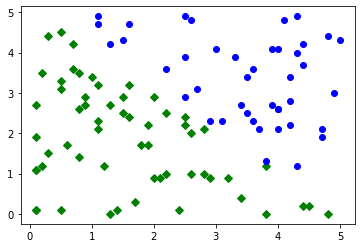

In [12]:
# 2- Tracer les données dans un graphe
def plotData(dataset):
     c0=dataset[:,2]==0
     c1=dataset[:,2]==1
     XD1=dataset[:,0][c0]
     YD1=dataset[:,1][c0]
     XD2=dataset[:,0][c1]
     YD2=dataset[:,1][c1]
     plt.plot(XD1,YD1, 'gD')
     plt.plot(XD2,YD2, 'bo')
    
plotData(dataset)

# L’objectif de cet exercice est de trouver la ligne qui sépare entre les deux classes

# Soit le programme #program2 en annexe,
# 1. Modifier le code source de manière à afficher les éléments suivants à chaque 10000 itérations

### a. Accuracy
### b. Loss value (binary_crossentropy)
### c. W, bias
### d. L’état du modèle (ligne séparatrice) sous format de graphe comme montré dans l’aperçu ci-dessous
### e. Mettre en évidence les enregistrements mal classés (surlignés en rouge)

In [13]:
# accuracy
def calcul_accuracy(y,y_pred):
    same=0
    all=len(y)
    for i,j in zip(y,y_pred):
        if i==j:
            same=same+1
    return same/all

In [14]:
# calculer la prediction :
def predict(bias,W,X):
    linear_model=np.dot(X,W)+bias
    y_predicted=sigmoid(linear_model)
    y_predicted_cls=[1 if i>0.5 else 0 for i in y_predicted]
    return y_predicted_cls

In [15]:
# le cas d'une seule itération
lr=0.001
n_iters=1

def fit(X,y):
    bias=0
    W=np.array([0.,0.])
    accuracy=[]
    n_samples,n_features=X.shape
    for i in range(n_iters):
        linear_model=np.dot(X,W)+bias
        y_predicted=sigmoid(linear_model)
        # accuracy
        accuracy=calcul_accuracy(y,predict(bias,W,X))
        # Loss value (binary_crossentropy)
        log_loss=(-1/n_samples)*np.sum(y*np.log(y_predicted)+(1-y)*np.log(1-y_predicted))
        dW=(1/n_samples)*np.dot(X.T,(y_predicted-y)) 
        dbias=(1/n_samples)*np.sum(y_predicted-y) 
        # W, bias
        W-=lr*dW #ligne12 
        bias-=lr*dbias #ligne13 
        
    return bias,W,log_loss,accuracy

In [16]:
bias,W,log_loss,accuracy=fit(X,y)
#log_loss,accuracy

Iteration :1, ( -8e-05 , [0.000265  0.0001785] )


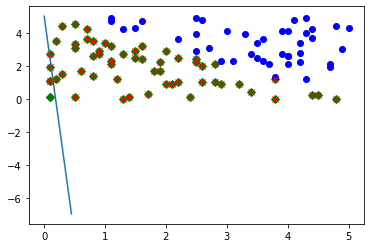

In [17]:
def g(bias,w1,w2,x):
     return (-bias/w2)-(w1/w2)*x
    
def plotData(dataset,W,bias):
     c0=dataset[:,2]==0
     c1=dataset[:,2]==1
     XD1=dataset[:,0][c0]
     YD1=dataset[:,1][c0]
     XD2=dataset[:,0][c1]
     YD2=dataset[:,1][c1]
     plt.plot(XD1,YD1, 'gD')
     plt.plot(XD2,YD2, 'bo')
     #L’état du modèle (ligne séparatrice) sous format de graphe comme montré dans l’aperçu ci-dessous
     w1=W[0]
     w2=W[1]
     plt.plot([0,g(bias,w1,w2,0)],[5,g(bias,w1,w2,5)])
     for i,j in zip(XD1,YD1):
            if g(bias,w1,w2,i) <= j:
                plt.plot(i,j,"rx")

plotData(dataset,W,bias)
print("Iteration :{}, (".format(n_iters),bias,",",W,")")

Iteration :10000, ( -1.2261241901700848 , [0.35899885 0.19449662] )


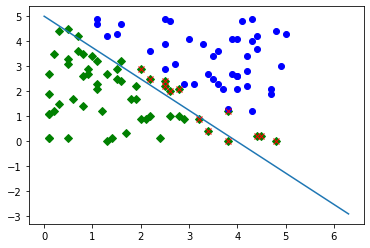

In [18]:
# 10000 itérations
lr=0.001
n_iters=10000

bias,W,log_loss,accuracy=fit(X,y)
plotData(dataset,W,bias)
n_iters,bias,W,log_loss,accuracy
print("Iteration :{}, (".format(n_iters),bias,",",W,")")

Iteration :70000, ( -4.7830902823782955 , [0.98832585 0.87716677] )


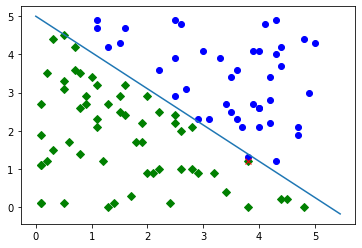

In [19]:
# 70000 itérations
lr=0.001
n_iters=70000

bias,W,log_loss,accuracy=fit(X,y)
plotData(dataset,W,bias)
n_iters,bias,W,log_loss,accuracy
print("Iteration :{}, (".format(n_iters),bias,",",W,")")

Iteration :90000, (-5.47461130707576, [1.11583232 1.01026215])


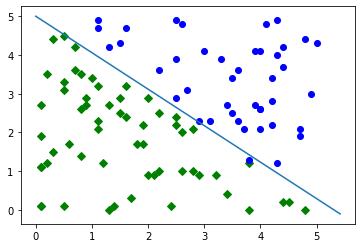

In [20]:
# 90000 itérations
lr=0.001
n_iters=90000

bias,W,log_loss,accuracy=fit(X,y)
plotData(dataset,W,bias)
n_iters,bias,W,log_loss,accuracy
print("Iteration :{}, ({}, {})".format(n_iters,bias,W))

# 2. Comparer le résultat trouvé avec celui trouvé en 2.7) de l’exercice 4 de l’atelier précédent

### On remarque que nous avons obtenu le meme résultat. 

In [21]:
# model
model=keras.Sequential([keras.layers.Dense(1,input_shape=(2,),activation='sigmoid', kernel_initializer='ones',bias_initializer='zeros')])

In [22]:
# utiliser la fonction d'apprentissage d'adam avec la fonction cout binary cross entropy et la precision
model.compile(optimizer='adam',loss='binary_crossentropy',metrics=['accuracy'])

In [23]:
# train the model
model.fit(X,y,epochs=90000)

Epoch 1/90000
4/4 [==============================] - 0s 10ms/step - loss: 2.0248 - accuracy: 0.4200
Epoch 2/90000
4/4 [==============================] - 0s 1ms/step - loss: 2.0154 - accuracy: 0.4200
Epoch 3/90000
4/4 [==============================] - 0s 2ms/step - loss: 2.0059 - accuracy: 0.4200
Epoch 4/90000
4/4 [==============================] - 0s 2ms/step - loss: 1.9974 - accuracy: 0.4200
Epoch 5/90000
4/4 [==============================] - 0s 1ms/step - loss: 1.9883 - accuracy: 0.4200
Epoch 6/90000
4/4 [==============================] - 0s 2ms/step - loss: 1.9797 - accuracy: 0.4200
Epoch 7/90000
4/4 [==============================] - 0s 998us/step - loss: 1.9704 - accuracy: 0.4200
Epoch 8/90000
4/4 [==============================] - 0s 2ms/step - loss: 1.9611 - accuracy: 0.4200
Epoch 9/90000
4/4 [==============================] - 0s 2ms/step - loss: 1.9519 - accuracy: 0.4200
Epoch 10/90000
4/4 [==============================] - 0s 1ms/step - loss: 1.9427 - accuracy: 0.4200
Epoch 

4/4 [==============================] - 0s 2ms/step - loss: 1.3071 - accuracy: 0.4400
Epoch 83/90000
4/4 [==============================] - 0s 1ms/step - loss: 1.2988 - accuracy: 0.4400
Epoch 84/90000
4/4 [==============================] - 0s 1ms/step - loss: 1.2911 - accuracy: 0.4400
Epoch 85/90000
4/4 [==============================] - 0s 2ms/step - loss: 1.2830 - accuracy: 0.4400
Epoch 86/90000
4/4 [==============================] - 0s 1ms/step - loss: 1.2751 - accuracy: 0.4400
Epoch 87/90000
4/4 [==============================] - 0s 1ms/step - loss: 1.2675 - accuracy: 0.4400
Epoch 88/90000
4/4 [==============================] - 0s 749us/step - loss: 1.2595 - accuracy: 0.4400
Epoch 89/90000
4/4 [==============================] - 0s 1ms/step - loss: 1.2519 - accuracy: 0.4400
Epoch 90/90000
4/4 [==============================] - 0s 1ms/step - loss: 1.2437 - accuracy: 0.4400
Epoch 91/90000
4/4 [==============================] - 0s 1ms/step - loss: 1.2357 - accuracy: 0.4400
Epoch 92/9000

4/4 [==============================] - 0s 1ms/step - loss: 0.7844 - accuracy: 0.4800
Epoch 164/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.7796 - accuracy: 0.4800
Epoch 165/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.7749 - accuracy: 0.4800
Epoch 166/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.7709 - accuracy: 0.4800
Epoch 167/90000
4/4 [==============================] - 0s 997us/step - loss: 0.7664 - accuracy: 0.4900
Epoch 168/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.7629 - accuracy: 0.4900
Epoch 169/90000
4/4 [==============================] - 0s 748us/step - loss: 0.7587 - accuracy: 0.4900
Epoch 170/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.7545 - accuracy: 0.4900
Epoch 171/90000
4/4 [==============================] - 0s 997us/step - loss: 0.7506 - accuracy: 0.4900
Epoch 172/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.7462 - accuracy: 0.4900


4/4 [==============================] - 0s 986us/step - loss: 0.5845 - accuracy: 0.5800
Epoch 243/90000
4/4 [==============================] - 0s 752us/step - loss: 0.5831 - accuracy: 0.5800
Epoch 244/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.5817 - accuracy: 0.5800
Epoch 245/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.5809 - accuracy: 0.5800
Epoch 246/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.5796 - accuracy: 0.5800
Epoch 247/90000
4/4 [==============================] - 0s 997us/step - loss: 0.5787 - accuracy: 0.5800
Epoch 248/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.5779 - accuracy: 0.5900
Epoch 249/90000
4/4 [==============================] - 0s 997us/step - loss: 0.5769 - accuracy: 0.5900
Epoch 250/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.5761 - accuracy: 0.5900
Epoch 251/90000
4/4 [==============================] - 0s 998us/step - loss: 0.5753 - accuracy: 0.5

4/4 [==============================] - 0s 998us/step - loss: 0.5489 - accuracy: 0.7600
Epoch 323/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.5486 - accuracy: 0.7700
Epoch 324/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.5484 - accuracy: 0.7700
Epoch 325/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.5483 - accuracy: 0.7700
Epoch 326/90000
4/4 [==============================] - 0s 997us/step - loss: 0.5481 - accuracy: 0.7700
Epoch 327/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.5479 - accuracy: 0.7700
Epoch 328/90000
4/4 [==============================] - 0s 754us/step - loss: 0.5477 - accuracy: 0.7700
Epoch 329/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.5475 - accuracy: 0.7700
Epoch 330/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.5472 - accuracy: 0.7800
Epoch 331/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.5471 - accuracy: 0.7900


4/4 [==============================] - 0s 998us/step - loss: 0.5342 - accuracy: 0.8500
Epoch 403/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.5340 - accuracy: 0.8500
Epoch 404/90000
4/4 [==============================] - 0s 997us/step - loss: 0.5338 - accuracy: 0.8500
Epoch 405/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.5336 - accuracy: 0.8600
Epoch 406/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.5335 - accuracy: 0.8700
Epoch 407/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.5333 - accuracy: 0.8700
Epoch 408/90000
4/4 [==============================] - 0s 997us/step - loss: 0.5331 - accuracy: 0.8700
Epoch 409/90000
4/4 [==============================] - 0s 997us/step - loss: 0.5329 - accuracy: 0.8800
Epoch 410/90000
4/4 [==============================] - 0s 999us/step - loss: 0.5328 - accuracy: 0.8800
Epoch 411/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.5326 - accuracy: 0.8

4/4 [==============================] - 0s 1ms/step - loss: 0.5197 - accuracy: 0.8700
Epoch 483/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.5195 - accuracy: 0.8700
Epoch 484/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.5193 - accuracy: 0.8700
Epoch 485/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.5191 - accuracy: 0.8700
Epoch 486/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.5189 - accuracy: 0.8700
Epoch 487/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.5187 - accuracy: 0.8700
Epoch 488/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.5185 - accuracy: 0.8700
Epoch 489/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.5184 - accuracy: 0.8700
Epoch 490/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.5182 - accuracy: 0.8700
Epoch 491/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.5180 - accuracy: 0.8700
Epoch 

4/4 [==============================] - 0s 2ms/step - loss: 0.5048 - accuracy: 0.9100
Epoch 563/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.5047 - accuracy: 0.9100
Epoch 564/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.5045 - accuracy: 0.9100
Epoch 565/90000
4/4 [==============================] - 0s 3ms/step - loss: 0.5043 - accuracy: 0.9100
Epoch 566/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.5042 - accuracy: 0.9100
Epoch 567/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.5039 - accuracy: 0.9100
Epoch 568/90000
4/4 [==============================] - 0s 997us/step - loss: 0.5037 - accuracy: 0.9100
Epoch 569/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.5035 - accuracy: 0.9100
Epoch 570/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.5034 - accuracy: 0.9100
Epoch 571/90000
4/4 [==============================] - 0s 998us/step - loss: 0.5032 - accuracy: 0.9100
Ep

4/4 [==============================] - 0s 997us/step - loss: 0.4898 - accuracy: 0.9200
Epoch 643/90000
4/4 [==============================] - 0s 997us/step - loss: 0.4896 - accuracy: 0.9200
Epoch 644/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.4894 - accuracy: 0.9300
Epoch 645/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.4892 - accuracy: 0.9200
Epoch 646/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.4890 - accuracy: 0.9200
Epoch 647/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.4888 - accuracy: 0.9200
Epoch 648/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.4886 - accuracy: 0.9200
Epoch 649/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.4884 - accuracy: 0.9100
Epoch 650/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.4882 - accuracy: 0.9100
Epoch 651/90000
4/4 [==============================] - 0s 997us/step - loss: 0.4880 - accuracy: 0.9100


4/4 [==============================] - 0s 1ms/step - loss: 0.4749 - accuracy: 0.9400
Epoch 723/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.4747 - accuracy: 0.9400
Epoch 724/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.4746 - accuracy: 0.9400
Epoch 725/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.4744 - accuracy: 0.9400
Epoch 726/90000
4/4 [==============================] - 0s 997us/step - loss: 0.4742 - accuracy: 0.9400
Epoch 727/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.4740 - accuracy: 0.9400
Epoch 728/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.4738 - accuracy: 0.9400
Epoch 729/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.4736 - accuracy: 0.9400
Epoch 730/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.4733 - accuracy: 0.9400
Epoch 731/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.4731 - accuracy: 0.9400
Epoc

4/4 [==============================] - 0s 1ms/step - loss: 0.4597 - accuracy: 0.9400
Epoch 803/90000
4/4 [==============================] - 0s 997us/step - loss: 0.4596 - accuracy: 0.9400
Epoch 804/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.4594 - accuracy: 0.9400
Epoch 805/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.4592 - accuracy: 0.9400
Epoch 806/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.4590 - accuracy: 0.9400
Epoch 807/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.4590 - accuracy: 0.9400
Epoch 808/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.4587 - accuracy: 0.9400
Epoch 809/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.4585 - accuracy: 0.9400
Epoch 810/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.4584 - accuracy: 0.9400
Epoch 811/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.4582 - accuracy: 0.9400
Epoc

4/4 [==============================] - 0s 2ms/step - loss: 0.4450 - accuracy: 0.9400
Epoch 883/90000
4/4 [==============================] - 0s 748us/step - loss: 0.4449 - accuracy: 0.9400
Epoch 884/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.4447 - accuracy: 0.9400
Epoch 885/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.4445 - accuracy: 0.9400
Epoch 886/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.4444 - accuracy: 0.9400
Epoch 887/90000
4/4 [==============================] - 0s 997us/step - loss: 0.4442 - accuracy: 0.9400
Epoch 888/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.4440 - accuracy: 0.9400
Epoch 889/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.4439 - accuracy: 0.9400
Epoch 890/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.4437 - accuracy: 0.9400
Epoch 891/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.4435 - accuracy: 0.9400
Ep

4/4 [==============================] - 0s 1ms/step - loss: 0.4310 - accuracy: 0.9400
Epoch 963/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.4308 - accuracy: 0.9400
Epoch 964/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.4306 - accuracy: 0.9500
Epoch 965/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.4304 - accuracy: 0.9500
Epoch 966/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.4303 - accuracy: 0.9500
Epoch 967/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.4301 - accuracy: 0.9500
Epoch 968/90000
4/4 [==============================] - 0s 748us/step - loss: 0.4300 - accuracy: 0.9500
Epoch 969/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.4298 - accuracy: 0.9500
Epoch 970/90000
4/4 [==============================] - 0s 997us/step - loss: 0.4296 - accuracy: 0.9500
Epoch 971/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.4294 - accuracy: 0.9500
Ep

4/4 [==============================] - 0s 1ms/step - loss: 0.4174 - accuracy: 0.9400
Epoch 1042/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.4172 - accuracy: 0.9400
Epoch 1043/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.4170 - accuracy: 0.9400
Epoch 1044/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.4169 - accuracy: 0.9400
Epoch 1045/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.4167 - accuracy: 0.9400
Epoch 1046/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.4166 - accuracy: 0.9400
Epoch 1047/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.4164 - accuracy: 0.9400
Epoch 1048/90000
4/4 [==============================] - 0s 997us/step - loss: 0.4162 - accuracy: 0.9400
Epoch 1049/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.4161 - accuracy: 0.9400
Epoch 1050/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.4159 - accuracy: 0.

4/4 [==============================] - 0s 1ms/step - loss: 0.4045 - accuracy: 0.9400
Epoch 1122/90000
4/4 [==============================] - 0s 998us/step - loss: 0.4043 - accuracy: 0.9400
Epoch 1123/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.4042 - accuracy: 0.9400
Epoch 1124/90000
4/4 [==============================] - 0s 998us/step - loss: 0.4040 - accuracy: 0.9400
Epoch 1125/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.4038 - accuracy: 0.9400
Epoch 1126/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.4037 - accuracy: 0.9400
Epoch 1127/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.4035 - accuracy: 0.9400
Epoch 1128/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.4033 - accuracy: 0.9400
Epoch 1129/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.4032 - accuracy: 0.9400
Epoch 1130/90000
4/4 [==============================] - 0s 997us/step - loss: 0.4030 - accuracy

4/4 [==============================] - 0s 1ms/step - loss: 0.3918 - accuracy: 0.9500
Epoch 1202/90000
4/4 [==============================] - 0s 995us/step - loss: 0.3916 - accuracy: 0.9500
Epoch 1203/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.3915 - accuracy: 0.9500
Epoch 1204/90000
4/4 [==============================] - 0s 997us/step - loss: 0.3913 - accuracy: 0.9500
Epoch 1205/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.3912 - accuracy: 0.9500
Epoch 1206/90000
4/4 [==============================] - 0s 748us/step - loss: 0.3910 - accuracy: 0.9500
Epoch 1207/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.3909 - accuracy: 0.9500
Epoch 1208/90000
4/4 [==============================] - 0s 997us/step - loss: 0.3908 - accuracy: 0.9500
Epoch 1209/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.3907 - accuracy: 0.9500
Epoch 1210/90000
4/4 [==============================] - 0s 997us/step - loss: 0.3905 - accu

4/4 [==============================] - 0s 1ms/step - loss: 0.3801 - accuracy: 0.9600
Epoch 1281/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.3801 - accuracy: 0.9600
Epoch 1282/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.3798 - accuracy: 0.9600
Epoch 1283/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.3797 - accuracy: 0.9600
Epoch 1284/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.3795 - accuracy: 0.9600
Epoch 1285/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.3794 - accuracy: 0.9600
Epoch 1286/90000
4/4 [==============================] - 0s 997us/step - loss: 0.3793 - accuracy: 0.9600
Epoch 1287/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.3791 - accuracy: 0.9600
Epoch 1288/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.3790 - accuracy: 0.9600
Epoch 1289/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.3788 - accuracy: 0.

4/4 [==============================] - 0s 1ms/step - loss: 0.3691 - accuracy: 0.9600
Epoch 1360/90000
4/4 [==============================] - 0s 998us/step - loss: 0.3689 - accuracy: 0.9600
Epoch 1361/90000
4/4 [==============================] - 0s 997us/step - loss: 0.3688 - accuracy: 0.9600
Epoch 1362/90000
4/4 [==============================] - 0s 997us/step - loss: 0.3686 - accuracy: 0.9600
Epoch 1363/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.3686 - accuracy: 0.9600
Epoch 1364/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.3684 - accuracy: 0.9600
Epoch 1365/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.3683 - accuracy: 0.9600
Epoch 1366/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.3681 - accuracy: 0.9600
Epoch 1367/90000
4/4 [==============================] - 0s 993us/step - loss: 0.3681 - accuracy: 0.9600
Epoch 1368/90000
4/4 [==============================] - 0s 998us/step - loss: 0.3679 - accu

4/4 [==============================] - 0s 998us/step - loss: 0.3587 - accuracy: 0.9600
Epoch 1439/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.3586 - accuracy: 0.9500
Epoch 1440/90000
4/4 [==============================] - 0s 995us/step - loss: 0.3586 - accuracy: 0.9500
Epoch 1441/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.3585 - accuracy: 0.9500
Epoch 1442/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.3584 - accuracy: 0.9500
Epoch 1443/90000
4/4 [==============================] - 0s 748us/step - loss: 0.3583 - accuracy: 0.9500
Epoch 1444/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.3582 - accuracy: 0.9500
Epoch 1445/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.3580 - accuracy: 0.9500
Epoch 1446/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.3578 - accuracy: 0.9500
Epoch 1447/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.3576 - accuracy

4/4 [==============================] - 0s 1ms/step - loss: 0.3489 - accuracy: 0.9700
Epoch 1518/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.3488 - accuracy: 0.9700
Epoch 1519/90000
4/4 [==============================] - 0s 997us/step - loss: 0.3488 - accuracy: 0.9700
Epoch 1520/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.3487 - accuracy: 0.9700
Epoch 1521/90000
4/4 [==============================] - 0s 753us/step - loss: 0.3485 - accuracy: 0.9700
Epoch 1522/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.3484 - accuracy: 0.9700
Epoch 1523/90000
4/4 [==============================] - 0s 748us/step - loss: 0.3483 - accuracy: 0.9700
Epoch 1524/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.3481 - accuracy: 0.9700
Epoch 1525/90000
4/4 [==============================] - 0s 997us/step - loss: 0.3480 - accuracy: 0.9700
Epoch 1526/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.3479 - accura

4/4 [==============================] - 0s 1ms/step - loss: 0.3399 - accuracy: 0.9800
Epoch 1597/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.3399 - accuracy: 0.9800
Epoch 1598/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.3398 - accuracy: 0.9800
Epoch 1599/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.3396 - accuracy: 0.9800
Epoch 1600/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.3396 - accuracy: 0.9800
Epoch 1601/90000
4/4 [==============================] - 0s 997us/step - loss: 0.3394 - accuracy: 0.9800
Epoch 1602/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.3393 - accuracy: 0.9800
Epoch 1603/90000
4/4 [==============================] - 0s 997us/step - loss: 0.3391 - accuracy: 0.9800
Epoch 1604/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.3391 - accuracy: 0.9800
Epoch 1605/90000
4/4 [==============================] - 0s 995us/step - loss: 0.3388 - accuracy

Epoch 1676/90000
4/4 [==============================] - 0s 998us/step - loss: 0.3309 - accuracy: 0.9700
Epoch 1677/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.3307 - accuracy: 0.9700
Epoch 1678/90000
4/4 [==============================] - 0s 997us/step - loss: 0.3306 - accuracy: 0.9700
Epoch 1679/90000
4/4 [==============================] - 0s 998us/step - loss: 0.3305 - accuracy: 0.9700
Epoch 1680/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.3304 - accuracy: 0.9700
Epoch 1681/90000
4/4 [==============================] - 0s 997us/step - loss: 0.3304 - accuracy: 0.9700
Epoch 1682/90000
4/4 [==============================] - 0s 997us/step - loss: 0.3303 - accuracy: 0.9700
Epoch 1683/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.3302 - accuracy: 0.9700
Epoch 1684/90000
4/4 [==============================] - 0s 997us/step - loss: 0.3302 - accuracy: 0.9700
Epoch 1685/90000
4/4 [==============================] - 0s 996us/step 

4/4 [==============================] - 0s 888us/step - loss: 0.3228 - accuracy: 0.9800
Epoch 1756/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.3227 - accuracy: 0.9800
Epoch 1757/90000
4/4 [==============================] - 0s 815us/step - loss: 0.3226 - accuracy: 0.9800
Epoch 1758/90000
4/4 [==============================] - 0s 772us/step - loss: 0.3225 - accuracy: 0.9800
Epoch 1759/90000
4/4 [==============================] - 0s 331us/step - loss: 0.3223 - accuracy: 0.9800
Epoch 1760/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.3222 - accuracy: 0.9800
Epoch 1761/90000
4/4 [==============================] - 0s 880us/step - loss: 0.3221 - accuracy: 0.9800
Epoch 1762/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.3220 - accuracy: 0.9800
Epoch 1763/90000
4/4 [==============================] - 0s 801us/step - loss: 0.3218 - accuracy: 0.9800
Epoch 1764/90000
4/4 [==============================] - 0s 820us/step - loss: 0.3217 - 

4/4 [==============================] - 0s 3ms/step - loss: 0.3148 - accuracy: 0.9800
Epoch 1835/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.3147 - accuracy: 0.9800
Epoch 1836/90000
4/4 [==============================] - 0s 892us/step - loss: 0.3146 - accuracy: 0.9800
Epoch 1837/90000
4/4 [==============================] - 0s 801us/step - loss: 0.3145 - accuracy: 0.9800
Epoch 1838/90000
4/4 [==============================] - 0s 784us/step - loss: 0.3145 - accuracy: 0.9800
Epoch 1839/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.3144 - accuracy: 0.9800
Epoch 1840/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.3143 - accuracy: 0.9800
Epoch 1841/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.3142 - accuracy: 0.9800
Epoch 1842/90000
4/4 [==============================] - 0s 748us/step - loss: 0.3141 - accuracy: 0.9800
Epoch 1843/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.3140 - accura

4/4 [==============================] - 0s 1ms/step - loss: 0.3076 - accuracy: 0.9800
Epoch 1914/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.3075 - accuracy: 0.9800
Epoch 1915/90000
4/4 [==============================] - 0s 748us/step - loss: 0.3074 - accuracy: 0.9800
Epoch 1916/90000
4/4 [==============================] - 0s 997us/step - loss: 0.3073 - accuracy: 0.9800
Epoch 1917/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.3072 - accuracy: 0.9800
Epoch 1918/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.3071 - accuracy: 0.9800
Epoch 1919/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.3070 - accuracy: 0.9800
Epoch 1920/90000
4/4 [==============================] - 0s 998us/step - loss: 0.3069 - accuracy: 0.9800
Epoch 1921/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.3068 - accuracy: 0.9800
Epoch 1922/90000
4/4 [==============================] - 0s 998us/step - loss: 0.3067 - accura

4/4 [==============================] - 0s 1ms/step - loss: 0.3006 - accuracy: 0.9800
Epoch 1993/90000
4/4 [==============================] - 0s 997us/step - loss: 0.3005 - accuracy: 0.9800
Epoch 1994/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.3004 - accuracy: 0.9800
Epoch 1995/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.3003 - accuracy: 0.9800
Epoch 1996/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.3002 - accuracy: 0.9800
Epoch 1997/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.3001 - accuracy: 0.9800
Epoch 1998/90000
4/4 [==============================] - 0s 997us/step - loss: 0.3001 - accuracy: 0.9800
Epoch 1999/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.3000 - accuracy: 0.9800
Epoch 2000/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.2999 - accuracy: 0.9800
Epoch 2001/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.2998 - accuracy: 

4/4 [==============================] - 0s 2ms/step - loss: 0.2939 - accuracy: 0.9800
Epoch 2072/90000
4/4 [==============================] - 0s 998us/step - loss: 0.2939 - accuracy: 0.9800
Epoch 2073/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.2938 - accuracy: 0.9800
Epoch 2074/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.2937 - accuracy: 0.9800
Epoch 2075/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.2936 - accuracy: 0.9800
Epoch 2076/90000
4/4 [==============================] - 0s 997us/step - loss: 0.2935 - accuracy: 0.9800
Epoch 2077/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.2934 - accuracy: 0.9800
Epoch 2078/90000
4/4 [==============================] - 0s 997us/step - loss: 0.2934 - accuracy: 0.9800
Epoch 2079/90000
4/4 [==============================] - 0s 998us/step - loss: 0.2933 - accuracy: 0.9800
Epoch 2080/90000
4/4 [==============================] - 0s 997us/step - loss: 0.2932 - accu

4/4 [==============================] - 0s 997us/step - loss: 0.2877 - accuracy: 0.9800
Epoch 2151/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.2876 - accuracy: 0.9800
Epoch 2152/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.2875 - accuracy: 0.9800
Epoch 2153/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.2874 - accuracy: 0.9800
Epoch 2154/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.2873 - accuracy: 0.9800
Epoch 2155/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.2872 - accuracy: 0.9800
Epoch 2156/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.2871 - accuracy: 0.9800
Epoch 2157/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.2870 - accuracy: 0.9800
Epoch 2158/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.2870 - accuracy: 0.9800
Epoch 2159/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.2869 - accuracy: 0.

4/4 [==============================] - 0s 1ms/step - loss: 0.2814 - accuracy: 0.9900
Epoch 2231/90000
4/4 [==============================] - 0s 997us/step - loss: 0.2813 - accuracy: 0.9900
Epoch 2232/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.2813 - accuracy: 0.9900
Epoch 2233/90000
4/4 [==============================] - 0s 997us/step - loss: 0.2812 - accuracy: 0.9900
Epoch 2234/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.2811 - accuracy: 0.9900
Epoch 2235/90000
4/4 [==============================] - 0s 1000us/step - loss: 0.2810 - accuracy: 0.9900
Epoch 2236/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.2809 - accuracy: 0.9900
Epoch 2237/90000
4/4 [==============================] - 0s 997us/step - loss: 0.2809 - accuracy: 0.9900
Epoch 2238/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.2808 - accuracy: 0.9900
Epoch 2239/90000
4/4 [==============================] - 0s 997us/step - loss: 0.2807 - acc

4/4 [==============================] - 0s 997us/step - loss: 0.2756 - accuracy: 1.0000
Epoch 2310/90000
4/4 [==============================] - 0s 748us/step - loss: 0.2756 - accuracy: 1.0000
Epoch 2311/90000
4/4 [==============================] - 0s 912us/step - loss: 0.2755 - accuracy: 1.0000
Epoch 2312/90000
4/4 [==============================] - 0s 772us/step - loss: 0.2754 - accuracy: 1.0000
Epoch 2313/90000
4/4 [==============================] - 0s 999us/step - loss: 0.2754 - accuracy: 1.0000
Epoch 2314/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.2754 - accuracy: 1.0000
Epoch 2315/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.2753 - accuracy: 1.0000
Epoch 2316/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.2752 - accuracy: 1.0000
Epoch 2317/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.2752 - accuracy: 1.0000
Epoch 2318/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.2751 - accu

4/4 [==============================] - 0s 997us/step - loss: 0.2700 - accuracy: 1.0000
Epoch 2389/90000
4/4 [==============================] - 0s 748us/step - loss: 0.2699 - accuracy: 1.0000
Epoch 2390/90000
4/4 [==============================] - 0s 998us/step - loss: 0.2698 - accuracy: 1.0000
Epoch 2391/90000
4/4 [==============================] - 0s 997us/step - loss: 0.2699 - accuracy: 1.0000
Epoch 2392/90000
4/4 [==============================] - 0s 997us/step - loss: 0.2697 - accuracy: 1.0000
Epoch 2393/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.2697 - accuracy: 1.0000
Epoch 2394/90000
4/4 [==============================] - 0s 998us/step - loss: 0.2696 - accuracy: 1.0000
Epoch 2395/90000
4/4 [==============================] - 0s 997us/step - loss: 0.2695 - accuracy: 1.0000
Epoch 2396/90000
4/4 [==============================] - 0s 997us/step - loss: 0.2694 - accuracy: 1.0000
Epoch 2397/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.2693 

4/4 [==============================] - 0s 1ms/step - loss: 0.2646 - accuracy: 1.0000
Epoch 2468/90000
4/4 [==============================] - 0s 995us/step - loss: 0.2645 - accuracy: 1.0000
Epoch 2469/90000
4/4 [==============================] - 0s 748us/step - loss: 0.2645 - accuracy: 1.0000
Epoch 2470/90000
4/4 [==============================] - 0s 745us/step - loss: 0.2644 - accuracy: 1.0000
Epoch 2471/90000
4/4 [==============================] - 0s 998us/step - loss: 0.2643 - accuracy: 1.0000
Epoch 2472/90000
4/4 [==============================] - 0s 953us/step - loss: 0.2643 - accuracy: 1.0000
Epoch 2473/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.2642 - accuracy: 1.0000
Epoch 2474/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.2642 - accuracy: 1.0000
Epoch 2475/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.2641 - accuracy: 1.0000
Epoch 2476/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.2640 - accu

4/4 [==============================] - 0s 748us/step - loss: 0.2596 - accuracy: 1.0000
Epoch 2547/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.2596 - accuracy: 1.0000
Epoch 2548/90000
4/4 [==============================] - 0s 748us/step - loss: 0.2595 - accuracy: 1.0000
Epoch 2549/90000
4/4 [==============================] - 0s 997us/step - loss: 0.2594 - accuracy: 1.0000
Epoch 2550/90000
4/4 [==============================] - 0s 997us/step - loss: 0.2594 - accuracy: 1.0000
Epoch 2551/90000
4/4 [==============================] - 0s 748us/step - loss: 0.2593 - accuracy: 1.0000
Epoch 2552/90000
4/4 [==============================] - 0s 997us/step - loss: 0.2592 - accuracy: 1.0000
Epoch 2553/90000
4/4 [==============================] - 0s 997us/step - loss: 0.2591 - accuracy: 1.0000
Epoch 2554/90000
4/4 [==============================] - 0s 997us/step - loss: 0.2590 - accuracy: 1.0000
Epoch 2555/90000
4/4 [==============================] - 0s 997us/step - loss: 0.259

4/4 [==============================] - 0s 1ms/step - loss: 0.2546 - accuracy: 1.0000
Epoch 2626/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.2546 - accuracy: 1.0000
Epoch 2627/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.2546 - accuracy: 1.0000
Epoch 2628/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.2545 - accuracy: 1.0000
Epoch 2629/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.2545 - accuracy: 1.0000
Epoch 2630/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.2544 - accuracy: 1.0000
Epoch 2631/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.2544 - accuracy: 1.0000
Epoch 2632/90000
4/4 [==============================] - 0s 920us/step - loss: 0.2543 - accuracy: 1.0000
Epoch 2633/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.2543 - accuracy: 1.0000
Epoch 2634/90000
4/4 [==============================] - 0s 997us/step - loss: 0.2543 - accuracy: 

4/4 [==============================] - 0s 2ms/step - loss: 0.2500 - accuracy: 1.0000
Epoch 2706/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.2499 - accuracy: 1.0000
Epoch 2707/90000
4/4 [==============================] - 0s 922us/step - loss: 0.2499 - accuracy: 1.0000
Epoch 2708/90000
4/4 [==============================] - 0s 779us/step - loss: 0.2498 - accuracy: 1.0000
Epoch 2709/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.2498 - accuracy: 1.0000
Epoch 2710/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.2497 - accuracy: 1.0000
Epoch 2711/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.2496 - accuracy: 1.0000
Epoch 2712/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.2496 - accuracy: 1.0000
Epoch 2713/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.2495 - accuracy: 1.0000
Epoch 2714/90000
4/4 [==============================] - 0s 871us/step - loss: 0.2495 - accuracy

4/4 [==============================] - 0s 998us/step - loss: 0.2456 - accuracy: 1.0000
Epoch 2786/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.2455 - accuracy: 1.0000
Epoch 2787/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.2455 - accuracy: 1.0000
Epoch 2788/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.2454 - accuracy: 1.0000
Epoch 2789/90000
4/4 [==============================] - 0s 826us/step - loss: 0.2454 - accuracy: 1.0000
Epoch 2790/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.2453 - accuracy: 1.0000
Epoch 2791/90000
4/4 [==============================] - 0s 875us/step - loss: 0.2453 - accuracy: 1.0000
Epoch 2792/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.2453 - accuracy: 1.0000
Epoch 2793/90000
4/4 [==============================] - 0s 918us/step - loss: 0.2452 - accuracy: 1.0000
Epoch 2794/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.2452 - accura

4/4 [==============================] - 0s 2ms/step - loss: 0.2414 - accuracy: 1.0000
Epoch 2866/90000
4/4 [==============================] - 0s 991us/step - loss: 0.2414 - accuracy: 1.0000
Epoch 2867/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.2413 - accuracy: 1.0000
Epoch 2868/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.2412 - accuracy: 1.0000
Epoch 2869/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.2412 - accuracy: 1.0000
Epoch 2870/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.2411 - accuracy: 1.0000
Epoch 2871/90000
4/4 [==============================] - 0s 898us/step - loss: 0.2411 - accuracy: 1.0000
Epoch 2872/90000
4/4 [==============================] - 0s 947us/step - loss: 0.2410 - accuracy: 1.0000
Epoch 2873/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.2410 - accuracy: 1.0000
Epoch 2874/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.2409 - accuracy

4/4 [==============================] - 0s 2ms/step - loss: 0.2373 - accuracy: 1.0000
Epoch 2946/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.2373 - accuracy: 1.0000
Epoch 2947/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.2373 - accuracy: 1.0000
Epoch 2948/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.2372 - accuracy: 1.0000
Epoch 2949/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.2371 - accuracy: 1.0000
Epoch 2950/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.2371 - accuracy: 1.0000
Epoch 2951/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.2370 - accuracy: 1.0000
Epoch 2952/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.2370 - accuracy: 1.0000
Epoch 2953/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.2370 - accuracy: 1.0000
Epoch 2954/90000
4/4 [==============================] - 0s 862us/step - loss: 0.2369 - accuracy: 1.

4/4 [==============================] - 0s 997us/step - loss: 0.2334 - accuracy: 1.0000
Epoch 3026/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.2334 - accuracy: 1.0000
Epoch 3027/90000
4/4 [==============================] - 0s 748us/step - loss: 0.2333 - accuracy: 1.0000
Epoch 3028/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.2333 - accuracy: 1.0000
Epoch 3029/90000
4/4 [==============================] - 0s 997us/step - loss: 0.2332 - accuracy: 1.0000
Epoch 3030/90000
4/4 [==============================] - 0s 997us/step - loss: 0.2332 - accuracy: 1.0000
Epoch 3031/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.2333 - accuracy: 1.0000
Epoch 3032/90000
4/4 [==============================] - 0s 838us/step - loss: 0.2332 - accuracy: 1.0000
Epoch 3033/90000
4/4 [==============================] - 0s 915us/step - loss: 0.2332 - accuracy: 1.0000
Epoch 3034/90000
4/4 [==============================] - 0s 973us/step - loss: 0.2331 - 

4/4 [==============================] - 0s 2ms/step - loss: 0.2298 - accuracy: 1.0000
Epoch 3106/90000
4/4 [==============================] - 0s 938us/step - loss: 0.2298 - accuracy: 1.0000
Epoch 3107/90000
4/4 [==============================] - 0s 948us/step - loss: 0.2297 - accuracy: 1.0000
Epoch 3108/90000
4/4 [==============================] - 0s 889us/step - loss: 0.2298 - accuracy: 1.0000
Epoch 3109/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.2297 - accuracy: 1.0000
Epoch 3110/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.2296 - accuracy: 1.0000
Epoch 3111/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.2296 - accuracy: 1.0000
Epoch 3112/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.2295 - accuracy: 1.0000
Epoch 3113/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.2295 - accuracy: 1.0000
Epoch 3114/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.2295 - accuracy

4/4 [==============================] - 0s 1ms/step - loss: 0.2262 - accuracy: 1.0000
Epoch 3186/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.2261 - accuracy: 1.0000
Epoch 3187/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.2261 - accuracy: 1.0000
Epoch 3188/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.2261 - accuracy: 1.0000
Epoch 3189/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.2260 - accuracy: 1.0000
Epoch 3190/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.2260 - accuracy: 1.0000
Epoch 3191/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.2259 - accuracy: 1.0000
Epoch 3192/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.2259 - accuracy: 1.0000
Epoch 3193/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.2259 - accuracy: 1.0000
Epoch 3194/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.2258 - accuracy: 1.00

4/4 [==============================] - 0s 1ms/step - loss: 0.2228 - accuracy: 1.0000
Epoch 3266/90000
4/4 [==============================] - 0s 870us/step - loss: 0.2229 - accuracy: 1.0000
Epoch 3267/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.2228 - accuracy: 1.0000
Epoch 3268/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.2228 - accuracy: 1.0000
Epoch 3269/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.2227 - accuracy: 1.0000
Epoch 3270/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.2227 - accuracy: 1.0000
Epoch 3271/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.2226 - accuracy: 1.0000
Epoch 3272/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.2226 - accuracy: 1.0000
Epoch 3273/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.2225 - accuracy: 1.0000
Epoch 3274/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.2225 - accuracy: 1.

4/4 [==============================] - 0s 1ms/step - loss: 0.2195 - accuracy: 0.9900
Epoch 3346/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.2195 - accuracy: 0.9900
Epoch 3347/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.2194 - accuracy: 0.9900
Epoch 3348/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.2194 - accuracy: 0.9900
Epoch 3349/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.2194 - accuracy: 0.9900
Epoch 3350/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.2194 - accuracy: 0.9900
Epoch 3351/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.2193 - accuracy: 0.9900
Epoch 3352/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.2192 - accuracy: 0.9900
Epoch 3353/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.2192 - accuracy: 0.9900
Epoch 3354/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.2192 - accuracy: 0.99

4/4 [==============================] - 0s 1ms/step - loss: 0.2163 - accuracy: 1.0000
Epoch 3426/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.2163 - accuracy: 1.0000
Epoch 3427/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.2163 - accuracy: 1.0000
Epoch 3428/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.2162 - accuracy: 1.0000
Epoch 3429/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.2162 - accuracy: 1.0000
Epoch 3430/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.2161 - accuracy: 1.0000
Epoch 3431/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.2161 - accuracy: 1.0000
Epoch 3432/90000
4/4 [==============================] - 0s 825us/step - loss: 0.2161 - accuracy: 1.0000
Epoch 3433/90000
4/4 [==============================] - 0s 957us/step - loss: 0.2160 - accuracy: 1.0000
Epoch 3434/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.2160 - accuracy: 

4/4 [==============================] - 0s 2ms/step - loss: 0.2133 - accuracy: 0.9900
Epoch 3506/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.2133 - accuracy: 0.9900
Epoch 3507/90000
4/4 [==============================] - 0s 878us/step - loss: 0.2132 - accuracy: 0.9900
Epoch 3508/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.2132 - accuracy: 0.9900
Epoch 3509/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.2132 - accuracy: 0.9900
Epoch 3510/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.2131 - accuracy: 0.9900
Epoch 3511/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.2130 - accuracy: 0.9900
Epoch 3512/90000
4/4 [==============================] - 0s 811us/step - loss: 0.2130 - accuracy: 0.9900
Epoch 3513/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.2130 - accuracy: 0.9900
Epoch 3514/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.2130 - accuracy: 

Epoch 3585/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.2104 - accuracy: 1.0000
Epoch 3586/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.2104 - accuracy: 1.0000
Epoch 3587/90000
4/4 [==============================] - 0s 790us/step - loss: 0.2104 - accuracy: 1.0000
Epoch 3588/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.2103 - accuracy: 1.0000
Epoch 3589/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.2102 - accuracy: 1.0000
Epoch 3590/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.2102 - accuracy: 1.0000
Epoch 3591/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.2102 - accuracy: 1.0000
Epoch 3592/90000
4/4 [==============================] - 0s 793us/step - loss: 0.2101 - accuracy: 1.0000
Epoch 3593/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.2101 - accuracy: 1.0000
Epoch 3594/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.

Epoch 3665/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.2075 - accuracy: 1.0000
Epoch 3666/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.2075 - accuracy: 1.0000
Epoch 3667/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.2074 - accuracy: 1.0000
Epoch 3668/90000
4/4 [==============================] - 0s 748us/step - loss: 0.2074 - accuracy: 1.0000
Epoch 3669/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.2074 - accuracy: 1.0000
Epoch 3670/90000
4/4 [==============================] - 0s 997us/step - loss: 0.2073 - accuracy: 0.9900
Epoch 3671/90000
4/4 [==============================] - 0s 748us/step - loss: 0.2073 - accuracy: 0.9900
Epoch 3672/90000
4/4 [==============================] - 0s 748us/step - loss: 0.2072 - accuracy: 0.9900
Epoch 3673/90000
4/4 [==============================] - 0s 997us/step - loss: 0.2072 - accuracy: 0.9900
Epoch 3674/90000
4/4 [==============================] - 0s 1ms/step - lo

4/4 [==============================] - 0s 2ms/step - loss: 0.2049 - accuracy: 0.9900
Epoch 3745/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.2049 - accuracy: 0.9900
Epoch 3746/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.2048 - accuracy: 0.9900
Epoch 3747/90000
4/4 [==============================] - 0s 997us/step - loss: 0.2048 - accuracy: 0.9900
Epoch 3748/90000
4/4 [==============================] - 0s 998us/step - loss: 0.2047 - accuracy: 0.9900
Epoch 3749/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.2047 - accuracy: 0.9900
Epoch 3750/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.2047 - accuracy: 0.9900
Epoch 3751/90000
4/4 [==============================] - 0s 998us/step - loss: 0.2046 - accuracy: 0.9900
Epoch 3752/90000
4/4 [==============================] - 0s 748us/step - loss: 0.2046 - accuracy: 0.9900
Epoch 3753/90000
4/4 [==============================] - 0s 997us/step - loss: 0.2045 - accu

4/4 [==============================] - 0s 1ms/step - loss: 0.2022 - accuracy: 0.9900
Epoch 3825/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.2022 - accuracy: 0.9900
Epoch 3826/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.2021 - accuracy: 0.9900
Epoch 3827/90000
4/4 [==============================] - 0s 748us/step - loss: 0.2021 - accuracy: 0.9900
Epoch 3828/90000
4/4 [==============================] - 0s 998us/step - loss: 0.2020 - accuracy: 0.9900
Epoch 3829/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.2020 - accuracy: 0.9900
Epoch 3830/90000
4/4 [==============================] - 0s 997us/step - loss: 0.2020 - accuracy: 0.9900
Epoch 3831/90000
4/4 [==============================] - 0s 998us/step - loss: 0.2020 - accuracy: 1.0000
Epoch 3832/90000
4/4 [==============================] - 0s 997us/step - loss: 0.2020 - accuracy: 1.0000
Epoch 3833/90000
4/4 [==============================] - 0s 997us/step - loss: 0.2019 - ac

4/4 [==============================] - 0s 2ms/step - loss: 0.1999 - accuracy: 1.0000
Epoch 3905/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.1999 - accuracy: 1.0000
Epoch 3906/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.1999 - accuracy: 1.0000
Epoch 3907/90000
4/4 [==============================] - 0s 998us/step - loss: 0.1999 - accuracy: 1.0000
Epoch 3908/90000
4/4 [==============================] - 0s 997us/step - loss: 0.1999 - accuracy: 1.0000
Epoch 3909/90000
4/4 [==============================] - 0s 997us/step - loss: 0.1998 - accuracy: 1.0000
Epoch 3910/90000
4/4 [==============================] - 0s 999us/step - loss: 0.1998 - accuracy: 1.0000
Epoch 3911/90000
4/4 [==============================] - 0s 997us/step - loss: 0.1997 - accuracy: 1.0000
Epoch 3912/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.1996 - accuracy: 1.0000
Epoch 3913/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.1996 - accu

4/4 [==============================] - 0s 1ms/step - loss: 0.1972 - accuracy: 0.9900
Epoch 3985/90000
4/4 [==============================] - 0s 748us/step - loss: 0.1972 - accuracy: 0.9900
Epoch 3986/90000
4/4 [==============================] - 0s 997us/step - loss: 0.1971 - accuracy: 0.9900
Epoch 3987/90000
4/4 [==============================] - 0s 997us/step - loss: 0.1971 - accuracy: 0.9900
Epoch 3988/90000
4/4 [==============================] - 0s 997us/step - loss: 0.1971 - accuracy: 0.9900
Epoch 3989/90000
4/4 [==============================] - 0s 748us/step - loss: 0.1971 - accuracy: 0.9900
Epoch 3990/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.1970 - accuracy: 0.9900
Epoch 3991/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.1970 - accuracy: 0.9900
Epoch 3992/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.1970 - accuracy: 0.9900
Epoch 3993/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.1970 - accu

4/4 [==============================] - 0s 1ms/step - loss: 0.1949 - accuracy: 0.9900
Epoch 4065/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.1948 - accuracy: 0.9900
Epoch 4066/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.1948 - accuracy: 0.9900
Epoch 4067/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.1947 - accuracy: 0.9900
Epoch 4068/90000
4/4 [==============================] - 0s 997us/step - loss: 0.1948 - accuracy: 0.9900
Epoch 4069/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.1947 - accuracy: 0.9900
Epoch 4070/90000
4/4 [==============================] - 0s 999us/step - loss: 0.1947 - accuracy: 0.9900
Epoch 4071/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.1946 - accuracy: 0.9900
Epoch 4072/90000
4/4 [==============================] - 0s 748us/step - loss: 0.1946 - accuracy: 0.9900
Epoch 4073/90000
4/4 [==============================] - 0s 997us/step - loss: 0.1946 - accura

4/4 [==============================] - 0s 997us/step - loss: 0.1927 - accuracy: 0.9900
Epoch 4144/90000
4/4 [==============================] - 0s 997us/step - loss: 0.1927 - accuracy: 0.9900
Epoch 4145/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.1926 - accuracy: 0.9900
Epoch 4146/90000
4/4 [==============================] - 0s 997us/step - loss: 0.1925 - accuracy: 0.9900
Epoch 4147/90000
4/4 [==============================] - 0s 748us/step - loss: 0.1925 - accuracy: 0.9900
Epoch 4148/90000
4/4 [==============================] - 0s 998us/step - loss: 0.1925 - accuracy: 0.9900
Epoch 4149/90000
4/4 [==============================] - 0s 748us/step - loss: 0.1924 - accuracy: 0.9900
Epoch 4150/90000
4/4 [==============================] - 0s 997us/step - loss: 0.1924 - accuracy: 0.9900
Epoch 4151/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.1924 - accuracy: 0.9900
Epoch 4152/90000
4/4 [==============================] - 0s 997us/step - loss: 0.1923 

4/4 [==============================] - 0s 997us/step - loss: 0.1904 - accuracy: 1.0000
Epoch 4223/90000
4/4 [==============================] - 0s 997us/step - loss: 0.1904 - accuracy: 1.0000
Epoch 4224/90000
4/4 [==============================] - 0s 748us/step - loss: 0.1904 - accuracy: 1.0000
Epoch 4225/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.1903 - accuracy: 1.0000
Epoch 4226/90000
4/4 [==============================] - 0s 748us/step - loss: 0.1903 - accuracy: 1.0000
Epoch 4227/90000
4/4 [==============================] - 0s 998us/step - loss: 0.1903 - accuracy: 0.9900
Epoch 4228/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.1903 - accuracy: 0.9900
Epoch 4229/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.1902 - accuracy: 0.9900
Epoch 4230/90000
4/4 [==============================] - 0s 876us/step - loss: 0.1902 - accuracy: 0.9900
Epoch 4231/90000
4/4 [==============================] - 0s 748us/step - loss: 0.1902 - 

4/4 [==============================] - 0s 998us/step - loss: 0.1883 - accuracy: 1.0000
Epoch 4302/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.1883 - accuracy: 1.0000
Epoch 4303/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.1883 - accuracy: 1.0000
Epoch 4304/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.1883 - accuracy: 1.0000
Epoch 4305/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.1882 - accuracy: 1.0000
Epoch 4306/90000
4/4 [==============================] - 0s 997us/step - loss: 0.1882 - accuracy: 1.0000
Epoch 4307/90000
4/4 [==============================] - 0s 997us/step - loss: 0.1882 - accuracy: 1.0000
Epoch 4308/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.1881 - accuracy: 1.0000
Epoch 4309/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.1881 - accuracy: 1.0000
Epoch 4310/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.1881 - accuracy

4/4 [==============================] - 0s 998us/step - loss: 0.1862 - accuracy: 0.9900
Epoch 4382/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.1861 - accuracy: 0.9900
Epoch 4383/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.1861 - accuracy: 0.9900
Epoch 4384/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.1861 - accuracy: 0.9900
Epoch 4385/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.1861 - accuracy: 0.9900
Epoch 4386/90000
4/4 [==============================] - 0s 997us/step - loss: 0.1860 - accuracy: 0.9900
Epoch 4387/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.1861 - accuracy: 0.9900
Epoch 4388/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.1860 - accuracy: 0.9900
Epoch 4389/90000
4/4 [==============================] - 0s 748us/step - loss: 0.1860 - accuracy: 0.9900
Epoch 4390/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.1860 - accuracy

4/4 [==============================] - 0s 1ms/step - loss: 0.1842 - accuracy: 0.9900
Epoch 4462/90000
4/4 [==============================] - 0s 997us/step - loss: 0.1842 - accuracy: 0.9900
Epoch 4463/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.1842 - accuracy: 0.9800
Epoch 4464/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.1841 - accuracy: 0.9900
Epoch 4465/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.1841 - accuracy: 0.9900
Epoch 4466/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.1840 - accuracy: 0.9900
Epoch 4467/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.1840 - accuracy: 0.9900
Epoch 4468/90000
4/4 [==============================] - 0s 997us/step - loss: 0.1840 - accuracy: 0.9800
Epoch 4469/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.1840 - accuracy: 0.9800
Epoch 4470/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.1840 - accuracy: 

4/4 [==============================] - 0s 748us/step - loss: 0.1821 - accuracy: 0.9900
Epoch 4541/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.1821 - accuracy: 0.9900
Epoch 4542/90000
4/4 [==============================] - 0s 997us/step - loss: 0.1821 - accuracy: 1.0000
Epoch 4543/90000
4/4 [==============================] - 0s 998us/step - loss: 0.1821 - accuracy: 1.0000
Epoch 4544/90000
4/4 [==============================] - 0s 748us/step - loss: 0.1821 - accuracy: 1.0000
Epoch 4545/90000
4/4 [==============================] - 0s 997us/step - loss: 0.1821 - accuracy: 1.0000
Epoch 4546/90000
4/4 [==============================] - 0s 941us/step - loss: 0.1821 - accuracy: 1.0000
Epoch 4547/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.1820 - accuracy: 1.0000
Epoch 4548/90000
4/4 [==============================] - 0s 970us/step - loss: 0.1820 - accuracy: 1.0000
Epoch 4549/90000
4/4 [==============================] - 0s 911us/step - loss: 0.1820 

4/4 [==============================] - 0s 1ms/step - loss: 0.1803 - accuracy: 0.9900
Epoch 4620/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.1803 - accuracy: 0.9900
Epoch 4621/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.1802 - accuracy: 0.9900
Epoch 4622/90000
4/4 [==============================] - 0s 998us/step - loss: 0.1802 - accuracy: 0.9900
Epoch 4623/90000
4/4 [==============================] - 0s 998us/step - loss: 0.1802 - accuracy: 0.9900
Epoch 4624/90000
4/4 [==============================] - 0s 997us/step - loss: 0.1802 - accuracy: 0.9900
Epoch 4625/90000
4/4 [==============================] - 0s 998us/step - loss: 0.1801 - accuracy: 0.9900
Epoch 4626/90000
4/4 [==============================] - 0s 997us/step - loss: 0.1802 - accuracy: 0.9900
Epoch 4627/90000
4/4 [==============================] - 0s 880us/step - loss: 0.1801 - accuracy: 0.9900
Epoch 4628/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.1801 - ac

Epoch 4699/90000
4/4 [==============================] - 0s 998us/step - loss: 0.1785 - accuracy: 0.9800
Epoch 4700/90000
4/4 [==============================] - 0s 702us/step - loss: 0.1784 - accuracy: 0.9800
Epoch 4701/90000
4/4 [==============================] - 0s 885us/step - loss: 0.1784 - accuracy: 0.9800
Epoch 4702/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.1784 - accuracy: 0.9900
Epoch 4703/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.1783 - accuracy: 0.9900
Epoch 4704/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.1783 - accuracy: 0.9900
Epoch 4705/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.1783 - accuracy: 0.9900
Epoch 4706/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.1782 - accuracy: 0.9900
Epoch 4707/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.1782 - accuracy: 0.9900
Epoch 4708/90000
4/4 [==============================] - 0s 2ms/step - loss: 

Epoch 4779/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.1766 - accuracy: 0.9800
Epoch 4780/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.1766 - accuracy: 0.9800
Epoch 4781/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.1766 - accuracy: 0.9800
Epoch 4782/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.1765 - accuracy: 0.9900
Epoch 4783/90000
4/4 [==============================] - 0s 1000us/step - loss: 0.1765 - accuracy: 0.9900
Epoch 4784/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.1764 - accuracy: 0.9900
Epoch 4785/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.1764 - accuracy: 0.9900
Epoch 4786/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.1764 - accuracy: 0.9900
Epoch 4787/90000
4/4 [==============================] - 0s 998us/step - loss: 0.1764 - accuracy: 0.9900
Epoch 4788/90000
4/4 [==============================] - 0s 748us/step - loss:

4/4 [==============================] - 0s 1ms/step - loss: 0.1749 - accuracy: 0.9900
Epoch 4859/90000
4/4 [==============================] - 0s 997us/step - loss: 0.1748 - accuracy: 0.9900
Epoch 4860/90000
4/4 [==============================] - 0s 997us/step - loss: 0.1748 - accuracy: 0.9900
Epoch 4861/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.1748 - accuracy: 0.9900
Epoch 4862/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.1747 - accuracy: 0.9900
Epoch 4863/90000
4/4 [==============================] - 0s 997us/step - loss: 0.1747 - accuracy: 0.9900
Epoch 4864/90000
4/4 [==============================] - 0s 998us/step - loss: 0.1747 - accuracy: 0.9900
Epoch 4865/90000
4/4 [==============================] - 0s 997us/step - loss: 0.1747 - accuracy: 0.9900
Epoch 4866/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.1747 - accuracy: 0.9900
Epoch 4867/90000
4/4 [==============================] - 0s 748us/step - loss: 0.1746 - ac

4/4 [==============================] - 0s 998us/step - loss: 0.1732 - accuracy: 0.9800
Epoch 4938/90000
4/4 [==============================] - 0s 997us/step - loss: 0.1732 - accuracy: 0.9800
Epoch 4939/90000
4/4 [==============================] - 0s 997us/step - loss: 0.1731 - accuracy: 0.9800
Epoch 4940/90000
4/4 [==============================] - 0s 748us/step - loss: 0.1731 - accuracy: 0.9800
Epoch 4941/90000
4/4 [==============================] - 0s 748us/step - loss: 0.1731 - accuracy: 0.9800
Epoch 4942/90000
4/4 [==============================] - 0s 997us/step - loss: 0.1731 - accuracy: 0.9800
Epoch 4943/90000
4/4 [==============================] - 0s 748us/step - loss: 0.1730 - accuracy: 0.9800
Epoch 4944/90000
4/4 [==============================] - 0s 997us/step - loss: 0.1731 - accuracy: 0.9800
Epoch 4945/90000
4/4 [==============================] - 0s 997us/step - loss: 0.1730 - accuracy: 0.9900
Epoch 4946/90000
4/4 [==============================] - 0s 997us/step - loss: 0.1

4/4 [==============================] - 0s 1ms/step - loss: 0.1715 - accuracy: 0.9900
Epoch 5018/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.1715 - accuracy: 0.9900
Epoch 5019/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.1715 - accuracy: 0.9900
Epoch 5020/90000
4/4 [==============================] - 0s 998us/step - loss: 0.1714 - accuracy: 0.9900
Epoch 5021/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.1714 - accuracy: 0.9900
Epoch 5022/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.1713 - accuracy: 0.9900
Epoch 5023/90000
4/4 [==============================] - 0s 997us/step - loss: 0.1713 - accuracy: 0.9900
Epoch 5024/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.1713 - accuracy: 0.9900
Epoch 5025/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.1713 - accuracy: 0.9900
Epoch 5026/90000
4/4 [==============================] - 0s 998us/step - loss: 0.1713 - accuracy

4/4 [==============================] - 0s 1ms/step - loss: 0.1699 - accuracy: 0.9900
Epoch 5097/90000
4/4 [==============================] - 0s 998us/step - loss: 0.1699 - accuracy: 0.9900
Epoch 5098/90000
4/4 [==============================] - 0s 998us/step - loss: 0.1699 - accuracy: 0.9900
Epoch 5099/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.1699 - accuracy: 0.9900
Epoch 5100/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.1699 - accuracy: 0.9900
Epoch 5101/90000
4/4 [==============================] - 0s 997us/step - loss: 0.1698 - accuracy: 0.9900
Epoch 5102/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.1698 - accuracy: 0.9900
Epoch 5103/90000
4/4 [==============================] - 0s 995us/step - loss: 0.1698 - accuracy: 0.9900
Epoch 5104/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.1698 - accuracy: 0.9900
Epoch 5105/90000
4/4 [==============================] - 0s 997us/step - loss: 0.1698 - accu

Epoch 5176/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.1684 - accuracy: 0.9800
Epoch 5177/90000
4/4 [==============================] - 0s 997us/step - loss: 0.1684 - accuracy: 0.9800
Epoch 5178/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.1684 - accuracy: 0.9800
Epoch 5179/90000
4/4 [==============================] - 0s 997us/step - loss: 0.1684 - accuracy: 0.9800
Epoch 5180/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.1684 - accuracy: 0.9800
Epoch 5181/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.1684 - accuracy: 0.9800
Epoch 5182/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.1684 - accuracy: 0.9800
Epoch 5183/90000
4/4 [==============================] - 0s 994us/step - loss: 0.1684 - accuracy: 0.9800
Epoch 5184/90000
4/4 [==============================] - 0s 997us/step - loss: 0.1683 - accuracy: 0.9800
Epoch 5185/90000
4/4 [==============================] - 0s 1ms/step - loss

4/4 [==============================] - 0s 997us/step - loss: 0.1670 - accuracy: 0.9800
Epoch 5256/90000
4/4 [==============================] - 0s 997us/step - loss: 0.1670 - accuracy: 0.9800
Epoch 5257/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.1669 - accuracy: 0.9800
Epoch 5258/90000
4/4 [==============================] - 0s 998us/step - loss: 0.1668 - accuracy: 0.9800
Epoch 5259/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.1668 - accuracy: 0.9800
Epoch 5260/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.1668 - accuracy: 0.9800
Epoch 5261/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.1667 - accuracy: 0.9800
Epoch 5262/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.1667 - accuracy: 0.9900
Epoch 5263/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.1667 - accuracy: 0.9900
Epoch 5264/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.1666 - accuracy

4/4 [==============================] - 0s 997us/step - loss: 0.1654 - accuracy: 0.9800
Epoch 5335/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.1654 - accuracy: 0.9800
Epoch 5336/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.1654 - accuracy: 0.9800
Epoch 5337/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.1654 - accuracy: 0.9800
Epoch 5338/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.1653 - accuracy: 0.9800
Epoch 5339/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.1653 - accuracy: 0.9800
Epoch 5340/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.1653 - accuracy: 0.9800
Epoch 5341/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.1653 - accuracy: 0.9800
Epoch 5342/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.1652 - accuracy: 0.9900
Epoch 5343/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.1652 - accuracy: 0.

4/4 [==============================] - 0s 2ms/step - loss: 0.1639 - accuracy: 0.9900
Epoch 5415/90000
4/4 [==============================] - 0s 997us/step - loss: 0.1638 - accuracy: 0.9900
Epoch 5416/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.1638 - accuracy: 0.9900
Epoch 5417/90000
4/4 [==============================] - 0s 998us/step - loss: 0.1638 - accuracy: 0.9900
Epoch 5418/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.1638 - accuracy: 0.9900
Epoch 5419/90000
4/4 [==============================] - 0s 997us/step - loss: 0.1638 - accuracy: 0.9900
Epoch 5420/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.1638 - accuracy: 0.9900
Epoch 5421/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.1637 - accuracy: 0.9900
Epoch 5422/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.1637 - accuracy: 0.9900
Epoch 5423/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.1637 - accuracy

4/4 [==============================] - 0s 1ms/step - loss: 0.1624 - accuracy: 0.9900
Epoch 5494/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.1624 - accuracy: 0.9900
Epoch 5495/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.1623 - accuracy: 0.9900
Epoch 5496/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.1623 - accuracy: 0.9900
Epoch 5497/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.1623 - accuracy: 0.9900
Epoch 5498/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.1623 - accuracy: 0.9900
Epoch 5499/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.1623 - accuracy: 0.9900
Epoch 5500/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.1623 - accuracy: 0.9900
Epoch 5501/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.1622 - accuracy: 0.9900
Epoch 5502/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.1622 - accuracy: 0.99

4/4 [==============================] - 0s 1ms/step - loss: 0.1610 - accuracy: 0.9900
Epoch 5574/90000
4/4 [==============================] - 0s 997us/step - loss: 0.1610 - accuracy: 0.9900
Epoch 5575/90000
4/4 [==============================] - 0s 995us/step - loss: 0.1609 - accuracy: 0.9900
Epoch 5576/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.1609 - accuracy: 0.9900
Epoch 5577/90000
4/4 [==============================] - 0s 748us/step - loss: 0.1609 - accuracy: 0.9900
Epoch 5578/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.1609 - accuracy: 0.9900
Epoch 5579/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.1609 - accuracy: 0.9900
Epoch 5580/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.1609 - accuracy: 0.9900
Epoch 5581/90000
4/4 [==============================] - 0s 998us/step - loss: 0.1609 - accuracy: 0.9900
Epoch 5582/90000
4/4 [==============================] - 0s 997us/step - loss: 0.1608 - accu

4/4 [==============================] - 0s 997us/step - loss: 0.1596 - accuracy: 0.9900
Epoch 5653/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.1597 - accuracy: 0.9900
Epoch 5654/90000
4/4 [==============================] - 0s 997us/step - loss: 0.1597 - accuracy: 0.9800
Epoch 5655/90000
4/4 [==============================] - 0s 998us/step - loss: 0.1596 - accuracy: 0.9800
Epoch 5656/90000
4/4 [==============================] - 0s 997us/step - loss: 0.1596 - accuracy: 0.9800
Epoch 5657/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.1596 - accuracy: 0.9900
Epoch 5658/90000
4/4 [==============================] - 0s 997us/step - loss: 0.1596 - accuracy: 0.9900
Epoch 5659/90000
4/4 [==============================] - 0s 997us/step - loss: 0.1595 - accuracy: 0.9900
Epoch 5660/90000
4/4 [==============================] - 0s 997us/step - loss: 0.1595 - accuracy: 0.9900
Epoch 5661/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.1595 - 

4/4 [==============================] - 0s 2ms/step - loss: 0.1584 - accuracy: 0.9900
Epoch 5732/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.1583 - accuracy: 0.9900
Epoch 5733/90000
4/4 [==============================] - 0s 998us/step - loss: 0.1584 - accuracy: 0.9900
Epoch 5734/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.1583 - accuracy: 0.9900
Epoch 5735/90000
4/4 [==============================] - 0s 997us/step - loss: 0.1583 - accuracy: 0.9900
Epoch 5736/90000
4/4 [==============================] - 0s 997us/step - loss: 0.1583 - accuracy: 0.9900
Epoch 5737/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.1582 - accuracy: 0.9900
Epoch 5738/90000
4/4 [==============================] - 0s 997us/step - loss: 0.1582 - accuracy: 0.9900
Epoch 5739/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.1582 - accuracy: 0.9900
Epoch 5740/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.1582 - accura

4/4 [==============================] - 0s 1ms/step - loss: 0.1571 - accuracy: 0.9900
Epoch 5812/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.1571 - accuracy: 0.9900
Epoch 5813/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.1571 - accuracy: 0.9900
Epoch 5814/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.1571 - accuracy: 0.9900
Epoch 5815/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.1571 - accuracy: 0.9900
Epoch 5816/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.1571 - accuracy: 0.9900
Epoch 5817/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.1570 - accuracy: 0.9900
Epoch 5818/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.1570 - accuracy: 0.9900
Epoch 5819/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.1570 - accuracy: 0.9900
Epoch 5820/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.1570 - accuracy: 0.99

Epoch 5891/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.1557 - accuracy: 0.9900
Epoch 5892/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.1557 - accuracy: 0.9900
Epoch 5893/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.1557 - accuracy: 0.9900
Epoch 5894/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.1557 - accuracy: 0.9900
Epoch 5895/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.1556 - accuracy: 0.9900
Epoch 5896/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.1557 - accuracy: 0.9900
Epoch 5897/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.1556 - accuracy: 0.9900
Epoch 5898/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.1556 - accuracy: 0.9900
Epoch 5899/90000
4/4 [==============================] - 0s 997us/step - loss: 0.1556 - accuracy: 0.9900
Epoch 5900/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.15

4/4 [==============================] - 0s 1ms/step - loss: 0.1545 - accuracy: 0.9800
Epoch 5971/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.1546 - accuracy: 0.9800
Epoch 5972/90000
4/4 [==============================] - 0s 997us/step - loss: 0.1546 - accuracy: 0.9800
Epoch 5973/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.1546 - accuracy: 0.9800
Epoch 5974/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.1545 - accuracy: 0.9800
Epoch 5975/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.1545 - accuracy: 0.9800
Epoch 5976/90000
4/4 [==============================] - 0s 997us/step - loss: 0.1545 - accuracy: 0.9800
Epoch 5977/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.1545 - accuracy: 0.9800
Epoch 5978/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.1544 - accuracy: 0.9800
Epoch 5979/90000
4/4 [==============================] - 0s 997us/step - loss: 0.1544 - accuracy

4/4 [==============================] - 0s 2ms/step - loss: 0.1533 - accuracy: 0.9800
Epoch 6051/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.1532 - accuracy: 0.9800
Epoch 6052/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.1532 - accuracy: 0.9900
Epoch 6053/90000
4/4 [==============================] - 0s 997us/step - loss: 0.1532 - accuracy: 0.9900
Epoch 6054/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.1532 - accuracy: 0.9900
Epoch 6055/90000
4/4 [==============================] - 0s 998us/step - loss: 0.1532 - accuracy: 0.9900
Epoch 6056/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.1532 - accuracy: 0.9800
Epoch 6057/90000
4/4 [==============================] - 0s 997us/step - loss: 0.1532 - accuracy: 0.9800
Epoch 6058/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.1532 - accuracy: 0.9800
Epoch 6059/90000
4/4 [==============================] - 0s 998us/step - loss: 0.1531 - accura

4/4 [==============================] - 0s 918us/step - loss: 0.1520 - accuracy: 0.9900
Epoch 6130/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.1520 - accuracy: 0.9900
Epoch 6131/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.1520 - accuracy: 0.9900
Epoch 6132/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.1520 - accuracy: 0.9900
Epoch 6133/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.1520 - accuracy: 0.9900
Epoch 6134/90000
4/4 [==============================] - 0s 681us/step - loss: 0.1520 - accuracy: 0.9900
Epoch 6135/90000
4/4 [==============================] - 0s 0s/step - loss: 0.1519 - accuracy: 0.9900
Epoch 6136/90000
4/4 [==============================] - 0s 0s/step - loss: 0.1519 - accuracy: 0.9900
Epoch 6137/90000
4/4 [==============================] - 0s 0s/step - loss: 0.1519 - accuracy: 0.9900
Epoch 6138/90000
4/4 [==============================] - 0s 0s/step - loss: 0.1519 - accuracy: 0.99

4/4 [==============================] - 0s 1ms/step - loss: 0.1509 - accuracy: 0.9900
Epoch 6209/90000
4/4 [==============================] - 0s 997us/step - loss: 0.1508 - accuracy: 0.9900
Epoch 6210/90000
4/4 [==============================] - 0s 997us/step - loss: 0.1508 - accuracy: 0.9900
Epoch 6211/90000
4/4 [==============================] - 0s 997us/step - loss: 0.1508 - accuracy: 0.9900
Epoch 6212/90000
4/4 [==============================] - 0s 748us/step - loss: 0.1508 - accuracy: 0.9900
Epoch 6213/90000
4/4 [==============================] - 0s 748us/step - loss: 0.1508 - accuracy: 0.9900
Epoch 6214/90000
4/4 [==============================] - 0s 748us/step - loss: 0.1508 - accuracy: 0.9900
Epoch 6215/90000
4/4 [==============================] - 0s 997us/step - loss: 0.1507 - accuracy: 0.9900
Epoch 6216/90000
4/4 [==============================] - 0s 748us/step - loss: 0.1507 - accuracy: 0.9900
Epoch 6217/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.1507 

4/4 [==============================] - 0s 997us/step - loss: 0.1499 - accuracy: 1.0000
Epoch 6288/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.1499 - accuracy: 1.0000
Epoch 6289/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.1498 - accuracy: 1.0000
Epoch 6290/90000
4/4 [==============================] - 0s 997us/step - loss: 0.1499 - accuracy: 1.0000
Epoch 6291/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.1498 - accuracy: 1.0000
Epoch 6292/90000
4/4 [==============================] - 0s 997us/step - loss: 0.1498 - accuracy: 1.0000
Epoch 6293/90000
4/4 [==============================] - 0s 748us/step - loss: 0.1498 - accuracy: 1.0000
Epoch 6294/90000
4/4 [==============================] - 0s 998us/step - loss: 0.1499 - accuracy: 1.0000
Epoch 6295/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.1499 - accuracy: 1.0000
Epoch 6296/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.1499 - accu

4/4 [==============================] - 0s 2ms/step - loss: 0.1487 - accuracy: 0.9900
Epoch 6367/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.1486 - accuracy: 0.9900
Epoch 6368/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.1486 - accuracy: 0.9900
Epoch 6369/90000
4/4 [==============================] - 0s 927us/step - loss: 0.1486 - accuracy: 0.9900
Epoch 6370/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.1486 - accuracy: 0.9900
Epoch 6371/90000
4/4 [==============================] - 0s 914us/step - loss: 0.1486 - accuracy: 0.9900
Epoch 6372/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.1486 - accuracy: 0.9900
Epoch 6373/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.1486 - accuracy: 0.9900
Epoch 6374/90000
4/4 [==============================] - 0s 944us/step - loss: 0.1486 - accuracy: 0.9900
Epoch 6375/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.1485 - accuracy

4/4 [==============================] - 0s 997us/step - loss: 0.1476 - accuracy: 0.9900
Epoch 6447/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.1476 - accuracy: 0.9900
Epoch 6448/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.1476 - accuracy: 0.9900
Epoch 6449/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.1475 - accuracy: 0.9900
Epoch 6450/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.1475 - accuracy: 0.9900
Epoch 6451/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.1475 - accuracy: 0.9900
Epoch 6452/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.1475 - accuracy: 0.9900
Epoch 6453/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.1475 - accuracy: 0.9900
Epoch 6454/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.1475 - accuracy: 0.9900
Epoch 6455/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.1475 - accuracy: 0.

4/4 [==============================] - 0s 1ms/step - loss: 0.1465 - accuracy: 0.9900
Epoch 6527/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.1465 - accuracy: 0.9900
Epoch 6528/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.1465 - accuracy: 0.9900
Epoch 6529/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.1465 - accuracy: 0.9900
Epoch 6530/90000
4/4 [==============================] - 0s 997us/step - loss: 0.1465 - accuracy: 0.9900
Epoch 6531/90000
4/4 [==============================] - 0s 999us/step - loss: 0.1465 - accuracy: 0.9900
Epoch 6532/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.1465 - accuracy: 0.9900
Epoch 6533/90000
4/4 [==============================] - 0s 997us/step - loss: 0.1465 - accuracy: 0.9900
Epoch 6534/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.1465 - accuracy: 0.9900
Epoch 6535/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.1465 - accuracy

4/4 [==============================] - 0s 1ms/step - loss: 0.1455 - accuracy: 0.9900
Epoch 6606/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.1455 - accuracy: 0.9900
Epoch 6607/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.1455 - accuracy: 0.9900
Epoch 6608/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.1454 - accuracy: 0.9900
Epoch 6609/90000
4/4 [==============================] - 0s 997us/step - loss: 0.1454 - accuracy: 0.9900
Epoch 6610/90000
4/4 [==============================] - 0s 997us/step - loss: 0.1454 - accuracy: 0.9900
Epoch 6611/90000
4/4 [==============================] - 0s 998us/step - loss: 0.1454 - accuracy: 0.9900
Epoch 6612/90000
4/4 [==============================] - 0s 997us/step - loss: 0.1454 - accuracy: 0.9900
Epoch 6613/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.1454 - accuracy: 0.9900
Epoch 6614/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.1454 - accura

4/4 [==============================] - 0s 1ms/step - loss: 0.1446 - accuracy: 0.9800
Epoch 6685/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.1447 - accuracy: 0.9800
Epoch 6686/90000
4/4 [==============================] - 0s 998us/step - loss: 0.1446 - accuracy: 0.9800
Epoch 6687/90000
4/4 [==============================] - 0s 997us/step - loss: 0.1446 - accuracy: 0.9800
Epoch 6688/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.1446 - accuracy: 0.9800
Epoch 6689/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.1446 - accuracy: 0.9800
Epoch 6690/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.1445 - accuracy: 0.9800
Epoch 6691/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.1445 - accuracy: 0.9800
Epoch 6692/90000
4/4 [==============================] - 0s 961us/step - loss: 0.1445 - accuracy: 0.9800
Epoch 6693/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.1444 - accuracy

Epoch 6764/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.1434 - accuracy: 0.9900
Epoch 6765/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.1434 - accuracy: 0.9900
Epoch 6766/90000
4/4 [==============================] - 0s 998us/step - loss: 0.1434 - accuracy: 0.9900
Epoch 6767/90000
4/4 [==============================] - 0s 3ms/step - loss: 0.1434 - accuracy: 0.9900
Epoch 6768/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.1434 - accuracy: 0.9900
Epoch 6769/90000
4/4 [==============================] - 0s 997us/step - loss: 0.1433 - accuracy: 0.9900
Epoch 6770/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.1434 - accuracy: 0.9900
Epoch 6771/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.1433 - accuracy: 0.9900
Epoch 6772/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.1433 - accuracy: 0.9900
Epoch 6773/90000
4/4 [==============================] - 0s 997us/step - loss: 

4/4 [==============================] - 0s 1ms/step - loss: 0.1424 - accuracy: 0.9900
Epoch 6844/90000
4/4 [==============================] - 0s 997us/step - loss: 0.1424 - accuracy: 0.9900
Epoch 6845/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.1424 - accuracy: 0.9900
Epoch 6846/90000
4/4 [==============================] - 0s 3ms/step - loss: 0.1424 - accuracy: 0.9900
Epoch 6847/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.1424 - accuracy: 0.9900
Epoch 6848/90000
4/4 [==============================] - 0s 995us/step - loss: 0.1424 - accuracy: 0.9900
Epoch 6849/90000
4/4 [==============================] - 0s 747us/step - loss: 0.1424 - accuracy: 0.9900
Epoch 6850/90000
4/4 [==============================] - 0s 3ms/step - loss: 0.1424 - accuracy: 0.9900
Epoch 6851/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.1424 - accuracy: 0.9900
Epoch 6852/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.1424 - accuracy

4/4 [==============================] - 0s 2ms/step - loss: 0.1415 - accuracy: 0.9800
Epoch 6924/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.1415 - accuracy: 0.9800
Epoch 6925/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.1415 - accuracy: 0.9800
Epoch 6926/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.1414 - accuracy: 0.9800
Epoch 6927/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.1414 - accuracy: 0.9800
Epoch 6928/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.1414 - accuracy: 0.9800
Epoch 6929/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.1414 - accuracy: 0.9800
Epoch 6930/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.1414 - accuracy: 0.9800
Epoch 6931/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.1414 - accuracy: 0.9800
Epoch 6932/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.1414 - accuracy: 0.98

4/4 [==============================] - 0s 2ms/step - loss: 0.1405 - accuracy: 0.9900
Epoch 7004/90000
4/4 [==============================] - 0s 997us/step - loss: 0.1405 - accuracy: 0.9900
Epoch 7005/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.1404 - accuracy: 0.9900
Epoch 7006/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.1405 - accuracy: 0.9900
Epoch 7007/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.1404 - accuracy: 0.9900
Epoch 7008/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.1404 - accuracy: 0.9900
Epoch 7009/90000
4/4 [==============================] - 0s 997us/step - loss: 0.1404 - accuracy: 0.9900
Epoch 7010/90000
4/4 [==============================] - 0s 997us/step - loss: 0.1404 - accuracy: 0.9900
Epoch 7011/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.1404 - accuracy: 0.9900
Epoch 7012/90000
4/4 [==============================] - 0s 997us/step - loss: 0.1404 - accura

4/4 [==============================] - 0s 1ms/step - loss: 0.1395 - accuracy: 0.9900
Epoch 7083/90000
4/4 [==============================] - 0s 937us/step - loss: 0.1395 - accuracy: 0.9900
Epoch 7084/90000
4/4 [==============================] - 0s 997us/step - loss: 0.1395 - accuracy: 0.9900
Epoch 7085/90000
4/4 [==============================] - 0s 748us/step - loss: 0.1395 - accuracy: 0.9900
Epoch 7086/90000
4/4 [==============================] - 0s 998us/step - loss: 0.1395 - accuracy: 0.9900
Epoch 7087/90000
4/4 [==============================] - 0s 996us/step - loss: 0.1395 - accuracy: 0.9900
Epoch 7088/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.1395 - accuracy: 0.9900
Epoch 7089/90000
4/4 [==============================] - 0s 747us/step - loss: 0.1395 - accuracy: 0.9900
Epoch 7090/90000
4/4 [==============================] - 0s 748us/step - loss: 0.1395 - accuracy: 0.9800
Epoch 7091/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.1395 - 

Epoch 7162/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.1386 - accuracy: 0.9900
Epoch 7163/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.1385 - accuracy: 0.9900
Epoch 7164/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.1386 - accuracy: 0.9900
Epoch 7165/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.1385 - accuracy: 0.9900
Epoch 7166/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.1385 - accuracy: 0.9900
Epoch 7167/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.1385 - accuracy: 0.9900
Epoch 7168/90000
4/4 [==============================] - 0s 997us/step - loss: 0.1385 - accuracy: 0.9900
Epoch 7169/90000
4/4 [==============================] - 0s 997us/step - loss: 0.1385 - accuracy: 0.9900
Epoch 7170/90000
4/4 [==============================] - 0s 998us/step - loss: 0.1385 - accuracy: 0.9900
Epoch 7171/90000
4/4 [==============================] - 0s 997us/step - loss

4/4 [==============================] - 0s 993us/step - loss: 0.1377 - accuracy: 0.9900
Epoch 7242/90000
4/4 [==============================] - 0s 997us/step - loss: 0.1377 - accuracy: 0.9900
Epoch 7243/90000
4/4 [==============================] - 0s 997us/step - loss: 0.1376 - accuracy: 0.9900
Epoch 7244/90000
4/4 [==============================] - 0s 997us/step - loss: 0.1376 - accuracy: 0.9900
Epoch 7245/90000
4/4 [==============================] - 0s 998us/step - loss: 0.1376 - accuracy: 0.9900
Epoch 7246/90000
4/4 [==============================] - 0s 1000us/step - loss: 0.1376 - accuracy: 0.9900
Epoch 7247/90000
4/4 [==============================] - 0s 909us/step - loss: 0.1376 - accuracy: 0.9900
Epoch 7248/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.1376 - accuracy: 0.9900
Epoch 7249/90000
4/4 [==============================] - 0s 862us/step - loss: 0.1376 - accuracy: 0.9900
Epoch 7250/90000
4/4 [==============================] - 0s 949us/step - loss: 0.13

4/4 [==============================] - 0s 2ms/step - loss: 0.1368 - accuracy: 0.9900
Epoch 7321/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.1368 - accuracy: 0.9900
Epoch 7322/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.1368 - accuracy: 0.9900
Epoch 7323/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.1368 - accuracy: 0.9900
Epoch 7324/90000
4/4 [==============================] - 0s 889us/step - loss: 0.1368 - accuracy: 0.9900
Epoch 7325/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.1368 - accuracy: 0.9900
Epoch 7326/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.1368 - accuracy: 0.9900
Epoch 7327/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.1367 - accuracy: 0.9900
Epoch 7328/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.1367 - accuracy: 0.9900
Epoch 7329/90000
4/4 [==============================] - 0s 847us/step - loss: 0.1367 - accuracy: 

4/4 [==============================] - 0s 2ms/step - loss: 0.1360 - accuracy: 0.9900
Epoch 7400/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.1360 - accuracy: 0.9900
Epoch 7401/90000
4/4 [==============================] - 0s 934us/step - loss: 0.1360 - accuracy: 0.9900
Epoch 7402/90000
4/4 [==============================] - 0s 997us/step - loss: 0.1360 - accuracy: 0.9900
Epoch 7403/90000
4/4 [==============================] - 0s 997us/step - loss: 0.1359 - accuracy: 0.9900
Epoch 7404/90000
4/4 [==============================] - 0s 998us/step - loss: 0.1360 - accuracy: 0.9900
Epoch 7405/90000
4/4 [==============================] - 0s 748us/step - loss: 0.1359 - accuracy: 0.9900
Epoch 7406/90000
4/4 [==============================] - 0s 997us/step - loss: 0.1359 - accuracy: 0.9900
Epoch 7407/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.1359 - accuracy: 0.9900
Epoch 7408/90000
4/4 [==============================] - 0s 997us/step - loss: 0.1359 - 

4/4 [==============================] - 0s 997us/step - loss: 0.1351 - accuracy: 0.9900
Epoch 7479/90000
4/4 [==============================] - 0s 748us/step - loss: 0.1351 - accuracy: 0.9900
Epoch 7480/90000
4/4 [==============================] - 0s 997us/step - loss: 0.1351 - accuracy: 0.9900
Epoch 7481/90000
4/4 [==============================] - 0s 997us/step - loss: 0.1351 - accuracy: 0.9900
Epoch 7482/90000
4/4 [==============================] - 0s 998us/step - loss: 0.1351 - accuracy: 0.9900
Epoch 7483/90000
4/4 [==============================] - 0s 997us/step - loss: 0.1350 - accuracy: 0.9900
Epoch 7484/90000
4/4 [==============================] - 0s 748us/step - loss: 0.1350 - accuracy: 0.9900
Epoch 7485/90000
4/4 [==============================] - 0s 997us/step - loss: 0.1350 - accuracy: 0.9900
Epoch 7486/90000
4/4 [==============================] - 0s 997us/step - loss: 0.1351 - accuracy: 0.9900
Epoch 7487/90000
4/4 [==============================] - 0s 748us/step - loss: 0.1

4/4 [==============================] - 0s 997us/step - loss: 0.1343 - accuracy: 0.9900
Epoch 7558/90000
4/4 [==============================] - 0s 998us/step - loss: 0.1343 - accuracy: 0.9900
Epoch 7559/90000
4/4 [==============================] - 0s 997us/step - loss: 0.1343 - accuracy: 0.9900
Epoch 7560/90000
4/4 [==============================] - 0s 997us/step - loss: 0.1343 - accuracy: 0.9900
Epoch 7561/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.1343 - accuracy: 0.9900
Epoch 7562/90000
4/4 [==============================] - 0s 997us/step - loss: 0.1342 - accuracy: 0.9900
Epoch 7563/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.1342 - accuracy: 0.9900
Epoch 7564/90000
4/4 [==============================] - 0s 998us/step - loss: 0.1342 - accuracy: 0.9900
Epoch 7565/90000
4/4 [==============================] - 0s 997us/step - loss: 0.1342 - accuracy: 0.9900
Epoch 7566/90000
4/4 [==============================] - 0s 997us/step - loss: 0.1342 

4/4 [==============================] - 0s 748us/step - loss: 0.1335 - accuracy: 0.9800
Epoch 7637/90000
4/4 [==============================] - 0s 879us/step - loss: 0.1335 - accuracy: 0.9800
Epoch 7638/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.1335 - accuracy: 0.9800
Epoch 7639/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.1335 - accuracy: 0.9800
Epoch 7640/90000
4/4 [==============================] - 0s 994us/step - loss: 0.1335 - accuracy: 0.9800
Epoch 7641/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.1335 - accuracy: 0.9800
Epoch 7642/90000
4/4 [==============================] - 0s 997us/step - loss: 0.1334 - accuracy: 0.9800
Epoch 7643/90000
4/4 [==============================] - 0s 997us/step - loss: 0.1334 - accuracy: 0.9800
Epoch 7644/90000
4/4 [==============================] - 0s 997us/step - loss: 0.1334 - accuracy: 0.9800
Epoch 7645/90000
4/4 [==============================] - 0s 998us/step - loss: 0.1334 - 

4/4 [==============================] - 0s 998us/step - loss: 0.1327 - accuracy: 0.9800
Epoch 7716/90000
4/4 [==============================] - 0s 997us/step - loss: 0.1327 - accuracy: 0.9800
Epoch 7717/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.1327 - accuracy: 0.9800
Epoch 7718/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.1327 - accuracy: 0.9800
Epoch 7719/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.1327 - accuracy: 0.9800
Epoch 7720/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.1327 - accuracy: 0.9800
Epoch 7721/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.1327 - accuracy: 0.9800
Epoch 7722/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.1328 - accuracy: 0.9800
Epoch 7723/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.1328 - accuracy: 0.9800
Epoch 7724/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.1328 - accuracy: 

4/4 [==============================] - 0s 1ms/step - loss: 0.1319 - accuracy: 0.9900
Epoch 7796/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.1319 - accuracy: 0.9900
Epoch 7797/90000
4/4 [==============================] - 0s 3ms/step - loss: 0.1319 - accuracy: 0.9900
Epoch 7798/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.1319 - accuracy: 0.9900
Epoch 7799/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.1319 - accuracy: 0.9900
Epoch 7800/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.1319 - accuracy: 0.9900
Epoch 7801/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.1319 - accuracy: 0.9900
Epoch 7802/90000
4/4 [==============================] - 0s 3ms/step - loss: 0.1319 - accuracy: 0.9900
Epoch 7803/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.1319 - accuracy: 0.9900
Epoch 7804/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.1319 - accuracy: 0.99

4/4 [==============================] - 0s 2ms/step - loss: 0.1312 - accuracy: 0.9900
Epoch 7876/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.1312 - accuracy: 0.9900
Epoch 7877/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.1312 - accuracy: 0.9900
Epoch 7878/90000
4/4 [==============================] - 0s 997us/step - loss: 0.1312 - accuracy: 0.9900
Epoch 7879/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.1312 - accuracy: 0.9900
Epoch 7880/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.1312 - accuracy: 0.9900
Epoch 7881/90000
4/4 [==============================] - 0s 998us/step - loss: 0.1311 - accuracy: 0.9900
Epoch 7882/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.1312 - accuracy: 0.9900
Epoch 7883/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.1311 - accuracy: 0.9900
Epoch 7884/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.1311 - accuracy: 

4/4 [==============================] - 0s 998us/step - loss: 0.1304 - accuracy: 0.9900
Epoch 7956/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.1304 - accuracy: 0.9900
Epoch 7957/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.1304 - accuracy: 0.9900
Epoch 7958/90000
4/4 [==============================] - 0s 997us/step - loss: 0.1304 - accuracy: 0.9900
Epoch 7959/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.1304 - accuracy: 0.9900
Epoch 7960/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.1304 - accuracy: 0.9900
Epoch 7961/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.1304 - accuracy: 0.9900
Epoch 7962/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.1303 - accuracy: 0.9900
Epoch 7963/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.1303 - accuracy: 0.9900
Epoch 7964/90000
4/4 [==============================] - 0s 998us/step - loss: 0.1304 - accuracy

4/4 [==============================] - 0s 1ms/step - loss: 0.1296 - accuracy: 0.9900
Epoch 8036/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.1296 - accuracy: 0.9900
Epoch 8037/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.1296 - accuracy: 0.9900
Epoch 8038/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.1296 - accuracy: 0.9900
Epoch 8039/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.1296 - accuracy: 0.9900
Epoch 8040/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.1296 - accuracy: 0.9900
Epoch 8041/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.1296 - accuracy: 0.9900
Epoch 8042/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.1296 - accuracy: 0.9900
Epoch 8043/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.1296 - accuracy: 0.9900
Epoch 8044/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.1295 - accuracy: 0.99

4/4 [==============================] - 0s 1000us/step - loss: 0.1289 - accuracy: 0.9900
Epoch 8115/90000
4/4 [==============================] - 0s 748us/step - loss: 0.1289 - accuracy: 0.9900
Epoch 8116/90000
4/4 [==============================] - 0s 997us/step - loss: 0.1289 - accuracy: 0.9900
Epoch 8117/90000
4/4 [==============================] - 0s 998us/step - loss: 0.1289 - accuracy: 0.9900
Epoch 8118/90000
4/4 [==============================] - 0s 864us/step - loss: 0.1289 - accuracy: 0.9900
Epoch 8119/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.1288 - accuracy: 0.9900
Epoch 8120/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.1288 - accuracy: 0.9900
Epoch 8121/90000
4/4 [==============================] - 0s 998us/step - loss: 0.1288 - accuracy: 0.9900
Epoch 8122/90000
4/4 [==============================] - 0s 997us/step - loss: 0.1288 - accuracy: 0.9900
Epoch 8123/90000
4/4 [==============================] - 0s 998us/step - loss: 0.1288

Epoch 8194/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.1282 - accuracy: 0.9900
Epoch 8195/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.1281 - accuracy: 0.9900
Epoch 8196/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.1281 - accuracy: 0.9900
Epoch 8197/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.1281 - accuracy: 0.9900
Epoch 8198/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.1281 - accuracy: 0.9900
Epoch 8199/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.1281 - accuracy: 0.9900
Epoch 8200/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.1281 - accuracy: 0.9900
Epoch 8201/90000
4/4 [==============================] - 0s 997us/step - loss: 0.1281 - accuracy: 0.9900
Epoch 8202/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.1281 - accuracy: 0.9900
Epoch 8203/90000
4/4 [==============================] - 0s 998us/step - loss: 0.

4/4 [==============================] - 0s 2ms/step - loss: 0.1276 - accuracy: 0.9800
Epoch 8274/90000
4/4 [==============================] - 0s 997us/step - loss: 0.1276 - accuracy: 0.9800
Epoch 8275/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.1276 - accuracy: 0.9800
Epoch 8276/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.1275 - accuracy: 0.9800
Epoch 8277/90000
4/4 [==============================] - 0s 997us/step - loss: 0.1275 - accuracy: 0.9800
Epoch 8278/90000
4/4 [==============================] - 0s 748us/step - loss: 0.1275 - accuracy: 0.9800
Epoch 8279/90000
4/4 [==============================] - 0s 997us/step - loss: 0.1275 - accuracy: 0.9800
Epoch 8280/90000
4/4 [==============================] - 0s 997us/step - loss: 0.1275 - accuracy: 0.9800
Epoch 8281/90000
4/4 [==============================] - 0s 997us/step - loss: 0.1275 - accuracy: 0.9800
Epoch 8282/90000
4/4 [==============================] - 0s 998us/step - loss: 0.1275 - 

4/4 [==============================] - 0s 1ms/step - loss: 0.1267 - accuracy: 0.9900
Epoch 8353/90000
4/4 [==============================] - 0s 997us/step - loss: 0.1267 - accuracy: 0.9900
Epoch 8354/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.1267 - accuracy: 0.9900
Epoch 8355/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.1267 - accuracy: 0.9900
Epoch 8356/90000
4/4 [==============================] - 0s 405us/step - loss: 0.1267 - accuracy: 0.9900
Epoch 8357/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.1266 - accuracy: 0.9900
Epoch 8358/90000
4/4 [==============================] - 0s 997us/step - loss: 0.1267 - accuracy: 0.9900
Epoch 8359/90000
4/4 [==============================] - 0s 998us/step - loss: 0.1266 - accuracy: 0.9900
Epoch 8360/90000
4/4 [==============================] - 0s 748us/step - loss: 0.1266 - accuracy: 0.9900
Epoch 8361/90000
4/4 [==============================] - 0s 748us/step - loss: 0.1267 - ac

4/4 [==============================] - 0s 2ms/step - loss: 0.1260 - accuracy: 0.9900
Epoch 8432/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.1260 - accuracy: 0.9900
Epoch 8433/90000
4/4 [==============================] - 0s 941us/step - loss: 0.1260 - accuracy: 0.9900
Epoch 8434/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.1260 - accuracy: 0.9900
Epoch 8435/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.1260 - accuracy: 0.9900
Epoch 8436/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.1260 - accuracy: 0.9900
Epoch 8437/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.1260 - accuracy: 0.9900
Epoch 8438/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.1260 - accuracy: 0.9900
Epoch 8439/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.1259 - accuracy: 0.9900
Epoch 8440/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.1259 - accuracy: 0.

4/4 [==============================] - 0s 900us/step - loss: 0.1253 - accuracy: 0.9900
Epoch 8511/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.1253 - accuracy: 0.9900
Epoch 8512/90000
4/4 [==============================] - 0s 833us/step - loss: 0.1253 - accuracy: 0.9900
Epoch 8513/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.1253 - accuracy: 0.9900
Epoch 8514/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.1253 - accuracy: 0.9900
Epoch 8515/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.1253 - accuracy: 0.9800
Epoch 8516/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.1253 - accuracy: 0.9800
Epoch 8517/90000
4/4 [==============================] - 0s 748us/step - loss: 0.1253 - accuracy: 0.9900
Epoch 8518/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.1253 - accuracy: 0.9900
Epoch 8519/90000
4/4 [==============================] - 0s 997us/step - loss: 0.1252 - accura

4/4 [==============================] - 0s 2ms/step - loss: 0.1249 - accuracy: 0.9900
Epoch 8590/90000
4/4 [==============================] - 0s 997us/step - loss: 0.1249 - accuracy: 0.9900
Epoch 8591/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.1249 - accuracy: 0.9900
Epoch 8592/90000
4/4 [==============================] - 0s 998us/step - loss: 0.1249 - accuracy: 0.9900
Epoch 8593/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.1248 - accuracy: 0.9900
Epoch 8594/90000
4/4 [==============================] - 0s 998us/step - loss: 0.1248 - accuracy: 0.9900
Epoch 8595/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.1247 - accuracy: 0.9900
Epoch 8596/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.1247 - accuracy: 0.9900
Epoch 8597/90000
4/4 [==============================] - 0s 998us/step - loss: 0.1247 - accuracy: 0.9900
Epoch 8598/90000
4/4 [==============================] - 0s 997us/step - loss: 0.1246 - accu

4/4 [==============================] - 0s 2ms/step - loss: 0.1240 - accuracy: 0.9900
Epoch 8669/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.1240 - accuracy: 0.9900
Epoch 8670/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.1240 - accuracy: 0.9900
Epoch 8671/90000
4/4 [==============================] - 0s 997us/step - loss: 0.1240 - accuracy: 0.9900
Epoch 8672/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.1239 - accuracy: 0.9900
Epoch 8673/90000
4/4 [==============================] - 0s 997us/step - loss: 0.1240 - accuracy: 0.9900
Epoch 8674/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.1240 - accuracy: 0.9900
Epoch 8675/90000
4/4 [==============================] - 0s 997us/step - loss: 0.1239 - accuracy: 0.9900
Epoch 8676/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.1240 - accuracy: 0.9900
Epoch 8677/90000
4/4 [==============================] - 0s 998us/step - loss: 0.1239 - accura

4/4 [==============================] - 0s 1ms/step - loss: 0.1234 - accuracy: 0.9900
Epoch 8748/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.1233 - accuracy: 0.9900
Epoch 8749/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.1233 - accuracy: 0.9900
Epoch 8750/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.1233 - accuracy: 0.9900
Epoch 8751/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.1233 - accuracy: 0.9900
Epoch 8752/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.1234 - accuracy: 0.9900
Epoch 8753/90000
4/4 [==============================] - 0s 899us/step - loss: 0.1233 - accuracy: 0.9900
Epoch 8754/90000
4/4 [==============================] - 0s 834us/step - loss: 0.1233 - accuracy: 0.9900
Epoch 8755/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.1233 - accuracy: 0.9900
Epoch 8756/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.1233 - accuracy: 

4/4 [==============================] - 0s 2ms/step - loss: 0.1227 - accuracy: 0.9900
Epoch 8828/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.1226 - accuracy: 0.9900
Epoch 8829/90000
4/4 [==============================] - 0s 748us/step - loss: 0.1226 - accuracy: 0.9900
Epoch 8830/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.1226 - accuracy: 0.9900
Epoch 8831/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.1226 - accuracy: 0.9900
Epoch 8832/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.1226 - accuracy: 0.9900
Epoch 8833/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.1226 - accuracy: 0.9900
Epoch 8834/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.1226 - accuracy: 0.9900
Epoch 8835/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.1226 - accuracy: 0.9900
Epoch 8836/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.1226 - accuracy: 0.

4/4 [==============================] - 0s 1ms/step - loss: 0.1220 - accuracy: 0.9900
Epoch 8907/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.1220 - accuracy: 0.9900
Epoch 8908/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.1220 - accuracy: 0.9900
Epoch 8909/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.1220 - accuracy: 0.9900
Epoch 8910/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.1220 - accuracy: 0.9900
Epoch 8911/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.1220 - accuracy: 0.9900
Epoch 8912/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.1220 - accuracy: 0.9900
Epoch 8913/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.1220 - accuracy: 0.9900
Epoch 8914/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.1219 - accuracy: 0.9900
Epoch 8915/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.1220 - accuracy: 0.99

4/4 [==============================] - 0s 1ms/step - loss: 0.1214 - accuracy: 0.9900
Epoch 8986/90000
4/4 [==============================] - 0s 997us/step - loss: 0.1214 - accuracy: 0.9900
Epoch 8987/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.1214 - accuracy: 0.9900
Epoch 8988/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.1214 - accuracy: 0.9900
Epoch 8989/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.1214 - accuracy: 0.9900
Epoch 8990/90000
4/4 [==============================] - 0s 997us/step - loss: 0.1214 - accuracy: 0.9900
Epoch 8991/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.1214 - accuracy: 0.9900
Epoch 8992/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.1214 - accuracy: 0.9900
Epoch 8993/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.1214 - accuracy: 0.9900
Epoch 8994/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.1213 - accuracy: 

4/4 [==============================] - 0s 1ms/step - loss: 0.1208 - accuracy: 0.9900
Epoch 9065/90000
4/4 [==============================] - 0s 998us/step - loss: 0.1208 - accuracy: 0.9900
Epoch 9066/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.1208 - accuracy: 0.9900
Epoch 9067/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.1208 - accuracy: 0.9900
Epoch 9068/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.1208 - accuracy: 0.9900
Epoch 9069/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.1208 - accuracy: 0.9900
Epoch 9070/90000
4/4 [==============================] - 0s 997us/step - loss: 0.1207 - accuracy: 0.9900
Epoch 9071/90000
4/4 [==============================] - 0s 998us/step - loss: 0.1207 - accuracy: 0.9900
Epoch 9072/90000
4/4 [==============================] - 0s 997us/step - loss: 0.1207 - accuracy: 0.9900
Epoch 9073/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.1208 - accura

4/4 [==============================] - 0s 2ms/step - loss: 0.1202 - accuracy: 0.9900
Epoch 9144/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.1202 - accuracy: 0.9900
Epoch 9145/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.1202 - accuracy: 0.9900
Epoch 9146/90000
4/4 [==============================] - 0s 998us/step - loss: 0.1202 - accuracy: 0.9900
Epoch 9147/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.1202 - accuracy: 0.9900
Epoch 9148/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.1202 - accuracy: 0.9900
Epoch 9149/90000
4/4 [==============================] - 0s 995us/step - loss: 0.1201 - accuracy: 0.9900
Epoch 9150/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.1201 - accuracy: 0.9900
Epoch 9151/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.1201 - accuracy: 0.9900
Epoch 9152/90000
4/4 [==============================] - 0s 996us/step - loss: 0.1201 - accuracy

Epoch 9223/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.1196 - accuracy: 0.9900
Epoch 9224/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.1196 - accuracy: 0.9900
Epoch 9225/90000
4/4 [==============================] - 0s 998us/step - loss: 0.1196 - accuracy: 0.9900
Epoch 9226/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.1196 - accuracy: 0.9900
Epoch 9227/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.1196 - accuracy: 0.9900
Epoch 9228/90000
4/4 [==============================] - 0s 997us/step - loss: 0.1196 - accuracy: 0.9900
Epoch 9229/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.1196 - accuracy: 0.9900
Epoch 9230/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.1196 - accuracy: 0.9900
Epoch 9231/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.1195 - accuracy: 0.9900
Epoch 9232/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.

4/4 [==============================] - 0s 997us/step - loss: 0.1190 - accuracy: 0.9900
Epoch 9303/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.1190 - accuracy: 0.9900
Epoch 9304/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.1191 - accuracy: 0.9900
Epoch 9305/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.1191 - accuracy: 0.9900
Epoch 9306/90000
4/4 [==============================] - 0s 998us/step - loss: 0.1190 - accuracy: 0.9900
Epoch 9307/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.1190 - accuracy: 0.9900
Epoch 9308/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.1190 - accuracy: 0.9900
Epoch 9309/90000
4/4 [==============================] - 0s 998us/step - loss: 0.1190 - accuracy: 0.9900
Epoch 9310/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.1190 - accuracy: 0.9900
Epoch 9311/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.1190 - accuracy

4/4 [==============================] - 0s 2ms/step - loss: 0.1185 - accuracy: 0.9900
Epoch 9382/90000
4/4 [==============================] - 0s 997us/step - loss: 0.1185 - accuracy: 0.9900
Epoch 9383/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.1185 - accuracy: 0.9900
Epoch 9384/90000
4/4 [==============================] - 0s 997us/step - loss: 0.1185 - accuracy: 0.9900
Epoch 9385/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.1185 - accuracy: 0.9900
Epoch 9386/90000
4/4 [==============================] - 0s 997us/step - loss: 0.1185 - accuracy: 0.9900
Epoch 9387/90000
4/4 [==============================] - 0s 997us/step - loss: 0.1184 - accuracy: 0.9900
Epoch 9388/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.1184 - accuracy: 0.9900
Epoch 9389/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.1184 - accuracy: 0.9900
Epoch 9390/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.1184 - accura

Epoch 9461/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.1179 - accuracy: 0.9900
Epoch 9462/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.1179 - accuracy: 0.9900
Epoch 9463/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.1179 - accuracy: 0.9900
Epoch 9464/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.1179 - accuracy: 0.9900
Epoch 9465/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.1179 - accuracy: 0.9900
Epoch 9466/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.1179 - accuracy: 0.9900
Epoch 9467/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.1179 - accuracy: 0.9900
Epoch 9468/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.1178 - accuracy: 0.9900
Epoch 9469/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.1178 - accuracy: 0.9900
Epoch 9470/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.1177

4/4 [==============================] - 0s 1ms/step - loss: 0.1173 - accuracy: 0.9900
Epoch 9541/90000
4/4 [==============================] - 0s 997us/step - loss: 0.1173 - accuracy: 0.9900
Epoch 9542/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.1173 - accuracy: 0.9900
Epoch 9543/90000
4/4 [==============================] - 0s 999us/step - loss: 0.1173 - accuracy: 0.9900
Epoch 9544/90000
4/4 [==============================] - 0s 997us/step - loss: 0.1173 - accuracy: 0.9900
Epoch 9545/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.1172 - accuracy: 0.9900
Epoch 9546/90000
4/4 [==============================] - 0s 997us/step - loss: 0.1172 - accuracy: 0.9900
Epoch 9547/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.1172 - accuracy: 0.9900
Epoch 9548/90000
4/4 [==============================] - 0s 3ms/step - loss: 0.1172 - accuracy: 0.9900
Epoch 9549/90000
4/4 [==============================] - 0s 997us/step - loss: 0.1173 - accu

Epoch 9620/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.1167 - accuracy: 0.9900
Epoch 9621/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.1167 - accuracy: 0.9900
Epoch 9622/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.1167 - accuracy: 0.9900
Epoch 9623/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.1167 - accuracy: 0.9900
Epoch 9624/90000
4/4 [==============================] - 0s 998us/step - loss: 0.1167 - accuracy: 0.9900
Epoch 9625/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.1167 - accuracy: 0.9900
Epoch 9626/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.1166 - accuracy: 0.9900
Epoch 9627/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.1166 - accuracy: 0.9900
Epoch 9628/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.1166 - accuracy: 0.9900
Epoch 9629/90000
4/4 [==============================] - 0s 998us/step - loss: 0.

4/4 [==============================] - 0s 2ms/step - loss: 0.1161 - accuracy: 0.9900
Epoch 9700/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.1161 - accuracy: 0.9900
Epoch 9701/90000
4/4 [==============================] - 0s 998us/step - loss: 0.1161 - accuracy: 0.9900
Epoch 9702/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.1161 - accuracy: 0.9900
Epoch 9703/90000
4/4 [==============================] - 0s 997us/step - loss: 0.1161 - accuracy: 0.9900
Epoch 9704/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.1161 - accuracy: 0.9900
Epoch 9705/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.1161 - accuracy: 0.9900
Epoch 9706/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.1161 - accuracy: 0.9900
Epoch 9707/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.1161 - accuracy: 0.9900
Epoch 9708/90000
4/4 [==============================] - 0s 998us/step - loss: 0.1161 - accuracy

4/4 [==============================] - 0s 748us/step - loss: 0.1156 - accuracy: 0.9900
Epoch 9779/90000
4/4 [==============================] - 0s 748us/step - loss: 0.1156 - accuracy: 0.9800
Epoch 9780/90000
4/4 [==============================] - 0s 499us/step - loss: 0.1156 - accuracy: 0.9800
Epoch 9781/90000
4/4 [==============================] - 0s 748us/step - loss: 0.1156 - accuracy: 0.9800
Epoch 9782/90000
4/4 [==============================] - 0s 748us/step - loss: 0.1156 - accuracy: 0.9800
Epoch 9783/90000
4/4 [==============================] - 0s 748us/step - loss: 0.1156 - accuracy: 0.9800
Epoch 9784/90000
4/4 [==============================] - 0s 748us/step - loss: 0.1156 - accuracy: 0.9800
Epoch 9785/90000
4/4 [==============================] - 0s 748us/step - loss: 0.1156 - accuracy: 0.9800
Epoch 9786/90000
4/4 [==============================] - 0s 748us/step - loss: 0.1155 - accuracy: 0.9900
Epoch 9787/90000
4/4 [==============================] - 0s 499us/step - loss: 0.1

4/4 [==============================] - 0s 748us/step - loss: 0.1150 - accuracy: 0.9900
Epoch 9858/90000
4/4 [==============================] - 0s 748us/step - loss: 0.1150 - accuracy: 0.9900
Epoch 9859/90000
4/4 [==============================] - 0s 748us/step - loss: 0.1150 - accuracy: 0.9900
Epoch 9860/90000
4/4 [==============================] - 0s 750us/step - loss: 0.1150 - accuracy: 0.9900
Epoch 9861/90000
4/4 [==============================] - 0s 748us/step - loss: 0.1150 - accuracy: 0.9900
Epoch 9862/90000
4/4 [==============================] - 0s 519us/step - loss: 0.1150 - accuracy: 0.9900
Epoch 9863/90000
4/4 [==============================] - 0s 0s/step - loss: 0.1150 - accuracy: 0.9900
Epoch 9864/90000
4/4 [==============================] - 0s 0s/step - loss: 0.1150 - accuracy: 0.9900
Epoch 9865/90000
4/4 [==============================] - 0s 4ms/step - loss: 0.1150 - accuracy: 0.9900
Epoch 9866/90000
4/4 [==============================] - 0s 0s/step - loss: 0.1150 - accur

4/4 [==============================] - 0s 0s/step - loss: 0.1146 - accuracy: 0.9900
Epoch 9938/90000
4/4 [==============================] - 0s 0s/step - loss: 0.1146 - accuracy: 0.9900
Epoch 9939/90000
4/4 [==============================] - 0s 0s/step - loss: 0.1145 - accuracy: 0.9900
Epoch 9940/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.1145 - accuracy: 0.9900
Epoch 9941/90000
4/4 [==============================] - 0s 0s/step - loss: 0.1145 - accuracy: 0.9900
Epoch 9942/90000
4/4 [==============================] - 0s 476us/step - loss: 0.1145 - accuracy: 0.9900
Epoch 9943/90000
4/4 [==============================] - 0s 0s/step - loss: 0.1145 - accuracy: 0.9900
Epoch 9944/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.1145 - accuracy: 0.9900
Epoch 9945/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.1144 - accuracy: 0.9900
Epoch 9946/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.1144 - accuracy: 0.9900


Epoch 10017/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.1140 - accuracy: 0.9900
Epoch 10018/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.1139 - accuracy: 0.9900
Epoch 10019/90000
4/4 [==============================] - 0s 998us/step - loss: 0.1140 - accuracy: 0.9900
Epoch 10020/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.1139 - accuracy: 0.9900
Epoch 10021/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.1140 - accuracy: 0.9900
Epoch 10022/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.1139 - accuracy: 0.9900
Epoch 10023/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.1140 - accuracy: 0.9900
Epoch 10024/90000
4/4 [==============================] - 0s 997us/step - loss: 0.1139 - accuracy: 0.9900
Epoch 10025/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.1139 - accuracy: 0.9900
Epoch 10026/90000
4/4 [==============================] - 0s 998us/ste

4/4 [==============================] - 0s 1ms/step - loss: 0.1135 - accuracy: 0.9900
Epoch 10097/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.1135 - accuracy: 0.9900
Epoch 10098/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.1135 - accuracy: 0.9900
Epoch 10099/90000
4/4 [==============================] - 0s 997us/step - loss: 0.1134 - accuracy: 0.9900
Epoch 10100/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.1135 - accuracy: 0.9900
Epoch 10101/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.1134 - accuracy: 0.9900
Epoch 10102/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.1134 - accuracy: 0.9900
Epoch 10103/90000
4/4 [==============================] - 0s 997us/step - loss: 0.1134 - accuracy: 0.9900
Epoch 10104/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.1134 - accuracy: 0.9900
Epoch 10105/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.1134 - a

4/4 [==============================] - 0s 1ms/step - loss: 0.1130 - accuracy: 0.9900
Epoch 10176/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.1130 - accuracy: 0.9900
Epoch 10177/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.1130 - accuracy: 0.9900
Epoch 10178/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.1129 - accuracy: 0.9900
Epoch 10179/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.1129 - accuracy: 0.9900
Epoch 10180/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.1129 - accuracy: 0.9900
Epoch 10181/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.1129 - accuracy: 0.9900
Epoch 10182/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.1129 - accuracy: 0.9900
Epoch 10183/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.1130 - accuracy: 0.9900
Epoch 10184/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.1129 - accur

4/4 [==============================] - 0s 1ms/step - loss: 0.1125 - accuracy: 0.9900
Epoch 10255/90000
4/4 [==============================] - 0s 997us/step - loss: 0.1125 - accuracy: 0.9900
Epoch 10256/90000
4/4 [==============================] - 0s 997us/step - loss: 0.1125 - accuracy: 0.9900
Epoch 10257/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.1125 - accuracy: 0.9900
Epoch 10258/90000
4/4 [==============================] - 0s 748us/step - loss: 0.1125 - accuracy: 0.9900
Epoch 10259/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.1125 - accuracy: 0.9900
Epoch 10260/90000
4/4 [==============================] - 0s 748us/step - loss: 0.1124 - accuracy: 0.9900
Epoch 10261/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.1124 - accuracy: 0.9900
Epoch 10262/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.1124 - accuracy: 0.9900
Epoch 10263/90000
4/4 [==============================] - 0s 748us/step - loss: 0.11

4/4 [==============================] - 0s 998us/step - loss: 0.1120 - accuracy: 0.9900
Epoch 10334/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.1120 - accuracy: 0.9900
Epoch 10335/90000
4/4 [==============================] - 0s 997us/step - loss: 0.1120 - accuracy: 0.9900
Epoch 10336/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.1120 - accuracy: 0.9900
Epoch 10337/90000
4/4 [==============================] - 0s 998us/step - loss: 0.1120 - accuracy: 0.9900
Epoch 10338/90000
4/4 [==============================] - 0s 748us/step - loss: 0.1119 - accuracy: 0.9900
Epoch 10339/90000
4/4 [==============================] - 0s 998us/step - loss: 0.1119 - accuracy: 0.9900
Epoch 10340/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.1119 - accuracy: 0.9900
Epoch 10341/90000
4/4 [==============================] - 0s 998us/step - loss: 0.1119 - accuracy: 0.9900
Epoch 10342/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.

4/4 [==============================] - 0s 1ms/step - loss: 0.1116 - accuracy: 0.9900
Epoch 10412/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.1116 - accuracy: 0.9900
Epoch 10413/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.1116 - accuracy: 0.9900
Epoch 10414/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.1116 - accuracy: 0.9900
Epoch 10415/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.1116 - accuracy: 0.9900
Epoch 10416/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.1116 - accuracy: 0.9900
Epoch 10417/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.1116 - accuracy: 0.9900
Epoch 10418/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.1115 - accuracy: 0.9900
Epoch 10419/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.1115 - accuracy: 0.9900
Epoch 10420/90000
4/4 [==============================] - ETA: 0s - loss: 0.1020 - accuracy:

4/4 [==============================] - 0s 2ms/step - loss: 0.1111 - accuracy: 0.9900
Epoch 10490/90000
4/4 [==============================] - 0s 3ms/step - loss: 0.1110 - accuracy: 0.9900
Epoch 10491/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.1110 - accuracy: 0.9900
Epoch 10492/90000
4/4 [==============================] - 0s 0s/step - loss: 0.1110 - accuracy: 0.9900
Epoch 10493/90000
4/4 [==============================] - 0s 3ms/step - loss: 0.1111 - accuracy: 0.9900
Epoch 10494/90000
4/4 [==============================] - 0s 3ms/step - loss: 0.1110 - accuracy: 0.9900
Epoch 10495/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.1111 - accuracy: 0.9900
Epoch 10496/90000
4/4 [==============================] - 0s 3ms/step - loss: 0.1110 - accuracy: 0.9900
Epoch 10497/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.1110 - accuracy: 0.9900
Epoch 10498/90000
4/4 [==============================] - 0s 3ms/step - loss: 0.1110 - accura

4/4 [==============================] - 0s 0s/step - loss: 0.1106 - accuracy: 0.9900
Epoch 10570/90000
4/4 [==============================] - 0s 0s/step - loss: 0.1106 - accuracy: 0.9800
Epoch 10571/90000
4/4 [==============================] - 0s 0s/step - loss: 0.1106 - accuracy: 0.9900
Epoch 10572/90000
4/4 [==============================] - 0s 0s/step - loss: 0.1106 - accuracy: 0.9900
Epoch 10573/90000
4/4 [==============================] - 0s 4ms/step - loss: 0.1106 - accuracy: 0.9900
Epoch 10574/90000
4/4 [==============================] - 0s 0s/step - loss: 0.1106 - accuracy: 0.9900
Epoch 10575/90000
4/4 [==============================] - 0s 0s/step - loss: 0.1105 - accuracy: 0.9900
Epoch 10576/90000
4/4 [==============================] - 0s 0s/step - loss: 0.1105 - accuracy: 0.9900
Epoch 10577/90000
4/4 [==============================] - 0s 0s/step - loss: 0.1105 - accuracy: 0.9900
Epoch 10578/90000
4/4 [==============================] - 0s 0s/step - loss: 0.1105 - accuracy: 0.99

4/4 [==============================] - 0s 0s/step - loss: 0.1101 - accuracy: 0.9900
Epoch 10649/90000
4/4 [==============================] - 0s 0s/step - loss: 0.1101 - accuracy: 0.9900
Epoch 10650/90000
4/4 [==============================] - 0s 0s/step - loss: 0.1100 - accuracy: 0.9900
Epoch 10651/90000
4/4 [==============================] - 0s 0s/step - loss: 0.1100 - accuracy: 0.9900
Epoch 10652/90000
4/4 [==============================] - 0s 0s/step - loss: 0.1100 - accuracy: 0.9900
Epoch 10653/90000
4/4 [==============================] - 0s 0s/step - loss: 0.1100 - accuracy: 0.9900
Epoch 10654/90000
4/4 [==============================] - 0s 274us/step - loss: 0.1100 - accuracy: 0.9900
Epoch 10655/90000
4/4 [==============================] - 0s 0s/step - loss: 0.1100 - accuracy: 0.9900
Epoch 10656/90000
4/4 [==============================] - 0s 0s/step - loss: 0.1100 - accuracy: 0.9900
Epoch 10657/90000
4/4 [==============================] - 0s 4ms/step - loss: 0.1101 - accuracy: 0

4/4 [==============================] - 0s 580us/step - loss: 0.1096 - accuracy: 0.9800
Epoch 10728/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.1096 - accuracy: 0.9900
Epoch 10729/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.1096 - accuracy: 0.9900
Epoch 10730/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.1096 - accuracy: 0.9900
Epoch 10731/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.1096 - accuracy: 0.9900
Epoch 10732/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.1096 - accuracy: 0.9900
Epoch 10733/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.1096 - accuracy: 0.9900
Epoch 10734/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.1096 - accuracy: 0.9900
Epoch 10735/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.1096 - accuracy: 0.9900
Epoch 10736/90000
4/4 [==============================] - 0s 0s/step - loss: 0.1096 - accu

4/4 [==============================] - 0s 0s/step - loss: 0.1092 - accuracy: 0.9900
Epoch 10807/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.1092 - accuracy: 0.9900
Epoch 10808/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.1091 - accuracy: 0.9900
Epoch 10809/90000
4/4 [==============================] - 0s 748us/step - loss: 0.1091 - accuracy: 0.9900
Epoch 10810/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.1091 - accuracy: 0.9900
Epoch 10811/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.1091 - accuracy: 0.9900
Epoch 10812/90000
4/4 [==============================] - 0s 967us/step - loss: 0.1091 - accuracy: 0.9900
Epoch 10813/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.1091 - accuracy: 0.9900
Epoch 10814/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.1091 - accuracy: 0.9900
Epoch 10815/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.1091 - ac

4/4 [==============================] - 0s 1ms/step - loss: 0.1088 - accuracy: 0.9900
Epoch 10886/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.1087 - accuracy: 0.9900
Epoch 10887/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.1087 - accuracy: 0.9900
Epoch 10888/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.1087 - accuracy: 0.9900
Epoch 10889/90000
4/4 [==============================] - 0s 790us/step - loss: 0.1087 - accuracy: 0.9900
Epoch 10890/90000
4/4 [==============================] - 0s 822us/step - loss: 0.1087 - accuracy: 0.9900
Epoch 10891/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.1087 - accuracy: 0.9900
Epoch 10892/90000
4/4 [==============================] - 0s 931us/step - loss: 0.1087 - accuracy: 0.9900
Epoch 10893/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.1087 - accuracy: 0.9900
Epoch 10894/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.1087 -

4/4 [==============================] - 0s 961us/step - loss: 0.1083 - accuracy: 0.9900
Epoch 10965/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.1083 - accuracy: 0.9900
Epoch 10966/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.1082 - accuracy: 0.9900
Epoch 10967/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.1083 - accuracy: 0.9900
Epoch 10968/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.1083 - accuracy: 0.9900
Epoch 10969/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.1083 - accuracy: 0.9900
Epoch 10970/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.1082 - accuracy: 0.9900
Epoch 10971/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.1082 - accuracy: 0.9900
Epoch 10972/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.1082 - accuracy: 0.9900
Epoch 10973/90000
4/4 [==============================] - 0s 930us/step - loss: 0.1082 - a

4/4 [==============================] - 0s 1ms/step - loss: 0.1079 - accuracy: 0.9900
Epoch 11044/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.1080 - accuracy: 0.9900
Epoch 11045/90000
4/4 [==============================] - 0s 760us/step - loss: 0.1080 - accuracy: 0.9900
Epoch 11046/90000
4/4 [==============================] - 0s 962us/step - loss: 0.1079 - accuracy: 0.9900
Epoch 11047/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.1079 - accuracy: 0.9900
Epoch 11048/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.1079 - accuracy: 0.9900
Epoch 11049/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.1079 - accuracy: 0.9900
Epoch 11050/90000
4/4 [==============================] - 0s 927us/step - loss: 0.1079 - accuracy: 0.9900
Epoch 11051/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.1079 - accuracy: 0.9900
Epoch 11052/90000
4/4 [==============================] - 0s 986us/step - loss: 0.1078

4/4 [==============================] - 0s 2ms/step - loss: 0.1074 - accuracy: 0.9900
Epoch 11123/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.1074 - accuracy: 0.9900
Epoch 11124/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.1074 - accuracy: 0.9900
Epoch 11125/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.1074 - accuracy: 0.9900
Epoch 11126/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.1074 - accuracy: 0.9900
Epoch 11127/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.1074 - accuracy: 0.9900
Epoch 11128/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.1074 - accuracy: 0.9900
Epoch 11129/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.1074 - accuracy: 0.9900
Epoch 11130/90000
4/4 [==============================] - 0s 941us/step - loss: 0.1074 - accuracy: 0.9900
Epoch 11131/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.1074 - acc

4/4 [==============================] - 0s 2ms/step - loss: 0.1070 - accuracy: 0.9900
Epoch 11202/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.1070 - accuracy: 0.9900
Epoch 11203/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.1070 - accuracy: 0.9900
Epoch 11204/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.1070 - accuracy: 0.9900
Epoch 11205/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.1070 - accuracy: 0.9900
Epoch 11206/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.1070 - accuracy: 0.9900
Epoch 11207/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.1070 - accuracy: 0.9900
Epoch 11208/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.1070 - accuracy: 0.9900
Epoch 11209/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.1070 - accuracy: 0.9900
Epoch 11210/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.1070 - accur

4/4 [==============================] - 0s 1ms/step - loss: 0.1066 - accuracy: 0.9900
Epoch 11281/90000
4/4 [==============================] - 0s 880us/step - loss: 0.1066 - accuracy: 0.9900
Epoch 11282/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.1066 - accuracy: 0.9900
Epoch 11283/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.1066 - accuracy: 0.9900
Epoch 11284/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.1066 - accuracy: 0.9900
Epoch 11285/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.1066 - accuracy: 0.9900
Epoch 11286/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.1066 - accuracy: 0.9900
Epoch 11287/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.1066 - accuracy: 0.9900
Epoch 11288/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.1066 - accuracy: 0.9900
Epoch 11289/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.1066 - acc

4/4 [==============================] - 0s 0s/step - loss: 0.1062 - accuracy: 0.9900
Epoch 11360/90000
4/4 [==============================] - 0s 4ms/step - loss: 0.1062 - accuracy: 0.9900
Epoch 11361/90000
4/4 [==============================] - 0s 960us/step - loss: 0.1062 - accuracy: 0.9900
Epoch 11362/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.1062 - accuracy: 0.9900
Epoch 11363/90000
4/4 [==============================] - 0s 3ms/step - loss: 0.1062 - accuracy: 0.9900
Epoch 11364/90000
4/4 [==============================] - 0s 314us/step - loss: 0.1062 - accuracy: 0.9900
Epoch 11365/90000
4/4 [==============================] - 0s 3ms/step - loss: 0.1062 - accuracy: 0.9900
Epoch 11366/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.1062 - accuracy: 0.9900
Epoch 11367/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.1062 - accuracy: 0.9900
Epoch 11368/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.1062 - ac

4/4 [==============================] - 0s 2ms/step - loss: 0.1058 - accuracy: 0.9900
Epoch 11439/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.1058 - accuracy: 0.9900
Epoch 11440/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.1058 - accuracy: 0.9900
Epoch 11441/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.1058 - accuracy: 0.9900
Epoch 11442/90000
4/4 [==============================] - 0s 963us/step - loss: 0.1058 - accuracy: 0.9900
Epoch 11443/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.1058 - accuracy: 0.9900
Epoch 11444/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.1058 - accuracy: 0.9900
Epoch 11445/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.1058 - accuracy: 0.9900
Epoch 11446/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.1058 - accuracy: 0.9900
Epoch 11447/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.1057 - acc

4/4 [==============================] - 0s 973us/step - loss: 0.1054 - accuracy: 0.9900
Epoch 11518/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.1054 - accuracy: 0.9900
Epoch 11519/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.1054 - accuracy: 0.9900
Epoch 11520/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.1054 - accuracy: 0.9900
Epoch 11521/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.1054 - accuracy: 0.9900
Epoch 11522/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.1054 - accuracy: 0.9900
Epoch 11523/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.1054 - accuracy: 0.9900
Epoch 11524/90000
4/4 [==============================] - 0s 944us/step - loss: 0.1054 - accuracy: 0.9900
Epoch 11525/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.1054 - accuracy: 0.9800
Epoch 11526/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.1054 - a

4/4 [==============================] - 0s 1ms/step - loss: 0.1051 - accuracy: 0.9900
Epoch 11597/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.1051 - accuracy: 0.9900
Epoch 11598/90000
4/4 [==============================] - 0s 906us/step - loss: 0.1051 - accuracy: 0.9900
Epoch 11599/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.1051 - accuracy: 0.9900
Epoch 11600/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.1051 - accuracy: 0.9800
Epoch 11601/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.1051 - accuracy: 0.9800
Epoch 11602/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.1051 - accuracy: 0.9800
Epoch 11603/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.1051 - accuracy: 0.9800
Epoch 11604/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.1051 - accuracy: 0.9800
Epoch 11605/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.1051 - acc

4/4 [==============================] - 0s 1ms/step - loss: 0.1047 - accuracy: 0.9900
Epoch 11676/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.1046 - accuracy: 0.9900
Epoch 11677/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.1047 - accuracy: 0.9900
Epoch 11678/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.1046 - accuracy: 0.9900
Epoch 11679/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.1047 - accuracy: 0.9800
Epoch 11680/90000
4/4 [==============================] - 0s 794us/step - loss: 0.1047 - accuracy: 0.9800
Epoch 11681/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.1047 - accuracy: 0.9800
Epoch 11682/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.1047 - accuracy: 0.9800
Epoch 11683/90000
4/4 [==============================] - 0s 861us/step - loss: 0.1047 - accuracy: 0.9800
Epoch 11684/90000
4/4 [==============================] - 0s 956us/step - loss: 0.1047 -

4/4 [==============================] - 0s 2ms/step - loss: 0.1042 - accuracy: 0.9900
Epoch 11755/90000
4/4 [==============================] - 0s 3ms/step - loss: 0.1042 - accuracy: 0.9900
Epoch 11756/90000
4/4 [==============================] - 0s 3ms/step - loss: 0.1042 - accuracy: 0.9900
Epoch 11757/90000
4/4 [==============================] - 0s 954us/step - loss: 0.1042 - accuracy: 0.9900
Epoch 11758/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.1042 - accuracy: 0.9900
Epoch 11759/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.1042 - accuracy: 0.9900
Epoch 11760/90000
4/4 [==============================] - 0s 3ms/step - loss: 0.1042 - accuracy: 0.9900
Epoch 11761/90000
4/4 [==============================] - 0s 3ms/step - loss: 0.1042 - accuracy: 0.9900
Epoch 11762/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.1042 - accuracy: 0.9900
Epoch 11763/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.1042 - acc

4/4 [==============================] - 0s 1ms/step - loss: 0.1039 - accuracy: 0.9900
Epoch 11834/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.1038 - accuracy: 0.9900
Epoch 11835/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.1039 - accuracy: 0.9900
Epoch 11836/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.1038 - accuracy: 0.9900
Epoch 11837/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.1038 - accuracy: 0.9900
Epoch 11838/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.1038 - accuracy: 0.9900
Epoch 11839/90000
4/4 [==============================] - 0s 862us/step - loss: 0.1038 - accuracy: 0.9900
Epoch 11840/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.1038 - accuracy: 0.9900
Epoch 11841/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.1038 - accuracy: 0.9900
Epoch 11842/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.1038 - acc

4/4 [==============================] - 0s 1ms/step - loss: 0.1035 - accuracy: 0.9900
Epoch 11913/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.1035 - accuracy: 0.9900
Epoch 11914/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.1035 - accuracy: 0.9900
Epoch 11915/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.1035 - accuracy: 0.9900
Epoch 11916/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.1035 - accuracy: 0.9900
Epoch 11917/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.1035 - accuracy: 0.9900
Epoch 11918/90000
4/4 [==============================] - 0s 0s/step - loss: 0.1035 - accuracy: 0.9900
Epoch 11919/90000
4/4 [==============================] - 0s 4ms/step - loss: 0.1035 - accuracy: 0.9900
Epoch 11920/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.1034 - accuracy: 0.9900
Epoch 11921/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.1034 - accura

4/4 [==============================] - 0s 2ms/step - loss: 0.1031 - accuracy: 0.9900
Epoch 11992/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.1031 - accuracy: 0.9900
Epoch 11993/90000
4/4 [==============================] - 0s 964us/step - loss: 0.1031 - accuracy: 0.9900
Epoch 11994/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.1031 - accuracy: 0.9900
Epoch 11995/90000
4/4 [==============================] - 0s 950us/step - loss: 0.1030 - accuracy: 0.9900
Epoch 11996/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.1030 - accuracy: 0.9900
Epoch 11997/90000
4/4 [==============================] - 0s 997us/step - loss: 0.1031 - accuracy: 0.9900
Epoch 11998/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.1031 - accuracy: 0.9900
Epoch 11999/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.1031 - accuracy: 0.9900
Epoch 12000/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.1031 -

4/4 [==============================] - 0s 748us/step - loss: 0.1027 - accuracy: 0.9900
Epoch 12071/90000
4/4 [==============================] - 0s 998us/step - loss: 0.1027 - accuracy: 0.9900
Epoch 12072/90000
4/4 [==============================] - 0s 997us/step - loss: 0.1027 - accuracy: 0.9900
Epoch 12073/90000
4/4 [==============================] - 0s 997us/step - loss: 0.1027 - accuracy: 0.9900
Epoch 12074/90000
4/4 [==============================] - 0s 748us/step - loss: 0.1027 - accuracy: 0.9900
Epoch 12075/90000
4/4 [==============================] - 0s 997us/step - loss: 0.1027 - accuracy: 0.9900
Epoch 12076/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.1027 - accuracy: 0.9900
Epoch 12077/90000
4/4 [==============================] - 0s 926us/step - loss: 0.1027 - accuracy: 0.9900
Epoch 12078/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.1026 - accuracy: 0.9900
Epoch 12079/90000
4/4 [==============================] - 0s 1ms/step - loss: 

4/4 [==============================] - 0s 1ms/step - loss: 0.1023 - accuracy: 0.9900
Epoch 12149/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.1023 - accuracy: 0.9900
Epoch 12150/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.1023 - accuracy: 0.9900
Epoch 12151/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.1023 - accuracy: 0.9900
Epoch 12152/90000
4/4 [==============================] - 0s 998us/step - loss: 0.1023 - accuracy: 0.9900
Epoch 12153/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.1023 - accuracy: 0.9900
Epoch 12154/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.1023 - accuracy: 0.9900
Epoch 12155/90000
4/4 [==============================] - 0s 997us/step - loss: 0.1023 - accuracy: 0.9900
Epoch 12156/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.1023 - accuracy: 0.9900
Epoch 12157/90000
4/4 [==============================] - 0s 997us/step - loss: 0.1023 -

4/4 [==============================] - 0s 1ms/step - loss: 0.1020 - accuracy: 0.9900
Epoch 12228/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.1020 - accuracy: 0.9900
Epoch 12229/90000
4/4 [==============================] - 0s 997us/step - loss: 0.1020 - accuracy: 0.9900
Epoch 12230/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.1020 - accuracy: 0.9900
Epoch 12231/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.1020 - accuracy: 0.9900
Epoch 12232/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.1020 - accuracy: 0.9900
Epoch 12233/90000
4/4 [==============================] - 0s 1000us/step - loss: 0.1020 - accuracy: 0.9900
Epoch 12234/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.1020 - accuracy: 0.9900
Epoch 12235/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.1020 - accuracy: 0.9900
Epoch 12236/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.1020 - 

4/4 [==============================] - 0s 1ms/step - loss: 0.1016 - accuracy: 0.9900
Epoch 12306/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.1016 - accuracy: 0.9900
Epoch 12307/90000
4/4 [==============================] - 0s 938us/step - loss: 0.1016 - accuracy: 0.9900
Epoch 12308/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.1016 - accuracy: 0.9900
Epoch 12309/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.1016 - accuracy: 0.9900
Epoch 12310/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.1016 - accuracy: 0.9900
Epoch 12311/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.1016 - accuracy: 0.9900
Epoch 12312/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.1015 - accuracy: 0.9900
Epoch 12313/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.1015 - accuracy: 0.9900
Epoch 12314/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.1016 - acc

4/4 [==============================] - 0s 1ms/step - loss: 0.1014 - accuracy: 0.9800
Epoch 12385/90000
4/4 [==============================] - 0s 997us/step - loss: 0.1013 - accuracy: 0.9800
Epoch 12386/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.1013 - accuracy: 0.9900
Epoch 12387/90000
4/4 [==============================] - 0s 997us/step - loss: 0.1012 - accuracy: 0.9900
Epoch 12388/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.1013 - accuracy: 0.9900
Epoch 12389/90000
4/4 [==============================] - 0s 997us/step - loss: 0.1012 - accuracy: 0.9900
Epoch 12390/90000
4/4 [==============================] - 0s 997us/step - loss: 0.1012 - accuracy: 0.9900
Epoch 12391/90000
4/4 [==============================] - 0s 997us/step - loss: 0.1012 - accuracy: 0.9900
Epoch 12392/90000
4/4 [==============================] - 0s 998us/step - loss: 0.1012 - accuracy: 0.9900
Epoch 12393/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.

4/4 [==============================] - 0s 998us/step - loss: 0.1009 - accuracy: 0.9900
Epoch 12463/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.1009 - accuracy: 0.9900
Epoch 12464/90000
4/4 [==============================] - 0s 998us/step - loss: 0.1009 - accuracy: 0.9900
Epoch 12465/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.1009 - accuracy: 0.9900
Epoch 12466/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.1009 - accuracy: 0.9900
Epoch 12467/90000
4/4 [==============================] - 0s 997us/step - loss: 0.1009 - accuracy: 0.9900
Epoch 12468/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.1008 - accuracy: 0.9900
Epoch 12469/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.1008 - accuracy: 0.9900
Epoch 12470/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.1009 - accuracy: 0.9900
Epoch 12471/90000
4/4 [==============================] - 0s 998us/step - loss: 0.1008

4/4 [==============================] - 0s 997us/step - loss: 0.1005 - accuracy: 0.9900
Epoch 12541/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.1005 - accuracy: 0.9900
Epoch 12542/90000
4/4 [==============================] - 0s 997us/step - loss: 0.1005 - accuracy: 0.9900
Epoch 12543/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.1005 - accuracy: 0.9900
Epoch 12544/90000
4/4 [==============================] - 0s 997us/step - loss: 0.1005 - accuracy: 0.9900
Epoch 12545/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.1005 - accuracy: 0.9900
Epoch 12546/90000
4/4 [==============================] - 0s 999us/step - loss: 0.1005 - accuracy: 0.9900
Epoch 12547/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.1005 - accuracy: 0.9900
Epoch 12548/90000
4/4 [==============================] - 0s 997us/step - loss: 0.1005 - accuracy: 0.9900
Epoch 12549/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.10

4/4 [==============================] - 0s 1ms/step - loss: 0.1003 - accuracy: 0.9800
Epoch 12619/90000
4/4 [==============================] - 0s 997us/step - loss: 0.1003 - accuracy: 0.9800
Epoch 12620/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.1003 - accuracy: 0.9800
Epoch 12621/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.1003 - accuracy: 0.9800
Epoch 12622/90000
4/4 [==============================] - 0s 997us/step - loss: 0.1004 - accuracy: 0.9800
Epoch 12623/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.1004 - accuracy: 0.9800
Epoch 12624/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.1004 - accuracy: 0.9800
Epoch 12625/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.1004 - accuracy: 0.9800
Epoch 12626/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.1004 - accuracy: 0.9800
Epoch 12627/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.1003 - a

4/4 [==============================] - 0s 997us/step - loss: 0.0998 - accuracy: 0.9900
Epoch 12697/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0998 - accuracy: 0.9900
Epoch 12698/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0998 - accuracy: 0.9900
Epoch 12699/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0998 - accuracy: 0.9900
Epoch 12700/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0998 - accuracy: 0.9900
Epoch 12701/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.0998 - accuracy: 0.9900
Epoch 12702/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0998 - accuracy: 0.9900
Epoch 12703/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0997 - accuracy: 0.9900
Epoch 12704/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0997 - accuracy: 0.9900
Epoch 12705/90000
4/4 [==============================] - 0s 998us/step - loss

4/4 [==============================] - 0s 748us/step - loss: 0.0994 - accuracy: 0.9900
Epoch 12775/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0994 - accuracy: 0.9900
Epoch 12776/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0994 - accuracy: 0.9900
Epoch 12777/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0994 - accuracy: 0.9900
Epoch 12778/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0994 - accuracy: 0.9900
Epoch 12779/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0994 - accuracy: 0.9900
Epoch 12780/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0994 - accuracy: 0.9900
Epoch 12781/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0994 - accuracy: 0.9900
Epoch 12782/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0994 - accuracy: 0.9900
Epoch 12783/90000
4/4 [==============================] - 0s 1ms/step - lo

4/4 [==============================] - 0s 997us/step - loss: 0.0992 - accuracy: 0.9900
Epoch 12853/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0992 - accuracy: 0.9800
Epoch 12854/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0992 - accuracy: 0.9900
Epoch 12855/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0992 - accuracy: 0.9900
Epoch 12856/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0991 - accuracy: 0.9900
Epoch 12857/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0991 - accuracy: 0.9900
Epoch 12858/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0991 - accuracy: 0.9900
Epoch 12859/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0991 - accuracy: 0.9800
Epoch 12860/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0991 - accuracy: 0.9800
Epoch 12861/90000
4/4 [==============================] - 0s 998us/step - 

4/4 [==============================] - 0s 997us/step - loss: 0.0988 - accuracy: 0.9900
Epoch 12931/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0988 - accuracy: 0.9900
Epoch 12932/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0988 - accuracy: 0.9900
Epoch 12933/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0988 - accuracy: 0.9900
Epoch 12934/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0988 - accuracy: 0.9900
Epoch 12935/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0987 - accuracy: 0.9900
Epoch 12936/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0988 - accuracy: 0.9900
Epoch 12937/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0988 - accuracy: 0.9900
Epoch 12938/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0988 - accuracy: 0.9900
Epoch 12939/90000
4/4 [==============================] - 0s 997us/step - loss

4/4 [==============================] - 0s 2ms/step - loss: 0.0985 - accuracy: 0.9900
Epoch 13010/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.0985 - accuracy: 0.9900
Epoch 13011/90000
4/4 [==============================] - 0s 212us/step - loss: 0.0984 - accuracy: 0.9900
Epoch 13012/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0985 - accuracy: 0.9900
Epoch 13013/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.0985 - accuracy: 0.9900
Epoch 13014/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0984 - accuracy: 0.9900
Epoch 13015/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0984 - accuracy: 0.9900
Epoch 13016/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.0984 - accuracy: 0.9900
Epoch 13017/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0984 - accuracy: 0.9900
Epoch 13018/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.0984 - acc

4/4 [==============================] - 0s 998us/step - loss: 0.0981 - accuracy: 0.9900
Epoch 13089/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0981 - accuracy: 0.9900
Epoch 13090/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0981 - accuracy: 0.9900
Epoch 13091/90000
4/4 [==============================] - 0s 1000us/step - loss: 0.0981 - accuracy: 0.9900
Epoch 13092/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0982 - accuracy: 0.9900
Epoch 13093/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0981 - accuracy: 0.9900
Epoch 13094/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0981 - accuracy: 0.9900
Epoch 13095/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0981 - accuracy: 0.9900
Epoch 13096/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0981 - accuracy: 0.9900
Epoch 13097/90000
4/4 [==============================] - 0s 1ms/step - los

4/4 [==============================] - 0s 997us/step - loss: 0.0978 - accuracy: 0.9900
Epoch 13167/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0978 - accuracy: 0.9900
Epoch 13168/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0979 - accuracy: 0.9900
Epoch 13169/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0978 - accuracy: 0.9900
Epoch 13170/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0978 - accuracy: 0.9900
Epoch 13171/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0978 - accuracy: 0.9900
Epoch 13172/90000
4/4 [==============================] - 0s 883us/step - loss: 0.0978 - accuracy: 0.9900
Epoch 13173/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0978 - accuracy: 0.9900
Epoch 13174/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.0978 - accuracy: 0.9900
Epoch 13175/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.

4/4 [==============================] - 0s 2ms/step - loss: 0.0975 - accuracy: 0.9900
Epoch 13246/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.0975 - accuracy: 0.9900
Epoch 13247/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.0975 - accuracy: 0.9900
Epoch 13248/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0975 - accuracy: 0.9900
Epoch 13249/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0975 - accuracy: 0.9900
Epoch 13250/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0975 - accuracy: 0.9900
Epoch 13251/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0975 - accuracy: 0.9900
Epoch 13252/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0975 - accuracy: 0.9900
Epoch 13253/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0975 - accuracy: 0.9900
Epoch 13254/90000
4/4 [==============================] - 0s 748us/step - loss: 

4/4 [==============================] - 0s 998us/step - loss: 0.0973 - accuracy: 0.9900
Epoch 13324/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0972 - accuracy: 0.9900
Epoch 13325/90000
4/4 [==============================] - 0s 3ms/step - loss: 0.0972 - accuracy: 0.9900
Epoch 13326/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0973 - accuracy: 0.9900
Epoch 13327/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0972 - accuracy: 0.9900
Epoch 13328/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0972 - accuracy: 0.9900
Epoch 13329/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0972 - accuracy: 0.9900
Epoch 13330/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0972 - accuracy: 0.9900
Epoch 13331/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0972 - accuracy: 0.9900
Epoch 13332/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0972 -

4/4 [==============================] - 0s 1ms/step - loss: 0.0969 - accuracy: 0.9900
Epoch 13402/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0969 - accuracy: 0.9900
Epoch 13403/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0969 - accuracy: 0.9900
Epoch 13404/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0969 - accuracy: 0.9900
Epoch 13405/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0969 - accuracy: 0.9900
Epoch 13406/90000
4/4 [==============================] - ETA: 0s - loss: 0.0965 - accuracy: 1.00 - 0s 997us/step - loss: 0.0969 - accuracy: 0.9900
Epoch 13407/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0969 - accuracy: 0.9900
Epoch 13408/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0969 - accuracy: 0.9900
Epoch 13409/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0969 - accuracy: 0.9900
Epoch 13410/90000
4/4 [========================

4/4 [==============================] - 0s 1ms/step - loss: 0.0965 - accuracy: 0.9900
Epoch 13480/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0965 - accuracy: 0.9900
Epoch 13481/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0965 - accuracy: 0.9900
Epoch 13482/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0965 - accuracy: 0.9900
Epoch 13483/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0965 - accuracy: 0.9900
Epoch 13484/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0965 - accuracy: 0.9900
Epoch 13485/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0966 - accuracy: 0.9900
Epoch 13486/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0965 - accuracy: 0.9900
Epoch 13487/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0965 - accuracy: 0.9900
Epoch 13488/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0966

4/4 [==============================] - 0s 1ms/step - loss: 0.0962 - accuracy: 0.9900
Epoch 13559/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0962 - accuracy: 0.9900
Epoch 13560/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0962 - accuracy: 0.9900
Epoch 13561/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0962 - accuracy: 0.9900
Epoch 13562/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.0962 - accuracy: 0.9900
Epoch 13563/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0962 - accuracy: 0.9900
Epoch 13564/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0962 - accuracy: 0.9900
Epoch 13565/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.0962 - accuracy: 0.9900
Epoch 13566/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0962 - accuracy: 0.9900
Epoch 13567/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0962 - a

4/4 [==============================] - 0s 921us/step - loss: 0.0960 - accuracy: 0.9900
Epoch 13638/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.0960 - accuracy: 0.9900
Epoch 13639/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0960 - accuracy: 0.9900
Epoch 13640/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0960 - accuracy: 0.9900
Epoch 13641/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0960 - accuracy: 0.9900
Epoch 13642/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0960 - accuracy: 0.9900
Epoch 13643/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.0960 - accuracy: 0.9900
Epoch 13644/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.0960 - accuracy: 0.9900
Epoch 13645/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.0960 - accuracy: 0.9900
Epoch 13646/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0960 - acc

4/4 [==============================] - 0s 1ms/step - loss: 0.0956 - accuracy: 0.9900
Epoch 13717/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0957 - accuracy: 0.9900
Epoch 13718/90000
4/4 [==============================] - 0s 900us/step - loss: 0.0957 - accuracy: 0.9900
Epoch 13719/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0957 - accuracy: 0.9900
Epoch 13720/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0957 - accuracy: 0.9900
Epoch 13721/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0956 - accuracy: 0.9900
Epoch 13722/90000
4/4 [==============================] - 0s 790us/step - loss: 0.0956 - accuracy: 0.9900
Epoch 13723/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0957 - accuracy: 0.9900
Epoch 13724/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0956 - accuracy: 0.9900
Epoch 13725/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0956 - a

4/4 [==============================] - 0s 1ms/step - loss: 0.0954 - accuracy: 0.9900
Epoch 13796/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0954 - accuracy: 0.9900
Epoch 13797/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0954 - accuracy: 0.9900
Epoch 13798/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0954 - accuracy: 0.9900
Epoch 13799/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0953 - accuracy: 0.9900
Epoch 13800/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0953 - accuracy: 0.9900
Epoch 13801/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0953 - accuracy: 0.9900
Epoch 13802/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0953 - accuracy: 0.9900
Epoch 13803/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0953 - accuracy: 0.9900
Epoch 13804/90000
4/4 [==============================] - 0s 1ms/step - loss

4/4 [==============================] - 0s 997us/step - loss: 0.0951 - accuracy: 0.9900
Epoch 13874/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0951 - accuracy: 0.9900
Epoch 13875/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0951 - accuracy: 0.9900
Epoch 13876/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0951 - accuracy: 0.9900
Epoch 13877/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0951 - accuracy: 0.9900
Epoch 13878/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0951 - accuracy: 0.9900
Epoch 13879/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0951 - accuracy: 0.9900
Epoch 13880/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0950 - accuracy: 0.9900
Epoch 13881/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0950 - accuracy: 0.9900
Epoch 13882/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.09

4/4 [==============================] - 0s 998us/step - loss: 0.0948 - accuracy: 0.9900
Epoch 13952/90000
4/4 [==============================] - 0s 995us/step - loss: 0.0948 - accuracy: 0.9900
Epoch 13953/90000
4/4 [==============================] - 0s 999us/step - loss: 0.0948 - accuracy: 0.9900
Epoch 13954/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0948 - accuracy: 0.9900
Epoch 13955/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0948 - accuracy: 0.9900
Epoch 13956/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0948 - accuracy: 0.9900
Epoch 13957/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0948 - accuracy: 0.9900
Epoch 13958/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0948 - accuracy: 0.9900
Epoch 13959/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0948 - accuracy: 0.9900
Epoch 13960/90000
4/4 [==============================] - 0s 997us/step - 

4/4 [==============================] - 0s 997us/step - loss: 0.0945 - accuracy: 0.9900
Epoch 14030/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0945 - accuracy: 0.9900
Epoch 14031/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0945 - accuracy: 0.9900
Epoch 14032/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0945 - accuracy: 0.9900
Epoch 14033/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0945 - accuracy: 0.9900
Epoch 14034/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0945 - accuracy: 0.9900
Epoch 14035/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0945 - accuracy: 0.9900
Epoch 14036/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0945 - accuracy: 0.9900
Epoch 14037/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0945 - accuracy: 0.9900
Epoch 14038/90000
4/4 [==============================] - 0s 998us/step - loss

4/4 [==============================] - 0s 748us/step - loss: 0.0943 - accuracy: 0.9900
Epoch 14108/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0942 - accuracy: 0.9900
Epoch 14109/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0942 - accuracy: 0.9900
Epoch 14110/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0942 - accuracy: 0.9900
Epoch 14111/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0942 - accuracy: 0.9900
Epoch 14112/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0942 - accuracy: 0.9900
Epoch 14113/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0942 - accuracy: 0.9900
Epoch 14114/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0942 - accuracy: 0.9900
Epoch 14115/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0942 - accuracy: 0.9900
Epoch 14116/90000
4/4 [==============================] - 0s 997us/step - 

4/4 [==============================] - 0s 997us/step - loss: 0.0940 - accuracy: 0.9800
Epoch 14186/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0940 - accuracy: 0.9800
Epoch 14187/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0940 - accuracy: 0.9800
Epoch 14188/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0940 - accuracy: 0.9800
Epoch 14189/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0940 - accuracy: 0.9900
Epoch 14190/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0939 - accuracy: 0.9900
Epoch 14191/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0939 - accuracy: 0.9900
Epoch 14192/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0940 - accuracy: 0.9900
Epoch 14193/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0939 - accuracy: 0.9900
Epoch 14194/90000
4/4 [==============================] - 0s 748us/step - loss

4/4 [==============================] - 0s 748us/step - loss: 0.0937 - accuracy: 0.9900
Epoch 14264/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0937 - accuracy: 0.9900
Epoch 14265/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0936 - accuracy: 0.9900
Epoch 14266/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0936 - accuracy: 0.9900
Epoch 14267/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0936 - accuracy: 0.9900
Epoch 14268/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0936 - accuracy: 0.9900
Epoch 14269/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0936 - accuracy: 0.9900
Epoch 14270/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0937 - accuracy: 0.9900
Epoch 14271/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0936 - accuracy: 0.9900
Epoch 14272/90000
4/4 [==============================] - 0s 748us/step - lo

4/4 [==============================] - 0s 997us/step - loss: 0.0934 - accuracy: 0.9900
Epoch 14342/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0934 - accuracy: 0.9900
Epoch 14343/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0934 - accuracy: 0.9900
Epoch 14344/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0933 - accuracy: 0.9900
Epoch 14345/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0933 - accuracy: 0.9900
Epoch 14346/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0933 - accuracy: 0.9900
Epoch 14347/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0933 - accuracy: 0.9900
Epoch 14348/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0933 - accuracy: 0.9900
Epoch 14349/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0933 - accuracy: 0.9900
Epoch 14350/90000
4/4 [==============================] - 0s 998us/step - 

4/4 [==============================] - 0s 748us/step - loss: 0.0931 - accuracy: 0.9900
Epoch 14420/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0931 - accuracy: 0.9900
Epoch 14421/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0931 - accuracy: 0.9900
Epoch 14422/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0931 - accuracy: 0.9900
Epoch 14423/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0931 - accuracy: 0.9900
Epoch 14424/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0931 - accuracy: 0.9900
Epoch 14425/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0931 - accuracy: 0.9900
Epoch 14426/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0931 - accuracy: 0.9900
Epoch 14427/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0931 - accuracy: 0.9900
Epoch 14428/90000
4/4 [==============================] - 0s 748us/step - 

4/4 [==============================] - 0s 3ms/step - loss: 0.0928 - accuracy: 0.9900
Epoch 14498/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0928 - accuracy: 0.9900
Epoch 14499/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0928 - accuracy: 0.9900
Epoch 14500/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.0928 - accuracy: 0.9900
Epoch 14501/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0928 - accuracy: 0.9900
Epoch 14502/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0928 - accuracy: 0.9900
Epoch 14503/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.0928 - accuracy: 0.9900
Epoch 14504/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0928 - accuracy: 0.9900
Epoch 14505/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0928 - accuracy: 0.9900
Epoch 14506/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0928 - a

4/4 [==============================] - 0s 997us/step - loss: 0.0926 - accuracy: 0.9900
Epoch 14576/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0926 - accuracy: 0.9900
Epoch 14577/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0926 - accuracy: 0.9900
Epoch 14578/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0926 - accuracy: 0.9900
Epoch 14579/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0926 - accuracy: 0.9900
Epoch 14580/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0925 - accuracy: 0.9900
Epoch 14581/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0925 - accuracy: 0.9900
Epoch 14582/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0925 - accuracy: 0.9900
Epoch 14583/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0925 - accuracy: 0.9900
Epoch 14584/90000
4/4 [==============================] - 0s 998us/step - lo

4/4 [==============================] - 0s 997us/step - loss: 0.0923 - accuracy: 0.9900
Epoch 14654/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0923 - accuracy: 0.9900
Epoch 14655/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0923 - accuracy: 0.9900
Epoch 14656/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0923 - accuracy: 0.9900
Epoch 14657/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0923 - accuracy: 0.9900
Epoch 14658/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0923 - accuracy: 0.9900
Epoch 14659/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0923 - accuracy: 0.9900
Epoch 14660/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0923 - accuracy: 0.9900
Epoch 14661/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0923 - accuracy: 0.9900
Epoch 14662/90000
4/4 [==============================] - 0s 998us/step - 

4/4 [==============================] - 0s 1ms/step - loss: 0.0920 - accuracy: 0.9900
Epoch 14732/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0920 - accuracy: 0.9900
Epoch 14733/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0920 - accuracy: 0.9900
Epoch 14734/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0920 - accuracy: 0.9900
Epoch 14735/90000
4/4 [==============================] - 0s 999us/step - loss: 0.0920 - accuracy: 0.9900
Epoch 14736/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0920 - accuracy: 0.9900
Epoch 14737/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0920 - accuracy: 0.9900
Epoch 14738/90000
4/4 [==============================] - 0s 749us/step - loss: 0.0920 - accuracy: 0.9900
Epoch 14739/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0920 - accuracy: 0.9900
Epoch 14740/90000
4/4 [==============================] - 0s 748us/step - loss

4/4 [==============================] - 0s 748us/step - loss: 0.0918 - accuracy: 0.9900
Epoch 14810/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0917 - accuracy: 0.9900
Epoch 14811/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0917 - accuracy: 0.9900
Epoch 14812/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0917 - accuracy: 0.9900
Epoch 14813/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0917 - accuracy: 0.9900
Epoch 14814/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0917 - accuracy: 0.9900
Epoch 14815/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0917 - accuracy: 0.9900
Epoch 14816/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0917 - accuracy: 0.9900
Epoch 14817/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0917 - accuracy: 0.9900
Epoch 14818/90000
4/4 [==============================] - 0s 748us/step - 

4/4 [==============================] - 0s 998us/step - loss: 0.0916 - accuracy: 0.9900
Epoch 14888/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0916 - accuracy: 0.9900
Epoch 14889/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0916 - accuracy: 0.9900
Epoch 14890/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0916 - accuracy: 0.9800
Epoch 14891/90000
4/4 [==============================] - 0s 751us/step - loss: 0.0916 - accuracy: 0.9800
Epoch 14892/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0915 - accuracy: 0.9900
Epoch 14893/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0915 - accuracy: 0.9900
Epoch 14894/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0915 - accuracy: 0.9800
Epoch 14895/90000
4/4 [==============================] - 0s 749us/step - loss: 0.0915 - accuracy: 0.9900
Epoch 14896/90000
4/4 [==============================] - 0s 748us/step - 

4/4 [==============================] - 0s 998us/step - loss: 0.0913 - accuracy: 0.9900
Epoch 14966/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0913 - accuracy: 0.9900
Epoch 14967/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0912 - accuracy: 0.9900
Epoch 14968/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0912 - accuracy: 0.9900
Epoch 14969/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0912 - accuracy: 0.9900
Epoch 14970/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0912 - accuracy: 0.9900
Epoch 14971/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0912 - accuracy: 0.9900
Epoch 14972/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0912 - accuracy: 0.9900
Epoch 14973/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0912 - accuracy: 0.9900
Epoch 14974/90000
4/4 [==============================] - 0s 997us/step - 

4/4 [==============================] - 0s 998us/step - loss: 0.0910 - accuracy: 0.9900
Epoch 15044/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0910 - accuracy: 0.9900
Epoch 15045/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0909 - accuracy: 0.9900
Epoch 15046/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0909 - accuracy: 0.9900
Epoch 15047/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0909 - accuracy: 0.9900
Epoch 15048/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0909 - accuracy: 0.9900
Epoch 15049/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0909 - accuracy: 0.9900
Epoch 15050/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0909 - accuracy: 0.9900
Epoch 15051/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0909 - accuracy: 0.9900
Epoch 15052/90000
4/4 [==============================] - 0s 748us/step - loss

4/4 [==============================] - 0s 997us/step - loss: 0.0907 - accuracy: 0.9900
Epoch 15122/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0908 - accuracy: 0.9900
Epoch 15123/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0907 - accuracy: 0.9900
Epoch 15124/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0907 - accuracy: 0.9900
Epoch 15125/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0907 - accuracy: 0.9900
Epoch 15126/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0907 - accuracy: 0.9900
Epoch 15127/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0907 - accuracy: 0.9900
Epoch 15128/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0907 - accuracy: 0.9900
Epoch 15129/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0907 - accuracy: 0.9900
Epoch 15130/90000
4/4 [==============================] - 0s 997us/step - 

4/4 [==============================] - 0s 997us/step - loss: 0.0905 - accuracy: 0.9900
Epoch 15200/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0904 - accuracy: 0.9900
Epoch 15201/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0904 - accuracy: 0.9900
Epoch 15202/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0905 - accuracy: 0.9900
Epoch 15203/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0904 - accuracy: 0.9900
Epoch 15204/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0904 - accuracy: 0.9900
Epoch 15205/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0904 - accuracy: 0.9900
Epoch 15206/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0904 - accuracy: 0.9900
Epoch 15207/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0904 - accuracy: 0.9900
Epoch 15208/90000
4/4 [==============================] - 0s 995us/step - lo

4/4 [==============================] - 0s 997us/step - loss: 0.0903 - accuracy: 0.9900
Epoch 15278/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0903 - accuracy: 0.9900
Epoch 15279/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0903 - accuracy: 0.9900
Epoch 15280/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0903 - accuracy: 0.9900
Epoch 15281/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0902 - accuracy: 0.9900
Epoch 15282/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0902 - accuracy: 0.9900
Epoch 15283/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0902 - accuracy: 0.9900
Epoch 15284/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0903 - accuracy: 0.9900
Epoch 15285/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0902 - accuracy: 0.9900
Epoch 15286/90000
4/4 [==============================] - 0s 748us/step - loss

4/4 [==============================] - 0s 997us/step - loss: 0.0899 - accuracy: 0.9900
Epoch 15356/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0900 - accuracy: 0.9900
Epoch 15357/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0900 - accuracy: 0.9900
Epoch 15358/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0900 - accuracy: 0.9900
Epoch 15359/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0900 - accuracy: 0.9900
Epoch 15360/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0899 - accuracy: 0.9900
Epoch 15361/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0899 - accuracy: 0.9900
Epoch 15362/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0899 - accuracy: 0.9900
Epoch 15363/90000
4/4 [==============================] - 0s 995us/step - loss: 0.0899 - accuracy: 0.9900
Epoch 15364/90000
4/4 [==============================] - 0s 998us/step - loss

4/4 [==============================] - 0s 748us/step - loss: 0.0897 - accuracy: 0.9900
Epoch 15434/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0897 - accuracy: 0.9900
Epoch 15435/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0897 - accuracy: 0.9900
Epoch 15436/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0897 - accuracy: 0.9900
Epoch 15437/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0897 - accuracy: 0.9900
Epoch 15438/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0897 - accuracy: 0.9900
Epoch 15439/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0897 - accuracy: 0.9900
Epoch 15440/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0897 - accuracy: 0.9900
Epoch 15441/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0897 - accuracy: 0.9900
Epoch 15442/90000
4/4 [==============================] - 0s 748us/step - lo

4/4 [==============================] - 0s 748us/step - loss: 0.0894 - accuracy: 0.9900
Epoch 15512/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0894 - accuracy: 0.9900
Epoch 15513/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0894 - accuracy: 0.9900
Epoch 15514/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0894 - accuracy: 0.9900
Epoch 15515/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0894 - accuracy: 0.9900
Epoch 15516/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0894 - accuracy: 0.9900
Epoch 15517/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0894 - accuracy: 0.9900
Epoch 15518/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0894 - accuracy: 0.9900
Epoch 15519/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0894 - accuracy: 0.9900
Epoch 15520/90000
4/4 [==============================] - 0s 996us/step - loss

4/4 [==============================] - 0s 748us/step - loss: 0.0892 - accuracy: 0.9900
Epoch 15590/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0892 - accuracy: 0.9900
Epoch 15591/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0892 - accuracy: 0.9900
Epoch 15592/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0892 - accuracy: 0.9900
Epoch 15593/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0892 - accuracy: 0.9900
Epoch 15594/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0892 - accuracy: 0.9900
Epoch 15595/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0892 - accuracy: 0.9900
Epoch 15596/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0892 - accuracy: 0.9900
Epoch 15597/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0892 - accuracy: 0.9900
Epoch 15598/90000
4/4 [==============================] - 0s 997us/step - 

4/4 [==============================] - 0s 748us/step - loss: 0.0889 - accuracy: 0.9900
Epoch 15668/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0889 - accuracy: 0.9900
Epoch 15669/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0889 - accuracy: 0.9900
Epoch 15670/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0889 - accuracy: 0.9900
Epoch 15671/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0889 - accuracy: 0.9900
Epoch 15672/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0889 - accuracy: 0.9900
Epoch 15673/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0889 - accuracy: 0.9900
Epoch 15674/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0889 - accuracy: 0.9900
Epoch 15675/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0889 - accuracy: 0.9900
Epoch 15676/90000
4/4 [==============================] - 0s 1000us/step -

4/4 [==============================] - 0s 748us/step - loss: 0.0887 - accuracy: 0.9900
Epoch 15746/90000
4/4 [==============================] - 0s 994us/step - loss: 0.0887 - accuracy: 0.9900
Epoch 15747/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0887 - accuracy: 0.9900
Epoch 15748/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0887 - accuracy: 0.9900
Epoch 15749/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0887 - accuracy: 0.9900
Epoch 15750/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0887 - accuracy: 0.9900
Epoch 15751/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0887 - accuracy: 0.9900
Epoch 15752/90000
4/4 [==============================] - 0s 751us/step - loss: 0.0887 - accuracy: 0.9900
Epoch 15753/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0887 - accuracy: 0.9900
Epoch 15754/90000
4/4 [==============================] - 0s 998us/step - 

4/4 [==============================] - 0s 997us/step - loss: 0.0885 - accuracy: 0.9900
Epoch 15824/90000
4/4 [==============================] - 0s 999us/step - loss: 0.0884 - accuracy: 0.9900
Epoch 15825/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0884 - accuracy: 0.9900
Epoch 15826/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0884 - accuracy: 0.9900
Epoch 15827/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0884 - accuracy: 0.9900
Epoch 15828/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0884 - accuracy: 0.9900
Epoch 15829/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0884 - accuracy: 0.9900
Epoch 15830/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0885 - accuracy: 0.9900
Epoch 15831/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0884 - accuracy: 0.9900
Epoch 15832/90000
4/4 [==============================] - 0s 998us/step - lo

4/4 [==============================] - 0s 997us/step - loss: 0.0883 - accuracy: 0.9900
Epoch 15902/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0882 - accuracy: 0.9900
Epoch 15903/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0882 - accuracy: 0.9900
Epoch 15904/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0882 - accuracy: 0.9900
Epoch 15905/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0882 - accuracy: 0.9900
Epoch 15906/90000
4/4 [==============================] - 0s 1000us/step - loss: 0.0882 - accuracy: 0.9900
Epoch 15907/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0882 - accuracy: 0.9900
Epoch 15908/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0882 - accuracy: 0.9900
Epoch 15909/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0882 - accuracy: 0.9900
Epoch 15910/90000
4/4 [==============================] - 0s 998us/step -

4/4 [==============================] - 0s 1ms/step - loss: 0.0880 - accuracy: 0.9900
Epoch 15980/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0880 - accuracy: 0.9900
Epoch 15981/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0880 - accuracy: 0.9900
Epoch 15982/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0881 - accuracy: 0.9900
Epoch 15983/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0880 - accuracy: 0.9900
Epoch 15984/90000
4/4 [==============================] - 0s 999us/step - loss: 0.0880 - accuracy: 0.9900
Epoch 15985/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0880 - accuracy: 0.9900
Epoch 15986/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0880 - accuracy: 0.9900
Epoch 15987/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0880 - accuracy: 0.9900
Epoch 15988/90000
4/4 [==============================] - 0s 997us/step - loss: 

4/4 [==============================] - 0s 749us/step - loss: 0.0878 - accuracy: 0.9900
Epoch 16058/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0878 - accuracy: 0.9900
Epoch 16059/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0878 - accuracy: 0.9900
Epoch 16060/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0878 - accuracy: 0.9900
Epoch 16061/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0879 - accuracy: 0.9900
Epoch 16062/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0879 - accuracy: 0.9900
Epoch 16063/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0879 - accuracy: 0.9900
Epoch 16064/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0878 - accuracy: 0.9900
Epoch 16065/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0878 - accuracy: 0.9900
Epoch 16066/90000
4/4 [==============================] - 0s 748us/step - lo

4/4 [==============================] - 0s 998us/step - loss: 0.0875 - accuracy: 0.9900
Epoch 16136/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0875 - accuracy: 0.9900
Epoch 16137/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0875 - accuracy: 0.9900
Epoch 16138/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0875 - accuracy: 0.9900
Epoch 16139/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0875 - accuracy: 0.9900
Epoch 16140/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0875 - accuracy: 0.9900
Epoch 16141/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0875 - accuracy: 0.9900
Epoch 16142/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0875 - accuracy: 0.9900
Epoch 16143/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0875 - accuracy: 0.9900
Epoch 16144/90000
4/4 [==============================] - 0s 997us/step - lo

4/4 [==============================] - 0s 748us/step - loss: 0.0873 - accuracy: 0.9900
Epoch 16214/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0873 - accuracy: 0.9900
Epoch 16215/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0873 - accuracy: 0.9900
Epoch 16216/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0873 - accuracy: 0.9900
Epoch 16217/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0873 - accuracy: 0.9900
Epoch 16218/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0873 - accuracy: 0.9900
Epoch 16219/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0873 - accuracy: 0.9900
Epoch 16220/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0873 - accuracy: 0.9900
Epoch 16221/90000
4/4 [==============================] - 0s 749us/step - loss: 0.0873 - accuracy: 0.9900
Epoch 16222/90000
4/4 [==============================] - 0s 1ms/step - loss: 

4/4 [==============================] - 0s 997us/step - loss: 0.0871 - accuracy: 0.9900
Epoch 16292/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0871 - accuracy: 0.9900
Epoch 16293/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0871 - accuracy: 0.9900
Epoch 16294/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0871 - accuracy: 0.9900
Epoch 16295/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0871 - accuracy: 0.9900
Epoch 16296/90000
4/4 [==============================] - 0s 994us/step - loss: 0.0871 - accuracy: 0.9900
Epoch 16297/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0871 - accuracy: 0.9900
Epoch 16298/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0871 - accuracy: 0.9900
Epoch 16299/90000
4/4 [==============================] - 0s 994us/step - loss: 0.0871 - accuracy: 0.9900
Epoch 16300/90000
4/4 [==============================] - 0s 748us/step - 

4/4 [==============================] - 0s 1ms/step - loss: 0.0869 - accuracy: 0.9900
Epoch 16370/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0869 - accuracy: 0.9900
Epoch 16371/90000
4/4 [==============================] - 0s 1000us/step - loss: 0.0869 - accuracy: 0.9900
Epoch 16372/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0869 - accuracy: 0.9900
Epoch 16373/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0868 - accuracy: 0.9900
Epoch 16374/90000
4/4 [==============================] - 0s 1000us/step - loss: 0.0868 - accuracy: 0.9900
Epoch 16375/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0868 - accuracy: 0.9900
Epoch 16376/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0869 - accuracy: 0.9900
Epoch 16377/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0869 - accuracy: 0.9900
Epoch 16378/90000
4/4 [==============================] - 0s 998us/step - 

4/4 [==============================] - 0s 748us/step - loss: 0.0866 - accuracy: 0.9900
Epoch 16448/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0866 - accuracy: 0.9900
Epoch 16449/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0866 - accuracy: 0.9900
Epoch 16450/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0866 - accuracy: 0.9900
Epoch 16451/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0867 - accuracy: 0.9900
Epoch 16452/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0866 - accuracy: 0.9900
Epoch 16453/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0866 - accuracy: 0.9900
Epoch 16454/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0866 - accuracy: 0.9900
Epoch 16455/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0867 - accuracy: 0.9900
Epoch 16456/90000
4/4 [==============================] - 0s 749us/step - 

4/4 [==============================] - 0s 997us/step - loss: 0.0864 - accuracy: 0.9900
Epoch 16526/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0864 - accuracy: 0.9900
Epoch 16527/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0864 - accuracy: 0.9900
Epoch 16528/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0864 - accuracy: 0.9900
Epoch 16529/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0864 - accuracy: 0.9900
Epoch 16530/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0864 - accuracy: 0.9900
Epoch 16531/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0865 - accuracy: 0.9900
Epoch 16532/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0864 - accuracy: 0.9900
Epoch 16533/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0864 - accuracy: 0.9900
Epoch 16534/90000
4/4 [==============================] - 0s 998us/step - 

4/4 [==============================] - 0s 997us/step - loss: 0.0863 - accuracy: 0.9900
Epoch 16604/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0863 - accuracy: 0.9900
Epoch 16605/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0863 - accuracy: 0.9900
Epoch 16606/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0863 - accuracy: 0.9900
Epoch 16607/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0863 - accuracy: 0.9900
Epoch 16608/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0863 - accuracy: 0.9900
Epoch 16609/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0863 - accuracy: 0.9900
Epoch 16610/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0862 - accuracy: 0.9900
Epoch 16611/90000
4/4 [==============================] - 0s 995us/step - loss: 0.0862 - accuracy: 0.9900
Epoch 16612/90000
4/4 [==============================] - 0s 997us/step - loss

4/4 [==============================] - 0s 997us/step - loss: 0.0860 - accuracy: 0.9900
Epoch 16682/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0860 - accuracy: 0.9900
Epoch 16683/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0860 - accuracy: 0.9900
Epoch 16684/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0860 - accuracy: 0.9900
Epoch 16685/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0860 - accuracy: 0.9900
Epoch 16686/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0860 - accuracy: 0.9900
Epoch 16687/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0860 - accuracy: 0.9900
Epoch 16688/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0860 - accuracy: 0.9900
Epoch 16689/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0860 - accuracy: 0.9900
Epoch 16690/90000
4/4 [==============================] - 0s 997us/step - lo

4/4 [==============================] - 0s 997us/step - loss: 0.0857 - accuracy: 0.9900
Epoch 16760/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0857 - accuracy: 0.9900
Epoch 16761/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0857 - accuracy: 0.9900
Epoch 16762/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0857 - accuracy: 0.9900
Epoch 16763/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0857 - accuracy: 0.9900
Epoch 16764/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0857 - accuracy: 0.9900
Epoch 16765/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0857 - accuracy: 0.9900
Epoch 16766/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0857 - accuracy: 0.9900
Epoch 16767/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0857 - accuracy: 0.9900
Epoch 16768/90000
4/4 [==============================] - 0s 998us/step - 

4/4 [==============================] - 0s 997us/step - loss: 0.0856 - accuracy: 0.9900
Epoch 16838/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0855 - accuracy: 0.9900
Epoch 16839/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0856 - accuracy: 0.9900
Epoch 16840/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0856 - accuracy: 0.9900
Epoch 16841/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0856 - accuracy: 0.9900
Epoch 16842/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0857 - accuracy: 0.9900
Epoch 16843/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0857 - accuracy: 0.9900
Epoch 16844/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0857 - accuracy: 0.9900
Epoch 16845/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0857 - accuracy: 0.9900
Epoch 16846/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.08

4/4 [==============================] - 0s 997us/step - loss: 0.0854 - accuracy: 0.9900
Epoch 16916/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0854 - accuracy: 0.9900
Epoch 16917/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0854 - accuracy: 0.9900
Epoch 16918/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0854 - accuracy: 0.9900
Epoch 16919/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0854 - accuracy: 0.9900
Epoch 16920/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0854 - accuracy: 0.9900
Epoch 16921/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0854 - accuracy: 0.9900
Epoch 16922/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0854 - accuracy: 0.9900
Epoch 16923/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0854 - accuracy: 0.9900
Epoch 16924/90000
4/4 [==============================] - 0s 997us/step - lo

4/4 [==============================] - 0s 998us/step - loss: 0.0852 - accuracy: 0.9900
Epoch 16994/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0852 - accuracy: 0.9900
Epoch 16995/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0852 - accuracy: 0.9900
Epoch 16996/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0852 - accuracy: 0.9900
Epoch 16997/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0852 - accuracy: 0.9900
Epoch 16998/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0852 - accuracy: 0.9900
Epoch 16999/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0851 - accuracy: 0.9900
Epoch 17000/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0852 - accuracy: 0.9900
Epoch 17001/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0851 - accuracy: 0.9900
Epoch 17002/90000
4/4 [==============================] - 0s 997us/step - 

4/4 [==============================] - 0s 997us/step - loss: 0.0850 - accuracy: 0.9900
Epoch 17072/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0850 - accuracy: 0.9900
Epoch 17073/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0850 - accuracy: 0.9900
Epoch 17074/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0850 - accuracy: 0.9900
Epoch 17075/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0850 - accuracy: 0.9900
Epoch 17076/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0849 - accuracy: 0.9900
Epoch 17077/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0850 - accuracy: 0.9900
Epoch 17078/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0849 - accuracy: 0.9900
Epoch 17079/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0849 - accuracy: 0.9900
Epoch 17080/90000
4/4 [==============================] - 0s 997us/step - 

4/4 [==============================] - 0s 997us/step - loss: 0.0847 - accuracy: 0.9900
Epoch 17150/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0847 - accuracy: 0.9900
Epoch 17151/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0847 - accuracy: 0.9900
Epoch 17152/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0847 - accuracy: 0.9900
Epoch 17153/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0847 - accuracy: 0.9900
Epoch 17154/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0847 - accuracy: 0.9900
Epoch 17155/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0847 - accuracy: 0.9900
Epoch 17156/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0847 - accuracy: 0.9900
Epoch 17157/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0847 - accuracy: 0.9900
Epoch 17158/90000
4/4 [==============================] - 0s 997us/step - 

4/4 [==============================] - 0s 998us/step - loss: 0.0846 - accuracy: 0.9900
Epoch 17228/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0846 - accuracy: 0.9900
Epoch 17229/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0846 - accuracy: 0.9900
Epoch 17230/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0845 - accuracy: 0.9900
Epoch 17231/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0846 - accuracy: 0.9900
Epoch 17232/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0846 - accuracy: 0.9900
Epoch 17233/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0848 - accuracy: 0.9900
Epoch 17234/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0847 - accuracy: 0.9900
Epoch 17235/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0847 - accuracy: 0.9900
Epoch 17236/90000
4/4 [==============================] - 0s 997us/step - 

4/4 [==============================] - 0s 998us/step - loss: 0.0843 - accuracy: 0.9900
Epoch 17306/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0843 - accuracy: 0.9900
Epoch 17307/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0843 - accuracy: 0.9900
Epoch 17308/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0843 - accuracy: 0.9900
Epoch 17309/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0843 - accuracy: 0.9900
Epoch 17310/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0843 - accuracy: 0.9900
Epoch 17311/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0842 - accuracy: 0.9900
Epoch 17312/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0842 - accuracy: 0.9900
Epoch 17313/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0842 - accuracy: 0.9900
Epoch 17314/90000
4/4 [==============================] - 0s 997us/step - 

4/4 [==============================] - 0s 748us/step - loss: 0.0841 - accuracy: 0.9900
Epoch 17384/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0841 - accuracy: 0.9900
Epoch 17385/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0841 - accuracy: 0.9900
Epoch 17386/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0841 - accuracy: 0.9900
Epoch 17387/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0841 - accuracy: 0.9900
Epoch 17388/90000
4/4 [==============================] - 0s 749us/step - loss: 0.0841 - accuracy: 0.9900
Epoch 17389/90000
4/4 [==============================] - 0s 1000us/step - loss: 0.0841 - accuracy: 0.9900
Epoch 17390/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0841 - accuracy: 0.9900
Epoch 17391/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0841 - accuracy: 0.9900
Epoch 17392/90000
4/4 [==============================] - 0s 748us/step - l

4/4 [==============================] - 0s 748us/step - loss: 0.0839 - accuracy: 0.9900
Epoch 17462/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0838 - accuracy: 0.9900
Epoch 17463/90000
4/4 [==============================] - 0s 995us/step - loss: 0.0838 - accuracy: 0.9900
Epoch 17464/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0838 - accuracy: 0.9900
Epoch 17465/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0838 - accuracy: 0.9900
Epoch 17466/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0838 - accuracy: 0.9900
Epoch 17467/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0838 - accuracy: 0.9900
Epoch 17468/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0838 - accuracy: 0.9900
Epoch 17469/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0839 - accuracy: 0.9900
Epoch 17470/90000
4/4 [==============================] - 0s 748us/step - 

4/4 [==============================] - 0s 748us/step - loss: 0.0836 - accuracy: 0.9900
Epoch 17540/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0836 - accuracy: 0.9900
Epoch 17541/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0836 - accuracy: 0.9900
Epoch 17542/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0836 - accuracy: 0.9900
Epoch 17543/90000
4/4 [==============================] - 0s 3ms/step - loss: 0.0837 - accuracy: 0.9900
Epoch 17544/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.0836 - accuracy: 0.9900
Epoch 17545/90000
4/4 [==============================] - 0s 3ms/step - loss: 0.0836 - accuracy: 0.9900
Epoch 17546/90000
4/4 [==============================] - 0s 3ms/step - loss: 0.0836 - accuracy: 0.9900
Epoch 17547/90000
4/4 [==============================] - 0s 5ms/step - loss: 0.0836 - accuracy: 0.9900
Epoch 17548/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.0836

4/4 [==============================] - 0s 748us/step - loss: 0.0834 - accuracy: 0.9900
Epoch 17618/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0835 - accuracy: 0.9900
Epoch 17619/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0835 - accuracy: 0.9900
Epoch 17620/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0834 - accuracy: 0.9900
Epoch 17621/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0834 - accuracy: 0.9900
Epoch 17622/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0834 - accuracy: 0.9900
Epoch 17623/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0835 - accuracy: 0.9900
Epoch 17624/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0834 - accuracy: 0.9900
Epoch 17625/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0834 - accuracy: 0.9900
Epoch 17626/90000
4/4 [==============================] - 0s 999us/step - 

4/4 [==============================] - 0s 1ms/step - loss: 0.0833 - accuracy: 0.9900
Epoch 17696/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.0833 - accuracy: 0.9900
Epoch 17697/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0833 - accuracy: 0.9900
Epoch 17698/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0832 - accuracy: 0.9900
Epoch 17699/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0833 - accuracy: 0.9900
Epoch 17700/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0832 - accuracy: 0.9900
Epoch 17701/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0832 - accuracy: 0.9900
Epoch 17702/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0832 - accuracy: 0.9900
Epoch 17703/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0832 - accuracy: 0.9900
Epoch 17704/90000
4/4 [==============================] - 0s 998us/step - loss: 

4/4 [==============================] - 0s 997us/step - loss: 0.0832 - accuracy: 0.9900
Epoch 17774/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0832 - accuracy: 0.9900
Epoch 17775/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0832 - accuracy: 0.9900
Epoch 17776/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0832 - accuracy: 0.9900
Epoch 17777/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0832 - accuracy: 0.9900
Epoch 17778/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0832 - accuracy: 0.9900
Epoch 17779/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0832 - accuracy: 0.9900
Epoch 17780/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0832 - accuracy: 0.9900
Epoch 17781/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0832 - accuracy: 0.9900
Epoch 17782/90000
4/4 [==============================] - 0s 1ms/step - lo

4/4 [==============================] - 0s 998us/step - loss: 0.0829 - accuracy: 0.9900
Epoch 17851/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0829 - accuracy: 0.9900
Epoch 17852/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0829 - accuracy: 0.9900
Epoch 17853/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0829 - accuracy: 0.9900
Epoch 17854/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0829 - accuracy: 0.9900
Epoch 17855/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0829 - accuracy: 0.9900
Epoch 17856/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0829 - accuracy: 0.9900
Epoch 17857/90000
4/4 [==============================] - 0s 999us/step - loss: 0.0829 - accuracy: 0.9900
Epoch 17858/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0829 - accuracy: 0.9900
Epoch 17859/90000
4/4 [==============================] - 0s 997us/step - 

4/4 [==============================] - 0s 997us/step - loss: 0.0828 - accuracy: 0.9900
Epoch 17929/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0828 - accuracy: 0.9900
Epoch 17930/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0828 - accuracy: 0.9900
Epoch 17931/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0828 - accuracy: 0.9900
Epoch 17932/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0827 - accuracy: 0.9900
Epoch 17933/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0827 - accuracy: 0.9900
Epoch 17934/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0827 - accuracy: 0.9900
Epoch 17935/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0827 - accuracy: 0.9900
Epoch 17936/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0827 - accuracy: 0.9900
Epoch 17937/90000
4/4 [==============================] - 0s 997us/step - lo

4/4 [==============================] - 0s 748us/step - loss: 0.0825 - accuracy: 0.9900
Epoch 18007/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0825 - accuracy: 0.9900
Epoch 18008/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0825 - accuracy: 0.9900
Epoch 18009/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0825 - accuracy: 0.9900
Epoch 18010/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0825 - accuracy: 0.9900
Epoch 18011/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0824 - accuracy: 0.9900
Epoch 18012/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0825 - accuracy: 0.9900
Epoch 18013/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0824 - accuracy: 0.9900
Epoch 18014/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0824 - accuracy: 0.9900
Epoch 18015/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.08

4/4 [==============================] - 0s 998us/step - loss: 0.0823 - accuracy: 0.9900
Epoch 18085/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0823 - accuracy: 0.9900
Epoch 18086/90000
4/4 [==============================] - 0s 999us/step - loss: 0.0823 - accuracy: 0.9900
Epoch 18087/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0823 - accuracy: 0.9900
Epoch 18088/90000
4/4 [==============================] - 0s 994us/step - loss: 0.0823 - accuracy: 0.9900
Epoch 18089/90000
4/4 [==============================] - 0s 746us/step - loss: 0.0823 - accuracy: 0.9900
Epoch 18090/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0823 - accuracy: 0.9900
Epoch 18091/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0822 - accuracy: 0.9900
Epoch 18092/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0822 - accuracy: 0.9900
Epoch 18093/90000
4/4 [==============================] - 0s 998us/step - lo

4/4 [==============================] - 0s 1ms/step - loss: 0.0820 - accuracy: 0.9900
Epoch 18163/90000
4/4 [==============================] - ETA: 0s - loss: 0.0982 - accuracy: 0.96 - 0s 997us/step - loss: 0.0821 - accuracy: 0.9900
Epoch 18164/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0821 - accuracy: 0.9900
Epoch 18165/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0821 - accuracy: 0.9900
Epoch 18166/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0821 - accuracy: 0.9900
Epoch 18167/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0821 - accuracy: 0.9900
Epoch 18168/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0821 - accuracy: 0.9900
Epoch 18169/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0821 - accuracy: 0.9900
Epoch 18170/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0821 - accuracy: 0.9900
Epoch 18171/90000
4/4 [============

4/4 [==============================] - 0s 997us/step - loss: 0.0819 - accuracy: 0.9900
Epoch 18241/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0819 - accuracy: 0.9900
Epoch 18242/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0819 - accuracy: 0.9900
Epoch 18243/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0819 - accuracy: 0.9900
Epoch 18244/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0819 - accuracy: 0.9900
Epoch 18245/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0819 - accuracy: 0.9900
Epoch 18246/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0819 - accuracy: 0.9900
Epoch 18247/90000
4/4 [==============================] - 0s 746us/step - loss: 0.0819 - accuracy: 0.9900
Epoch 18248/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0819 - accuracy: 0.9900
Epoch 18249/90000
4/4 [==============================] - 0s 2ms/step - loss: 

4/4 [==============================] - 0s 998us/step - loss: 0.0817 - accuracy: 0.9900
Epoch 18319/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0817 - accuracy: 0.9900
Epoch 18320/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0817 - accuracy: 0.9900
Epoch 18321/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0817 - accuracy: 0.9900
Epoch 18322/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0817 - accuracy: 0.9900
Epoch 18323/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0817 - accuracy: 0.9900
Epoch 18324/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0817 - accuracy: 0.9900
Epoch 18325/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0817 - accuracy: 0.9900
Epoch 18326/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0817 - accuracy: 0.9900
Epoch 18327/90000
4/4 [==============================] - 0s 997us/step - lo

4/4 [==============================] - 0s 748us/step - loss: 0.0815 - accuracy: 0.9900
Epoch 18397/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0815 - accuracy: 0.9900
Epoch 18398/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0815 - accuracy: 0.9900
Epoch 18399/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0815 - accuracy: 0.9900
Epoch 18400/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0815 - accuracy: 0.9900
Epoch 18401/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0815 - accuracy: 0.9900
Epoch 18402/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0815 - accuracy: 0.9900
Epoch 18403/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0815 - accuracy: 0.9900
Epoch 18404/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0815 - accuracy: 0.9900
Epoch 18405/90000
4/4 [==============================] - 0s 998us/step - 

4/4 [==============================] - 0s 998us/step - loss: 0.0813 - accuracy: 0.9900
Epoch 18475/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0813 - accuracy: 0.9900
Epoch 18476/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.0813 - accuracy: 0.9900
Epoch 18477/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0813 - accuracy: 0.9900
Epoch 18478/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.0813 - accuracy: 0.9900
Epoch 18479/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0813 - accuracy: 0.9900
Epoch 18480/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.0813 - accuracy: 0.9900
Epoch 18481/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0813 - accuracy: 0.9900
Epoch 18482/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.0813 - accuracy: 0.9900
Epoch 18483/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0813

4/4 [==============================] - 0s 748us/step - loss: 0.0811 - accuracy: 0.9900
Epoch 18554/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.0811 - accuracy: 0.9900
Epoch 18555/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.0811 - accuracy: 0.9900
Epoch 18556/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.0811 - accuracy: 0.9900
Epoch 18557/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.0811 - accuracy: 0.9900
Epoch 18558/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.0811 - accuracy: 0.9900
Epoch 18559/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.0811 - accuracy: 0.9900
Epoch 18560/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.0811 - accuracy: 0.9900
Epoch 18561/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.0811 - accuracy: 0.9900
Epoch 18562/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.0811 - acc

4/4 [==============================] - 0s 994us/step - loss: 0.0810 - accuracy: 0.9900
Epoch 18632/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0811 - accuracy: 0.9900
Epoch 18633/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0811 - accuracy: 0.9900
Epoch 18634/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0811 - accuracy: 0.9900
Epoch 18635/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0811 - accuracy: 0.9800
Epoch 18636/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0811 - accuracy: 0.9800
Epoch 18637/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0811 - accuracy: 0.9900
Epoch 18638/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0811 - accuracy: 0.9900
Epoch 18639/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0811 - accuracy: 0.9900
Epoch 18640/90000
4/4 [==============================] - 0s 997us/step - lo

4/4 [==============================] - 0s 997us/step - loss: 0.0809 - accuracy: 0.9900
Epoch 18710/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0809 - accuracy: 0.9900
Epoch 18711/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0809 - accuracy: 0.9900
Epoch 18712/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0808 - accuracy: 0.9900
Epoch 18713/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0808 - accuracy: 0.9900
Epoch 18714/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0808 - accuracy: 0.9900
Epoch 18715/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0808 - accuracy: 0.9900
Epoch 18716/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0808 - accuracy: 0.9900
Epoch 18717/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0808 - accuracy: 0.9900
Epoch 18718/90000
4/4 [==============================] - 0s 997us/step - lo

4/4 [==============================] - 0s 997us/step - loss: 0.0806 - accuracy: 0.9900
Epoch 18788/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0806 - accuracy: 0.9900
Epoch 18789/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0806 - accuracy: 0.9900
Epoch 18790/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0806 - accuracy: 0.9900
Epoch 18791/90000
4/4 [==============================] - 0s 994us/step - loss: 0.0807 - accuracy: 0.9900
Epoch 18792/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0807 - accuracy: 0.9900
Epoch 18793/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0806 - accuracy: 0.9900
Epoch 18794/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0806 - accuracy: 0.9900
Epoch 18795/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0806 - accuracy: 0.9900
Epoch 18796/90000
4/4 [==============================] - 0s 997us/step - 

4/4 [==============================] - 0s 998us/step - loss: 0.0805 - accuracy: 0.9900
Epoch 18866/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0804 - accuracy: 0.9900
Epoch 18867/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0804 - accuracy: 0.9900
Epoch 18868/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0804 - accuracy: 0.9900
Epoch 18869/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0804 - accuracy: 0.9900
Epoch 18870/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0804 - accuracy: 0.9900
Epoch 18871/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0804 - accuracy: 0.9900
Epoch 18872/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0805 - accuracy: 0.9900
Epoch 18873/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0804 - accuracy: 0.9900
Epoch 18874/90000
4/4 [==============================] - 0s 997us/step - lo

4/4 [==============================] - 0s 998us/step - loss: 0.0803 - accuracy: 0.9900
Epoch 18944/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0803 - accuracy: 0.9900
Epoch 18945/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0803 - accuracy: 0.9900
Epoch 18946/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0803 - accuracy: 0.9900
Epoch 18947/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0803 - accuracy: 0.9900
Epoch 18948/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0803 - accuracy: 0.9900
Epoch 18949/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0803 - accuracy: 0.9900
Epoch 18950/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0803 - accuracy: 0.9900
Epoch 18951/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0803 - accuracy: 0.9900
Epoch 18952/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0803

4/4 [==============================] - 0s 997us/step - loss: 0.0802 - accuracy: 0.9900
Epoch 19022/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0802 - accuracy: 0.9900
Epoch 19023/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0802 - accuracy: 0.9900
Epoch 19024/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0802 - accuracy: 0.9900
Epoch 19025/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0802 - accuracy: 0.9900
Epoch 19026/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0802 - accuracy: 0.9900
Epoch 19027/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0802 - accuracy: 0.9900
Epoch 19028/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0802 - accuracy: 0.9900
Epoch 19029/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0802 - accuracy: 0.9900
Epoch 19030/90000
4/4 [==============================] - 0s 998us/step - lo

4/4 [==============================] - 0s 998us/step - loss: 0.0799 - accuracy: 0.9900
Epoch 19100/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0799 - accuracy: 0.9900
Epoch 19101/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0799 - accuracy: 0.9900
Epoch 19102/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0799 - accuracy: 0.9900
Epoch 19103/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0799 - accuracy: 0.9900
Epoch 19104/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0799 - accuracy: 0.9900
Epoch 19105/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0799 - accuracy: 0.9900
Epoch 19106/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0799 - accuracy: 0.9900
Epoch 19107/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0799 - accuracy: 0.9900
Epoch 19108/90000
4/4 [==============================] - 0s 748us/step - lo

Epoch 19177/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0797 - accuracy: 0.9900
Epoch 19178/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0797 - accuracy: 0.9900
Epoch 19179/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0797 - accuracy: 0.9900
Epoch 19180/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0797 - accuracy: 0.9900
Epoch 19181/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0797 - accuracy: 0.9900
Epoch 19182/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0797 - accuracy: 0.9900
Epoch 19183/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0798 - accuracy: 0.9900
Epoch 19184/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0798 - accuracy: 0.9900
Epoch 19185/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0797 - accuracy: 0.9900
Epoch 19186/90000
4/4 [==============================] 

4/4 [==============================] - 0s 997us/step - loss: 0.0796 - accuracy: 0.9900
Epoch 19255/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0796 - accuracy: 0.9900
Epoch 19256/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0796 - accuracy: 0.9900
Epoch 19257/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0796 - accuracy: 0.9900
Epoch 19258/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0796 - accuracy: 0.9900
Epoch 19259/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0796 - accuracy: 0.9900
Epoch 19260/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0796 - accuracy: 0.9900
Epoch 19261/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0796 - accuracy: 0.9900
Epoch 19262/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.0796 - accuracy: 0.9900
Epoch 19263/90000
4/4 [==============================] - 0s 2ms/step - loss: 

4/4 [==============================] - 0s 1ms/step - loss: 0.0795 - accuracy: 0.9900
Epoch 19333/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0794 - accuracy: 0.9900
Epoch 19334/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0794 - accuracy: 0.9900
Epoch 19335/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0794 - accuracy: 0.9900
Epoch 19336/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0794 - accuracy: 0.9900
Epoch 19337/90000
4/4 [==============================] - 0s 996us/step - loss: 0.0794 - accuracy: 0.9900
Epoch 19338/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0794 - accuracy: 0.9900
Epoch 19339/90000
4/4 [==============================] - 0s 4ms/step - loss: 0.0794 - accuracy: 0.9900
Epoch 19340/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0794 - accuracy: 0.9900
Epoch 19341/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.

Epoch 19411/90000
4/4 [==============================] - 0s 996us/step - loss: 0.0792 - accuracy: 0.9900
Epoch 19412/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0792 - accuracy: 0.9900
Epoch 19413/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.0792 - accuracy: 0.9900
Epoch 19414/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0792 - accuracy: 0.9900
Epoch 19415/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0792 - accuracy: 0.9900
Epoch 19416/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.0792 - accuracy: 0.9900
Epoch 19417/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0793 - accuracy: 0.9900
Epoch 19418/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0793 - accuracy: 0.9900
Epoch 19419/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0793 - accuracy: 0.9900
Epoch 19420/90000
4/4 [==============================] - 0s 9

4/4 [==============================] - 0s 1ms/step - loss: 0.0792 - accuracy: 0.9900
Epoch 19490/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.0792 - accuracy: 0.9900
Epoch 19491/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0792 - accuracy: 0.9900
Epoch 19492/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0792 - accuracy: 0.9900
Epoch 19493/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.0792 - accuracy: 0.9900
Epoch 19494/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0792 - accuracy: 0.9900
Epoch 19495/90000
4/4 [==============================] - 0s 995us/step - loss: 0.0792 - accuracy: 0.9900
Epoch 19496/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0791 - accuracy: 0.9900
Epoch 19497/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.0792 - accuracy: 0.9900
Epoch 19498/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0791 -

4/4 [==============================] - 0s 997us/step - loss: 0.0789 - accuracy: 0.9900
Epoch 19569/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.0789 - accuracy: 0.9900
Epoch 19570/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0789 - accuracy: 0.9900
Epoch 19571/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0789 - accuracy: 0.9900
Epoch 19572/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0789 - accuracy: 0.9900
Epoch 19573/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0789 - accuracy: 0.9900
Epoch 19574/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0789 - accuracy: 0.9900
Epoch 19575/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0789 - accuracy: 0.9900
Epoch 19576/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0789 - accuracy: 0.9900
Epoch 19577/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0789

Epoch 19647/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0788 - accuracy: 0.9900
Epoch 19648/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0788 - accuracy: 0.9900
Epoch 19649/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0787 - accuracy: 0.9900
Epoch 19650/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0787 - accuracy: 0.9900
Epoch 19651/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0787 - accuracy: 0.9900
Epoch 19652/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.0788 - accuracy: 0.9900
Epoch 19653/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0788 - accuracy: 0.9900
Epoch 19654/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0788 - accuracy: 0.9900
Epoch 19655/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0788 - accuracy: 0.9900
Epoch 19656/90000
4/4 [==============================] - 0s 2ms

4/4 [==============================] - 0s 1ms/step - loss: 0.0786 - accuracy: 0.9900
Epoch 19726/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0786 - accuracy: 0.9900
Epoch 19727/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0786 - accuracy: 0.9900
Epoch 19728/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.0786 - accuracy: 0.9900
Epoch 19729/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0786 - accuracy: 0.9900
Epoch 19730/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0786 - accuracy: 0.9900
Epoch 19731/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0786 - accuracy: 0.9900
Epoch 19732/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0786 - accuracy: 0.9900
Epoch 19733/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0786 - accuracy: 0.9900
Epoch 19734/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0786

4/4 [==============================] - 0s 2ms/step - loss: 0.0784 - accuracy: 0.9900
Epoch 19805/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0784 - accuracy: 0.9900
Epoch 19806/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0784 - accuracy: 0.9900
Epoch 19807/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0784 - accuracy: 0.9900
Epoch 19808/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0784 - accuracy: 0.9900
Epoch 19809/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0784 - accuracy: 0.9900
Epoch 19810/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0784 - accuracy: 0.9900
Epoch 19811/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0784 - accuracy: 0.9900
Epoch 19812/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0784 - accuracy: 0.9900
Epoch 19813/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0784 - a

4/4 [==============================] - 0s 998us/step - loss: 0.0783 - accuracy: 0.9900
Epoch 19884/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0782 - accuracy: 0.9900
Epoch 19885/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0782 - accuracy: 0.9900
Epoch 19886/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.0782 - accuracy: 0.9900
Epoch 19887/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0782 - accuracy: 0.9900
Epoch 19888/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.0782 - accuracy: 0.9900
Epoch 19889/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0782 - accuracy: 0.9900
Epoch 19890/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0783 - accuracy: 0.9900
Epoch 19891/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0782 - accuracy: 0.9900
Epoch 19892/90000
4/4 [==============================] - 0s 998us/step - loss: 0.07

4/4 [==============================] - 0s 1ms/step - loss: 0.0781 - accuracy: 0.9900
Epoch 19963/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.0781 - accuracy: 0.9900
Epoch 19964/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0780 - accuracy: 0.9900
Epoch 19965/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0780 - accuracy: 0.9900
Epoch 19966/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0780 - accuracy: 0.9900
Epoch 19967/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0780 - accuracy: 0.9900
Epoch 19968/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0780 - accuracy: 0.9900
Epoch 19969/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0780 - accuracy: 0.9900
Epoch 19970/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0781 - accuracy: 0.9900
Epoch 19971/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0780 - acc

4/4 [==============================] - 0s 2ms/step - loss: 0.0779 - accuracy: 0.9900
Epoch 20042/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.0779 - accuracy: 0.9900
Epoch 20043/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0779 - accuracy: 0.9900
Epoch 20044/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.0779 - accuracy: 0.9900
Epoch 20045/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0779 - accuracy: 0.9900
Epoch 20046/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0779 - accuracy: 0.9900
Epoch 20047/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.0779 - accuracy: 0.9900
Epoch 20048/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0779 - accuracy: 0.9900
Epoch 20049/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0779 - accuracy: 0.9900
Epoch 20050/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.0779 - accur

4/4 [==============================] - 0s 1ms/step - loss: 0.0777 - accuracy: 0.9900
Epoch 20121/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0777 - accuracy: 0.9900
Epoch 20122/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0777 - accuracy: 0.9900
Epoch 20123/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0778 - accuracy: 0.9900
Epoch 20124/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0777 - accuracy: 0.9900
Epoch 20125/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0777 - accuracy: 0.9900
Epoch 20126/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0777 - accuracy: 0.9900
Epoch 20127/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0777 - accuracy: 0.9900
Epoch 20128/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0777 - accuracy: 0.9900
Epoch 20129/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.07

4/4 [==============================] - 0s 997us/step - loss: 0.0776 - accuracy: 0.9900
Epoch 20200/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0775 - accuracy: 0.9900
Epoch 20201/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0776 - accuracy: 0.9900
Epoch 20202/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0775 - accuracy: 0.9900
Epoch 20203/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0775 - accuracy: 0.9900
Epoch 20204/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0775 - accuracy: 0.9900
Epoch 20205/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0775 - accuracy: 0.9900
Epoch 20206/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0776 - accuracy: 0.9900
Epoch 20207/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0775 - accuracy: 0.9900
Epoch 20208/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0775

4/4 [==============================] - 0s 1ms/step - loss: 0.0774 - accuracy: 0.9900
Epoch 20278/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0774 - accuracy: 0.9900
Epoch 20279/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0774 - accuracy: 0.9900
Epoch 20280/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0774 - accuracy: 0.9900
Epoch 20281/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0774 - accuracy: 0.9900
Epoch 20282/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0774 - accuracy: 0.9900
Epoch 20283/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0774 - accuracy: 0.9900
Epoch 20284/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0774 - accuracy: 0.9900
Epoch 20285/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0775 - accuracy: 0.9900
Epoch 20286/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0775

4/4 [==============================] - 0s 2ms/step - loss: 0.0773 - accuracy: 0.9900
Epoch 20357/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0773 - accuracy: 0.9900
Epoch 20358/90000
4/4 [==============================] - 0s 4ms/step - loss: 0.0772 - accuracy: 0.9900
Epoch 20359/90000
4/4 [==============================] - 0s 3ms/step - loss: 0.0772 - accuracy: 0.9900
Epoch 20360/90000
4/4 [==============================] - 0s 3ms/step - loss: 0.0772 - accuracy: 0.9900
Epoch 20361/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.0772 - accuracy: 0.9900
Epoch 20362/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0772 - accuracy: 0.9900
Epoch 20363/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0772 - accuracy: 0.9900
Epoch 20364/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.0772 - accuracy: 0.9900
Epoch 20365/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.0772 - accur

4/4 [==============================] - 0s 998us/step - loss: 0.0771 - accuracy: 0.9900
Epoch 20436/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0771 - accuracy: 0.9900
Epoch 20437/90000
4/4 [==============================] - 0s 996us/step - loss: 0.0771 - accuracy: 0.9900
Epoch 20438/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0771 - accuracy: 0.9900
Epoch 20439/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0771 - accuracy: 0.9900
Epoch 20440/90000
4/4 [==============================] - 0s 993us/step - loss: 0.0771 - accuracy: 0.9900
Epoch 20441/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0771 - accuracy: 0.9900
Epoch 20442/90000
4/4 [==============================] - 0s 750us/step - loss: 0.0771 - accuracy: 0.9900
Epoch 20443/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0771 - accuracy: 0.9900
Epoch 20444/90000
4/4 [==============================] - 0s 997us/step - lo

4/4 [==============================] - 0s 997us/step - loss: 0.0771 - accuracy: 0.9900
Epoch 20515/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.0771 - accuracy: 0.9900
Epoch 20516/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0771 - accuracy: 0.9900
Epoch 20517/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0771 - accuracy: 0.9900
Epoch 20518/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.0771 - accuracy: 0.9900
Epoch 20519/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0771 - accuracy: 0.9900
Epoch 20520/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0770 - accuracy: 0.9900
Epoch 20521/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0770 - accuracy: 0.9900
Epoch 20522/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0770 - accuracy: 0.9900
Epoch 20523/90000
4/4 [==============================] - 0s 748us/step - loss: 0.07

4/4 [==============================] - 0s 997us/step - loss: 0.0767 - accuracy: 0.9900
Epoch 20593/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0767 - accuracy: 0.9900
Epoch 20594/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0768 - accuracy: 0.9900
Epoch 20595/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0768 - accuracy: 0.9900
Epoch 20596/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0768 - accuracy: 0.9900
Epoch 20597/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0768 - accuracy: 0.9900
Epoch 20598/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0768 - accuracy: 0.9900
Epoch 20599/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0768 - accuracy: 0.9900
Epoch 20600/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0768 - accuracy: 0.9900
Epoch 20601/90000
4/4 [==============================] - 0s 748us/step - 

4/4 [==============================] - 0s 998us/step - loss: 0.0768 - accuracy: 0.9900
Epoch 20671/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0768 - accuracy: 0.9900
Epoch 20672/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0768 - accuracy: 0.9900
Epoch 20673/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0768 - accuracy: 0.9800
Epoch 20674/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0768 - accuracy: 0.9800
Epoch 20675/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.0768 - accuracy: 0.9800
Epoch 20676/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0768 - accuracy: 0.9800
Epoch 20677/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0768 - accuracy: 0.9800
Epoch 20678/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0768 - accuracy: 0.9800
Epoch 20679/90000
4/4 [==============================] - 0s 997us/step - loss

4/4 [==============================] - 0s 2ms/step - loss: 0.0764 - accuracy: 0.9900
Epoch 20749/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0764 - accuracy: 0.9900
Epoch 20750/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0764 - accuracy: 0.9900
Epoch 20751/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.0764 - accuracy: 0.9900
Epoch 20752/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0764 - accuracy: 0.9900
Epoch 20753/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0764 - accuracy: 0.9900
Epoch 20754/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0764 - accuracy: 0.9900
Epoch 20755/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.0764 - accuracy: 0.9900
Epoch 20756/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0764 - accuracy: 0.9900
Epoch 20757/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0764 - accur

4/4 [==============================] - 0s 1ms/step - loss: 0.0764 - accuracy: 0.9900
Epoch 20828/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0764 - accuracy: 0.9900
Epoch 20829/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.0764 - accuracy: 0.9900
Epoch 20830/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0764 - accuracy: 0.9900
Epoch 20831/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0764 - accuracy: 0.9900
Epoch 20832/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0764 - accuracy: 0.9900
Epoch 20833/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0764 - accuracy: 0.9900
Epoch 20834/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0764 - accuracy: 0.9900
Epoch 20835/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0764 - accuracy: 0.9900
Epoch 20836/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0764

4/4 [==============================] - 0s 997us/step - loss: 0.0762 - accuracy: 0.9900
Epoch 20906/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0762 - accuracy: 0.9900
Epoch 20907/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0762 - accuracy: 0.9900
Epoch 20908/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0761 - accuracy: 0.9900
Epoch 20909/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0762 - accuracy: 0.9900
Epoch 20910/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0762 - accuracy: 0.9900
Epoch 20911/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0762 - accuracy: 0.9900
Epoch 20912/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0762 - accuracy: 0.9900
Epoch 20913/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0762 - accuracy: 0.9900
Epoch 20914/90000
4/4 [==============================] - 0s 1ms/step - lo

4/4 [==============================] - 0s 998us/step - loss: 0.0760 - accuracy: 0.9900
Epoch 20984/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0760 - accuracy: 0.9900
Epoch 20985/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0759 - accuracy: 0.9900
Epoch 20986/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.0760 - accuracy: 0.9900
Epoch 20987/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0760 - accuracy: 0.9900
Epoch 20988/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0760 - accuracy: 0.9900
Epoch 20989/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0759 - accuracy: 0.9900
Epoch 20990/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0760 - accuracy: 0.9900
Epoch 20991/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0759 - accuracy: 0.9900
Epoch 20992/90000
4/4 [==============================] - 0s 997us/step - loss: 0.

4/4 [==============================] - 0s 1ms/step - loss: 0.0758 - accuracy: 0.9900
Epoch 21062/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0758 - accuracy: 0.9900
Epoch 21063/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0758 - accuracy: 0.9900
Epoch 21064/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0758 - accuracy: 0.9900
Epoch 21065/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.0758 - accuracy: 0.9900
Epoch 21066/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0758 - accuracy: 0.9900
Epoch 21067/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0758 - accuracy: 0.9900
Epoch 21068/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0758 - accuracy: 0.9900
Epoch 21069/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0758 - accuracy: 0.9900
Epoch 21070/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0758 - acc

4/4 [==============================] - 0s 998us/step - loss: 0.0757 - accuracy: 0.9900
Epoch 21140/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0758 - accuracy: 0.9900
Epoch 21141/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0757 - accuracy: 0.9900
Epoch 21142/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0757 - accuracy: 0.9900
Epoch 21143/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0757 - accuracy: 0.9900
Epoch 21144/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0757 - accuracy: 0.9900
Epoch 21145/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0757 - accuracy: 0.9900
Epoch 21146/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0757 - accuracy: 0.9900
Epoch 21147/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0757 - accuracy: 0.9900
Epoch 21148/90000
4/4 [==============================] - 0s 748us/step - 

4/4 [==============================] - 0s 997us/step - loss: 0.0755 - accuracy: 0.9900
Epoch 21218/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0755 - accuracy: 0.9900
Epoch 21219/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0755 - accuracy: 0.9900
Epoch 21220/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0755 - accuracy: 0.9900
Epoch 21221/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0755 - accuracy: 0.9900
Epoch 21222/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0755 - accuracy: 0.9900
Epoch 21223/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0755 - accuracy: 0.9900
Epoch 21224/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0755 - accuracy: 0.9900
Epoch 21225/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0755 - accuracy: 0.9900
Epoch 21226/90000
4/4 [==============================] - 0s 998us/step - 

4/4 [==============================] - 0s 1ms/step - loss: 0.0754 - accuracy: 0.9900
Epoch 21296/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0754 - accuracy: 0.9900
Epoch 21297/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0754 - accuracy: 0.9900
Epoch 21298/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0754 - accuracy: 0.9900
Epoch 21299/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0754 - accuracy: 0.9900
Epoch 21300/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0753 - accuracy: 0.9900
Epoch 21301/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0753 - accuracy: 0.9900
Epoch 21302/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0753 - accuracy: 0.9900
Epoch 21303/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.0753 - accuracy: 0.9900
Epoch 21304/90000
4/4 [==============================] - 0s 748us/step - loss: 

4/4 [==============================] - 0s 1ms/step - loss: 0.0753 - accuracy: 0.9900
Epoch 21374/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0752 - accuracy: 0.9900
Epoch 21375/90000
4/4 [==============================] - 0s 3ms/step - loss: 0.0752 - accuracy: 0.9900
Epoch 21376/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.0752 - accuracy: 0.9900
Epoch 21377/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.0752 - accuracy: 0.9900
Epoch 21378/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.0752 - accuracy: 0.9900
Epoch 21379/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0752 - accuracy: 0.9900
Epoch 21380/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0752 - accuracy: 0.9900
Epoch 21381/90000
4/4 [==============================] - 0s 996us/step - loss: 0.0752 - accuracy: 0.9900
Epoch 21382/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0752

4/4 [==============================] - 0s 998us/step - loss: 0.0750 - accuracy: 0.9900
Epoch 21452/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0751 - accuracy: 0.9900
Epoch 21453/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0751 - accuracy: 0.9900
Epoch 21454/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0750 - accuracy: 0.9900
Epoch 21455/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0750 - accuracy: 0.9900
Epoch 21456/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.0750 - accuracy: 0.9900
Epoch 21457/90000
4/4 [==============================] - 0s 3ms/step - loss: 0.0751 - accuracy: 0.9900
Epoch 21458/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.0750 - accuracy: 0.9900
Epoch 21459/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.0750 - accuracy: 0.9900
Epoch 21460/90000
4/4 [==============================] - 0s 997us/step - loss: 0.07

4/4 [==============================] - 0s 748us/step - loss: 0.0749 - accuracy: 0.9900
Epoch 21530/90000
4/4 [==============================] - 0s 993us/step - loss: 0.0749 - accuracy: 0.9900
Epoch 21531/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0749 - accuracy: 0.9900
Epoch 21532/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0749 - accuracy: 0.9900
Epoch 21533/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0749 - accuracy: 0.9900
Epoch 21534/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0749 - accuracy: 0.9900
Epoch 21535/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0749 - accuracy: 0.9900
Epoch 21536/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0749 - accuracy: 0.9900
Epoch 21537/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0749 - accuracy: 0.9900
Epoch 21538/90000
4/4 [==============================] - 0s 1ms/step - loss

4/4 [==============================] - 0s 997us/step - loss: 0.0748 - accuracy: 0.9900
Epoch 21608/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0748 - accuracy: 0.9900
Epoch 21609/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0748 - accuracy: 0.9900
Epoch 21610/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0747 - accuracy: 0.9900
Epoch 21611/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0747 - accuracy: 0.9900
Epoch 21612/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0747 - accuracy: 0.9900
Epoch 21613/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0748 - accuracy: 0.9900
Epoch 21614/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0747 - accuracy: 0.9900
Epoch 21615/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0747 - accuracy: 0.9900
Epoch 21616/90000
4/4 [==============================] - 0s 997us/step - lo

4/4 [==============================] - 0s 997us/step - loss: 0.0748 - accuracy: 0.9900
Epoch 21686/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0747 - accuracy: 0.9900
Epoch 21687/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0747 - accuracy: 0.9900
Epoch 21688/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0747 - accuracy: 0.9900
Epoch 21689/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0747 - accuracy: 0.9900
Epoch 21690/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0747 - accuracy: 0.9900
Epoch 21691/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0747 - accuracy: 0.9900
Epoch 21692/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0747 - accuracy: 0.9900
Epoch 21693/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0747 - accuracy: 0.9900
Epoch 21694/90000
4/4 [==============================] - 0s 998us/step - lo

4/4 [==============================] - 0s 997us/step - loss: 0.0745 - accuracy: 0.9900
Epoch 21764/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0745 - accuracy: 0.9900
Epoch 21765/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0745 - accuracy: 0.9900
Epoch 21766/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0744 - accuracy: 0.9900
Epoch 21767/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0744 - accuracy: 0.9900
Epoch 21768/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0744 - accuracy: 0.9900
Epoch 21769/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0744 - accuracy: 0.9900
Epoch 21770/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0744 - accuracy: 0.9900
Epoch 21771/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0744 - accuracy: 0.9900
Epoch 21772/90000
4/4 [==============================] - 0s 999us/step - lo

4/4 [==============================] - 0s 997us/step - loss: 0.0744 - accuracy: 0.9900
Epoch 21842/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0744 - accuracy: 0.9900
Epoch 21843/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0744 - accuracy: 0.9900
Epoch 21844/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0744 - accuracy: 0.9900
Epoch 21845/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0744 - accuracy: 0.9900
Epoch 21846/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0744 - accuracy: 0.9900
Epoch 21847/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0744 - accuracy: 0.9900
Epoch 21848/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0744 - accuracy: 0.9900
Epoch 21849/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0743 - accuracy: 0.9900
Epoch 21850/90000
4/4 [==============================] - 0s 998us/step - lo

4/4 [==============================] - 0s 998us/step - loss: 0.0742 - accuracy: 0.9900
Epoch 21920/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0742 - accuracy: 0.9900
Epoch 21921/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0742 - accuracy: 0.9900
Epoch 21922/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0742 - accuracy: 0.9900
Epoch 21923/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0742 - accuracy: 0.9900
Epoch 21924/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0742 - accuracy: 0.9900
Epoch 21925/90000
4/4 [==============================] - 0s 749us/step - loss: 0.0741 - accuracy: 0.9900
Epoch 21926/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0742 - accuracy: 0.9900
Epoch 21927/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0741 - accuracy: 0.9900
Epoch 21928/90000
4/4 [==============================] - 0s 748us/step - 

4/4 [==============================] - 0s 997us/step - loss: 0.0740 - accuracy: 0.9900
Epoch 21998/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0740 - accuracy: 0.9900
Epoch 21999/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0740 - accuracy: 0.9900
Epoch 22000/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0740 - accuracy: 0.9900
Epoch 22001/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0740 - accuracy: 0.9900
Epoch 22002/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0740 - accuracy: 0.9900
Epoch 22003/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0740 - accuracy: 0.9900
Epoch 22004/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0740 - accuracy: 0.9900
Epoch 22005/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0740 - accuracy: 0.9900
Epoch 22006/90000
4/4 [==============================] - 0s 997us/step - loss

4/4 [==============================] - 0s 1ms/step - loss: 0.0739 - accuracy: 0.9900
Epoch 22076/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0738 - accuracy: 0.9900
Epoch 22077/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0739 - accuracy: 0.9900
Epoch 22078/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0739 - accuracy: 0.9900
Epoch 22079/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0739 - accuracy: 0.9900
Epoch 22080/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0739 - accuracy: 0.9900
Epoch 22081/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0739 - accuracy: 0.9900
Epoch 22082/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0739 - accuracy: 0.9900
Epoch 22083/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0739 - accuracy: 0.9900
Epoch 22084/90000
4/4 [==============================] - 0s 997us/step - loss: 

4/4 [==============================] - 0s 997us/step - loss: 0.0738 - accuracy: 0.9900
Epoch 22154/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0737 - accuracy: 0.9900
Epoch 22155/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0738 - accuracy: 0.9900
Epoch 22156/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0737 - accuracy: 0.9900
Epoch 22157/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0738 - accuracy: 0.9900
Epoch 22158/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0738 - accuracy: 0.9900
Epoch 22159/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0737 - accuracy: 0.9900
Epoch 22160/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0737 - accuracy: 0.9900
Epoch 22161/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0737 - accuracy: 0.9900
Epoch 22162/90000
4/4 [==============================] - 0s 997us/step - 

4/4 [==============================] - 0s 1ms/step - loss: 0.0737 - accuracy: 0.9900
Epoch 22232/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0737 - accuracy: 0.9900
Epoch 22233/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.0736 - accuracy: 0.9900
Epoch 22234/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0736 - accuracy: 0.9900
Epoch 22235/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.0737 - accuracy: 0.9900
Epoch 22236/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0737 - accuracy: 0.9900
Epoch 22237/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0737 - accuracy: 0.9900
Epoch 22238/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0736 - accuracy: 0.9900
Epoch 22239/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0736 - accuracy: 0.9900
Epoch 22240/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.0737

4/4 [==============================] - 0s 998us/step - loss: 0.0735 - accuracy: 0.9900
Epoch 22310/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0735 - accuracy: 0.9900
Epoch 22311/90000
4/4 [==============================] - 0s 995us/step - loss: 0.0735 - accuracy: 0.9900
Epoch 22312/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0735 - accuracy: 0.9900
Epoch 22313/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0735 - accuracy: 0.9900
Epoch 22314/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0735 - accuracy: 0.9900
Epoch 22315/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0735 - accuracy: 0.9900
Epoch 22316/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0735 - accuracy: 0.9900
Epoch 22317/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0735 - accuracy: 0.9900
Epoch 22318/90000
4/4 [==============================] - 0s 1ms/step - loss

4/4 [==============================] - 0s 915us/step - loss: 0.0735 - accuracy: 0.9900
Epoch 22388/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0735 - accuracy: 0.9900
Epoch 22389/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0735 - accuracy: 0.9900
Epoch 22390/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0735 - accuracy: 0.9900
Epoch 22391/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0736 - accuracy: 0.9900
Epoch 22392/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0736 - accuracy: 0.9900
Epoch 22393/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0736 - accuracy: 0.9900
Epoch 22394/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0736 - accuracy: 0.9900
Epoch 22395/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0736 - accuracy: 0.9900
Epoch 22396/90000
4/4 [==============================] - 0s 997us/step - lo

4/4 [==============================] - 0s 997us/step - loss: 0.0732 - accuracy: 0.9900
Epoch 22466/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0732 - accuracy: 0.9900
Epoch 22467/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0733 - accuracy: 0.9900
Epoch 22468/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0732 - accuracy: 0.9900
Epoch 22469/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0732 - accuracy: 0.9900
Epoch 22470/90000
4/4 [==============================] - 0s 999us/step - loss: 0.0732 - accuracy: 0.9900
Epoch 22471/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0732 - accuracy: 0.9900
Epoch 22472/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0732 - accuracy: 0.9900
Epoch 22473/90000
4/4 [==============================] - 0s 996us/step - loss: 0.0732 - accuracy: 0.9900
Epoch 22474/90000
4/4 [==============================] - 0s 748us/step - 

4/4 [==============================] - 0s 1ms/step - loss: 0.0731 - accuracy: 0.9900
Epoch 22544/90000
4/4 [==============================] - 0s 5ms/step - loss: 0.0731 - accuracy: 0.9900
Epoch 22545/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0731 - accuracy: 0.9900
Epoch 22546/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.0731 - accuracy: 0.9900
Epoch 22547/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0731 - accuracy: 0.9900
Epoch 22548/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0731 - accuracy: 0.9900
Epoch 22549/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0731 - accuracy: 0.9900
Epoch 22550/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0731 - accuracy: 0.9900
Epoch 22551/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0731 - accuracy: 0.9900
Epoch 22552/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0731

4/4 [==============================] - 0s 998us/step - loss: 0.0729 - accuracy: 0.9900
Epoch 22622/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0729 - accuracy: 0.9900
Epoch 22623/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0729 - accuracy: 0.9900
Epoch 22624/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0730 - accuracy: 0.9900
Epoch 22625/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0729 - accuracy: 0.9900
Epoch 22626/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0729 - accuracy: 0.9900
Epoch 22627/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.0729 - accuracy: 0.9900
Epoch 22628/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0729 - accuracy: 0.9900
Epoch 22629/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.0729 - accuracy: 0.9900
Epoch 22630/90000
4/4 [==============================] - 0s 998us/step - loss: 0.

4/4 [==============================] - 0s 997us/step - loss: 0.0728 - accuracy: 0.9900
Epoch 22700/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0728 - accuracy: 0.9900
Epoch 22701/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0728 - accuracy: 0.9900
Epoch 22702/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0728 - accuracy: 0.9900
Epoch 22703/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0728 - accuracy: 0.9900
Epoch 22704/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0728 - accuracy: 0.9900
Epoch 22705/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0728 - accuracy: 0.9900
Epoch 22706/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0728 - accuracy: 0.9900
Epoch 22707/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0728 - accuracy: 0.9900
Epoch 22708/90000
4/4 [==============================] - 0s 748us/step - lo

4/4 [==============================] - 0s 748us/step - loss: 0.0727 - accuracy: 0.9900
Epoch 22778/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0727 - accuracy: 0.9900
Epoch 22779/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0727 - accuracy: 0.9900
Epoch 22780/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0727 - accuracy: 0.9900
Epoch 22781/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0727 - accuracy: 0.9900
Epoch 22782/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0727 - accuracy: 0.9900
Epoch 22783/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0727 - accuracy: 0.9900
Epoch 22784/90000
4/4 [==============================] - 0s 899us/step - loss: 0.0727 - accuracy: 0.9900
Epoch 22785/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0727 - accuracy: 0.9900
Epoch 22786/90000
4/4 [==============================] - 0s 998us/step - 

4/4 [==============================] - 0s 997us/step - loss: 0.0726 - accuracy: 0.9900
Epoch 22856/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0725 - accuracy: 0.9900
Epoch 22857/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0725 - accuracy: 0.9900
Epoch 22858/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0725 - accuracy: 0.9900
Epoch 22859/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0726 - accuracy: 0.9900
Epoch 22860/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0726 - accuracy: 0.9900
Epoch 22861/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0725 - accuracy: 0.9900
Epoch 22862/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0725 - accuracy: 0.9900
Epoch 22863/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0725 - accuracy: 0.9900
Epoch 22864/90000
4/4 [==============================] - 0s 748us/step - loss

4/4 [==============================] - 0s 997us/step - loss: 0.0724 - accuracy: 0.9900
Epoch 22934/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0724 - accuracy: 0.9900
Epoch 22935/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0724 - accuracy: 0.9900
Epoch 22936/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0724 - accuracy: 0.9900
Epoch 22937/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0724 - accuracy: 0.9900
Epoch 22938/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0724 - accuracy: 0.9900
Epoch 22939/90000
4/4 [==============================] - 0s 999us/step - loss: 0.0724 - accuracy: 0.9900
Epoch 22940/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0724 - accuracy: 0.9900
Epoch 22941/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0724 - accuracy: 0.9900
Epoch 22942/90000
4/4 [==============================] - 0s 748us/step - 

4/4 [==============================] - 0s 998us/step - loss: 0.0723 - accuracy: 0.9900
Epoch 23012/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0723 - accuracy: 0.9900
Epoch 23013/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0723 - accuracy: 0.9900
Epoch 23014/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0724 - accuracy: 0.9900
Epoch 23015/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0723 - accuracy: 0.9900
Epoch 23016/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0723 - accuracy: 0.9900
Epoch 23017/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0723 - accuracy: 0.9900
Epoch 23018/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0723 - accuracy: 0.9900
Epoch 23019/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0723 - accuracy: 0.9900
Epoch 23020/90000
4/4 [==============================] - 0s 997us/step - 

4/4 [==============================] - 0s 997us/step - loss: 0.0722 - accuracy: 0.9900
Epoch 23090/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0722 - accuracy: 0.9900
Epoch 23091/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0722 - accuracy: 0.9900
Epoch 23092/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0722 - accuracy: 0.9900
Epoch 23093/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0722 - accuracy: 0.9900
Epoch 23094/90000
4/4 [==============================] - 0s 995us/step - loss: 0.0722 - accuracy: 0.9900
Epoch 23095/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0722 - accuracy: 0.9900
Epoch 23096/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0722 - accuracy: 0.9900
Epoch 23097/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0722 - accuracy: 0.9900
Epoch 23098/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0722

4/4 [==============================] - 0s 1ms/step - loss: 0.0722 - accuracy: 0.9900
Epoch 23168/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.0721 - accuracy: 0.9900
Epoch 23169/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0721 - accuracy: 0.9900
Epoch 23170/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0721 - accuracy: 0.9900
Epoch 23171/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0721 - accuracy: 0.9900
Epoch 23172/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0721 - accuracy: 0.9900
Epoch 23173/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.0721 - accuracy: 0.9900
Epoch 23174/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0720 - accuracy: 0.9900
Epoch 23175/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0720 - accuracy: 0.9900
Epoch 23176/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.0720 - a

4/4 [==============================] - 0s 1ms/step - loss: 0.0720 - accuracy: 0.9900
Epoch 23246/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0719 - accuracy: 0.9900
Epoch 23247/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0720 - accuracy: 0.9900
Epoch 23248/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0719 - accuracy: 0.9900
Epoch 23249/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0719 - accuracy: 0.9900
Epoch 23250/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0719 - accuracy: 0.9900
Epoch 23251/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0719 - accuracy: 0.9900
Epoch 23252/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0719 - accuracy: 0.9900
Epoch 23253/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0719 - accuracy: 0.9900
Epoch 23254/90000
4/4 [==============================] - 0s 997us/step - loss: 

4/4 [==============================] - 0s 2ms/step - loss: 0.0718 - accuracy: 0.9900
Epoch 23324/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0718 - accuracy: 0.9900
Epoch 23325/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0718 - accuracy: 0.9900
Epoch 23326/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0718 - accuracy: 0.9900
Epoch 23327/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0718 - accuracy: 0.9900
Epoch 23328/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0718 - accuracy: 0.9900
Epoch 23329/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0718 - accuracy: 0.9900
Epoch 23330/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0718 - accuracy: 0.9900
Epoch 23331/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0718 - accuracy: 0.9900
Epoch 23332/90000
4/4 [==============================] - 0s 998us/step - loss: 0.

4/4 [==============================] - 0s 1ms/step - loss: 0.0716 - accuracy: 0.9900
Epoch 23402/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0717 - accuracy: 0.9900
Epoch 23403/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0716 - accuracy: 0.9900
Epoch 23404/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0716 - accuracy: 0.9900
Epoch 23405/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0717 - accuracy: 0.9900
Epoch 23406/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0716 - accuracy: 0.9900
Epoch 23407/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0716 - accuracy: 0.9900
Epoch 23408/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0717 - accuracy: 0.9900
Epoch 23409/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0716 - accuracy: 0.9900
Epoch 23410/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0716 -

4/4 [==============================] - 0s 997us/step - loss: 0.0716 - accuracy: 0.9900
Epoch 23480/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0716 - accuracy: 0.9900
Epoch 23481/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0715 - accuracy: 0.9900
Epoch 23482/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0715 - accuracy: 0.9900
Epoch 23483/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0715 - accuracy: 0.9900
Epoch 23484/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0715 - accuracy: 0.9900
Epoch 23485/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0715 - accuracy: 0.9900
Epoch 23486/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0715 - accuracy: 0.9900
Epoch 23487/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0715 - accuracy: 0.9900
Epoch 23488/90000
4/4 [==============================] - 0s 997us/step - lo

4/4 [==============================] - 0s 1ms/step - loss: 0.0714 - accuracy: 0.9900
Epoch 23558/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0715 - accuracy: 0.9900
Epoch 23559/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0714 - accuracy: 0.9900
Epoch 23560/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0714 - accuracy: 0.9900
Epoch 23561/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0714 - accuracy: 0.9900
Epoch 23562/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0714 - accuracy: 0.9900
Epoch 23563/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0714 - accuracy: 0.9900
Epoch 23564/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0714 - accuracy: 0.9900
Epoch 23565/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0714 - accuracy: 0.9900
Epoch 23566/90000
4/4 [==============================] - 0s 997us/step - loss: 

4/4 [==============================] - 0s 997us/step - loss: 0.0713 - accuracy: 0.9900
Epoch 23636/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0713 - accuracy: 0.9900
Epoch 23637/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0713 - accuracy: 0.9900
Epoch 23638/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0713 - accuracy: 0.9900
Epoch 23639/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0713 - accuracy: 0.9900
Epoch 23640/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0713 - accuracy: 0.9900
Epoch 23641/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0713 - accuracy: 0.9900
Epoch 23642/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0713 - accuracy: 0.9900
Epoch 23643/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0713 - accuracy: 0.9900
Epoch 23644/90000
4/4 [==============================] - 0s 997us/step - 

4/4 [==============================] - 0s 1ms/step - loss: 0.0712 - accuracy: 0.9900
Epoch 23714/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0712 - accuracy: 0.9900
Epoch 23715/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0712 - accuracy: 0.9900
Epoch 23716/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0712 - accuracy: 0.9900
Epoch 23717/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0712 - accuracy: 0.9900
Epoch 23718/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0712 - accuracy: 0.9900
Epoch 23719/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0712 - accuracy: 0.9900
Epoch 23720/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0712 - accuracy: 0.9900
Epoch 23721/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0711 - accuracy: 0.9900
Epoch 23722/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0711 - acc

4/4 [==============================] - 0s 1ms/step - loss: 0.0710 - accuracy: 0.9900
Epoch 23792/90000
4/4 [==============================] - 0s 999us/step - loss: 0.0710 - accuracy: 0.9900
Epoch 23793/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0710 - accuracy: 0.9900
Epoch 23794/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0710 - accuracy: 0.9900
Epoch 23795/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0710 - accuracy: 0.9900
Epoch 23796/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0710 - accuracy: 0.9900
Epoch 23797/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0710 - accuracy: 0.9900
Epoch 23798/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0710 - accuracy: 0.9900
Epoch 23799/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0710 - accuracy: 0.9900
Epoch 23800/90000
4/4 [==============================] - 0s 998us/step - loss: 0.07

4/4 [==============================] - 0s 748us/step - loss: 0.0711 - accuracy: 0.9900
Epoch 23870/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0711 - accuracy: 0.9900
Epoch 23871/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0712 - accuracy: 0.9900
Epoch 23872/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0712 - accuracy: 0.9900
Epoch 23873/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0712 - accuracy: 0.9900
Epoch 23874/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0712 - accuracy: 0.9900
Epoch 23875/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0712 - accuracy: 0.9900
Epoch 23876/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0712 - accuracy: 0.9900
Epoch 23877/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0712 - accuracy: 0.9900
Epoch 23878/90000
4/4 [==============================] - 0s 997us/step - loss

4/4 [==============================] - 0s 998us/step - loss: 0.0708 - accuracy: 0.9900
Epoch 23948/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0708 - accuracy: 0.9900
Epoch 23949/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0708 - accuracy: 0.9900
Epoch 23950/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0708 - accuracy: 0.9900
Epoch 23951/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0708 - accuracy: 0.9900
Epoch 23952/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0708 - accuracy: 0.9900
Epoch 23953/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0708 - accuracy: 0.9900
Epoch 23954/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0708 - accuracy: 0.9900
Epoch 23955/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0708 - accuracy: 0.9900
Epoch 23956/90000
4/4 [==============================] - 0s 998us/step - 

4/4 [==============================] - 0s 1ms/step - loss: 0.0708 - accuracy: 0.9900
Epoch 24026/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.0708 - accuracy: 0.9900
Epoch 24027/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0707 - accuracy: 0.9900
Epoch 24028/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0707 - accuracy: 0.9900
Epoch 24029/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.0708 - accuracy: 0.9900
Epoch 24030/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0708 - accuracy: 0.9900
Epoch 24031/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0708 - accuracy: 0.9900
Epoch 24032/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0709 - accuracy: 0.9900
Epoch 24033/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.0708 - accuracy: 0.9900
Epoch 24034/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0708 - acc

4/4 [==============================] - 0s 998us/step - loss: 0.0707 - accuracy: 0.9900
Epoch 24104/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0707 - accuracy: 0.9900
Epoch 24105/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0707 - accuracy: 0.9900
Epoch 24106/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0707 - accuracy: 0.9900
Epoch 24107/90000
4/4 [==============================] - 0s 996us/step - loss: 0.0707 - accuracy: 0.9900
Epoch 24108/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0707 - accuracy: 0.9900
Epoch 24109/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0706 - accuracy: 0.9900
Epoch 24110/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0706 - accuracy: 0.9900
Epoch 24111/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0706 - accuracy: 0.9900
Epoch 24112/90000
4/4 [==============================] - 0s 997us/step - 

4/4 [==============================] - 0s 748us/step - loss: 0.0704 - accuracy: 0.9900
Epoch 24182/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0704 - accuracy: 0.9900
Epoch 24183/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0704 - accuracy: 0.9900
Epoch 24184/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0704 - accuracy: 0.9900
Epoch 24185/90000
4/4 [==============================] - 0s 749us/step - loss: 0.0704 - accuracy: 0.9900
Epoch 24186/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0704 - accuracy: 0.9900
Epoch 24187/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0704 - accuracy: 0.9900
Epoch 24188/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0704 - accuracy: 0.9900
Epoch 24189/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0704 - accuracy: 0.9900
Epoch 24190/90000
4/4 [==============================] - 0s 998us/step - lo

4/4 [==============================] - 0s 997us/step - loss: 0.0703 - accuracy: 0.9900
Epoch 24260/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0703 - accuracy: 0.9900
Epoch 24261/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0703 - accuracy: 0.9900
Epoch 24262/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0703 - accuracy: 0.9900
Epoch 24263/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0703 - accuracy: 0.9900
Epoch 24264/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0703 - accuracy: 0.9900
Epoch 24265/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0703 - accuracy: 0.9900
Epoch 24266/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0703 - accuracy: 0.9900
Epoch 24267/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0703 - accuracy: 0.9900
Epoch 24268/90000
4/4 [==============================] - 0s 997us/step - lo

4/4 [==============================] - 0s 997us/step - loss: 0.0702 - accuracy: 0.9900
Epoch 24338/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0702 - accuracy: 0.9900
Epoch 24339/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0702 - accuracy: 0.9900
Epoch 24340/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0702 - accuracy: 0.9900
Epoch 24341/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0702 - accuracy: 0.9900
Epoch 24342/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0702 - accuracy: 0.9900
Epoch 24343/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0702 - accuracy: 0.9900
Epoch 24344/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0702 - accuracy: 0.9900
Epoch 24345/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0702 - accuracy: 0.9900
Epoch 24346/90000
4/4 [==============================] - 0s 997us/step - lo

4/4 [==============================] - 0s 998us/step - loss: 0.0701 - accuracy: 0.9900
Epoch 24416/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0702 - accuracy: 0.9900
Epoch 24417/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0702 - accuracy: 0.9900
Epoch 24418/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0702 - accuracy: 0.9900
Epoch 24419/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0702 - accuracy: 0.9900
Epoch 24420/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0701 - accuracy: 0.9900
Epoch 24421/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0701 - accuracy: 0.9900
Epoch 24422/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0701 - accuracy: 0.9900
Epoch 24423/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0701 - accuracy: 0.9900
Epoch 24424/90000
4/4 [==============================] - 0s 997us/step - lo

4/4 [==============================] - 0s 1ms/step - loss: 0.0700 - accuracy: 0.9900
Epoch 24494/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0700 - accuracy: 0.9900
Epoch 24495/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0700 - accuracy: 0.9900
Epoch 24496/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0700 - accuracy: 0.9900
Epoch 24497/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0700 - accuracy: 0.9900
Epoch 24498/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0700 - accuracy: 0.9900
Epoch 24499/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0700 - accuracy: 0.9900
Epoch 24500/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0700 - accuracy: 0.9900
Epoch 24501/90000
4/4 [==============================] - 0s 1000us/step - loss: 0.0700 - accuracy: 0.9900
Epoch 24502/90000
4/4 [==============================] - 0s 997us/step - l

4/4 [==============================] - 0s 998us/step - loss: 0.0700 - accuracy: 0.9900
Epoch 24572/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0700 - accuracy: 0.9900
Epoch 24573/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0700 - accuracy: 0.9900
Epoch 24574/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0700 - accuracy: 0.9900
Epoch 24575/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0700 - accuracy: 0.9900
Epoch 24576/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0700 - accuracy: 0.9900
Epoch 24577/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0700 - accuracy: 0.9900
Epoch 24578/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0700 - accuracy: 0.9900
Epoch 24579/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0700 - accuracy: 0.9900
Epoch 24580/90000
4/4 [==============================] - 0s 997us/step - loss

4/4 [==============================] - 0s 997us/step - loss: 0.0698 - accuracy: 0.9900
Epoch 24650/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0698 - accuracy: 0.9900
Epoch 24651/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0698 - accuracy: 0.9900
Epoch 24652/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0698 - accuracy: 0.9900
Epoch 24653/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0697 - accuracy: 0.9900
Epoch 24654/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0697 - accuracy: 0.9900
Epoch 24655/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0697 - accuracy: 0.9900
Epoch 24656/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.0697 - accuracy: 0.9900
Epoch 24657/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0697 - accuracy: 0.9900
Epoch 24658/90000
4/4 [==============================] - 0s 997us/step - loss

4/4 [==============================] - 0s 748us/step - loss: 0.0696 - accuracy: 0.9900
Epoch 24728/90000
4/4 [==============================] - ETA: 0s - loss: 0.1128 - accuracy: 0.96 - 0s 748us/step - loss: 0.0697 - accuracy: 0.9900
Epoch 24729/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0696 - accuracy: 0.9900
Epoch 24730/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0697 - accuracy: 0.9900
Epoch 24731/90000
4/4 [==============================] - 0s 499us/step - loss: 0.0697 - accuracy: 0.9900
Epoch 24732/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0697 - accuracy: 0.9900
Epoch 24733/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0697 - accuracy: 0.9900
Epoch 24734/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0697 - accuracy: 0.9900
Epoch 24735/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0697 - accuracy: 0.9900
Epoch 24736/90000
4/4 [========

4/4 [==============================] - 0s 748us/step - loss: 0.0695 - accuracy: 0.9900
Epoch 24805/90000
4/4 [==============================] - 0s 499us/step - loss: 0.0695 - accuracy: 0.9900
Epoch 24806/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0695 - accuracy: 0.9900
Epoch 24807/90000
4/4 [==============================] - 0s 499us/step - loss: 0.0695 - accuracy: 0.9900
Epoch 24808/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0695 - accuracy: 0.9900
Epoch 24809/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0695 - accuracy: 0.9900
Epoch 24810/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0695 - accuracy: 0.9900
Epoch 24811/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0695 - accuracy: 0.9900
Epoch 24812/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0695 - accuracy: 0.9900
Epoch 24813/90000
4/4 [==============================] - 0s 748us/step - 

4/4 [==============================] - 0s 748us/step - loss: 0.0694 - accuracy: 0.9900
Epoch 24883/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0694 - accuracy: 0.9900
Epoch 24884/90000
4/4 [==============================] - 0s 497us/step - loss: 0.0694 - accuracy: 0.9900
Epoch 24885/90000
4/4 [==============================] - 0s 751us/step - loss: 0.0694 - accuracy: 0.9900
Epoch 24886/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0694 - accuracy: 0.9900
Epoch 24887/90000
4/4 [==============================] - 0s 499us/step - loss: 0.0694 - accuracy: 0.9900
Epoch 24888/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0694 - accuracy: 0.9900
Epoch 24889/90000
4/4 [==============================] - 0s 499us/step - loss: 0.0694 - accuracy: 0.9900
Epoch 24890/90000
4/4 [==============================] - 0s 499us/step - loss: 0.0694 - accuracy: 0.9900
Epoch 24891/90000
4/4 [==============================] - 0s 499us/step - 

4/4 [==============================] - 0s 748us/step - loss: 0.0694 - accuracy: 0.9900
Epoch 24961/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0695 - accuracy: 0.9900
Epoch 24962/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0694 - accuracy: 0.9900
Epoch 24963/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0694 - accuracy: 0.9900
Epoch 24964/90000
4/4 [==============================] - 0s 499us/step - loss: 0.0694 - accuracy: 0.9900
Epoch 24965/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0693 - accuracy: 0.9900
Epoch 24966/90000
4/4 [==============================] - 0s 499us/step - loss: 0.0693 - accuracy: 0.9900
Epoch 24967/90000
4/4 [==============================] - 0s 750us/step - loss: 0.0693 - accuracy: 0.9900
Epoch 24968/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0693 - accuracy: 0.9900
Epoch 24969/90000
4/4 [==============================] - 0s 746us/step - 

4/4 [==============================] - 0s 748us/step - loss: 0.0693 - accuracy: 0.9900
Epoch 25039/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0693 - accuracy: 0.9900
Epoch 25040/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0692 - accuracy: 0.9900
Epoch 25041/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0692 - accuracy: 0.9900
Epoch 25042/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0692 - accuracy: 0.9900
Epoch 25043/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0692 - accuracy: 0.9900
Epoch 25044/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0692 - accuracy: 0.9900
Epoch 25045/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0692 - accuracy: 0.9900
Epoch 25046/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0692 - accuracy: 0.9900
Epoch 25047/90000
4/4 [==============================] - 0s 997us/step - lo

4/4 [==============================] - 0s 997us/step - loss: 0.0691 - accuracy: 0.9900
Epoch 25117/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0690 - accuracy: 0.9900
Epoch 25118/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0690 - accuracy: 0.9900
Epoch 25119/90000
4/4 [==============================] - 0s 751us/step - loss: 0.0690 - accuracy: 0.9900
Epoch 25120/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0691 - accuracy: 0.9900
Epoch 25121/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0691 - accuracy: 0.9900
Epoch 25122/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0690 - accuracy: 0.9900
Epoch 25123/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0690 - accuracy: 0.9900
Epoch 25124/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0690 - accuracy: 0.9900
Epoch 25125/90000
4/4 [==============================] - 0s 998us/step - lo

4/4 [==============================] - 0s 997us/step - loss: 0.0690 - accuracy: 0.9900
Epoch 25194/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0690 - accuracy: 0.9900
Epoch 25195/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0690 - accuracy: 0.9900
Epoch 25196/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0690 - accuracy: 0.9900
Epoch 25197/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0690 - accuracy: 0.9900
Epoch 25198/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0690 - accuracy: 0.9900
Epoch 25199/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0690 - accuracy: 0.9900
Epoch 25200/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0690 - accuracy: 0.9900
Epoch 25201/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0690 - accuracy: 0.9900
Epoch 25202/90000
4/4 [==============================] - 0s 748us/step - lo

4/4 [==============================] - 0s 997us/step - loss: 0.0688 - accuracy: 0.9900
Epoch 25271/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0689 - accuracy: 0.9900
Epoch 25272/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0689 - accuracy: 0.9900
Epoch 25273/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0688 - accuracy: 0.9900
Epoch 25274/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0688 - accuracy: 0.9900
Epoch 25275/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0688 - accuracy: 0.9900
Epoch 25276/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0688 - accuracy: 0.9900
Epoch 25277/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0688 - accuracy: 0.9900
Epoch 25278/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0688 - accuracy: 0.9900
Epoch 25279/90000
4/4 [==============================] - 0s 998us/step - lo

4/4 [==============================] - 0s 997us/step - loss: 0.0687 - accuracy: 0.9900
Epoch 25349/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0687 - accuracy: 0.9900
Epoch 25350/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0687 - accuracy: 0.9900
Epoch 25351/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0687 - accuracy: 0.9900
Epoch 25352/90000
4/4 [==============================] - 0s 999us/step - loss: 0.0687 - accuracy: 0.9900
Epoch 25353/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0687 - accuracy: 0.9900
Epoch 25354/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0687 - accuracy: 0.9900
Epoch 25355/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0687 - accuracy: 0.9900
Epoch 25356/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0687 - accuracy: 0.9900
Epoch 25357/90000
4/4 [==============================] - 0s 748us/step - lo

4/4 [==============================] - 0s 748us/step - loss: 0.0686 - accuracy: 0.9900
Epoch 25427/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0686 - accuracy: 0.9900
Epoch 25428/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0686 - accuracy: 0.9900
Epoch 25429/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0686 - accuracy: 0.9900
Epoch 25430/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0686 - accuracy: 0.9900
Epoch 25431/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0686 - accuracy: 0.9900
Epoch 25432/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0686 - accuracy: 0.9900
Epoch 25433/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0686 - accuracy: 0.9900
Epoch 25434/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0686 - accuracy: 0.9900
Epoch 25435/90000
4/4 [==============================] - 0s 748us/step - 

4/4 [==============================] - 0s 997us/step - loss: 0.0685 - accuracy: 0.9900
Epoch 25505/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0685 - accuracy: 0.9900
Epoch 25506/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0685 - accuracy: 0.9900
Epoch 25507/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0685 - accuracy: 0.9900
Epoch 25508/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0685 - accuracy: 0.9900
Epoch 25509/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0685 - accuracy: 0.9900
Epoch 25510/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0685 - accuracy: 0.9900
Epoch 25511/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0685 - accuracy: 0.9900
Epoch 25512/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0685 - accuracy: 0.9900
Epoch 25513/90000
4/4 [==============================] - 0s 997us/step - lo

4/4 [==============================] - 0s 997us/step - loss: 0.0686 - accuracy: 0.9900
Epoch 25583/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0686 - accuracy: 0.9900
Epoch 25584/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0685 - accuracy: 0.9900
Epoch 25585/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0684 - accuracy: 0.9900
Epoch 25586/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0684 - accuracy: 0.9900
Epoch 25587/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0684 - accuracy: 0.9900
Epoch 25588/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0684 - accuracy: 0.9900
Epoch 25589/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0684 - accuracy: 0.9900
Epoch 25590/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0684 - accuracy: 0.9900
Epoch 25591/90000
4/4 [==============================] - 0s 997us/step - loss

4/4 [==============================] - 0s 997us/step - loss: 0.0683 - accuracy: 0.9900
Epoch 25661/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0683 - accuracy: 0.9900
Epoch 25662/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0683 - accuracy: 0.9900
Epoch 25663/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0683 - accuracy: 0.9900
Epoch 25664/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0683 - accuracy: 0.9900
Epoch 25665/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0683 - accuracy: 0.9900
Epoch 25666/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0683 - accuracy: 0.9900
Epoch 25667/90000
4/4 [==============================] - 0s 994us/step - loss: 0.0683 - accuracy: 0.9900
Epoch 25668/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0683 - accuracy: 0.9900
Epoch 25669/90000
4/4 [==============================] - 0s 997us/step - loss

4/4 [==============================] - 0s 1ms/step - loss: 0.0682 - accuracy: 0.9900
Epoch 25739/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0682 - accuracy: 0.9900
Epoch 25740/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0682 - accuracy: 0.9900
Epoch 25741/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0682 - accuracy: 0.9900
Epoch 25742/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0681 - accuracy: 0.9900
Epoch 25743/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0682 - accuracy: 0.9900
Epoch 25744/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0682 - accuracy: 0.9900
Epoch 25745/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0682 - accuracy: 0.9900
Epoch 25746/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0682 - accuracy: 0.9900
Epoch 25747/90000
4/4 [==============================] - 0s 997us/step - lo

4/4 [==============================] - 0s 997us/step - loss: 0.0681 - accuracy: 0.9900
Epoch 25817/90000
4/4 [==============================] - 0s 999us/step - loss: 0.0681 - accuracy: 0.9900
Epoch 25818/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0681 - accuracy: 0.9900
Epoch 25819/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0681 - accuracy: 0.9900
Epoch 25820/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0681 - accuracy: 0.9900
Epoch 25821/90000
4/4 [==============================] - 0s 994us/step - loss: 0.0681 - accuracy: 0.9900
Epoch 25822/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0681 - accuracy: 0.9900
Epoch 25823/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0681 - accuracy: 0.9900
Epoch 25824/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0681 - accuracy: 0.9900
Epoch 25825/90000
4/4 [==============================] - 0s 996us/step - 

4/4 [==============================] - 0s 997us/step - loss: 0.0679 - accuracy: 0.9900
Epoch 25895/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0679 - accuracy: 0.9900
Epoch 25896/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0679 - accuracy: 0.9900
Epoch 25897/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0679 - accuracy: 0.9900
Epoch 25898/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0679 - accuracy: 0.9900
Epoch 25899/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0679 - accuracy: 0.9900
Epoch 25900/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0679 - accuracy: 0.9900
Epoch 25901/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0679 - accuracy: 0.9900
Epoch 25902/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0679 - accuracy: 0.9900
Epoch 25903/90000
4/4 [==============================] - 0s 997us/step - lo

4/4 [==============================] - 0s 998us/step - loss: 0.0679 - accuracy: 0.9900
Epoch 25973/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0678 - accuracy: 0.9900
Epoch 25974/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0678 - accuracy: 0.9900
Epoch 25975/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0678 - accuracy: 0.9900
Epoch 25976/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0678 - accuracy: 0.9900
Epoch 25977/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0678 - accuracy: 0.9900
Epoch 25978/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0678 - accuracy: 0.9900
Epoch 25979/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0678 - accuracy: 0.9900
Epoch 25980/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0678 - accuracy: 0.9900
Epoch 25981/90000
4/4 [==============================] - 0s 748us/step - 

4/4 [==============================] - 0s 998us/step - loss: 0.0677 - accuracy: 0.9900
Epoch 26051/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0677 - accuracy: 0.9900
Epoch 26052/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0677 - accuracy: 0.9900
Epoch 26053/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0677 - accuracy: 0.9900
Epoch 26054/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0677 - accuracy: 0.9900
Epoch 26055/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0677 - accuracy: 0.9900
Epoch 26056/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0677 - accuracy: 0.9900
Epoch 26057/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0677 - accuracy: 0.9900
Epoch 26058/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0677 - accuracy: 0.9900
Epoch 26059/90000
4/4 [==============================] - 0s 998us/step - loss: 

4/4 [==============================] - 0s 748us/step - loss: 0.0676 - accuracy: 0.9900
Epoch 26129/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0676 - accuracy: 0.9900
Epoch 26130/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0676 - accuracy: 0.9900
Epoch 26131/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0676 - accuracy: 0.9900
Epoch 26132/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0676 - accuracy: 0.9900
Epoch 26133/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0676 - accuracy: 0.9900
Epoch 26134/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0676 - accuracy: 0.9900
Epoch 26135/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0676 - accuracy: 0.9900
Epoch 26136/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0676 - accuracy: 0.9900
Epoch 26137/90000
4/4 [==============================] - 0s 997us/step - 

4/4 [==============================] - 0s 997us/step - loss: 0.0675 - accuracy: 0.9900
Epoch 26207/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0675 - accuracy: 0.9900
Epoch 26208/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0675 - accuracy: 0.9900
Epoch 26209/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0675 - accuracy: 0.9900
Epoch 26210/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0676 - accuracy: 0.9900
Epoch 26211/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0675 - accuracy: 0.9900
Epoch 26212/90000
4/4 [==============================] - 0s 1000us/step - loss: 0.0675 - accuracy: 0.9900
Epoch 26213/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0675 - accuracy: 0.9900
Epoch 26214/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0675 - accuracy: 0.9900
Epoch 26215/90000
4/4 [==============================] - 0s 1ms/step - l

4/4 [==============================] - 0s 997us/step - loss: 0.0674 - accuracy: 0.9900
Epoch 26285/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0674 - accuracy: 0.9900
Epoch 26286/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0674 - accuracy: 0.9900
Epoch 26287/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0674 - accuracy: 0.9900
Epoch 26288/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0674 - accuracy: 0.9900
Epoch 26289/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0674 - accuracy: 0.9900
Epoch 26290/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0674 - accuracy: 0.9900
Epoch 26291/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0674 - accuracy: 0.9900
Epoch 26292/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0674 - accuracy: 0.9900
Epoch 26293/90000
4/4 [==============================] - 0s 1ms/step - lo

4/4 [==============================] - 0s 998us/step - loss: 0.0673 - accuracy: 0.9900
Epoch 26363/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0673 - accuracy: 0.9900
Epoch 26364/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0673 - accuracy: 0.9900
Epoch 26365/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0673 - accuracy: 0.9900
Epoch 26366/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0673 - accuracy: 0.9900
Epoch 26367/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0673 - accuracy: 0.9900
Epoch 26368/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0673 - accuracy: 0.9900
Epoch 26369/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0673 - accuracy: 0.9900
Epoch 26370/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0673 - accuracy: 0.9900
Epoch 26371/90000
4/4 [==============================] - 0s 749us/step - 

4/4 [==============================] - 0s 748us/step - loss: 0.0672 - accuracy: 0.9900
Epoch 26441/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0672 - accuracy: 0.9900
Epoch 26442/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0672 - accuracy: 0.9900
Epoch 26443/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0672 - accuracy: 0.9900
Epoch 26444/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0672 - accuracy: 0.9900
Epoch 26445/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0672 - accuracy: 0.9900
Epoch 26446/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0672 - accuracy: 0.9900
Epoch 26447/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0672 - accuracy: 0.9900
Epoch 26448/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0672 - accuracy: 0.9900
Epoch 26449/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.

4/4 [==============================] - 0s 997us/step - loss: 0.0672 - accuracy: 0.9900
Epoch 26519/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0672 - accuracy: 0.9900
Epoch 26520/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0672 - accuracy: 0.9900
Epoch 26521/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0672 - accuracy: 0.9900
Epoch 26522/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0672 - accuracy: 0.9900
Epoch 26523/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0672 - accuracy: 0.9900
Epoch 26524/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0672 - accuracy: 0.9900
Epoch 26525/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0672 - accuracy: 0.9900
Epoch 26526/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0672 - accuracy: 0.9900
Epoch 26527/90000
4/4 [==============================] - 0s 997us/step - lo

4/4 [==============================] - 0s 997us/step - loss: 0.0670 - accuracy: 0.9900
Epoch 26597/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0670 - accuracy: 0.9900
Epoch 26598/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0670 - accuracy: 0.9900
Epoch 26599/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0670 - accuracy: 0.9900
Epoch 26600/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0670 - accuracy: 0.9900
Epoch 26601/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0670 - accuracy: 0.9900
Epoch 26602/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0670 - accuracy: 0.9900
Epoch 26603/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0670 - accuracy: 0.9900
Epoch 26604/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0670 - accuracy: 0.9900
Epoch 26605/90000
4/4 [==============================] - 0s 1000us/step - loss: 0.0

4/4 [==============================] - 0s 998us/step - loss: 0.0669 - accuracy: 0.9900
Epoch 26675/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0669 - accuracy: 0.9900
Epoch 26676/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0669 - accuracy: 0.9900
Epoch 26677/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0669 - accuracy: 0.9900
Epoch 26678/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0668 - accuracy: 0.9900
Epoch 26679/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0669 - accuracy: 0.9900
Epoch 26680/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0669 - accuracy: 0.9900
Epoch 26681/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0669 - accuracy: 0.9900
Epoch 26682/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0668 - accuracy: 0.9900
Epoch 26683/90000
4/4 [==============================] - 0s 997us/step - lo

4/4 [==============================] - 0s 997us/step - loss: 0.0667 - accuracy: 0.9900
Epoch 26753/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0668 - accuracy: 0.9900
Epoch 26754/90000
4/4 [==============================] - 0s 996us/step - loss: 0.0668 - accuracy: 0.9900
Epoch 26755/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0668 - accuracy: 0.9900
Epoch 26756/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0668 - accuracy: 0.9900
Epoch 26757/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0667 - accuracy: 0.9900
Epoch 26758/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0668 - accuracy: 0.9900
Epoch 26759/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0668 - accuracy: 0.9900
Epoch 26760/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0668 - accuracy: 0.9900
Epoch 26761/90000
4/4 [==============================] - 0s 997us/step - 

4/4 [==============================] - 0s 997us/step - loss: 0.0667 - accuracy: 0.9900
Epoch 26831/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0667 - accuracy: 0.9900
Epoch 26832/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0667 - accuracy: 0.9900
Epoch 26833/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0667 - accuracy: 0.9900
Epoch 26834/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0667 - accuracy: 0.9900
Epoch 26835/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0666 - accuracy: 0.9900
Epoch 26836/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0667 - accuracy: 0.9900
Epoch 26837/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0666 - accuracy: 0.9900
Epoch 26838/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0666 - accuracy: 0.9900
Epoch 26839/90000
4/4 [==============================] - 0s 997us/step - lo

4/4 [==============================] - 0s 997us/step - loss: 0.0666 - accuracy: 0.9900
Epoch 26909/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0665 - accuracy: 0.9900
Epoch 26910/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0665 - accuracy: 0.9900
Epoch 26911/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0666 - accuracy: 0.9900
Epoch 26912/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0665 - accuracy: 0.9900
Epoch 26913/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0665 - accuracy: 0.9900
Epoch 26914/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0665 - accuracy: 0.9900
Epoch 26915/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0665 - accuracy: 0.9900
Epoch 26916/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0665 - accuracy: 0.9900
Epoch 26917/90000
4/4 [==============================] - 0s 997us/step - 

4/4 [==============================] - 0s 997us/step - loss: 0.0664 - accuracy: 0.9900
Epoch 26987/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0664 - accuracy: 0.9900
Epoch 26988/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0664 - accuracy: 0.9900
Epoch 26989/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0664 - accuracy: 0.9900
Epoch 26990/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0664 - accuracy: 0.9900
Epoch 26991/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0664 - accuracy: 0.9900
Epoch 26992/90000
4/4 [==============================] - 0s 999us/step - loss: 0.0664 - accuracy: 0.9900
Epoch 26993/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0664 - accuracy: 0.9900
Epoch 26994/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0664 - accuracy: 0.9900
Epoch 26995/90000
4/4 [==============================] - 0s 998us/step - lo

4/4 [==============================] - 0s 998us/step - loss: 0.0664 - accuracy: 0.9900
Epoch 27065/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0663 - accuracy: 0.9900
Epoch 27066/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0663 - accuracy: 0.9900
Epoch 27067/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0664 - accuracy: 0.9900
Epoch 27068/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0664 - accuracy: 0.9900
Epoch 27069/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0664 - accuracy: 0.9900
Epoch 27070/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0664 - accuracy: 0.9900
Epoch 27071/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0664 - accuracy: 0.9900
Epoch 27072/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0664 - accuracy: 0.9900
Epoch 27073/90000
4/4 [==============================] - 0s 748us/step - lo

4/4 [==============================] - 0s 748us/step - loss: 0.0663 - accuracy: 0.9900
Epoch 27143/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0663 - accuracy: 0.9900
Epoch 27144/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0663 - accuracy: 0.9900
Epoch 27145/90000
4/4 [==============================] - 0s 749us/step - loss: 0.0663 - accuracy: 0.9900
Epoch 27146/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0663 - accuracy: 0.9900
Epoch 27147/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0663 - accuracy: 0.9900
Epoch 27148/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0663 - accuracy: 0.9900
Epoch 27149/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0663 - accuracy: 0.9900
Epoch 27150/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0663 - accuracy: 0.9900
Epoch 27151/90000
4/4 [==============================] - 0s 998us/step - 

4/4 [==============================] - 0s 997us/step - loss: 0.0662 - accuracy: 0.9900
Epoch 27221/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0662 - accuracy: 0.9900
Epoch 27222/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0661 - accuracy: 0.9900
Epoch 27223/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0661 - accuracy: 0.9900
Epoch 27224/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0661 - accuracy: 0.9900
Epoch 27225/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0661 - accuracy: 0.9900
Epoch 27226/90000
4/4 [==============================] - 0s 749us/step - loss: 0.0661 - accuracy: 0.9900
Epoch 27227/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0661 - accuracy: 0.9900
Epoch 27228/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0661 - accuracy: 0.9900
Epoch 27229/90000
4/4 [==============================] - 0s 997us/step - lo

4/4 [==============================] - 0s 998us/step - loss: 0.0660 - accuracy: 0.9900
Epoch 27299/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0660 - accuracy: 0.9900
Epoch 27300/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0661 - accuracy: 0.9900
Epoch 27301/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0660 - accuracy: 0.9900
Epoch 27302/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0660 - accuracy: 0.9900
Epoch 27303/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0660 - accuracy: 0.9900
Epoch 27304/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0660 - accuracy: 0.9900
Epoch 27305/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0660 - accuracy: 0.9900
Epoch 27306/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0660 - accuracy: 0.9900
Epoch 27307/90000
4/4 [==============================] - 0s 997us/step - lo

4/4 [==============================] - 0s 748us/step - loss: 0.0660 - accuracy: 0.9900
Epoch 27377/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0660 - accuracy: 0.9900
Epoch 27378/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0660 - accuracy: 0.9900
Epoch 27379/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0660 - accuracy: 0.9900
Epoch 27380/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0660 - accuracy: 0.9900
Epoch 27381/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0660 - accuracy: 0.9900
Epoch 27382/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0660 - accuracy: 0.9900
Epoch 27383/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0660 - accuracy: 0.9900
Epoch 27384/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0660 - accuracy: 0.9900
Epoch 27385/90000
4/4 [==============================] - 0s 997us/step - 

4/4 [==============================] - 0s 998us/step - loss: 0.0658 - accuracy: 0.9900
Epoch 27455/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0658 - accuracy: 0.9900
Epoch 27456/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0658 - accuracy: 0.9900
Epoch 27457/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0658 - accuracy: 0.9900
Epoch 27458/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0658 - accuracy: 0.9900
Epoch 27459/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0658 - accuracy: 0.9900
Epoch 27460/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0658 - accuracy: 0.9900
Epoch 27461/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0658 - accuracy: 0.9900
Epoch 27462/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0658 - accuracy: 0.9900
Epoch 27463/90000
4/4 [==============================] - 0s 998us/step - 

4/4 [==============================] - 0s 997us/step - loss: 0.0658 - accuracy: 0.9900
Epoch 27533/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0658 - accuracy: 0.9900
Epoch 27534/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0658 - accuracy: 0.9900
Epoch 27535/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0658 - accuracy: 0.9900
Epoch 27536/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0658 - accuracy: 0.9900
Epoch 27537/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0657 - accuracy: 0.9900
Epoch 27538/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0657 - accuracy: 0.9900
Epoch 27539/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0658 - accuracy: 0.9900
Epoch 27540/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0657 - accuracy: 0.9900
Epoch 27541/90000
4/4 [==============================] - 0s 998us/step - lo

4/4 [==============================] - 0s 748us/step - loss: 0.0656 - accuracy: 0.9900
Epoch 27611/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0656 - accuracy: 0.9900
Epoch 27612/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0656 - accuracy: 0.9900
Epoch 27613/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0656 - accuracy: 0.9900
Epoch 27614/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0656 - accuracy: 0.9900
Epoch 27615/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0656 - accuracy: 0.9900
Epoch 27616/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0656 - accuracy: 0.9900
Epoch 27617/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0656 - accuracy: 0.9900
Epoch 27618/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0656 - accuracy: 0.9900
Epoch 27619/90000
4/4 [==============================] - 0s 997us/step - 

4/4 [==============================] - 0s 997us/step - loss: 0.0656 - accuracy: 0.9900
Epoch 27689/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0656 - accuracy: 0.9900
Epoch 27690/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0656 - accuracy: 0.9900
Epoch 27691/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0656 - accuracy: 0.9900
Epoch 27692/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0656 - accuracy: 0.9900
Epoch 27693/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0656 - accuracy: 0.9900
Epoch 27694/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0656 - accuracy: 0.9900
Epoch 27695/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0657 - accuracy: 0.9900
Epoch 27696/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0657 - accuracy: 0.9900
Epoch 27697/90000
4/4 [==============================] - 0s 997us/step - 

4/4 [==============================] - 0s 1ms/step - loss: 0.0655 - accuracy: 0.9900
Epoch 27767/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0655 - accuracy: 0.9900
Epoch 27768/90000
4/4 [==============================] - 0s 996us/step - loss: 0.0655 - accuracy: 0.9900
Epoch 27769/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0655 - accuracy: 0.9900
Epoch 27770/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0655 - accuracy: 0.9900
Epoch 27771/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0655 - accuracy: 0.9900
Epoch 27772/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0655 - accuracy: 0.9900
Epoch 27773/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0655 - accuracy: 0.9900
Epoch 27774/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0655 - accuracy: 0.9900
Epoch 27775/90000
4/4 [==============================] - 0s 997us/step - lo

4/4 [==============================] - 0s 998us/step - loss: 0.0654 - accuracy: 0.9900
Epoch 27845/90000
4/4 [==============================] - 0s 999us/step - loss: 0.0654 - accuracy: 0.9900
Epoch 27846/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0654 - accuracy: 0.9900
Epoch 27847/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0653 - accuracy: 0.9900
Epoch 27848/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0653 - accuracy: 0.9900
Epoch 27849/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0653 - accuracy: 0.9900
Epoch 27850/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0654 - accuracy: 0.9900
Epoch 27851/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0653 - accuracy: 0.9900
Epoch 27852/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0653 - accuracy: 0.9900
Epoch 27853/90000
4/4 [==============================] - 0s 749us/step - 

4/4 [==============================] - 0s 997us/step - loss: 0.0653 - accuracy: 0.9900
Epoch 27923/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0653 - accuracy: 0.9900
Epoch 27924/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0653 - accuracy: 0.9900
Epoch 27925/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0653 - accuracy: 0.9900
Epoch 27926/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0652 - accuracy: 0.9900
Epoch 27927/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0653 - accuracy: 0.9900
Epoch 27928/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0653 - accuracy: 0.9900
Epoch 27929/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0653 - accuracy: 0.9900
Epoch 27930/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0652 - accuracy: 0.9900
Epoch 27931/90000
4/4 [==============================] - 0s 997us/step - 

4/4 [==============================] - 0s 748us/step - loss: 0.0652 - accuracy: 0.9900
Epoch 28001/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0652 - accuracy: 0.9900
Epoch 28002/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0652 - accuracy: 0.9900
Epoch 28003/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0651 - accuracy: 0.9900
Epoch 28004/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0651 - accuracy: 0.9900
Epoch 28005/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0652 - accuracy: 0.9900
Epoch 28006/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0652 - accuracy: 0.9900
Epoch 28007/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0652 - accuracy: 0.9900
Epoch 28008/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0652 - accuracy: 0.9900
Epoch 28009/90000
4/4 [==============================] - 0s 997us/step - lo

4/4 [==============================] - 0s 997us/step - loss: 0.0651 - accuracy: 0.9900
Epoch 28079/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0651 - accuracy: 0.9900
Epoch 28080/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0651 - accuracy: 0.9900
Epoch 28081/90000
4/4 [==============================] - ETA: 0s - loss: 0.0592 - accuracy: 1.00 - 0s 748us/step - loss: 0.0651 - accuracy: 0.9900
Epoch 28082/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0651 - accuracy: 0.9900
Epoch 28083/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0651 - accuracy: 0.9900
Epoch 28084/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0651 - accuracy: 0.9900
Epoch 28085/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0651 - accuracy: 0.9900
Epoch 28086/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0651 - accuracy: 0.9900
Epoch 28087/90000
4/4 [==========

Epoch 28156/90000
4/4 [==============================] - 0s 749us/step - loss: 0.0649 - accuracy: 0.9900
Epoch 28157/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0650 - accuracy: 0.9900
Epoch 28158/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0650 - accuracy: 0.9900
Epoch 28159/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0650 - accuracy: 0.9900
Epoch 28160/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0649 - accuracy: 0.9900
Epoch 28161/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0650 - accuracy: 0.9900
Epoch 28162/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0649 - accuracy: 0.9900
Epoch 28163/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0650 - accuracy: 0.9900
Epoch 28164/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0649 - accuracy: 0.9900
Epoch 28165/90000
4/4 [==============================] - 

4/4 [==============================] - 0s 998us/step - loss: 0.0649 - accuracy: 0.9900
Epoch 28235/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0649 - accuracy: 0.9900
Epoch 28236/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0649 - accuracy: 0.9900
Epoch 28237/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0649 - accuracy: 0.9900
Epoch 28238/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0649 - accuracy: 0.9900
Epoch 28239/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0649 - accuracy: 0.9900
Epoch 28240/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0649 - accuracy: 0.9900
Epoch 28241/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0649 - accuracy: 0.9900
Epoch 28242/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0649 - accuracy: 0.9900
Epoch 28243/90000
4/4 [==============================] - 0s 997us/step - 

4/4 [==============================] - 0s 997us/step - loss: 0.0648 - accuracy: 0.9900
Epoch 28313/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0648 - accuracy: 0.9900
Epoch 28314/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0648 - accuracy: 0.9900
Epoch 28315/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0648 - accuracy: 0.9900
Epoch 28316/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0648 - accuracy: 0.9900
Epoch 28317/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0648 - accuracy: 0.9900
Epoch 28318/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0648 - accuracy: 0.9900
Epoch 28319/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0648 - accuracy: 0.9900
Epoch 28320/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0648 - accuracy: 0.9900
Epoch 28321/90000
4/4 [==============================] - 0s 997us/step - loss: 

4/4 [==============================] - 0s 748us/step - loss: 0.0647 - accuracy: 0.9900
Epoch 28391/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0647 - accuracy: 0.9900
Epoch 28392/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0647 - accuracy: 0.9900
Epoch 28393/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0647 - accuracy: 0.9900
Epoch 28394/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0647 - accuracy: 0.9900
Epoch 28395/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0647 - accuracy: 0.9900
Epoch 28396/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0647 - accuracy: 0.9900
Epoch 28397/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0647 - accuracy: 0.9900
Epoch 28398/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0647 - accuracy: 0.9900
Epoch 28399/90000
4/4 [==============================] - 0s 997us/step - lo

Epoch 28468/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0646 - accuracy: 0.9900
Epoch 28469/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0646 - accuracy: 0.9900
Epoch 28470/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0646 - accuracy: 0.9900
Epoch 28471/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0646 - accuracy: 0.9900
Epoch 28472/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0646 - accuracy: 0.9900
Epoch 28473/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0646 - accuracy: 0.9900
Epoch 28474/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0646 - accuracy: 0.9900
Epoch 28475/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0646 - accuracy: 0.9900
Epoch 28476/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0646 - accuracy: 0.9900
Epoch 28477/90000
4/4 [==============================] - 

4/4 [==============================] - 0s 997us/step - loss: 0.0645 - accuracy: 0.9900
Epoch 28547/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0645 - accuracy: 0.9900
Epoch 28548/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0645 - accuracy: 0.9900
Epoch 28549/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0645 - accuracy: 0.9900
Epoch 28550/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0645 - accuracy: 0.9900
Epoch 28551/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0645 - accuracy: 0.9900
Epoch 28552/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0645 - accuracy: 0.9900
Epoch 28553/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0645 - accuracy: 0.9900
Epoch 28554/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0645 - accuracy: 0.9900
Epoch 28555/90000
4/4 [==============================] - 0s 997us/step - 

4/4 [==============================] - 0s 748us/step - loss: 0.0644 - accuracy: 0.9900
Epoch 28625/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0644 - accuracy: 0.9900
Epoch 28626/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0644 - accuracy: 0.9900
Epoch 28627/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0644 - accuracy: 0.9900
Epoch 28628/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0644 - accuracy: 0.9900
Epoch 28629/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0644 - accuracy: 0.9900
Epoch 28630/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0644 - accuracy: 0.9900
Epoch 28631/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0644 - accuracy: 0.9900
Epoch 28632/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0644 - accuracy: 0.9900
Epoch 28633/90000
4/4 [==============================] - 0s 997us/step - 

4/4 [==============================] - 0s 997us/step - loss: 0.0643 - accuracy: 0.9900
Epoch 28703/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0643 - accuracy: 0.9900
Epoch 28704/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0643 - accuracy: 0.9900
Epoch 28705/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0643 - accuracy: 0.9900
Epoch 28706/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0643 - accuracy: 0.9900
Epoch 28707/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0643 - accuracy: 0.9900
Epoch 28708/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0643 - accuracy: 0.9900
Epoch 28709/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0643 - accuracy: 0.9900
Epoch 28710/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0643 - accuracy: 0.9900
Epoch 28711/90000
4/4 [==============================] - 0s 998us/step - loss

4/4 [==============================] - 0s 998us/step - loss: 0.0642 - accuracy: 0.9900
Epoch 28781/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0642 - accuracy: 0.9900
Epoch 28782/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0642 - accuracy: 0.9900
Epoch 28783/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0643 - accuracy: 0.9900
Epoch 28784/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0642 - accuracy: 0.9900
Epoch 28785/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0642 - accuracy: 0.9900
Epoch 28786/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0642 - accuracy: 0.9900
Epoch 28787/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0642 - accuracy: 0.9900
Epoch 28788/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0642 - accuracy: 0.9900
Epoch 28789/90000
4/4 [==============================] - 0s 997us/step - 

4/4 [==============================] - 0s 997us/step - loss: 0.0642 - accuracy: 0.9900
Epoch 28859/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0642 - accuracy: 0.9900
Epoch 28860/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0642 - accuracy: 0.9900
Epoch 28861/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0642 - accuracy: 0.9900
Epoch 28862/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0642 - accuracy: 0.9900
Epoch 28863/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0642 - accuracy: 0.9900
Epoch 28864/90000
4/4 [==============================] - 0s 995us/step - loss: 0.0642 - accuracy: 0.9900
Epoch 28865/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0641 - accuracy: 0.9900
Epoch 28866/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0641 - accuracy: 0.9900
Epoch 28867/90000
4/4 [==============================] - 0s 998us/step - 

4/4 [==============================] - 0s 997us/step - loss: 0.0641 - accuracy: 0.9900
Epoch 28937/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0641 - accuracy: 0.9900
Epoch 28938/90000
4/4 [==============================] - 0s 996us/step - loss: 0.0641 - accuracy: 0.9900
Epoch 28939/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0641 - accuracy: 0.9900
Epoch 28940/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0641 - accuracy: 0.9900
Epoch 28941/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0641 - accuracy: 0.9900
Epoch 28942/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0641 - accuracy: 0.9900
Epoch 28943/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0641 - accuracy: 0.9900
Epoch 28944/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0640 - accuracy: 0.9900
Epoch 28945/90000
4/4 [==============================] - 0s 748us/step - 

4/4 [==============================] - 0s 997us/step - loss: 0.0639 - accuracy: 0.9900
Epoch 29015/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0639 - accuracy: 0.9900
Epoch 29016/90000
4/4 [==============================] - 0s 996us/step - loss: 0.0639 - accuracy: 0.9900
Epoch 29017/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0639 - accuracy: 0.9900
Epoch 29018/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0639 - accuracy: 0.9900
Epoch 29019/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0639 - accuracy: 0.9900
Epoch 29020/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0639 - accuracy: 0.9900
Epoch 29021/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0639 - accuracy: 0.9900
Epoch 29022/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0639 - accuracy: 0.9900
Epoch 29023/90000
4/4 [==============================] - 0s 997us/step - loss

4/4 [==============================] - 0s 1ms/step - loss: 0.0639 - accuracy: 0.9900
Epoch 29093/90000
4/4 [==============================] - 0s 999us/step - loss: 0.0639 - accuracy: 0.9900
Epoch 29094/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0639 - accuracy: 0.9900
Epoch 29095/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0639 - accuracy: 0.9900
Epoch 29096/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0639 - accuracy: 0.9900
Epoch 29097/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0639 - accuracy: 0.9900
Epoch 29098/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0639 - accuracy: 0.9900
Epoch 29099/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0639 - accuracy: 0.9900
Epoch 29100/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0639 - accuracy: 0.9900
Epoch 29101/90000
4/4 [==============================] - 0s 997us/step - lo

4/4 [==============================] - 0s 748us/step - loss: 0.0637 - accuracy: 0.9900
Epoch 29171/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0638 - accuracy: 0.9900
Epoch 29172/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0637 - accuracy: 0.9900
Epoch 29173/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0637 - accuracy: 0.9900
Epoch 29174/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0637 - accuracy: 0.9900
Epoch 29175/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0637 - accuracy: 0.9900
Epoch 29176/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0637 - accuracy: 0.9900
Epoch 29177/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0637 - accuracy: 0.9900
Epoch 29178/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0637 - accuracy: 0.9900
Epoch 29179/90000
4/4 [==============================] - 0s 997us/step - loss

4/4 [==============================] - 0s 997us/step - loss: 0.0636 - accuracy: 0.9900
Epoch 29249/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0637 - accuracy: 0.9900
Epoch 29250/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0636 - accuracy: 0.9900
Epoch 29251/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0636 - accuracy: 0.9900
Epoch 29252/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0636 - accuracy: 0.9900
Epoch 29253/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0636 - accuracy: 0.9900
Epoch 29254/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0636 - accuracy: 0.9900
Epoch 29255/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0636 - accuracy: 0.9900
Epoch 29256/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0636 - accuracy: 0.9900
Epoch 29257/90000
4/4 [==============================] - 0s 998us/step - 

Epoch 29326/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0637 - accuracy: 0.9900
Epoch 29327/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0637 - accuracy: 0.9900
Epoch 29328/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0637 - accuracy: 0.9900
Epoch 29329/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0637 - accuracy: 0.9900
Epoch 29330/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0638 - accuracy: 0.9900
Epoch 29331/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0638 - accuracy: 0.9900
Epoch 29332/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0638 - accuracy: 0.9900
Epoch 29333/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0638 - accuracy: 0.9900
Epoch 29334/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0637 - accuracy: 0.9900
Epoch 29335/90000
4/4 [==============================] - 0s

4/4 [==============================] - 0s 997us/step - loss: 0.0635 - accuracy: 0.9900
Epoch 29405/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0635 - accuracy: 0.9900
Epoch 29406/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0635 - accuracy: 0.9900
Epoch 29407/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0635 - accuracy: 0.9900
Epoch 29408/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0635 - accuracy: 0.9900
Epoch 29409/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0635 - accuracy: 0.9900
Epoch 29410/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0635 - accuracy: 0.9900
Epoch 29411/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0635 - accuracy: 0.9900
Epoch 29412/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0635 - accuracy: 0.9900
Epoch 29413/90000
4/4 [==============================] - 0s 998us/step - loss

4/4 [==============================] - 0s 1ms/step - loss: 0.0634 - accuracy: 0.9900
Epoch 29483/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.0634 - accuracy: 0.9900
Epoch 29484/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0634 - accuracy: 0.9900
Epoch 29485/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0634 - accuracy: 0.9900
Epoch 29486/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0634 - accuracy: 0.9900
Epoch 29487/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0634 - accuracy: 0.9900
Epoch 29488/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0634 - accuracy: 0.9900
Epoch 29489/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0634 - accuracy: 0.9900
Epoch 29490/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0634 - accuracy: 0.9900
Epoch 29491/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0634 -

4/4 [==============================] - 0s 997us/step - loss: 0.0633 - accuracy: 0.9900
Epoch 29561/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0633 - accuracy: 0.9900
Epoch 29562/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0633 - accuracy: 0.9900
Epoch 29563/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0632 - accuracy: 0.9900
Epoch 29564/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0633 - accuracy: 0.9900
Epoch 29565/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0633 - accuracy: 0.9900
Epoch 29566/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0633 - accuracy: 0.9900
Epoch 29567/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0633 - accuracy: 0.9900
Epoch 29568/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0633 - accuracy: 0.9900
Epoch 29569/90000
4/4 [==============================] - 0s 997us/step - 

4/4 [==============================] - 0s 997us/step - loss: 0.0631 - accuracy: 0.9900
Epoch 29639/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0632 - accuracy: 0.9900
Epoch 29640/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0632 - accuracy: 0.9900
Epoch 29641/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0632 - accuracy: 0.9900
Epoch 29642/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0632 - accuracy: 0.9900
Epoch 29643/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0632 - accuracy: 0.9900
Epoch 29644/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0632 - accuracy: 0.9900
Epoch 29645/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0632 - accuracy: 0.9900
Epoch 29646/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0631 - accuracy: 0.9900
Epoch 29647/90000
4/4 [==============================] - 0s 997us/step - lo

4/4 [==============================] - 0s 748us/step - loss: 0.0631 - accuracy: 0.9900
Epoch 29717/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0631 - accuracy: 0.9900
Epoch 29718/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0631 - accuracy: 0.9900
Epoch 29719/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0631 - accuracy: 0.9900
Epoch 29720/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0631 - accuracy: 0.9900
Epoch 29721/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0631 - accuracy: 0.9900
Epoch 29722/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0631 - accuracy: 0.9900
Epoch 29723/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0631 - accuracy: 0.9900
Epoch 29724/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0631 - accuracy: 0.9900
Epoch 29725/90000
4/4 [==============================] - 0s 997us/step - 

4/4 [==============================] - 0s 1ms/step - loss: 0.0630 - accuracy: 0.9900
Epoch 29795/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0630 - accuracy: 0.9900
Epoch 29796/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0630 - accuracy: 0.9900
Epoch 29797/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0630 - accuracy: 0.9900
Epoch 29798/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0630 - accuracy: 0.9900
Epoch 29799/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0630 - accuracy: 0.9900
Epoch 29800/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0630 - accuracy: 0.9900
Epoch 29801/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0630 - accuracy: 0.9900
Epoch 29802/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0630 - accuracy: 0.9900
Epoch 29803/90000
4/4 [==============================] - 0s 997us/step - loss

4/4 [==============================] - 0s 1ms/step - loss: 0.0629 - accuracy: 0.9900
Epoch 29873/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0629 - accuracy: 0.9900
Epoch 29874/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0629 - accuracy: 0.9900
Epoch 29875/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0629 - accuracy: 0.9900
Epoch 29876/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0629 - accuracy: 0.9900
Epoch 29877/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0629 - accuracy: 0.9900
Epoch 29878/90000
4/4 [==============================] - 0s 999us/step - loss: 0.0629 - accuracy: 0.9900
Epoch 29879/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0629 - accuracy: 0.9900
Epoch 29880/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0629 - accuracy: 0.9900
Epoch 29881/90000
4/4 [==============================] - 0s 998us/step - lo

4/4 [==============================] - 0s 998us/step - loss: 0.0628 - accuracy: 0.9900
Epoch 29951/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0628 - accuracy: 0.9900
Epoch 29952/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0628 - accuracy: 0.9900
Epoch 29953/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0628 - accuracy: 0.9900
Epoch 29954/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0628 - accuracy: 0.9900
Epoch 29955/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0628 - accuracy: 0.9900
Epoch 29956/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0628 - accuracy: 0.9900
Epoch 29957/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0628 - accuracy: 0.9900
Epoch 29958/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0628 - accuracy: 0.9900
Epoch 29959/90000
4/4 [==============================] - 0s 997us/step - loss

4/4 [==============================] - 0s 1000us/step - loss: 0.0628 - accuracy: 0.9900
Epoch 30029/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0628 - accuracy: 0.9900
Epoch 30030/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0628 - accuracy: 0.9900
Epoch 30031/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0628 - accuracy: 0.9900
Epoch 30032/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0627 - accuracy: 0.9900
Epoch 30033/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0627 - accuracy: 0.9900
Epoch 30034/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0628 - accuracy: 0.9900
Epoch 30035/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0627 - accuracy: 0.9900
Epoch 30036/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0628 - accuracy: 0.9900
Epoch 30037/90000
4/4 [==============================] - 0s 997us/step -

4/4 [==============================] - 0s 997us/step - loss: 0.0627 - accuracy: 0.9900
Epoch 30107/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0627 - accuracy: 0.9900
Epoch 30108/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0627 - accuracy: 0.9900
Epoch 30109/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0627 - accuracy: 0.9900
Epoch 30110/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0627 - accuracy: 0.9900
Epoch 30111/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0627 - accuracy: 0.9900
Epoch 30112/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0627 - accuracy: 0.9900
Epoch 30113/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0627 - accuracy: 0.9900
Epoch 30114/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0626 - accuracy: 0.9900
Epoch 30115/90000
4/4 [==============================] - 0s 997us/step - loss

4/4 [==============================] - 0s 997us/step - loss: 0.0626 - accuracy: 0.9900
Epoch 30185/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0626 - accuracy: 0.9900
Epoch 30186/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0626 - accuracy: 0.9900
Epoch 30187/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0626 - accuracy: 0.9900
Epoch 30188/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0626 - accuracy: 0.9900
Epoch 30189/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0626 - accuracy: 0.9900
Epoch 30190/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.0626 - accuracy: 0.9900
Epoch 30191/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0626 - accuracy: 0.9900
Epoch 30192/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0626 - accuracy: 0.9900
Epoch 30193/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0626 -

4/4 [==============================] - 0s 1ms/step - loss: 0.0625 - accuracy: 0.9900
Epoch 30263/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0625 - accuracy: 0.9900
Epoch 30264/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0625 - accuracy: 0.9900
Epoch 30265/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0625 - accuracy: 0.9900
Epoch 30266/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0625 - accuracy: 0.9900
Epoch 30267/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0626 - accuracy: 0.9900
Epoch 30268/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0626 - accuracy: 0.9900
Epoch 30269/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0626 - accuracy: 0.9900
Epoch 30270/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0626 - accuracy: 0.9900
Epoch 30271/90000
4/4 [==============================] - 0s 997us/step - lo

4/4 [==============================] - 0s 998us/step - loss: 0.0624 - accuracy: 0.9900
Epoch 30340/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0624 - accuracy: 0.9900
Epoch 30341/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0625 - accuracy: 0.9900
Epoch 30342/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0624 - accuracy: 0.9900
Epoch 30343/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0624 - accuracy: 0.9900
Epoch 30344/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0624 - accuracy: 0.9900
Epoch 30345/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0624 - accuracy: 0.9900
Epoch 30346/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0624 - accuracy: 0.9900
Epoch 30347/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0624 - accuracy: 0.9900
Epoch 30348/90000
4/4 [==============================] - 0s 998us/step - 

4/4 [==============================] - 0s 997us/step - loss: 0.0623 - accuracy: 0.9900
Epoch 30418/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0623 - accuracy: 0.9900
Epoch 30419/90000
4/4 [==============================] - 0s 999us/step - loss: 0.0623 - accuracy: 0.9900
Epoch 30420/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0623 - accuracy: 0.9900
Epoch 30421/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0623 - accuracy: 0.9900
Epoch 30422/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0623 - accuracy: 0.9900
Epoch 30423/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0624 - accuracy: 0.9900
Epoch 30424/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0623 - accuracy: 0.9900
Epoch 30425/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0623 - accuracy: 0.9900
Epoch 30426/90000
4/4 [==============================] - 0s 997us/step - loss

Epoch 30495/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0623 - accuracy: 0.9900
Epoch 30496/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0623 - accuracy: 0.9900
Epoch 30497/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0623 - accuracy: 0.9900
Epoch 30498/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0623 - accuracy: 0.9900
Epoch 30499/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0623 - accuracy: 0.9900
Epoch 30500/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0623 - accuracy: 0.9900
Epoch 30501/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0623 - accuracy: 0.9900
Epoch 30502/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0623 - accuracy: 0.9900
Epoch 30503/90000
4/4 [==============================] - 0s 695us/step - loss: 0.0623 - accuracy: 0.9900
Epoch 30504/90000
4/4 [==============================] - 

4/4 [==============================] - 0s 875us/step - loss: 0.0622 - accuracy: 0.9900
Epoch 30574/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0622 - accuracy: 0.9900
Epoch 30575/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0622 - accuracy: 0.9900
Epoch 30576/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0622 - accuracy: 0.9900
Epoch 30577/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0622 - accuracy: 0.9900
Epoch 30578/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0622 - accuracy: 0.9900
Epoch 30579/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0622 - accuracy: 0.9900
Epoch 30580/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0622 - accuracy: 0.9900
Epoch 30581/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0622 - accuracy: 0.9900
Epoch 30582/90000
4/4 [==============================] - 0s 997us/step - lo

4/4 [==============================] - 0s 997us/step - loss: 0.0621 - accuracy: 0.9900
Epoch 30652/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0621 - accuracy: 0.9900
Epoch 30653/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0621 - accuracy: 0.9900
Epoch 30654/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0621 - accuracy: 0.9900
Epoch 30655/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0621 - accuracy: 0.9900
Epoch 30656/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0621 - accuracy: 0.9900
Epoch 30657/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0621 - accuracy: 0.9900
Epoch 30658/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0621 - accuracy: 0.9900
Epoch 30659/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0621 - accuracy: 0.9900
Epoch 30660/90000
4/4 [==============================] - 0s 997us/step - 

4/4 [==============================] - 0s 1ms/step - loss: 0.0620 - accuracy: 0.9900
Epoch 30730/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0620 - accuracy: 0.9900
Epoch 30731/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0620 - accuracy: 0.9900
Epoch 30732/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0620 - accuracy: 0.9900
Epoch 30733/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0620 - accuracy: 0.9900
Epoch 30734/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0620 - accuracy: 0.9900
Epoch 30735/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0620 - accuracy: 0.9900
Epoch 30736/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0620 - accuracy: 0.9900
Epoch 30737/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0620 - accuracy: 0.9900
Epoch 30738/90000
4/4 [==============================] - 0s 1ms/step - loss

4/4 [==============================] - 0s 997us/step - loss: 0.0619 - accuracy: 0.9900
Epoch 30808/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0619 - accuracy: 0.9900
Epoch 30809/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0619 - accuracy: 0.9900
Epoch 30810/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0619 - accuracy: 0.9900
Epoch 30811/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0619 - accuracy: 0.9900
Epoch 30812/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0619 - accuracy: 0.9900
Epoch 30813/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0619 - accuracy: 0.9900
Epoch 30814/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0619 - accuracy: 0.9900
Epoch 30815/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0619 - accuracy: 0.9900
Epoch 30816/90000
4/4 [==============================] - 0s 997us/step - loss: 

Epoch 30885/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0619 - accuracy: 0.9900
Epoch 30886/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0619 - accuracy: 0.9900
Epoch 30887/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0618 - accuracy: 0.9900
Epoch 30888/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0618 - accuracy: 0.9900
Epoch 30889/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0618 - accuracy: 0.9900
Epoch 30890/90000
4/4 [==============================] - 0s 995us/step - loss: 0.0618 - accuracy: 0.9900
Epoch 30891/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0618 - accuracy: 0.9900
Epoch 30892/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0618 - accuracy: 0.9900
Epoch 30893/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0618 - accuracy: 0.9900
Epoch 30894/90000
4/4 [==============================] 

4/4 [==============================] - 0s 748us/step - loss: 0.0617 - accuracy: 0.9900
Epoch 30964/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0618 - accuracy: 0.9900
Epoch 30965/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0618 - accuracy: 0.9900
Epoch 30966/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0617 - accuracy: 0.9900
Epoch 30967/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0618 - accuracy: 0.9900
Epoch 30968/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0617 - accuracy: 0.9900
Epoch 30969/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0617 - accuracy: 0.9900
Epoch 30970/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0617 - accuracy: 0.9900
Epoch 30971/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0618 - accuracy: 0.9900
Epoch 30972/90000
4/4 [==============================] - 0s 997us/step - lo

4/4 [==============================] - 0s 997us/step - loss: 0.0617 - accuracy: 0.9900
Epoch 31042/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0617 - accuracy: 0.9900
Epoch 31043/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0617 - accuracy: 0.9900
Epoch 31044/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0617 - accuracy: 0.9900
Epoch 31045/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0617 - accuracy: 0.9900
Epoch 31046/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0617 - accuracy: 0.9900
Epoch 31047/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0617 - accuracy: 0.9900
Epoch 31048/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0617 - accuracy: 0.9900
Epoch 31049/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0617 - accuracy: 0.9900
Epoch 31050/90000
4/4 [==============================] - 0s 997us/step - 

4/4 [==============================] - 0s 997us/step - loss: 0.0616 - accuracy: 0.9900
Epoch 31120/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0616 - accuracy: 0.9900
Epoch 31121/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0616 - accuracy: 0.9900
Epoch 31122/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0616 - accuracy: 0.9900
Epoch 31123/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0616 - accuracy: 0.9900
Epoch 31124/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0616 - accuracy: 0.9900
Epoch 31125/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0616 - accuracy: 0.9900
Epoch 31126/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0616 - accuracy: 0.9900
Epoch 31127/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0616 - accuracy: 0.9900
Epoch 31128/90000
4/4 [==============================] - 0s 997us/step - 

4/4 [==============================] - 0s 998us/step - loss: 0.0615 - accuracy: 0.9900
Epoch 31198/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0615 - accuracy: 0.9900
Epoch 31199/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0615 - accuracy: 0.9900
Epoch 31200/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0615 - accuracy: 0.9900
Epoch 31201/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0615 - accuracy: 0.9900
Epoch 31202/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0615 - accuracy: 0.9900
Epoch 31203/90000
4/4 [==============================] - 0s 825us/step - loss: 0.0615 - accuracy: 0.9900
Epoch 31204/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0615 - accuracy: 0.9900
Epoch 31205/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0616 - accuracy: 0.9900
Epoch 31206/90000
4/4 [==============================] - 0s 998us/step - 

4/4 [==============================] - 0s 998us/step - loss: 0.0614 - accuracy: 0.9900
Epoch 31276/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0614 - accuracy: 0.9900
Epoch 31277/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0614 - accuracy: 0.9900
Epoch 31278/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0614 - accuracy: 0.9900
Epoch 31279/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0614 - accuracy: 0.9900
Epoch 31280/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0614 - accuracy: 0.9900
Epoch 31281/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0614 - accuracy: 0.9900
Epoch 31282/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0614 - accuracy: 0.9900
Epoch 31283/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0614 - accuracy: 0.9900
Epoch 31284/90000
4/4 [==============================] - 0s 748us/step - loss

4/4 [==============================] - 0s 1ms/step - loss: 0.0614 - accuracy: 0.9900
Epoch 31354/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0614 - accuracy: 0.9900
Epoch 31355/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0614 - accuracy: 0.9900
Epoch 31356/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0614 - accuracy: 0.9900
Epoch 31357/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0614 - accuracy: 0.9900
Epoch 31358/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0614 - accuracy: 0.9900
Epoch 31359/90000
4/4 [==============================] - 0s 880us/step - loss: 0.0613 - accuracy: 0.9900
Epoch 31360/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0613 - accuracy: 0.9900
Epoch 31361/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0613 - accuracy: 0.9900
Epoch 31362/90000
4/4 [==============================] - 0s 998us/step - lo

Epoch 31431/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0613 - accuracy: 0.9900
Epoch 31432/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0613 - accuracy: 0.9900
Epoch 31433/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0613 - accuracy: 0.9900
Epoch 31434/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0612 - accuracy: 0.9900
Epoch 31435/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0612 - accuracy: 0.9900
Epoch 31436/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0612 - accuracy: 0.9900
Epoch 31437/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0613 - accuracy: 0.9900
Epoch 31438/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0612 - accuracy: 0.9900
Epoch 31439/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0613 - accuracy: 0.9900
Epoch 31440/90000
4/4 [==============================] - 0s

4/4 [==============================] - 0s 1ms/step - loss: 0.0612 - accuracy: 0.9900
Epoch 31510/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0612 - accuracy: 0.9900
Epoch 31511/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0612 - accuracy: 0.9900
Epoch 31512/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0612 - accuracy: 0.9900
Epoch 31513/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0612 - accuracy: 0.9900
Epoch 31514/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0611 - accuracy: 0.9900
Epoch 31515/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0612 - accuracy: 0.9900
Epoch 31516/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0612 - accuracy: 0.9900
Epoch 31517/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0612 - accuracy: 0.9900
Epoch 31518/90000
4/4 [==============================] - 0s 1ms/step - loss: 

4/4 [==============================] - 0s 749us/step - loss: 0.0612 - accuracy: 0.9900
Epoch 31588/90000
4/4 [==============================] - 0s 996us/step - loss: 0.0612 - accuracy: 0.9900
Epoch 31589/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0612 - accuracy: 0.9900
Epoch 31590/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0612 - accuracy: 0.9900
Epoch 31591/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0612 - accuracy: 0.9900
Epoch 31592/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0612 - accuracy: 0.9900
Epoch 31593/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0612 - accuracy: 0.9900
Epoch 31594/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0611 - accuracy: 0.9900
Epoch 31595/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0611 - accuracy: 0.9900
Epoch 31596/90000
4/4 [==============================] - 0s 997us/step - 

4/4 [==============================] - 0s 997us/step - loss: 0.0610 - accuracy: 0.9900
Epoch 31666/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0610 - accuracy: 0.9900
Epoch 31667/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0610 - accuracy: 0.9900
Epoch 31668/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0610 - accuracy: 0.9900
Epoch 31669/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0610 - accuracy: 0.9900
Epoch 31670/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0610 - accuracy: 0.9900
Epoch 31671/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0610 - accuracy: 0.9900
Epoch 31672/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0610 - accuracy: 0.9900
Epoch 31673/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0610 - accuracy: 0.9900
Epoch 31674/90000
4/4 [==============================] - 0s 997us/step - 

4/4 [==============================] - 0s 997us/step - loss: 0.0609 - accuracy: 0.9900
Epoch 31744/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0609 - accuracy: 0.9900
Epoch 31745/90000
4/4 [==============================] - 0s 8ms/step - loss: 0.0609 - accuracy: 0.9900
Epoch 31746/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0609 - accuracy: 0.9900
Epoch 31747/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0609 - accuracy: 0.9900
Epoch 31748/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0609 - accuracy: 0.9900
Epoch 31749/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0609 - accuracy: 0.9900
Epoch 31750/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0609 - accuracy: 0.9900
Epoch 31751/90000
4/4 [==============================] - 0s 749us/step - loss: 0.0609 - accuracy: 0.9900
Epoch 31752/90000
4/4 [==============================] - 0s 999us/step - loss: 

4/4 [==============================] - 0s 997us/step - loss: 0.0609 - accuracy: 0.9900
Epoch 31822/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0609 - accuracy: 0.9900
Epoch 31823/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0609 - accuracy: 0.9900
Epoch 31824/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0609 - accuracy: 0.9900
Epoch 31825/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0608 - accuracy: 0.9900
Epoch 31826/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0608 - accuracy: 0.9900
Epoch 31827/90000
4/4 [==============================] - 0s 996us/step - loss: 0.0608 - accuracy: 0.9900
Epoch 31828/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0608 - accuracy: 0.9900
Epoch 31829/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0608 - accuracy: 0.9900
Epoch 31830/90000
4/4 [==============================] - 0s 748us/step - loss

4/4 [==============================] - 0s 997us/step - loss: 0.0607 - accuracy: 0.9900
Epoch 31900/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0608 - accuracy: 0.9900
Epoch 31901/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0608 - accuracy: 0.9900
Epoch 31902/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0607 - accuracy: 0.9900
Epoch 31903/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0607 - accuracy: 0.9900
Epoch 31904/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0607 - accuracy: 0.9900
Epoch 31905/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0607 - accuracy: 0.9900
Epoch 31906/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0607 - accuracy: 0.9900
Epoch 31907/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0607 - accuracy: 0.9900
Epoch 31908/90000
4/4 [==============================] - 0s 748us/step - lo

4/4 [==============================] - 0s 748us/step - loss: 0.0607 - accuracy: 0.9900
Epoch 31978/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0607 - accuracy: 0.9900
Epoch 31979/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0607 - accuracy: 0.9900
Epoch 31980/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0607 - accuracy: 0.9900
Epoch 31981/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0606 - accuracy: 0.9900
Epoch 31982/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0607 - accuracy: 0.9900
Epoch 31983/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0607 - accuracy: 0.9900
Epoch 31984/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0607 - accuracy: 0.9900
Epoch 31985/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0607 - accuracy: 0.9900
Epoch 31986/90000
4/4 [==============================] - 0s 998us/step - lo

4/4 [==============================] - 0s 748us/step - loss: 0.0606 - accuracy: 0.9900
Epoch 32056/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0606 - accuracy: 0.9900
Epoch 32057/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0606 - accuracy: 0.9900
Epoch 32058/90000
4/4 [==============================] - 0s 995us/step - loss: 0.0606 - accuracy: 0.9900
Epoch 32059/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0606 - accuracy: 0.9900
Epoch 32060/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0606 - accuracy: 0.9900
Epoch 32061/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0606 - accuracy: 0.9900
Epoch 32062/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0606 - accuracy: 0.9900
Epoch 32063/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0606 - accuracy: 0.9900
Epoch 32064/90000
4/4 [==============================] - 0s 997us/step - 

4/4 [==============================] - 0s 997us/step - loss: 0.0607 - accuracy: 0.9900
Epoch 32134/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0606 - accuracy: 0.9900
Epoch 32135/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0606 - accuracy: 0.9900
Epoch 32136/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0606 - accuracy: 0.9900
Epoch 32137/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0606 - accuracy: 0.9900
Epoch 32138/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0606 - accuracy: 0.9900
Epoch 32139/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0606 - accuracy: 0.9900
Epoch 32140/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0606 - accuracy: 0.9900
Epoch 32141/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0605 - accuracy: 0.9900
Epoch 32142/90000
4/4 [==============================] - 0s 748us/step - 

4/4 [==============================] - 0s 998us/step - loss: 0.0604 - accuracy: 0.9900
Epoch 32212/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0604 - accuracy: 0.9900
Epoch 32213/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0604 - accuracy: 0.9900
Epoch 32214/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0604 - accuracy: 0.9900
Epoch 32215/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0604 - accuracy: 0.9900
Epoch 32216/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0604 - accuracy: 0.9900
Epoch 32217/90000
4/4 [==============================] - 0s 999us/step - loss: 0.0604 - accuracy: 0.9900
Epoch 32218/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0604 - accuracy: 0.9900
Epoch 32219/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0604 - accuracy: 0.9900
Epoch 32220/90000
4/4 [==============================] - 0s 997us/step - lo

4/4 [==============================] - 0s 748us/step - loss: 0.0605 - accuracy: 0.9900
Epoch 32290/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0605 - accuracy: 0.9900
Epoch 32291/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0605 - accuracy: 0.9900
Epoch 32292/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0605 - accuracy: 0.9900
Epoch 32293/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0605 - accuracy: 0.9900
Epoch 32294/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0605 - accuracy: 0.9900
Epoch 32295/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0605 - accuracy: 0.9900
Epoch 32296/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0605 - accuracy: 0.9900
Epoch 32297/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0605 - accuracy: 0.9900
Epoch 32298/90000
4/4 [==============================] - 0s 1ms/step - loss

4/4 [==============================] - 0s 1ms/step - loss: 0.0603 - accuracy: 0.9900
Epoch 32368/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0603 - accuracy: 0.9900
Epoch 32369/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0603 - accuracy: 0.9900
Epoch 32370/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0603 - accuracy: 0.9900
Epoch 32371/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0602 - accuracy: 0.9900
Epoch 32372/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0603 - accuracy: 0.9900
Epoch 32373/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0603 - accuracy: 0.9900
Epoch 32374/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0603 - accuracy: 0.9900
Epoch 32375/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0603 - accuracy: 0.9900
Epoch 32376/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0603

4/4 [==============================] - 0s 998us/step - loss: 0.0602 - accuracy: 0.9900
Epoch 32446/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0602 - accuracy: 0.9900
Epoch 32447/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0602 - accuracy: 0.9900
Epoch 32448/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0602 - accuracy: 0.9900
Epoch 32449/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0602 - accuracy: 0.9900
Epoch 32450/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0602 - accuracy: 0.9900
Epoch 32451/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0602 - accuracy: 0.9900
Epoch 32452/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0602 - accuracy: 0.9900
Epoch 32453/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0602 - accuracy: 0.9900
Epoch 32454/90000
4/4 [==============================] - 0s 997us/step - loss: 

4/4 [==============================] - 0s 1ms/step - loss: 0.0602 - accuracy: 0.9900
Epoch 32524/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0602 - accuracy: 0.9900
Epoch 32525/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0602 - accuracy: 0.9900
Epoch 32526/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0602 - accuracy: 0.9900
Epoch 32527/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0602 - accuracy: 0.9900
Epoch 32528/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0602 - accuracy: 0.9900
Epoch 32529/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0601 - accuracy: 0.9900
Epoch 32530/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0601 - accuracy: 0.9900
Epoch 32531/90000
4/4 [==============================] - 0s 999us/step - loss: 0.0601 - accuracy: 0.9900
Epoch 32532/90000
4/4 [==============================] - 0s 998us/step - lo

4/4 [==============================] - 0s 998us/step - loss: 0.0601 - accuracy: 0.9900
Epoch 32602/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0601 - accuracy: 0.9900
Epoch 32603/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0601 - accuracy: 0.9900
Epoch 32604/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0600 - accuracy: 0.9900
Epoch 32605/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0601 - accuracy: 0.9900
Epoch 32606/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0600 - accuracy: 0.9900
Epoch 32607/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0600 - accuracy: 0.9900
Epoch 32608/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0600 - accuracy: 0.9900
Epoch 32609/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0600 - accuracy: 0.9900
Epoch 32610/90000
4/4 [==============================] - 0s 997us/step - lo

4/4 [==============================] - 0s 998us/step - loss: 0.0601 - accuracy: 0.9900
Epoch 32680/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0601 - accuracy: 0.9900
Epoch 32681/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0601 - accuracy: 0.9900
Epoch 32682/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0601 - accuracy: 0.9900
Epoch 32683/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0600 - accuracy: 0.9900
Epoch 32684/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0600 - accuracy: 0.9900
Epoch 32685/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0600 - accuracy: 0.9900
Epoch 32686/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0600 - accuracy: 0.9900
Epoch 32687/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0600 - accuracy: 0.9900
Epoch 32688/90000
4/4 [==============================] - 0s 998us/step - 

4/4 [==============================] - 0s 1ms/step - loss: 0.0599 - accuracy: 0.9900
Epoch 32758/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0599 - accuracy: 0.9900
Epoch 32759/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0599 - accuracy: 0.9900
Epoch 32760/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0599 - accuracy: 0.9900
Epoch 32761/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0599 - accuracy: 0.9900
Epoch 32762/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0599 - accuracy: 0.9900
Epoch 32763/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0599 - accuracy: 0.9900
Epoch 32764/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0599 - accuracy: 0.9900
Epoch 32765/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0599 - accuracy: 0.9900
Epoch 32766/90000
4/4 [==============================] - 0s 998us/step - lo

4/4 [==============================] - 0s 998us/step - loss: 0.0598 - accuracy: 0.9900
Epoch 32836/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0598 - accuracy: 0.9900
Epoch 32837/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0598 - accuracy: 0.9900
Epoch 32838/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0598 - accuracy: 0.9900
Epoch 32839/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0598 - accuracy: 0.9900
Epoch 32840/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0598 - accuracy: 0.9900
Epoch 32841/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0598 - accuracy: 0.9900
Epoch 32842/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0598 - accuracy: 0.9900
Epoch 32843/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0598 - accuracy: 0.9900
Epoch 32844/90000
4/4 [==============================] - 0s 997us/step - lo

4/4 [==============================] - 0s 748us/step - loss: 0.0597 - accuracy: 0.9900
Epoch 32914/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0597 - accuracy: 0.9900
Epoch 32915/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0597 - accuracy: 0.9900
Epoch 32916/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0597 - accuracy: 0.9900
Epoch 32917/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0597 - accuracy: 0.9900
Epoch 32918/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0597 - accuracy: 0.9900
Epoch 32919/90000
4/4 [==============================] - 0s 996us/step - loss: 0.0597 - accuracy: 0.9900
Epoch 32920/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0597 - accuracy: 0.9900
Epoch 32921/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0597 - accuracy: 0.9900
Epoch 32922/90000
4/4 [==============================] - 0s 748us/step - lo

4/4 [==============================] - 0s 997us/step - loss: 0.0597 - accuracy: 0.9900
Epoch 32992/90000
4/4 [==============================] - 0s 749us/step - loss: 0.0597 - accuracy: 0.9900
Epoch 32993/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0597 - accuracy: 0.9900
Epoch 32994/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0597 - accuracy: 0.9900
Epoch 32995/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0597 - accuracy: 0.9900
Epoch 32996/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0597 - accuracy: 0.9900
Epoch 32997/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0597 - accuracy: 0.9900
Epoch 32998/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0597 - accuracy: 0.9900
Epoch 32999/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0597 - accuracy: 0.9900
Epoch 33000/90000
4/4 [==============================] - 0s 1ms/step - loss: 

4/4 [==============================] - 0s 997us/step - loss: 0.0596 - accuracy: 0.9900
Epoch 33070/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0596 - accuracy: 0.9900
Epoch 33071/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0596 - accuracy: 0.9900
Epoch 33072/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0596 - accuracy: 0.9900
Epoch 33073/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0596 - accuracy: 0.9900
Epoch 33074/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0596 - accuracy: 0.9900
Epoch 33075/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0596 - accuracy: 0.9900
Epoch 33076/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0596 - accuracy: 0.9900
Epoch 33077/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0596 - accuracy: 0.9900
Epoch 33078/90000
4/4 [==============================] - 0s 995us/step - lo

4/4 [==============================] - 0s 748us/step - loss: 0.0595 - accuracy: 0.9900
Epoch 33148/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0595 - accuracy: 0.9900
Epoch 33149/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0595 - accuracy: 0.9900
Epoch 33150/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0595 - accuracy: 0.9900
Epoch 33151/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0595 - accuracy: 0.9900
Epoch 33152/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0595 - accuracy: 0.9900
Epoch 33153/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0595 - accuracy: 0.9900
Epoch 33154/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0595 - accuracy: 0.9900
Epoch 33155/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0595 - accuracy: 0.9900
Epoch 33156/90000
4/4 [==============================] - 0s 998us/step - 

4/4 [==============================] - 0s 998us/step - loss: 0.0594 - accuracy: 0.9900
Epoch 33226/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0594 - accuracy: 0.9900
Epoch 33227/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0594 - accuracy: 0.9900
Epoch 33228/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0594 - accuracy: 0.9900
Epoch 33229/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0594 - accuracy: 0.9900
Epoch 33230/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0594 - accuracy: 0.9900
Epoch 33231/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0594 - accuracy: 0.9900
Epoch 33232/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0594 - accuracy: 0.9900
Epoch 33233/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0595 - accuracy: 0.9900
Epoch 33234/90000
4/4 [==============================] - 0s 748us/step - 

4/4 [==============================] - 0s 998us/step - loss: 0.0594 - accuracy: 0.9900
Epoch 33304/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0594 - accuracy: 0.9900
Epoch 33305/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0594 - accuracy: 0.9900
Epoch 33306/90000
4/4 [==============================] - 0s 994us/step - loss: 0.0594 - accuracy: 0.9900
Epoch 33307/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0593 - accuracy: 0.9900
Epoch 33308/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0594 - accuracy: 0.9900
Epoch 33309/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0594 - accuracy: 0.9900
Epoch 33310/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0594 - accuracy: 0.9900
Epoch 33311/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0594 - accuracy: 0.9900
Epoch 33312/90000
4/4 [==============================] - 0s 998us/step - 

4/4 [==============================] - 0s 997us/step - loss: 0.0593 - accuracy: 0.9900
Epoch 33382/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0593 - accuracy: 0.9900
Epoch 33383/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0593 - accuracy: 0.9900
Epoch 33384/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0593 - accuracy: 0.9900
Epoch 33385/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0593 - accuracy: 0.9900
Epoch 33386/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0593 - accuracy: 0.9900
Epoch 33387/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0593 - accuracy: 0.9900
Epoch 33388/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0593 - accuracy: 0.9900
Epoch 33389/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0593 - accuracy: 0.9900
Epoch 33390/90000
4/4 [==============================] - 0s 748us/step - 

4/4 [==============================] - 0s 997us/step - loss: 0.0592 - accuracy: 0.9900
Epoch 33460/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0592 - accuracy: 0.9900
Epoch 33461/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0592 - accuracy: 0.9900
Epoch 33462/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0592 - accuracy: 0.9900
Epoch 33463/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0592 - accuracy: 0.9900
Epoch 33464/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0592 - accuracy: 0.9900
Epoch 33465/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0592 - accuracy: 0.9900
Epoch 33466/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0592 - accuracy: 0.9900
Epoch 33467/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0592 - accuracy: 0.9900
Epoch 33468/90000
4/4 [==============================] - 0s 748us/step - 

4/4 [==============================] - 0s 748us/step - loss: 0.0593 - accuracy: 0.9900
Epoch 33538/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0593 - accuracy: 0.9900
Epoch 33539/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0593 - accuracy: 0.9900
Epoch 33540/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0593 - accuracy: 0.9900
Epoch 33541/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0593 - accuracy: 0.9900
Epoch 33542/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0593 - accuracy: 0.9900
Epoch 33543/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0593 - accuracy: 0.9900
Epoch 33544/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0593 - accuracy: 0.9900
Epoch 33545/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0593 - accuracy: 0.9900
Epoch 33546/90000
4/4 [==============================] - 0s 997us/step - lo

4/4 [==============================] - 0s 998us/step - loss: 0.0591 - accuracy: 0.9900
Epoch 33616/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0591 - accuracy: 0.9900
Epoch 33617/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0591 - accuracy: 0.9900
Epoch 33618/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0591 - accuracy: 0.9900
Epoch 33619/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0591 - accuracy: 0.9900
Epoch 33620/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0591 - accuracy: 0.9900
Epoch 33621/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0591 - accuracy: 0.9900
Epoch 33622/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0591 - accuracy: 0.9900
Epoch 33623/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0591 - accuracy: 0.9900
Epoch 33624/90000
4/4 [==============================] - 0s 997us/step - lo

4/4 [==============================] - 0s 997us/step - loss: 0.0590 - accuracy: 0.9900
Epoch 33694/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0590 - accuracy: 0.9900
Epoch 33695/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0590 - accuracy: 0.9900
Epoch 33696/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0590 - accuracy: 0.9900
Epoch 33697/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0590 - accuracy: 0.9900
Epoch 33698/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0590 - accuracy: 0.9900
Epoch 33699/90000
4/4 [==============================] - 0s 996us/step - loss: 0.0590 - accuracy: 0.9900
Epoch 33700/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0590 - accuracy: 0.9900
Epoch 33701/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0590 - accuracy: 0.9900
Epoch 33702/90000
4/4 [==============================] - 0s 748us/step - lo

4/4 [==============================] - 0s 1ms/step - loss: 0.0590 - accuracy: 0.9900
Epoch 33772/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0590 - accuracy: 0.9900
Epoch 33773/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0590 - accuracy: 0.9900
Epoch 33774/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0590 - accuracy: 0.9900
Epoch 33775/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0590 - accuracy: 0.9900
Epoch 33776/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0591 - accuracy: 0.9900
Epoch 33777/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0591 - accuracy: 0.9900
Epoch 33778/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0591 - accuracy: 0.9900
Epoch 33779/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0591 - accuracy: 0.9900
Epoch 33780/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.

4/4 [==============================] - 0s 1ms/step - loss: 0.0588 - accuracy: 0.9900
Epoch 33850/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0588 - accuracy: 0.9900
Epoch 33851/90000
4/4 [==============================] - 0s 752us/step - loss: 0.0588 - accuracy: 0.9900
Epoch 33852/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0588 - accuracy: 0.9900
Epoch 33853/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0588 - accuracy: 0.9900
Epoch 33854/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0588 - accuracy: 0.9900
Epoch 33855/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0589 - accuracy: 0.9900
Epoch 33856/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0588 - accuracy: 0.9900
Epoch 33857/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0588 - accuracy: 0.9900
Epoch 33858/90000
4/4 [==============================] - 0s 997us/step - lo

4/4 [==============================] - 0s 998us/step - loss: 0.0588 - accuracy: 0.9900
Epoch 33928/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0588 - accuracy: 0.9900
Epoch 33929/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0587 - accuracy: 0.9900
Epoch 33930/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0587 - accuracy: 0.9900
Epoch 33931/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0587 - accuracy: 0.9900
Epoch 33932/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0588 - accuracy: 0.9900
Epoch 33933/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0588 - accuracy: 0.9900
Epoch 33934/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0588 - accuracy: 0.9900
Epoch 33935/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0588 - accuracy: 0.9900
Epoch 33936/90000
4/4 [==============================] - 0s 997us/step - lo

4/4 [==============================] - 0s 998us/step - loss: 0.0587 - accuracy: 0.9900
Epoch 34006/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0587 - accuracy: 0.9900
Epoch 34007/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0587 - accuracy: 0.9900
Epoch 34008/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0587 - accuracy: 0.9900
Epoch 34009/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0587 - accuracy: 0.9900
Epoch 34010/90000
4/4 [==============================] - 0s 1000us/step - loss: 0.0587 - accuracy: 0.9900
Epoch 34011/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0587 - accuracy: 0.9900
Epoch 34012/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0587 - accuracy: 0.9900
Epoch 34013/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0587 - accuracy: 0.9900
Epoch 34014/90000
4/4 [==============================] - 0s 997us/step - l

4/4 [==============================] - 0s 997us/step - loss: 0.0586 - accuracy: 0.9900
Epoch 34084/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0586 - accuracy: 0.9900
Epoch 34085/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0586 - accuracy: 0.9900
Epoch 34086/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0587 - accuracy: 0.9900
Epoch 34087/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0587 - accuracy: 0.9900
Epoch 34088/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0587 - accuracy: 0.9900
Epoch 34089/90000
4/4 [==============================] - 0s 999us/step - loss: 0.0587 - accuracy: 0.9900
Epoch 34090/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0587 - accuracy: 0.9900
Epoch 34091/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0587 - accuracy: 0.9900
Epoch 34092/90000
4/4 [==============================] - 0s 749us/step - lo

4/4 [==============================] - 0s 997us/step - loss: 0.0585 - accuracy: 0.9900
Epoch 34161/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0586 - accuracy: 0.9900
Epoch 34162/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0586 - accuracy: 0.9900
Epoch 34163/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0586 - accuracy: 0.9900
Epoch 34164/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0585 - accuracy: 0.9900
Epoch 34165/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0586 - accuracy: 0.9900
Epoch 34166/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0585 - accuracy: 0.9900
Epoch 34167/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0585 - accuracy: 0.9900
Epoch 34168/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0585 - accuracy: 0.9900
Epoch 34169/90000
4/4 [==============================] - 0s 997us/step - 

4/4 [==============================] - 0s 748us/step - loss: 0.0585 - accuracy: 0.9900
Epoch 34238/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0585 - accuracy: 0.9900
Epoch 34239/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0585 - accuracy: 0.9900
Epoch 34240/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0585 - accuracy: 0.9900
Epoch 34241/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0585 - accuracy: 0.9900
Epoch 34242/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0585 - accuracy: 0.9900
Epoch 34243/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0585 - accuracy: 0.9900
Epoch 34244/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0585 - accuracy: 0.9900
Epoch 34245/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0585 - accuracy: 0.9900
Epoch 34246/90000
4/4 [==============================] - 0s 998us/step - 

4/4 [==============================] - 0s 748us/step - loss: 0.0585 - accuracy: 0.9900
Epoch 34316/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0585 - accuracy: 0.9900
Epoch 34317/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0585 - accuracy: 0.9900
Epoch 34318/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0585 - accuracy: 0.9900
Epoch 34319/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0585 - accuracy: 0.9900
Epoch 34320/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0584 - accuracy: 0.9900
Epoch 34321/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0584 - accuracy: 0.9900
Epoch 34322/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0585 - accuracy: 0.9900
Epoch 34323/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0584 - accuracy: 0.9900
Epoch 34324/90000
4/4 [==============================] - 0s 748us/step - 

4/4 [==============================] - 0s 876us/step - loss: 0.0584 - accuracy: 0.9900
Epoch 34394/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0584 - accuracy: 0.9900
Epoch 34395/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0584 - accuracy: 0.9900
Epoch 34396/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0584 - accuracy: 0.9900
Epoch 34397/90000
4/4 [==============================] - 0s 999us/step - loss: 0.0584 - accuracy: 0.9900
Epoch 34398/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0584 - accuracy: 0.9900
Epoch 34399/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0584 - accuracy: 0.9900
Epoch 34400/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0584 - accuracy: 0.9900
Epoch 34401/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0584 - accuracy: 0.9900
Epoch 34402/90000
4/4 [==============================] - 0s 997us/step - lo

4/4 [==============================] - 0s 748us/step - loss: 0.0583 - accuracy: 0.9900
Epoch 34472/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0583 - accuracy: 0.9900
Epoch 34473/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0583 - accuracy: 0.9900
Epoch 34474/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0583 - accuracy: 0.9900
Epoch 34475/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0583 - accuracy: 0.9900
Epoch 34476/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0583 - accuracy: 0.9900
Epoch 34477/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0583 - accuracy: 0.9900
Epoch 34478/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0583 - accuracy: 0.9900
Epoch 34479/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0583 - accuracy: 0.9900
Epoch 34480/90000
4/4 [==============================] - 0s 748us/step - 

4/4 [==============================] - 0s 748us/step - loss: 0.0583 - accuracy: 0.9900
Epoch 34550/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0583 - accuracy: 0.9900
Epoch 34551/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0583 - accuracy: 0.9900
Epoch 34552/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0583 - accuracy: 0.9900
Epoch 34553/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0583 - accuracy: 0.9900
Epoch 34554/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0583 - accuracy: 0.9900
Epoch 34555/90000
4/4 [==============================] - 0s 996us/step - loss: 0.0583 - accuracy: 0.9900
Epoch 34556/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0583 - accuracy: 0.9900
Epoch 34557/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0583 - accuracy: 0.9900
Epoch 34558/90000
4/4 [==============================] - 0s 998us/step - lo

4/4 [==============================] - 0s 748us/step - loss: 0.0582 - accuracy: 0.9900
Epoch 34628/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0582 - accuracy: 0.9900
Epoch 34629/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0582 - accuracy: 0.9900
Epoch 34630/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0582 - accuracy: 0.9900
Epoch 34631/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0582 - accuracy: 0.9900
Epoch 34632/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0582 - accuracy: 0.9900
Epoch 34633/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0582 - accuracy: 0.9900
Epoch 34634/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0581 - accuracy: 0.9900
Epoch 34635/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0582 - accuracy: 0.9900
Epoch 34636/90000
4/4 [==============================] - 0s 997us/step - loss: 

4/4 [==============================] - 0s 997us/step - loss: 0.0581 - accuracy: 0.9900
Epoch 34706/90000
4/4 [==============================] - 0s 749us/step - loss: 0.0581 - accuracy: 0.9900
Epoch 34707/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0581 - accuracy: 0.9900
Epoch 34708/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0581 - accuracy: 0.9900
Epoch 34709/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0581 - accuracy: 0.9900
Epoch 34710/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0581 - accuracy: 0.9900
Epoch 34711/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0581 - accuracy: 0.9900
Epoch 34712/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0581 - accuracy: 0.9900
Epoch 34713/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0581 - accuracy: 0.9900
Epoch 34714/90000
4/4 [==============================] - 0s 997us/step - 

4/4 [==============================] - 0s 748us/step - loss: 0.0580 - accuracy: 0.9900
Epoch 34784/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0580 - accuracy: 0.9900
Epoch 34785/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0580 - accuracy: 0.9900
Epoch 34786/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0580 - accuracy: 0.9900
Epoch 34787/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0580 - accuracy: 0.9900
Epoch 34788/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0580 - accuracy: 0.9900
Epoch 34789/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0580 - accuracy: 0.9900
Epoch 34790/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0580 - accuracy: 0.9900
Epoch 34791/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0580 - accuracy: 0.9900
Epoch 34792/90000
4/4 [==============================] - 0s 997us/step - lo

4/4 [==============================] - 0s 994us/step - loss: 0.0579 - accuracy: 0.9900
Epoch 34862/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0579 - accuracy: 0.9900
Epoch 34863/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0580 - accuracy: 0.9900
Epoch 34864/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0579 - accuracy: 0.9900
Epoch 34865/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0579 - accuracy: 0.9900
Epoch 34866/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0579 - accuracy: 0.9900
Epoch 34867/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0579 - accuracy: 0.9900
Epoch 34868/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0579 - accuracy: 0.9900
Epoch 34869/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0580 - accuracy: 0.9900
Epoch 34870/90000
4/4 [==============================] - 0s 998us/step - 

4/4 [==============================] - 0s 997us/step - loss: 0.0579 - accuracy: 0.9900
Epoch 34940/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0579 - accuracy: 0.9900
Epoch 34941/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0579 - accuracy: 0.9900
Epoch 34942/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0579 - accuracy: 0.9900
Epoch 34943/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0579 - accuracy: 0.9900
Epoch 34944/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0579 - accuracy: 0.9900
Epoch 34945/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0579 - accuracy: 0.9900
Epoch 34946/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0579 - accuracy: 0.9900
Epoch 34947/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0579 - accuracy: 0.9900
Epoch 34948/90000
4/4 [==============================] - 0s 997us/step - lo

4/4 [==============================] - 0s 997us/step - loss: 0.0578 - accuracy: 0.9900
Epoch 35018/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0578 - accuracy: 0.9900
Epoch 35019/90000
4/4 [==============================] - 0s 996us/step - loss: 0.0578 - accuracy: 0.9900
Epoch 35020/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0578 - accuracy: 0.9900
Epoch 35021/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0578 - accuracy: 0.9900
Epoch 35022/90000
4/4 [==============================] - ETA: 0s - loss: 0.0864 - accuracy: 0.96 - 0s 997us/step - loss: 0.0578 - accuracy: 0.9900
Epoch 35023/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0578 - accuracy: 0.9900
Epoch 35024/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0578 - accuracy: 0.9900
Epoch 35025/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0578 - accuracy: 0.9900
Epoch 35026/90000
4/4 [========

Epoch 35095/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0578 - accuracy: 0.9900
Epoch 35096/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0578 - accuracy: 0.9900
Epoch 35097/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0577 - accuracy: 0.9900
Epoch 35098/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0578 - accuracy: 0.9900
Epoch 35099/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0577 - accuracy: 0.9900
Epoch 35100/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.0577 - accuracy: 0.9900
Epoch 35101/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0577 - accuracy: 0.9900
Epoch 35102/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0577 - accuracy: 0.9900
Epoch 35103/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0577 - accuracy: 0.9900
Epoch 35104/90000
4/4 [==============================] - 0s 997

4/4 [==============================] - 0s 997us/step - loss: 0.0577 - accuracy: 0.9900
Epoch 35174/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0577 - accuracy: 0.9900
Epoch 35175/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0577 - accuracy: 0.9900
Epoch 35176/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.0577 - accuracy: 0.9900
Epoch 35177/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0577 - accuracy: 0.9900
Epoch 35178/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.0577 - accuracy: 0.9900
Epoch 35179/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.0577 - accuracy: 0.9900
Epoch 35180/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0576 - accuracy: 0.9900
Epoch 35181/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0577 - accuracy: 0.9900
Epoch 35182/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.0577 -

4/4 [==============================] - 0s 997us/step - loss: 0.0577 - accuracy: 0.9900
Epoch 35252/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0577 - accuracy: 0.9900
Epoch 35253/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.0577 - accuracy: 0.9900
Epoch 35254/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.0576 - accuracy: 0.9900
Epoch 35255/90000
4/4 [==============================] - 0s 747us/step - loss: 0.0576 - accuracy: 0.9900
Epoch 35256/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0576 - accuracy: 0.9900
Epoch 35257/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.0576 - accuracy: 0.9900
Epoch 35258/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0576 - accuracy: 0.9900
Epoch 35259/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0576 - accuracy: 0.9900
Epoch 35260/90000
4/4 [==============================] - 0s 997us/step - loss: 0.05

4/4 [==============================] - 0s 997us/step - loss: 0.0575 - accuracy: 0.9900
Epoch 35330/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0575 - accuracy: 0.9900
Epoch 35331/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0575 - accuracy: 0.9900
Epoch 35332/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0575 - accuracy: 0.9900
Epoch 35333/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0575 - accuracy: 0.9900
Epoch 35334/90000
4/4 [==============================] - 0s 999us/step - loss: 0.0575 - accuracy: 0.9900
Epoch 35335/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0575 - accuracy: 0.9900
Epoch 35336/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0575 - accuracy: 0.9900
Epoch 35337/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0575 - accuracy: 0.9900
Epoch 35338/90000
4/4 [==============================] - 0s 997us/step - lo

4/4 [==============================] - 0s 748us/step - loss: 0.0575 - accuracy: 0.9900
Epoch 35408/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0575 - accuracy: 0.9900
Epoch 35409/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0575 - accuracy: 0.9900
Epoch 35410/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0575 - accuracy: 0.9900
Epoch 35411/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0575 - accuracy: 0.9900
Epoch 35412/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0575 - accuracy: 0.9900
Epoch 35413/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0575 - accuracy: 0.9900
Epoch 35414/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0575 - accuracy: 0.9900
Epoch 35415/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0575 - accuracy: 0.9900
Epoch 35416/90000
4/4 [==============================] - 0s 997us/step - lo

4/4 [==============================] - 0s 998us/step - loss: 0.0574 - accuracy: 0.9900
Epoch 35486/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0574 - accuracy: 0.9900
Epoch 35487/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0574 - accuracy: 0.9900
Epoch 35488/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0574 - accuracy: 0.9900
Epoch 35489/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0574 - accuracy: 0.9900
Epoch 35490/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0574 - accuracy: 0.9900
Epoch 35491/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0574 - accuracy: 0.9900
Epoch 35492/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0574 - accuracy: 0.9900
Epoch 35493/90000
4/4 [==============================] - 0s 749us/step - loss: 0.0574 - accuracy: 0.9900
Epoch 35494/90000
4/4 [==============================] - 0s 1ms/step - lo

4/4 [==============================] - 0s 748us/step - loss: 0.0574 - accuracy: 0.9900
Epoch 35564/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0573 - accuracy: 0.9900
Epoch 35565/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0573 - accuracy: 0.9900
Epoch 35566/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0573 - accuracy: 0.9900
Epoch 35567/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0573 - accuracy: 0.9900
Epoch 35568/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0573 - accuracy: 0.9900
Epoch 35569/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0573 - accuracy: 0.9900
Epoch 35570/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0573 - accuracy: 0.9900
Epoch 35571/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0573 - accuracy: 0.9900
Epoch 35572/90000
4/4 [==============================] - 0s 998us/step - 

4/4 [==============================] - 0s 998us/step - loss: 0.0573 - accuracy: 0.9900
Epoch 35642/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0573 - accuracy: 0.9900
Epoch 35643/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0573 - accuracy: 0.9900
Epoch 35644/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0573 - accuracy: 0.9900
Epoch 35645/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0573 - accuracy: 0.9900
Epoch 35646/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0573 - accuracy: 0.9900
Epoch 35647/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0573 - accuracy: 0.9900
Epoch 35648/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0573 - accuracy: 0.9900
Epoch 35649/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0573 - accuracy: 0.9900
Epoch 35650/90000
4/4 [==============================] - 0s 1ms/step - loss

4/4 [==============================] - 0s 997us/step - loss: 0.0572 - accuracy: 0.9900
Epoch 35720/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0572 - accuracy: 0.9900
Epoch 35721/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0572 - accuracy: 0.9900
Epoch 35722/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0572 - accuracy: 0.9900
Epoch 35723/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0572 - accuracy: 0.9900
Epoch 35724/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0572 - accuracy: 0.9900
Epoch 35725/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0572 - accuracy: 0.9900
Epoch 35726/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0572 - accuracy: 0.9900
Epoch 35727/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0572 - accuracy: 0.9900
Epoch 35728/90000
4/4 [==============================] - 0s 997us/step - 

4/4 [==============================] - 0s 998us/step - loss: 0.0572 - accuracy: 0.9900
Epoch 35798/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0572 - accuracy: 0.9900
Epoch 35799/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0572 - accuracy: 0.9900
Epoch 35800/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0571 - accuracy: 0.9900
Epoch 35801/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0572 - accuracy: 0.9900
Epoch 35802/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0572 - accuracy: 0.9900
Epoch 35803/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0571 - accuracy: 0.9900
Epoch 35804/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0571 - accuracy: 0.9900
Epoch 35805/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0571 - accuracy: 0.9900
Epoch 35806/90000
4/4 [==============================] - 0s 997us/step - 

4/4 [==============================] - 0s 748us/step - loss: 0.0571 - accuracy: 0.9900
Epoch 35876/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0571 - accuracy: 0.9900
Epoch 35877/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0571 - accuracy: 0.9900
Epoch 35878/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0571 - accuracy: 0.9900
Epoch 35879/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0571 - accuracy: 0.9900
Epoch 35880/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0571 - accuracy: 0.9900
Epoch 35881/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0571 - accuracy: 0.9900
Epoch 35882/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0571 - accuracy: 0.9900
Epoch 35883/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0571 - accuracy: 0.9900
Epoch 35884/90000
4/4 [==============================] - 0s 997us/step - 

4/4 [==============================] - 0s 997us/step - loss: 0.0570 - accuracy: 0.9900
Epoch 35954/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0570 - accuracy: 0.9900
Epoch 35955/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0570 - accuracy: 0.9900
Epoch 35956/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0570 - accuracy: 0.9900
Epoch 35957/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0570 - accuracy: 0.9900
Epoch 35958/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0570 - accuracy: 0.9900
Epoch 35959/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0570 - accuracy: 0.9900
Epoch 35960/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0570 - accuracy: 0.9900
Epoch 35961/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0570 - accuracy: 0.9900
Epoch 35962/90000
4/4 [==============================] - 0s 997us/step - lo

4/4 [==============================] - 0s 998us/step - loss: 0.0569 - accuracy: 0.9900
Epoch 36032/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0569 - accuracy: 0.9900
Epoch 36033/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0569 - accuracy: 0.9900
Epoch 36034/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0569 - accuracy: 0.9900
Epoch 36035/90000
4/4 [==============================] - 0s 735us/step - loss: 0.0569 - accuracy: 0.9900
Epoch 36036/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0569 - accuracy: 0.9900
Epoch 36037/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0569 - accuracy: 0.9900
Epoch 36038/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0570 - accuracy: 0.9900
Epoch 36039/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0569 - accuracy: 0.9900
Epoch 36040/90000
4/4 [==============================] - 0s 748us/step - 

4/4 [==============================] - 0s 997us/step - loss: 0.0569 - accuracy: 0.9900
Epoch 36110/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0569 - accuracy: 0.9900
Epoch 36111/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0569 - accuracy: 0.9900
Epoch 36112/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0569 - accuracy: 0.9900
Epoch 36113/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0569 - accuracy: 0.9900
Epoch 36114/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0569 - accuracy: 0.9900
Epoch 36115/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0569 - accuracy: 0.9900
Epoch 36116/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0569 - accuracy: 0.9900
Epoch 36117/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0569 - accuracy: 0.9900
Epoch 36118/90000
4/4 [==============================] - 0s 748us/step - lo

4/4 [==============================] - 0s 997us/step - loss: 0.0568 - accuracy: 0.9900
Epoch 36188/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0568 - accuracy: 0.9900
Epoch 36189/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0568 - accuracy: 0.9900
Epoch 36190/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0568 - accuracy: 0.9900
Epoch 36191/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0568 - accuracy: 0.9900
Epoch 36192/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0568 - accuracy: 0.9900
Epoch 36193/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0568 - accuracy: 0.9900
Epoch 36194/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0568 - accuracy: 0.9900
Epoch 36195/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0568 - accuracy: 0.9900
Epoch 36196/90000
4/4 [==============================] - 0s 748us/step - loss

4/4 [==============================] - 0s 996us/step - loss: 0.0567 - accuracy: 0.9900
Epoch 36266/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0567 - accuracy: 0.9900
Epoch 36267/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0567 - accuracy: 0.9900
Epoch 36268/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0567 - accuracy: 0.9900
Epoch 36269/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0567 - accuracy: 0.9900
Epoch 36270/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0568 - accuracy: 0.9900
Epoch 36271/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0568 - accuracy: 0.9900
Epoch 36272/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0567 - accuracy: 0.9900
Epoch 36273/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0567 - accuracy: 0.9900
Epoch 36274/90000
4/4 [==============================] - 0s 997us/step - 

4/4 [==============================] - 0s 998us/step - loss: 0.0567 - accuracy: 0.9900
Epoch 36344/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0567 - accuracy: 0.9900
Epoch 36345/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0567 - accuracy: 0.9900
Epoch 36346/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0567 - accuracy: 0.9900
Epoch 36347/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0567 - accuracy: 0.9900
Epoch 36348/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0567 - accuracy: 0.9900
Epoch 36349/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0567 - accuracy: 0.9900
Epoch 36350/90000
4/4 [==============================] - 0s 999us/step - loss: 0.0567 - accuracy: 0.9900
Epoch 36351/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0567 - accuracy: 0.9900
Epoch 36352/90000
4/4 [==============================] - 0s 998us/step - 

4/4 [==============================] - 0s 997us/step - loss: 0.0566 - accuracy: 0.9900
Epoch 36422/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0566 - accuracy: 0.9900
Epoch 36423/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0566 - accuracy: 0.9900
Epoch 36424/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0566 - accuracy: 0.9900
Epoch 36425/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0566 - accuracy: 0.9900
Epoch 36426/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0566 - accuracy: 0.9900
Epoch 36427/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0566 - accuracy: 0.9900
Epoch 36428/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0566 - accuracy: 0.9900
Epoch 36429/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0566 - accuracy: 0.9900
Epoch 36430/90000
4/4 [==============================] - 0s 1ms/step - lo

4/4 [==============================] - 0s 998us/step - loss: 0.0566 - accuracy: 0.9900
Epoch 36500/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0566 - accuracy: 0.9900
Epoch 36501/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0566 - accuracy: 0.9900
Epoch 36502/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0566 - accuracy: 0.9900
Epoch 36503/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0566 - accuracy: 0.9900
Epoch 36504/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0566 - accuracy: 0.9900
Epoch 36505/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0566 - accuracy: 0.9900
Epoch 36506/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0566 - accuracy: 0.9900
Epoch 36507/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0566 - accuracy: 0.9900
Epoch 36508/90000
4/4 [==============================] - 0s 997us/step - lo

4/4 [==============================] - 0s 998us/step - loss: 0.0566 - accuracy: 0.9900
Epoch 36578/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0566 - accuracy: 0.9900
Epoch 36579/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0566 - accuracy: 0.9900
Epoch 36580/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0565 - accuracy: 0.9900
Epoch 36581/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0565 - accuracy: 0.9900
Epoch 36582/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0565 - accuracy: 0.9900
Epoch 36583/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0565 - accuracy: 0.9900
Epoch 36584/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0565 - accuracy: 0.9900
Epoch 36585/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.0565 - accuracy: 0.9900
Epoch 36586/90000
4/4 [==============================] - ETA: 0s - loss: 0.04

4/4 [==============================] - 0s 748us/step - loss: 0.0565 - accuracy: 0.9900
Epoch 36655/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0565 - accuracy: 0.9900
Epoch 36656/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0565 - accuracy: 0.9900
Epoch 36657/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0565 - accuracy: 0.9900
Epoch 36658/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0565 - accuracy: 0.9900
Epoch 36659/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0565 - accuracy: 0.9900
Epoch 36660/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0565 - accuracy: 0.9900
Epoch 36661/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0565 - accuracy: 0.9900
Epoch 36662/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0564 - accuracy: 0.9900
Epoch 36663/90000
4/4 [==============================] - 0s 996us/step - 

4/4 [==============================] - 0s 748us/step - loss: 0.0564 - accuracy: 0.9900
Epoch 36733/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0564 - accuracy: 0.9900
Epoch 36734/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0564 - accuracy: 0.9900
Epoch 36735/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0564 - accuracy: 0.9900
Epoch 36736/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0564 - accuracy: 0.9900
Epoch 36737/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0563 - accuracy: 0.9900
Epoch 36738/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0564 - accuracy: 0.9900
Epoch 36739/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0564 - accuracy: 0.9900
Epoch 36740/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0564 - accuracy: 0.9900
Epoch 36741/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0564

4/4 [==============================] - 0s 998us/step - loss: 0.0563 - accuracy: 0.9900
Epoch 36811/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0563 - accuracy: 0.9900
Epoch 36812/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0563 - accuracy: 0.9900
Epoch 36813/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0563 - accuracy: 0.9900
Epoch 36814/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0563 - accuracy: 0.9900
Epoch 36815/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0563 - accuracy: 0.9900
Epoch 36816/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0563 - accuracy: 0.9900
Epoch 36817/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0563 - accuracy: 0.9900
Epoch 36818/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0563 - accuracy: 0.9900
Epoch 36819/90000
4/4 [==============================] - 0s 1ms/step - loss

4/4 [==============================] - 0s 1ms/step - loss: 0.0562 - accuracy: 0.9900
Epoch 36889/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0562 - accuracy: 0.9900
Epoch 36890/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0562 - accuracy: 0.9900
Epoch 36891/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0562 - accuracy: 0.9900
Epoch 36892/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0562 - accuracy: 0.9900
Epoch 36893/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0562 - accuracy: 0.9900
Epoch 36894/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0562 - accuracy: 0.9900
Epoch 36895/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0562 - accuracy: 0.9900
Epoch 36896/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0562 - accuracy: 0.9900
Epoch 36897/90000
4/4 [==============================] - 0s 997us/step - loss: 0.

4/4 [==============================] - 0s 997us/step - loss: 0.0562 - accuracy: 0.9900
Epoch 36967/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0562 - accuracy: 0.9900
Epoch 36968/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0562 - accuracy: 0.9900
Epoch 36969/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0562 - accuracy: 0.9900
Epoch 36970/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0562 - accuracy: 0.9900
Epoch 36971/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0562 - accuracy: 0.9900
Epoch 36972/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0562 - accuracy: 0.9900
Epoch 36973/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0562 - accuracy: 0.9900
Epoch 36974/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0562 - accuracy: 0.9900
Epoch 36975/90000
4/4 [==============================] - 0s 997us/step - 

4/4 [==============================] - 0s 1ms/step - loss: 0.0562 - accuracy: 0.9900
Epoch 37045/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0562 - accuracy: 0.9900
Epoch 37046/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0562 - accuracy: 0.9900
Epoch 37047/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0562 - accuracy: 0.9900
Epoch 37048/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0562 - accuracy: 0.9900
Epoch 37049/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0561 - accuracy: 0.9900
Epoch 37050/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0562 - accuracy: 0.9900
Epoch 37051/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0561 - accuracy: 0.9900
Epoch 37052/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0561 - accuracy: 0.9900
Epoch 37053/90000
4/4 [==============================] - 0s 748us/step - loss

4/4 [==============================] - 0s 997us/step - loss: 0.0561 - accuracy: 0.9900
Epoch 37122/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0561 - accuracy: 0.9900
Epoch 37123/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0561 - accuracy: 0.9900
Epoch 37124/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0561 - accuracy: 0.9900
Epoch 37125/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0561 - accuracy: 0.9900
Epoch 37126/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0561 - accuracy: 0.9900
Epoch 37127/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0561 - accuracy: 0.9900
Epoch 37128/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0561 - accuracy: 0.9900
Epoch 37129/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0561 - accuracy: 0.9900
Epoch 37130/90000
4/4 [==============================] - 0s 997us/step - 

4/4 [==============================] - 0s 997us/step - loss: 0.0560 - accuracy: 0.9900
Epoch 37200/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0560 - accuracy: 0.9900
Epoch 37201/90000
4/4 [==============================] - 0s 996us/step - loss: 0.0560 - accuracy: 0.9900
Epoch 37202/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0560 - accuracy: 0.9900
Epoch 37203/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0560 - accuracy: 0.9900
Epoch 37204/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0560 - accuracy: 0.9900
Epoch 37205/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0561 - accuracy: 0.9900
Epoch 37206/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0561 - accuracy: 0.9900
Epoch 37207/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0561 - accuracy: 0.9900
Epoch 37208/90000
4/4 [==============================] - 0s 997us/step - 

4/4 [==============================] - 0s 748us/step - loss: 0.0559 - accuracy: 0.9900
Epoch 37278/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0560 - accuracy: 0.9900
Epoch 37279/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0560 - accuracy: 0.9900
Epoch 37280/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0560 - accuracy: 0.9900
Epoch 37281/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0560 - accuracy: 0.9900
Epoch 37282/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0559 - accuracy: 0.9900
Epoch 37283/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0559 - accuracy: 0.9900
Epoch 37284/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0559 - accuracy: 0.9900
Epoch 37285/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0560 - accuracy: 0.9900
Epoch 37286/90000
4/4 [==============================] - 0s 1ms/step - lo

4/4 [==============================] - 0s 997us/step - loss: 0.0559 - accuracy: 0.9900
Epoch 37356/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0559 - accuracy: 0.9900
Epoch 37357/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0559 - accuracy: 0.9900
Epoch 37358/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0559 - accuracy: 0.9900
Epoch 37359/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0559 - accuracy: 0.9900
Epoch 37360/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0559 - accuracy: 0.9900
Epoch 37361/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0559 - accuracy: 0.9900
Epoch 37362/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0559 - accuracy: 0.9900
Epoch 37363/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0559 - accuracy: 0.9900
Epoch 37364/90000
4/4 [==============================] - 0s 998us/step - lo

4/4 [==============================] - 0s 1ms/step - loss: 0.0559 - accuracy: 0.9900
Epoch 37434/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0559 - accuracy: 0.9900
Epoch 37435/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0559 - accuracy: 0.9900
Epoch 37436/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0559 - accuracy: 0.9900
Epoch 37437/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0559 - accuracy: 0.9900
Epoch 37438/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0559 - accuracy: 0.9900
Epoch 37439/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0559 - accuracy: 0.9900
Epoch 37440/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.0559 - accuracy: 0.9900
Epoch 37441/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0559 - accuracy: 0.9900
Epoch 37442/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0559 - a

4/4 [==============================] - 0s 1ms/step - loss: 0.0558 - accuracy: 0.9900
Epoch 37512/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0558 - accuracy: 0.9900
Epoch 37513/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0558 - accuracy: 0.9900
Epoch 37514/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0558 - accuracy: 0.9900
Epoch 37515/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0558 - accuracy: 0.9900
Epoch 37516/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0558 - accuracy: 0.9900
Epoch 37517/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0558 - accuracy: 0.9900
Epoch 37518/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0558 - accuracy: 0.9900
Epoch 37519/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0558 - accuracy: 0.9900
Epoch 37520/90000
4/4 [==============================] - 0s 997us/step - loss: 

4/4 [==============================] - 0s 998us/step - loss: 0.0558 - accuracy: 0.9900
Epoch 37590/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0558 - accuracy: 0.9900
Epoch 37591/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0558 - accuracy: 0.9900
Epoch 37592/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0558 - accuracy: 0.9900
Epoch 37593/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0558 - accuracy: 0.9900
Epoch 37594/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0558 - accuracy: 0.9900
Epoch 37595/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0558 - accuracy: 0.9900
Epoch 37596/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0558 - accuracy: 0.9900
Epoch 37597/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0558 - accuracy: 0.9900
Epoch 37598/90000
4/4 [==============================] - 0s 998us/step - loss

4/4 [==============================] - 0s 1ms/step - loss: 0.0557 - accuracy: 0.9900
Epoch 37668/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0557 - accuracy: 0.9900
Epoch 37669/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0557 - accuracy: 0.9900
Epoch 37670/90000
4/4 [==============================] - 0s 749us/step - loss: 0.0557 - accuracy: 0.9900
Epoch 37671/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0557 - accuracy: 0.9900
Epoch 37672/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0557 - accuracy: 0.9900
Epoch 37673/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0557 - accuracy: 0.9900
Epoch 37674/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0557 - accuracy: 0.9900
Epoch 37675/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0557 - accuracy: 0.9900
Epoch 37676/90000
4/4 [==============================] - 0s 998us/step - lo

4/4 [==============================] - 0s 748us/step - loss: 0.0556 - accuracy: 0.9900
Epoch 37746/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0556 - accuracy: 0.9900
Epoch 37747/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0556 - accuracy: 0.9900
Epoch 37748/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0556 - accuracy: 0.9900
Epoch 37749/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0556 - accuracy: 0.9900
Epoch 37750/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0556 - accuracy: 0.9900
Epoch 37751/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0556 - accuracy: 0.9900
Epoch 37752/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0556 - accuracy: 0.9900
Epoch 37753/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0556 - accuracy: 0.9900
Epoch 37754/90000
4/4 [==============================] - 0s 998us/step - loss

4/4 [==============================] - 0s 997us/step - loss: 0.0556 - accuracy: 0.9900
Epoch 37824/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0556 - accuracy: 0.9900
Epoch 37825/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0556 - accuracy: 0.9900
Epoch 37826/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0555 - accuracy: 0.9900
Epoch 37827/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0555 - accuracy: 0.9900
Epoch 37828/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0556 - accuracy: 0.9900
Epoch 37829/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0555 - accuracy: 0.9900
Epoch 37830/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0556 - accuracy: 0.9900
Epoch 37831/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0556 - accuracy: 0.9900
Epoch 37832/90000
4/4 [==============================] - 0s 997us/step - lo

4/4 [==============================] - 0s 1ms/step - loss: 0.0555 - accuracy: 0.9900
Epoch 37902/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0555 - accuracy: 0.9900
Epoch 37903/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0555 - accuracy: 0.9900
Epoch 37904/90000
4/4 [==============================] - 0s 999us/step - loss: 0.0555 - accuracy: 0.9900
Epoch 37905/90000
4/4 [==============================] - 0s 995us/step - loss: 0.0555 - accuracy: 0.9900
Epoch 37906/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0555 - accuracy: 0.9900
Epoch 37907/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0555 - accuracy: 0.9900
Epoch 37908/90000
4/4 [==============================] - 0s 749us/step - loss: 0.0555 - accuracy: 0.9900
Epoch 37909/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0555 - accuracy: 0.9900
Epoch 37910/90000
4/4 [==============================] - 0s 997us/step - lo

4/4 [==============================] - 0s 998us/step - loss: 0.0554 - accuracy: 0.9900
Epoch 37980/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0554 - accuracy: 0.9900
Epoch 37981/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0554 - accuracy: 0.9900
Epoch 37982/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0554 - accuracy: 0.9900
Epoch 37983/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0554 - accuracy: 0.9900
Epoch 37984/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0554 - accuracy: 0.9900
Epoch 37985/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.0554 - accuracy: 0.9900
Epoch 37986/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0554 - accuracy: 0.9900
Epoch 37987/90000
4/4 [==============================] - 0s 749us/step - loss: 0.0554 - accuracy: 0.9900
Epoch 37988/90000
4/4 [==============================] - 0s 748us/step - loss

4/4 [==============================] - 0s 1ms/step - loss: 0.0553 - accuracy: 0.9900
Epoch 38058/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0554 - accuracy: 0.9900
Epoch 38059/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0554 - accuracy: 0.9900
Epoch 38060/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.0554 - accuracy: 0.9900
Epoch 38061/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0553 - accuracy: 0.9900
Epoch 38062/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0554 - accuracy: 0.9900
Epoch 38063/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.0554 - accuracy: 0.9900
Epoch 38064/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0554 - accuracy: 0.9900
Epoch 38065/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0554 - accuracy: 0.9900
Epoch 38066/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.0553 -

4/4 [==============================] - 0s 997us/step - loss: 0.0553 - accuracy: 0.9900
Epoch 38136/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0553 - accuracy: 0.9900
Epoch 38137/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0553 - accuracy: 0.9900
Epoch 38138/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0553 - accuracy: 0.9900
Epoch 38139/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0553 - accuracy: 0.9900
Epoch 38140/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0553 - accuracy: 0.9900
Epoch 38141/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0553 - accuracy: 0.9900
Epoch 38142/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0553 - accuracy: 0.9900
Epoch 38143/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0553 - accuracy: 0.9900
Epoch 38144/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0553 -

4/4 [==============================] - 0s 997us/step - loss: 0.0552 - accuracy: 0.9900
Epoch 38214/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0552 - accuracy: 0.9900
Epoch 38215/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0552 - accuracy: 0.9900
Epoch 38216/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0552 - accuracy: 0.9900
Epoch 38217/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0552 - accuracy: 0.9900
Epoch 38218/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0552 - accuracy: 0.9900
Epoch 38219/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0552 - accuracy: 0.9900
Epoch 38220/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0552 - accuracy: 0.9900
Epoch 38221/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0552 - accuracy: 0.9900
Epoch 38222/90000
4/4 [==============================] - 0s 997us/step - 

4/4 [==============================] - 0s 997us/step - loss: 0.0552 - accuracy: 0.9900
Epoch 38292/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0552 - accuracy: 0.9900
Epoch 38293/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0552 - accuracy: 0.9900
Epoch 38294/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0552 - accuracy: 0.9900
Epoch 38295/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0552 - accuracy: 0.9900
Epoch 38296/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0552 - accuracy: 0.9900
Epoch 38297/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0552 - accuracy: 0.9900
Epoch 38298/90000
4/4 [==============================] - 0s 996us/step - loss: 0.0552 - accuracy: 0.9900
Epoch 38299/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0552 - accuracy: 0.9900
Epoch 38300/90000
4/4 [==============================] - 0s 1ms/step - loss

4/4 [==============================] - 0s 997us/step - loss: 0.0551 - accuracy: 0.9900
Epoch 38370/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0551 - accuracy: 0.9900
Epoch 38371/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0551 - accuracy: 0.9900
Epoch 38372/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0551 - accuracy: 0.9900
Epoch 38373/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0551 - accuracy: 0.9900
Epoch 38374/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0551 - accuracy: 0.9900
Epoch 38375/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0551 - accuracy: 0.9900
Epoch 38376/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0551 - accuracy: 0.9900
Epoch 38377/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0551 - accuracy: 0.9900
Epoch 38378/90000
4/4 [==============================] - 0s 997us/step - 

4/4 [==============================] - 0s 1ms/step - loss: 0.0551 - accuracy: 0.9900
Epoch 38448/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0551 - accuracy: 0.9900
Epoch 38449/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0551 - accuracy: 0.9900
Epoch 38450/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0551 - accuracy: 0.9900
Epoch 38451/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0551 - accuracy: 0.9900
Epoch 38452/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0551 - accuracy: 0.9900
Epoch 38453/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0551 - accuracy: 0.9900
Epoch 38454/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0551 - accuracy: 0.9900
Epoch 38455/90000
4/4 [==============================] - 0s 749us/step - loss: 0.0551 - accuracy: 0.9900
Epoch 38456/90000
4/4 [==============================] - 0s 997us/step - loss: 

4/4 [==============================] - 0s 997us/step - loss: 0.0552 - accuracy: 0.9900
Epoch 38526/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0552 - accuracy: 0.9900
Epoch 38527/90000
4/4 [==============================] - 0s 996us/step - loss: 0.0553 - accuracy: 0.9900
Epoch 38528/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0552 - accuracy: 0.9900
Epoch 38529/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0552 - accuracy: 0.9900
Epoch 38530/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0551 - accuracy: 0.9900
Epoch 38531/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0551 - accuracy: 0.9900
Epoch 38532/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0551 - accuracy: 0.9900
Epoch 38533/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0551 - accuracy: 0.9900
Epoch 38534/90000
4/4 [==============================] - 0s 997us/step - lo

4/4 [==============================] - 0s 997us/step - loss: 0.0549 - accuracy: 0.9900
Epoch 38604/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0549 - accuracy: 0.9900
Epoch 38605/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0550 - accuracy: 0.9900
Epoch 38606/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0550 - accuracy: 0.9900
Epoch 38607/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0550 - accuracy: 0.9900
Epoch 38608/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0550 - accuracy: 0.9900
Epoch 38609/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0550 - accuracy: 0.9900
Epoch 38610/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0550 - accuracy: 0.9900
Epoch 38611/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0550 - accuracy: 0.9900
Epoch 38612/90000
4/4 [==============================] - 0s 748us/step - lo

4/4 [==============================] - 0s 748us/step - loss: 0.0549 - accuracy: 0.9900
Epoch 38682/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0549 - accuracy: 0.9900
Epoch 38683/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0549 - accuracy: 0.9900
Epoch 38684/90000
4/4 [==============================] - 0s 876us/step - loss: 0.0549 - accuracy: 0.9900
Epoch 38685/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0549 - accuracy: 0.9900
Epoch 38686/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0549 - accuracy: 0.9900
Epoch 38687/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0549 - accuracy: 0.9900
Epoch 38688/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0549 - accuracy: 0.9900
Epoch 38689/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0549 - accuracy: 0.9900
Epoch 38690/90000
4/4 [==============================] - 0s 997us/step - loss

4/4 [==============================] - 0s 998us/step - loss: 0.0548 - accuracy: 0.9900
Epoch 38760/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0548 - accuracy: 0.9900
Epoch 38761/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0548 - accuracy: 0.9900
Epoch 38762/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0548 - accuracy: 0.9900
Epoch 38763/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0548 - accuracy: 0.9900
Epoch 38764/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0549 - accuracy: 0.9900
Epoch 38765/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0548 - accuracy: 0.9900
Epoch 38766/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0549 - accuracy: 0.9900
Epoch 38767/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0549 - accuracy: 0.9900
Epoch 38768/90000
4/4 [==============================] - 0s 997us/step - lo

4/4 [==============================] - 0s 997us/step - loss: 0.0547 - accuracy: 0.9900
Epoch 38838/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0548 - accuracy: 0.9900
Epoch 38839/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0548 - accuracy: 0.9900
Epoch 38840/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0547 - accuracy: 0.9900
Epoch 38841/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0548 - accuracy: 0.9900
Epoch 38842/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0548 - accuracy: 0.9900
Epoch 38843/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0547 - accuracy: 0.9900
Epoch 38844/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0548 - accuracy: 0.9900
Epoch 38845/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0547 - accuracy: 0.9900
Epoch 38846/90000
4/4 [==============================] - 0s 997us/step - 

4/4 [==============================] - 0s 997us/step - loss: 0.0547 - accuracy: 0.9900
Epoch 38916/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0547 - accuracy: 0.9900
Epoch 38917/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0547 - accuracy: 0.9900
Epoch 38918/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0547 - accuracy: 0.9900
Epoch 38919/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0547 - accuracy: 0.9900
Epoch 38920/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0547 - accuracy: 0.9900
Epoch 38921/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0547 - accuracy: 0.9900
Epoch 38922/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0547 - accuracy: 0.9900
Epoch 38923/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0547 - accuracy: 0.9900
Epoch 38924/90000
4/4 [==============================] - 0s 997us/step - 

4/4 [==============================] - 0s 1ms/step - loss: 0.0547 - accuracy: 0.9900
Epoch 38994/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0547 - accuracy: 0.9900
Epoch 38995/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0547 - accuracy: 0.9900
Epoch 38996/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0547 - accuracy: 0.9900
Epoch 38997/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0547 - accuracy: 0.9900
Epoch 38998/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0547 - accuracy: 0.9900
Epoch 38999/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0547 - accuracy: 0.9900
Epoch 39000/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0546 - accuracy: 0.9900
Epoch 39001/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0547 - accuracy: 0.9900
Epoch 39002/90000
4/4 [==============================] - 0s 997us/step - lo

4/4 [==============================] - 0s 998us/step - loss: 0.0546 - accuracy: 0.9900
Epoch 39072/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0546 - accuracy: 0.9900
Epoch 39073/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0546 - accuracy: 0.9900
Epoch 39074/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0546 - accuracy: 0.9900
Epoch 39075/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0546 - accuracy: 0.9900
Epoch 39076/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0546 - accuracy: 0.9900
Epoch 39077/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0546 - accuracy: 0.9900
Epoch 39078/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0546 - accuracy: 0.9900
Epoch 39079/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0546 - accuracy: 0.9900
Epoch 39080/90000
4/4 [==============================] - 0s 997us/step - 

4/4 [==============================] - 0s 998us/step - loss: 0.0545 - accuracy: 0.9900
Epoch 39150/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0546 - accuracy: 0.9900
Epoch 39151/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0545 - accuracy: 0.9900
Epoch 39152/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0545 - accuracy: 0.9900
Epoch 39153/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0546 - accuracy: 0.9900
Epoch 39154/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0545 - accuracy: 0.9900
Epoch 39155/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0546 - accuracy: 0.9900
Epoch 39156/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0546 - accuracy: 0.9900
Epoch 39157/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0546 - accuracy: 0.9900
Epoch 39158/90000
4/4 [==============================] - 0s 997us/step - lo

4/4 [==============================] - 0s 997us/step - loss: 0.0545 - accuracy: 0.9900
Epoch 39228/90000
4/4 [==============================] - 0s 1000us/step - loss: 0.0545 - accuracy: 0.9900
Epoch 39229/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0545 - accuracy: 0.9900
Epoch 39230/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0545 - accuracy: 0.9900
Epoch 39231/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0545 - accuracy: 0.9900
Epoch 39232/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0545 - accuracy: 0.9900
Epoch 39233/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0545 - accuracy: 0.9900
Epoch 39234/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0545 - accuracy: 0.9900
Epoch 39235/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0545 - accuracy: 0.9900
Epoch 39236/90000
4/4 [==============================] - 0s 998us/step -

4/4 [==============================] - 0s 997us/step - loss: 0.0544 - accuracy: 0.9900
Epoch 39306/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0544 - accuracy: 0.9900
Epoch 39307/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0544 - accuracy: 0.9900
Epoch 39308/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0544 - accuracy: 0.9900
Epoch 39309/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0544 - accuracy: 0.9900
Epoch 39310/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0544 - accuracy: 0.9900
Epoch 39311/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0544 - accuracy: 0.9900
Epoch 39312/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0544 - accuracy: 0.9900
Epoch 39313/90000
4/4 [==============================] - 0s 811us/step - loss: 0.0545 - accuracy: 0.9900
Epoch 39314/90000
4/4 [==============================] - 0s 998us/step - lo

4/4 [==============================] - 0s 997us/step - loss: 0.0544 - accuracy: 0.9900
Epoch 39384/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0544 - accuracy: 0.9900
Epoch 39385/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0544 - accuracy: 0.9900
Epoch 39386/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0543 - accuracy: 0.9900
Epoch 39387/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0543 - accuracy: 0.9900
Epoch 39388/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0544 - accuracy: 0.9900
Epoch 39389/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0543 - accuracy: 0.9900
Epoch 39390/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0543 - accuracy: 0.9900
Epoch 39391/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0543 - accuracy: 0.9900
Epoch 39392/90000
4/4 [==============================] - 0s 1ms/step - loss

4/4 [==============================] - 0s 998us/step - loss: 0.0543 - accuracy: 0.9900
Epoch 39462/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0543 - accuracy: 0.9900
Epoch 39463/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0543 - accuracy: 0.9900
Epoch 39464/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0543 - accuracy: 0.9900
Epoch 39465/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0543 - accuracy: 0.9900
Epoch 39466/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0543 - accuracy: 0.9900
Epoch 39467/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0543 - accuracy: 0.9900
Epoch 39468/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0543 - accuracy: 0.9900
Epoch 39469/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0543 - accuracy: 0.9900
Epoch 39470/90000
4/4 [==============================] - 0s 748us/step - 

4/4 [==============================] - 0s 997us/step - loss: 0.0543 - accuracy: 0.9900
Epoch 39540/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0542 - accuracy: 0.9900
Epoch 39541/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0543 - accuracy: 0.9900
Epoch 39542/90000
4/4 [==============================] - ETA: 0s - loss: 0.0549 - accuracy: 1.00 - 0s 998us/step - loss: 0.0542 - accuracy: 0.9900
Epoch 39543/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0542 - accuracy: 0.9900
Epoch 39544/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0542 - accuracy: 0.9900
Epoch 39545/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0542 - accuracy: 0.9900
Epoch 39546/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0542 - accuracy: 0.9900
Epoch 39547/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0542 - accuracy: 0.9900
Epoch 39548/90000
4/4 [========

4/4 [==============================] - 0s 998us/step - loss: 0.0542 - accuracy: 0.9900
Epoch 39618/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0542 - accuracy: 0.9900
Epoch 39619/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0542 - accuracy: 0.9900
Epoch 39620/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0542 - accuracy: 0.9900
Epoch 39621/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0542 - accuracy: 0.9900
Epoch 39622/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0542 - accuracy: 0.9900
Epoch 39623/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0542 - accuracy: 0.9900
Epoch 39624/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0542 - accuracy: 0.9900
Epoch 39625/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0542 - accuracy: 0.9900
Epoch 39626/90000
4/4 [==============================] - 0s 997us/step - 

4/4 [==============================] - 0s 997us/step - loss: 0.0541 - accuracy: 0.9900
Epoch 39696/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0541 - accuracy: 0.9900
Epoch 39697/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0541 - accuracy: 0.9900
Epoch 39698/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0541 - accuracy: 0.9900
Epoch 39699/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0541 - accuracy: 0.9900
Epoch 39700/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0541 - accuracy: 0.9900
Epoch 39701/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0541 - accuracy: 0.9900
Epoch 39702/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0541 - accuracy: 0.9900
Epoch 39703/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0541 - accuracy: 0.9900
Epoch 39704/90000
4/4 [==============================] - 0s 998us/step - lo

4/4 [==============================] - 0s 998us/step - loss: 0.0541 - accuracy: 0.9900
Epoch 39774/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0541 - accuracy: 0.9900
Epoch 39775/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0541 - accuracy: 0.9900
Epoch 39776/90000
4/4 [==============================] - 0s 749us/step - loss: 0.0541 - accuracy: 0.9900
Epoch 39777/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0541 - accuracy: 0.9900
Epoch 39778/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0541 - accuracy: 0.9900
Epoch 39779/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0541 - accuracy: 0.9900
Epoch 39780/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0542 - accuracy: 0.9900
Epoch 39781/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0542 - accuracy: 0.9900
Epoch 39782/90000
4/4 [==============================] - 0s 748us/step - loss

4/4 [==============================] - 0s 997us/step - loss: 0.0540 - accuracy: 0.9900
Epoch 39852/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0540 - accuracy: 0.9900
Epoch 39853/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0540 - accuracy: 0.9900
Epoch 39854/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0540 - accuracy: 0.9900
Epoch 39855/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0540 - accuracy: 0.9900
Epoch 39856/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0540 - accuracy: 0.9900
Epoch 39857/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0540 - accuracy: 0.9900
Epoch 39858/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0540 - accuracy: 0.9900
Epoch 39859/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0540 - accuracy: 0.9900
Epoch 39860/90000
4/4 [==============================] - 0s 997us/step - 

4/4 [==============================] - 0s 997us/step - loss: 0.0540 - accuracy: 0.9900
Epoch 39930/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0540 - accuracy: 0.9900
Epoch 39931/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0540 - accuracy: 0.9900
Epoch 39932/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0540 - accuracy: 0.9900
Epoch 39933/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0540 - accuracy: 0.9900
Epoch 39934/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0540 - accuracy: 0.9900
Epoch 39935/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0540 - accuracy: 0.9900
Epoch 39936/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0540 - accuracy: 0.9900
Epoch 39937/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0540 - accuracy: 0.9900
Epoch 39938/90000
4/4 [==============================] - 0s 997us/step - 

4/4 [==============================] - 0s 1ms/step - loss: 0.0539 - accuracy: 0.9900
Epoch 40008/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0539 - accuracy: 0.9900
Epoch 40009/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0539 - accuracy: 0.9900
Epoch 40010/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0539 - accuracy: 0.9900
Epoch 40011/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0539 - accuracy: 0.9900
Epoch 40012/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0539 - accuracy: 0.9900
Epoch 40013/90000
4/4 [==============================] - 0s 996us/step - loss: 0.0539 - accuracy: 0.9900
Epoch 40014/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0539 - accuracy: 0.9900
Epoch 40015/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0539 - accuracy: 0.9900
Epoch 40016/90000
4/4 [==============================] - 0s 748us/step - loss

Epoch 40085/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0538 - accuracy: 0.9900
Epoch 40086/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0539 - accuracy: 0.9900
Epoch 40087/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0539 - accuracy: 0.9900
Epoch 40088/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0539 - accuracy: 0.9900
Epoch 40089/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0539 - accuracy: 0.9900
Epoch 40090/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0539 - accuracy: 0.9900
Epoch 40091/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0539 - accuracy: 0.9900
Epoch 40092/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0539 - accuracy: 0.9900
Epoch 40093/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0539 - accuracy: 0.9900
Epoch 40094/90000
4/4 [==============================] 

4/4 [==============================] - 0s 1ms/step - loss: 0.0538 - accuracy: 0.9900
Epoch 40164/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0538 - accuracy: 0.9900
Epoch 40165/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0538 - accuracy: 0.9900
Epoch 40166/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0538 - accuracy: 0.9900
Epoch 40167/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0538 - accuracy: 0.9900
Epoch 40168/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.0538 - accuracy: 0.9900
Epoch 40169/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0538 - accuracy: 0.9900
Epoch 40170/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.0538 - accuracy: 0.9900
Epoch 40171/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0538 - accuracy: 0.9900
Epoch 40172/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0538 - acc

4/4 [==============================] - 0s 997us/step - loss: 0.0537 - accuracy: 0.9900
Epoch 40242/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0537 - accuracy: 0.9900
Epoch 40243/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0538 - accuracy: 0.9900
Epoch 40244/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0537 - accuracy: 0.9900
Epoch 40245/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0538 - accuracy: 0.9900
Epoch 40246/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0537 - accuracy: 0.9900
Epoch 40247/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0537 - accuracy: 0.9900
Epoch 40248/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0537 - accuracy: 0.9900
Epoch 40249/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0537 - accuracy: 0.9900
Epoch 40250/90000
4/4 [==============================] - 0s 997us/step - lo

4/4 [==============================] - 0s 1ms/step - loss: 0.0537 - accuracy: 0.9900
Epoch 40320/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0537 - accuracy: 0.9900
Epoch 40321/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0537 - accuracy: 0.9900
Epoch 40322/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0537 - accuracy: 0.9900
Epoch 40323/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0537 - accuracy: 0.9900
Epoch 40324/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0537 - accuracy: 0.9900
Epoch 40325/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0537 - accuracy: 0.9900
Epoch 40326/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0537 - accuracy: 0.9900
Epoch 40327/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0537 - accuracy: 0.9900
Epoch 40328/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0537 -

4/4 [==============================] - 0s 998us/step - loss: 0.0536 - accuracy: 0.9900
Epoch 40398/90000
4/4 [==============================] - 0s 999us/step - loss: 0.0536 - accuracy: 0.9900
Epoch 40399/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0536 - accuracy: 0.9900
Epoch 40400/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0536 - accuracy: 0.9900
Epoch 40401/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0536 - accuracy: 0.9900
Epoch 40402/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0536 - accuracy: 0.9900
Epoch 40403/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0536 - accuracy: 0.9900
Epoch 40404/90000
4/4 [==============================] - 0s 876us/step - loss: 0.0536 - accuracy: 0.9900
Epoch 40405/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0536 - accuracy: 0.9900
Epoch 40406/90000
4/4 [==============================] - 0s 998us/step - lo

4/4 [==============================] - 0s 997us/step - loss: 0.0536 - accuracy: 0.9900
Epoch 40476/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0536 - accuracy: 0.9900
Epoch 40477/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0536 - accuracy: 0.9900
Epoch 40478/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0536 - accuracy: 0.9900
Epoch 40479/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0536 - accuracy: 0.9900
Epoch 40480/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0536 - accuracy: 0.9900
Epoch 40481/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0536 - accuracy: 0.9900
Epoch 40482/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0536 - accuracy: 0.9900
Epoch 40483/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0536 - accuracy: 0.9900
Epoch 40484/90000
4/4 [==============================] - 0s 997us/step - lo

4/4 [==============================] - 0s 997us/step - loss: 0.0535 - accuracy: 0.9900
Epoch 40554/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0535 - accuracy: 0.9900
Epoch 40555/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0535 - accuracy: 0.9900
Epoch 40556/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0535 - accuracy: 0.9900
Epoch 40557/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0535 - accuracy: 0.9900
Epoch 40558/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0535 - accuracy: 0.9900
Epoch 40559/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0535 - accuracy: 0.9900
Epoch 40560/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0535 - accuracy: 0.9900
Epoch 40561/90000
4/4 [==============================] - 0s 961us/step - loss: 0.0535 - accuracy: 0.9900
Epoch 40562/90000
4/4 [==============================] - 0s 997us/step - lo

4/4 [==============================] - 0s 748us/step - loss: 0.0535 - accuracy: 0.9900
Epoch 40632/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0535 - accuracy: 0.9900
Epoch 40633/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0535 - accuracy: 0.9900
Epoch 40634/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0535 - accuracy: 0.9900
Epoch 40635/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0535 - accuracy: 0.9900
Epoch 40636/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0535 - accuracy: 0.9900
Epoch 40637/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0535 - accuracy: 0.9900
Epoch 40638/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0535 - accuracy: 0.9900
Epoch 40639/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0535 - accuracy: 0.9900
Epoch 40640/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0535

4/4 [==============================] - 0s 998us/step - loss: 0.0535 - accuracy: 0.9900
Epoch 40710/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0534 - accuracy: 0.9900
Epoch 40711/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0534 - accuracy: 0.9900
Epoch 40712/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0534 - accuracy: 0.9900
Epoch 40713/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0534 - accuracy: 0.9900
Epoch 40714/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0534 - accuracy: 0.9900
Epoch 40715/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0534 - accuracy: 0.9900
Epoch 40716/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0534 - accuracy: 0.9900
Epoch 40717/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0534 - accuracy: 0.9900
Epoch 40718/90000
4/4 [==============================] - 0s 997us/step - 

4/4 [==============================] - 0s 748us/step - loss: 0.0534 - accuracy: 0.9900
Epoch 40788/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0534 - accuracy: 0.9900
Epoch 40789/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0534 - accuracy: 0.9900
Epoch 40790/90000
4/4 [==============================] - 0s 747us/step - loss: 0.0534 - accuracy: 0.9900
Epoch 40791/90000
4/4 [==============================] - 0s 996us/step - loss: 0.0534 - accuracy: 0.9900
Epoch 40792/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0534 - accuracy: 0.9900
Epoch 40793/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0534 - accuracy: 0.9900
Epoch 40794/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0534 - accuracy: 0.9900
Epoch 40795/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0534 - accuracy: 0.9900
Epoch 40796/90000
4/4 [==============================] - 0s 997us/step - lo

Epoch 40865/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0533 - accuracy: 0.9900
Epoch 40866/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0533 - accuracy: 0.9900
Epoch 40867/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0533 - accuracy: 0.9900
Epoch 40868/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0533 - accuracy: 0.9900
Epoch 40869/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0533 - accuracy: 0.9900
Epoch 40870/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0533 - accuracy: 0.9900
Epoch 40871/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0533 - accuracy: 0.9900
Epoch 40872/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0533 - accuracy: 0.9900
Epoch 40873/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0533 - accuracy: 0.9900
Epoch 40874/90000
4/4 [==============================] 

4/4 [==============================] - 0s 997us/step - loss: 0.0533 - accuracy: 0.9900
Epoch 40944/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0532 - accuracy: 0.9900
Epoch 40945/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0532 - accuracy: 0.9900
Epoch 40946/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0532 - accuracy: 0.9900
Epoch 40947/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0533 - accuracy: 0.9900
Epoch 40948/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0533 - accuracy: 0.9900
Epoch 40949/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0532 - accuracy: 0.9900
Epoch 40950/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0532 - accuracy: 0.9900
Epoch 40951/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0532 - accuracy: 0.9900
Epoch 40952/90000
4/4 [==============================] - 0s 997us/step - 

4/4 [==============================] - 0s 997us/step - loss: 0.0532 - accuracy: 0.9900
Epoch 41022/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0532 - accuracy: 0.9900
Epoch 41023/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0532 - accuracy: 0.9900
Epoch 41024/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0532 - accuracy: 0.9900
Epoch 41025/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0532 - accuracy: 0.9900
Epoch 41026/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0532 - accuracy: 0.9900
Epoch 41027/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0532 - accuracy: 0.9900
Epoch 41028/90000
4/4 [==============================] - 0s 995us/step - loss: 0.0532 - accuracy: 0.9900
Epoch 41029/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0532 - accuracy: 0.9900
Epoch 41030/90000
4/4 [==============================] - 0s 998us/step - loss: 

4/4 [==============================] - 0s 997us/step - loss: 0.0532 - accuracy: 0.9900
Epoch 41100/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0532 - accuracy: 0.9900
Epoch 41101/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0532 - accuracy: 0.9900
Epoch 41102/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0532 - accuracy: 0.9900
Epoch 41103/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0532 - accuracy: 0.9900
Epoch 41104/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0532 - accuracy: 0.9900
Epoch 41105/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0532 - accuracy: 0.9900
Epoch 41106/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0532 - accuracy: 0.9900
Epoch 41107/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0531 - accuracy: 0.9900
Epoch 41108/90000
4/4 [==============================] - 0s 997us/step - loss: 

4/4 [==============================] - 0s 997us/step - loss: 0.0531 - accuracy: 0.9900
Epoch 41178/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0531 - accuracy: 0.9900
Epoch 41179/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0531 - accuracy: 0.9900
Epoch 41180/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0531 - accuracy: 0.9900
Epoch 41181/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0531 - accuracy: 0.9900
Epoch 41182/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0531 - accuracy: 0.9900
Epoch 41183/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0531 - accuracy: 0.9900
Epoch 41184/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0531 - accuracy: 0.9900
Epoch 41185/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0531 - accuracy: 0.9900
Epoch 41186/90000
4/4 [==============================] - 0s 748us/step - lo

4/4 [==============================] - 0s 1ms/step - loss: 0.0531 - accuracy: 0.9900
Epoch 41256/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0531 - accuracy: 0.9900
Epoch 41257/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0531 - accuracy: 0.9900
Epoch 41258/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0531 - accuracy: 0.9900
Epoch 41259/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0531 - accuracy: 0.9900
Epoch 41260/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0531 - accuracy: 0.9900
Epoch 41261/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0531 - accuracy: 0.9900
Epoch 41262/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0531 - accuracy: 0.9900
Epoch 41263/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0531 - accuracy: 0.9900
Epoch 41264/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0530 - a

4/4 [==============================] - 0s 748us/step - loss: 0.0530 - accuracy: 0.9900
Epoch 41335/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0530 - accuracy: 0.9900
Epoch 41336/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0530 - accuracy: 0.9900
Epoch 41337/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0530 - accuracy: 0.9900
Epoch 41338/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0530 - accuracy: 0.9900
Epoch 41339/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0530 - accuracy: 0.9900
Epoch 41340/90000
4/4 [==============================] - 0s 499us/step - loss: 0.0530 - accuracy: 0.9900
Epoch 41341/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0530 - accuracy: 0.9900
Epoch 41342/90000
4/4 [==============================] - 0s 499us/step - loss: 0.0530 - accuracy: 0.9900
Epoch 41343/90000
4/4 [==============================] - 0s 748us/step - 

4/4 [==============================] - 0s 499us/step - loss: 0.0529 - accuracy: 0.9900
Epoch 41413/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0529 - accuracy: 0.9900
Epoch 41414/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0529 - accuracy: 0.9900
Epoch 41415/90000
4/4 [==============================] - ETA: 0s - loss: 0.0324 - accuracy: 1.00 - 0s 997us/step - loss: 0.0529 - accuracy: 0.9900
Epoch 41416/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0529 - accuracy: 0.9900
Epoch 41417/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0529 - accuracy: 0.9900
Epoch 41418/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0529 - accuracy: 0.9900
Epoch 41419/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0529 - accuracy: 0.9900
Epoch 41420/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0529 - accuracy: 0.9900
Epoch 41421/90000
4/4 [========

4/4 [==============================] - 0s 748us/step - loss: 0.0529 - accuracy: 0.9900
Epoch 41490/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0529 - accuracy: 0.9900
Epoch 41491/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0529 - accuracy: 0.9900
Epoch 41492/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0529 - accuracy: 0.9900
Epoch 41493/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0529 - accuracy: 0.9900
Epoch 41494/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0529 - accuracy: 0.9900
Epoch 41495/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0528 - accuracy: 0.9900
Epoch 41496/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0528 - accuracy: 0.9900
Epoch 41497/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0529 - accuracy: 0.9900
Epoch 41498/90000
4/4 [==============================] - 0s 998us/step - 

4/4 [==============================] - 0s 499us/step - loss: 0.0528 - accuracy: 0.9900
Epoch 41568/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0528 - accuracy: 0.9900
Epoch 41569/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0528 - accuracy: 0.9900
Epoch 41570/90000
4/4 [==============================] - 0s 499us/step - loss: 0.0528 - accuracy: 0.9900
Epoch 41571/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0528 - accuracy: 0.9900
Epoch 41572/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0528 - accuracy: 0.9900
Epoch 41573/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0528 - accuracy: 0.9900
Epoch 41574/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0528 - accuracy: 0.9900
Epoch 41575/90000
4/4 [==============================] - 0s 499us/step - loss: 0.0529 - accuracy: 0.9900
Epoch 41576/90000
4/4 [==============================] - 0s 499us/step - 

4/4 [==============================] - 0s 997us/step - loss: 0.0528 - accuracy: 0.9900
Epoch 41646/90000
4/4 [==============================] - 0s 674us/step - loss: 0.0527 - accuracy: 0.9900
Epoch 41647/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0527 - accuracy: 0.9900
Epoch 41648/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0527 - accuracy: 0.9900
Epoch 41649/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0528 - accuracy: 0.9900
Epoch 41650/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0527 - accuracy: 0.9900
Epoch 41651/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0528 - accuracy: 0.9900
Epoch 41652/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0528 - accuracy: 0.9900
Epoch 41653/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0527 - accuracy: 0.9900
Epoch 41654/90000
4/4 [==============================] - 0s 997us/step - 

4/4 [==============================] - 0s 997us/step - loss: 0.0528 - accuracy: 0.9900
Epoch 41724/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0528 - accuracy: 0.9900
Epoch 41725/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0528 - accuracy: 0.9900
Epoch 41726/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0527 - accuracy: 0.9900
Epoch 41727/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0528 - accuracy: 0.9900
Epoch 41728/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0527 - accuracy: 0.9900
Epoch 41729/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0528 - accuracy: 0.9900
Epoch 41730/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0528 - accuracy: 0.9900
Epoch 41731/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0528 - accuracy: 0.9900
Epoch 41732/90000
4/4 [==============================] - 0s 997us/step - lo

4/4 [==============================] - 0s 1ms/step - loss: 0.0527 - accuracy: 0.9900
Epoch 41802/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0527 - accuracy: 0.9900
Epoch 41803/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0527 - accuracy: 0.9900
Epoch 41804/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0527 - accuracy: 0.9900
Epoch 41805/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0527 - accuracy: 0.9900
Epoch 41806/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0527 - accuracy: 0.9900
Epoch 41807/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0527 - accuracy: 0.9900
Epoch 41808/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0527 - accuracy: 0.9900
Epoch 41809/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0527 - accuracy: 0.9900
Epoch 41810/90000
4/4 [==============================] - ETA: 0s - loss: 0.0585 -

4/4 [==============================] - 0s 1ms/step - loss: 0.0526 - accuracy: 0.9900
Epoch 41880/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0526 - accuracy: 0.9900
Epoch 41881/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0526 - accuracy: 0.9900
Epoch 41882/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0526 - accuracy: 0.9900
Epoch 41883/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0526 - accuracy: 0.9900
Epoch 41884/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0527 - accuracy: 0.9900
Epoch 41885/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0526 - accuracy: 0.9900
Epoch 41886/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0526 - accuracy: 0.9900
Epoch 41887/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0527 - accuracy: 0.9900
Epoch 41888/90000
4/4 [==============================] - 0s 997us/step - loss: 

4/4 [==============================] - 0s 997us/step - loss: 0.0526 - accuracy: 0.9900
Epoch 41958/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0525 - accuracy: 0.9900
Epoch 41959/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0526 - accuracy: 0.9900
Epoch 41960/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0526 - accuracy: 0.9900
Epoch 41961/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0525 - accuracy: 0.9900
Epoch 41962/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0526 - accuracy: 0.9900
Epoch 41963/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0525 - accuracy: 0.9900
Epoch 41964/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0525 - accuracy: 0.9900
Epoch 41965/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0526 - accuracy: 0.9900
Epoch 41966/90000
4/4 [==============================] - 0s 997us/step - lo

4/4 [==============================] - 0s 998us/step - loss: 0.0526 - accuracy: 0.9900
Epoch 42036/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0525 - accuracy: 0.9900
Epoch 42037/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0525 - accuracy: 0.9900
Epoch 42038/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0525 - accuracy: 0.9900
Epoch 42039/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0525 - accuracy: 0.9900
Epoch 42040/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0525 - accuracy: 0.9900
Epoch 42041/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0525 - accuracy: 0.9900
Epoch 42042/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0526 - accuracy: 0.9900
Epoch 42043/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0526 - accuracy: 0.9900
Epoch 42044/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0525

4/4 [==============================] - 0s 997us/step - loss: 0.0525 - accuracy: 0.9900
Epoch 42114/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0525 - accuracy: 0.9900
Epoch 42115/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0525 - accuracy: 0.9900
Epoch 42116/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0525 - accuracy: 0.9900
Epoch 42117/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0525 - accuracy: 0.9900
Epoch 42118/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0525 - accuracy: 0.9900
Epoch 42119/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0525 - accuracy: 0.9900
Epoch 42120/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0525 - accuracy: 0.9900
Epoch 42121/90000
4/4 [==============================] - 0s 996us/step - loss: 0.0525 - accuracy: 0.9900
Epoch 42122/90000
4/4 [==============================] - 0s 997us/step - 

4/4 [==============================] - 0s 998us/step - loss: 0.0524 - accuracy: 0.9900
Epoch 42192/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0524 - accuracy: 0.9900
Epoch 42193/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0525 - accuracy: 0.9900
Epoch 42194/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0525 - accuracy: 0.9900
Epoch 42195/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0525 - accuracy: 0.9900
Epoch 42196/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0524 - accuracy: 0.9900
Epoch 42197/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0525 - accuracy: 1.0000
Epoch 42198/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0525 - accuracy: 1.0000
Epoch 42199/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0525 - accuracy: 1.0000
Epoch 42200/90000
4/4 [==============================] - 0s 1ms/step - lo

4/4 [==============================] - 0s 997us/step - loss: 0.0524 - accuracy: 0.9900
Epoch 42270/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0524 - accuracy: 0.9900
Epoch 42271/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0524 - accuracy: 0.9900
Epoch 42272/90000
4/4 [==============================] - 0s 749us/step - loss: 0.0524 - accuracy: 0.9900
Epoch 42273/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0524 - accuracy: 0.9900
Epoch 42274/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0524 - accuracy: 0.9900
Epoch 42275/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0524 - accuracy: 0.9900
Epoch 42276/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0524 - accuracy: 0.9900
Epoch 42277/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0524 - accuracy: 0.9900
Epoch 42278/90000
4/4 [==============================] - 0s 997us/step - 

4/4 [==============================] - 0s 997us/step - loss: 0.0523 - accuracy: 0.9900
Epoch 42348/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0524 - accuracy: 0.9900
Epoch 42349/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0523 - accuracy: 0.9900
Epoch 42350/90000
4/4 [==============================] - 0s 749us/step - loss: 0.0523 - accuracy: 0.9900
Epoch 42351/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0523 - accuracy: 0.9900
Epoch 42352/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0523 - accuracy: 0.9900
Epoch 42353/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0523 - accuracy: 0.9900
Epoch 42354/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0523 - accuracy: 0.9900
Epoch 42355/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0523 - accuracy: 0.9900
Epoch 42356/90000
4/4 [==============================] - 0s 1ms/step - loss

4/4 [==============================] - 0s 997us/step - loss: 0.0523 - accuracy: 0.9900
Epoch 42426/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0523 - accuracy: 0.9900
Epoch 42427/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0523 - accuracy: 0.9900
Epoch 42428/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0523 - accuracy: 0.9900
Epoch 42429/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0523 - accuracy: 0.9900
Epoch 42430/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0523 - accuracy: 0.9900
Epoch 42431/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0523 - accuracy: 0.9900
Epoch 42432/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0523 - accuracy: 0.9900
Epoch 42433/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0523 - accuracy: 0.9900
Epoch 42434/90000
4/4 [==============================] - 0s 997us/step - lo

4/4 [==============================] - 0s 1000us/step - loss: 0.0522 - accuracy: 0.9900
Epoch 42504/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0522 - accuracy: 0.9900
Epoch 42505/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0522 - accuracy: 0.9900
Epoch 42506/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0522 - accuracy: 0.9900
Epoch 42507/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0522 - accuracy: 0.9900
Epoch 42508/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0522 - accuracy: 0.9900
Epoch 42509/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0522 - accuracy: 0.9900
Epoch 42510/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0522 - accuracy: 0.9900
Epoch 42511/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0522 - accuracy: 0.9900
Epoch 42512/90000
4/4 [==============================] - 0s 997us/step -

4/4 [==============================] - 0s 997us/step - loss: 0.0522 - accuracy: 0.9900
Epoch 42582/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0522 - accuracy: 0.9900
Epoch 42583/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0522 - accuracy: 0.9900
Epoch 42584/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0522 - accuracy: 0.9900
Epoch 42585/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0522 - accuracy: 0.9900
Epoch 42586/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0522 - accuracy: 0.9900
Epoch 42587/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0522 - accuracy: 0.9900
Epoch 42588/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0522 - accuracy: 0.9900
Epoch 42589/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0521 - accuracy: 0.9900
Epoch 42590/90000
4/4 [==============================] - 0s 997us/step - 

4/4 [==============================] - 0s 997us/step - loss: 0.0521 - accuracy: 0.9900
Epoch 42660/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0521 - accuracy: 0.9900
Epoch 42661/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0521 - accuracy: 0.9900
Epoch 42662/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0521 - accuracy: 0.9900
Epoch 42663/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0521 - accuracy: 0.9900
Epoch 42664/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0521 - accuracy: 0.9900
Epoch 42665/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0521 - accuracy: 0.9900
Epoch 42666/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0521 - accuracy: 0.9900
Epoch 42667/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0521 - accuracy: 0.9900
Epoch 42668/90000
4/4 [==============================] - 0s 998us/step - 

4/4 [==============================] - 0s 999us/step - loss: 0.0520 - accuracy: 0.9900
Epoch 42738/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0520 - accuracy: 0.9900
Epoch 42739/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0520 - accuracy: 0.9900
Epoch 42740/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0520 - accuracy: 0.9900
Epoch 42741/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0521 - accuracy: 0.9900
Epoch 42742/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0520 - accuracy: 0.9900
Epoch 42743/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0520 - accuracy: 0.9900
Epoch 42744/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0521 - accuracy: 0.9900
Epoch 42745/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0521 - accuracy: 0.9900
Epoch 42746/90000
4/4 [==============================] - 0s 748us/step - 

4/4 [==============================] - 0s 997us/step - loss: 0.0520 - accuracy: 0.9900
Epoch 42816/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0520 - accuracy: 0.9900
Epoch 42817/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0520 - accuracy: 0.9900
Epoch 42818/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0520 - accuracy: 0.9900
Epoch 42819/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0520 - accuracy: 0.9900
Epoch 42820/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0520 - accuracy: 0.9900
Epoch 42821/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0520 - accuracy: 0.9900
Epoch 42822/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0520 - accuracy: 0.9900
Epoch 42823/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0520 - accuracy: 0.9900
Epoch 42824/90000
4/4 [==============================] - 0s 748us/step - lo

Epoch 42893/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0520 - accuracy: 0.9900
Epoch 42894/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0519 - accuracy: 0.9900
Epoch 42895/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0519 - accuracy: 0.9900
Epoch 42896/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0519 - accuracy: 0.9900
Epoch 42897/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0519 - accuracy: 0.9900
Epoch 42898/90000
4/4 [==============================] - 0s 876us/step - loss: 0.0519 - accuracy: 0.9900
Epoch 42899/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0519 - accuracy: 0.9900
Epoch 42900/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0519 - accuracy: 0.9900
Epoch 42901/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0519 - accuracy: 0.9900
Epoch 42902/90000
4/4 [==============================] 

4/4 [==============================] - 0s 997us/step - loss: 0.0519 - accuracy: 0.9900
Epoch 42972/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0519 - accuracy: 0.9900
Epoch 42973/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0519 - accuracy: 0.9900
Epoch 42974/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0519 - accuracy: 0.9900
Epoch 42975/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0519 - accuracy: 0.9900
Epoch 42976/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0519 - accuracy: 0.9900
Epoch 42977/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0519 - accuracy: 0.9900
Epoch 42978/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0519 - accuracy: 0.9900
Epoch 42979/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0519 - accuracy: 0.9900
Epoch 42980/90000
4/4 [==============================] - 0s 748us/step - 

4/4 [==============================] - 0s 1ms/step - loss: 0.0519 - accuracy: 0.9900
Epoch 43050/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0519 - accuracy: 0.9900
Epoch 43051/90000
4/4 [==============================] - 0s 996us/step - loss: 0.0519 - accuracy: 0.9900
Epoch 43052/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0518 - accuracy: 0.9900
Epoch 43053/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0518 - accuracy: 0.9900
Epoch 43054/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0518 - accuracy: 0.9900
Epoch 43055/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0518 - accuracy: 0.9900
Epoch 43056/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0519 - accuracy: 0.9900
Epoch 43057/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0518 - accuracy: 0.9900
Epoch 43058/90000
4/4 [==============================] - 0s 997us/step - loss: 

4/4 [==============================] - 0s 997us/step - loss: 0.0518 - accuracy: 0.9900
Epoch 43128/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0518 - accuracy: 0.9900
Epoch 43129/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0518 - accuracy: 0.9900
Epoch 43130/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0518 - accuracy: 0.9900
Epoch 43131/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0518 - accuracy: 0.9900
Epoch 43132/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0518 - accuracy: 0.9900
Epoch 43133/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0518 - accuracy: 0.9900
Epoch 43134/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0518 - accuracy: 0.9900
Epoch 43135/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0518 - accuracy: 0.9900
Epoch 43136/90000
4/4 [==============================] - 0s 1ms/step - loss

4/4 [==============================] - 0s 1ms/step - loss: 0.0518 - accuracy: 0.9900
Epoch 43206/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0518 - accuracy: 1.0000
Epoch 43207/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0518 - accuracy: 1.0000
Epoch 43208/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0518 - accuracy: 1.0000
Epoch 43209/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0518 - accuracy: 1.0000
Epoch 43210/90000
4/4 [==============================] - 0s 996us/step - loss: 0.0519 - accuracy: 1.0000
Epoch 43211/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0518 - accuracy: 1.0000
Epoch 43212/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0518 - accuracy: 1.0000
Epoch 43213/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0518 - accuracy: 1.0000
Epoch 43214/90000
4/4 [==============================] - 0s 997us/step - loss: 0.05

4/4 [==============================] - 0s 997us/step - loss: 0.0517 - accuracy: 0.9900
Epoch 43284/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0517 - accuracy: 0.9900
Epoch 43285/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0517 - accuracy: 0.9900
Epoch 43286/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0517 - accuracy: 0.9900
Epoch 43287/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0517 - accuracy: 0.9900
Epoch 43288/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0517 - accuracy: 0.9900
Epoch 43289/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0517 - accuracy: 0.9900
Epoch 43290/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0517 - accuracy: 0.9900
Epoch 43291/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0517 - accuracy: 0.9900
Epoch 43292/90000
4/4 [==============================] - 0s 998us/step - loss

4/4 [==============================] - 0s 998us/step - loss: 0.0517 - accuracy: 0.9900
Epoch 43362/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0516 - accuracy: 0.9900
Epoch 43363/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0516 - accuracy: 0.9900
Epoch 43364/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0517 - accuracy: 0.9900
Epoch 43365/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0516 - accuracy: 0.9900
Epoch 43366/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0516 - accuracy: 0.9900
Epoch 43367/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0516 - accuracy: 0.9900
Epoch 43368/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0517 - accuracy: 0.9900
Epoch 43369/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0516 - accuracy: 0.9900
Epoch 43370/90000
4/4 [==============================] - 0s 997us/step - lo

4/4 [==============================] - 0s 997us/step - loss: 0.0516 - accuracy: 0.9900
Epoch 43440/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0516 - accuracy: 0.9900
Epoch 43441/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0516 - accuracy: 0.9900
Epoch 43442/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0516 - accuracy: 0.9900
Epoch 43443/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0516 - accuracy: 0.9900
Epoch 43444/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0516 - accuracy: 0.9900
Epoch 43445/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0516 - accuracy: 0.9900
Epoch 43446/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0516 - accuracy: 0.9900
Epoch 43447/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0516 - accuracy: 0.9900
Epoch 43448/90000
4/4 [==============================] - 0s 1ms/step - loss

4/4 [==============================] - 0s 998us/step - loss: 0.0516 - accuracy: 0.9900
Epoch 43518/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0516 - accuracy: 0.9900
Epoch 43519/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0516 - accuracy: 0.9900
Epoch 43520/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0516 - accuracy: 0.9900
Epoch 43521/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0516 - accuracy: 0.9900
Epoch 43522/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0515 - accuracy: 0.9900
Epoch 43523/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0516 - accuracy: 0.9900
Epoch 43524/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0516 - accuracy: 0.9900
Epoch 43525/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0516 - accuracy: 0.9900
Epoch 43526/90000
4/4 [==============================] - 0s 998us/step - loss

Epoch 43595/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0515 - accuracy: 0.9900
Epoch 43596/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0515 - accuracy: 0.9900
Epoch 43597/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0515 - accuracy: 0.9900
Epoch 43598/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0515 - accuracy: 0.9900
Epoch 43599/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0515 - accuracy: 0.9900
Epoch 43600/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0515 - accuracy: 0.9900
Epoch 43601/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0515 - accuracy: 0.9900
Epoch 43602/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0515 - accuracy: 0.9900
Epoch 43603/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0515 - accuracy: 0.9900
Epoch 43604/90000
4/4 [==============================] 

4/4 [==============================] - 0s 997us/step - loss: 0.0515 - accuracy: 0.9900
Epoch 43674/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0515 - accuracy: 0.9900
Epoch 43675/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0515 - accuracy: 0.9900
Epoch 43676/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0515 - accuracy: 0.9900
Epoch 43677/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0515 - accuracy: 0.9900
Epoch 43678/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0515 - accuracy: 0.9900
Epoch 43679/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0515 - accuracy: 0.9900
Epoch 43680/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0514 - accuracy: 0.9900
Epoch 43681/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0515 - accuracy: 0.9900
Epoch 43682/90000
4/4 [==============================] - 0s 748us/step - lo

4/4 [==============================] - 0s 748us/step - loss: 0.0514 - accuracy: 0.9900
Epoch 43752/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0514 - accuracy: 0.9900
Epoch 43753/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0514 - accuracy: 0.9900
Epoch 43754/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0514 - accuracy: 0.9900
Epoch 43755/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0514 - accuracy: 0.9900
Epoch 43756/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0514 - accuracy: 0.9900
Epoch 43757/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0514 - accuracy: 0.9900
Epoch 43758/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0514 - accuracy: 0.9900
Epoch 43759/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0514 - accuracy: 0.9900
Epoch 43760/90000
4/4 [==============================] - 0s 1ms/step - loss: 

4/4 [==============================] - 0s 997us/step - loss: 0.0514 - accuracy: 0.9900
Epoch 43830/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0514 - accuracy: 0.9900
Epoch 43831/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0514 - accuracy: 0.9900
Epoch 43832/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0514 - accuracy: 0.9900
Epoch 43833/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0514 - accuracy: 0.9900
Epoch 43834/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0514 - accuracy: 0.9900
Epoch 43835/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0514 - accuracy: 0.9900
Epoch 43836/90000
4/4 [==============================] - 0s 999us/step - loss: 0.0514 - accuracy: 0.9900
Epoch 43837/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0514 - accuracy: 0.9900
Epoch 43838/90000
4/4 [==============================] - 0s 998us/step - lo

Epoch 43907/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0513 - accuracy: 0.9900
Epoch 43908/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0513 - accuracy: 0.9900
Epoch 43909/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0513 - accuracy: 0.9900
Epoch 43910/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0513 - accuracy: 0.9900
Epoch 43911/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0513 - accuracy: 0.9900
Epoch 43912/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0513 - accuracy: 0.9900
Epoch 43913/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0513 - accuracy: 0.9900
Epoch 43914/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0513 - accuracy: 0.9900
Epoch 43915/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0513 - accuracy: 0.9900
Epoch 43916/90000
4/4 [==============================] - 

4/4 [==============================] - 0s 748us/step - loss: 0.0513 - accuracy: 0.9900
Epoch 43986/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0513 - accuracy: 0.9900
Epoch 43987/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0513 - accuracy: 0.9900
Epoch 43988/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0513 - accuracy: 0.9900
Epoch 43989/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0513 - accuracy: 0.9900
Epoch 43990/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0513 - accuracy: 0.9900
Epoch 43991/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0513 - accuracy: 0.9900
Epoch 43992/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0513 - accuracy: 0.9900
Epoch 43993/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0513 - accuracy: 0.9900
Epoch 43994/90000
4/4 [==============================] - 0s 997us/step - 

4/4 [==============================] - 0s 997us/step - loss: 0.0512 - accuracy: 0.9900
Epoch 44064/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0512 - accuracy: 0.9900
Epoch 44065/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0512 - accuracy: 0.9900
Epoch 44066/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0512 - accuracy: 0.9900
Epoch 44067/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0512 - accuracy: 0.9900
Epoch 44068/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0512 - accuracy: 0.9900
Epoch 44069/90000
4/4 [==============================] - 0s 995us/step - loss: 0.0512 - accuracy: 0.9900
Epoch 44070/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0512 - accuracy: 0.9900
Epoch 44071/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0512 - accuracy: 0.9900
Epoch 44072/90000
4/4 [==============================] - 0s 997us/step - 

4/4 [==============================] - 0s 997us/step - loss: 0.0512 - accuracy: 0.9900
Epoch 44142/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0512 - accuracy: 0.9900
Epoch 44143/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0512 - accuracy: 0.9900
Epoch 44144/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0512 - accuracy: 0.9900
Epoch 44145/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0512 - accuracy: 0.9900
Epoch 44146/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0512 - accuracy: 0.9900
Epoch 44147/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0512 - accuracy: 0.9900
Epoch 44148/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0512 - accuracy: 0.9900
Epoch 44149/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0512 - accuracy: 0.9900
Epoch 44150/90000
4/4 [==============================] - 0s 997us/step - 

4/4 [==============================] - 0s 997us/step - loss: 0.0511 - accuracy: 0.9900
Epoch 44220/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0511 - accuracy: 0.9900
Epoch 44221/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0511 - accuracy: 0.9900
Epoch 44222/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0511 - accuracy: 0.9900
Epoch 44223/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0511 - accuracy: 0.9900
Epoch 44224/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0511 - accuracy: 0.9900
Epoch 44225/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0511 - accuracy: 0.9900
Epoch 44226/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0511 - accuracy: 0.9900
Epoch 44227/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0511 - accuracy: 0.9900
Epoch 44228/90000
4/4 [==============================] - 0s 997us/step - loss

4/4 [==============================] - 0s 998us/step - loss: 0.0511 - accuracy: 0.9900
Epoch 44298/90000
4/4 [==============================] - 0s 1000us/step - loss: 0.0511 - accuracy: 0.9900
Epoch 44299/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0511 - accuracy: 0.9900
Epoch 44300/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0511 - accuracy: 0.9900
Epoch 44301/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0511 - accuracy: 0.9900
Epoch 44302/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0511 - accuracy: 0.9900
Epoch 44303/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0511 - accuracy: 0.9900
Epoch 44304/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0511 - accuracy: 0.9900
Epoch 44305/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0511 - accuracy: 0.9900
Epoch 44306/90000
4/4 [==============================] - 0s 1ms/step - los

4/4 [==============================] - 0s 997us/step - loss: 0.0511 - accuracy: 0.9900
Epoch 44376/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0511 - accuracy: 0.9900
Epoch 44377/90000
4/4 [==============================] - 0s 749us/step - loss: 0.0511 - accuracy: 0.9900
Epoch 44378/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0511 - accuracy: 0.9900
Epoch 44379/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0511 - accuracy: 0.9900
Epoch 44380/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0511 - accuracy: 0.9900
Epoch 44381/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0511 - accuracy: 0.9900
Epoch 44382/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0511 - accuracy: 0.9900
Epoch 44383/90000
4/4 [==============================] - ETA: 0s - loss: 0.0529 - accuracy: 1.00 - 0s 997us/step - loss: 0.0511 - accuracy: 0.9900
Epoch 44384/90000
4/4 [================

4/4 [==============================] - 0s 748us/step - loss: 0.0510 - accuracy: 0.9900
Epoch 44454/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0510 - accuracy: 0.9900
Epoch 44455/90000
4/4 [==============================] - 0s 749us/step - loss: 0.0510 - accuracy: 0.9900
Epoch 44456/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0510 - accuracy: 0.9900
Epoch 44457/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0510 - accuracy: 0.9900
Epoch 44458/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0510 - accuracy: 0.9900
Epoch 44459/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0510 - accuracy: 0.9900
Epoch 44460/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0510 - accuracy: 0.9900
Epoch 44461/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0510 - accuracy: 0.9900
Epoch 44462/90000
4/4 [==============================] - 0s 997us/step - 

4/4 [==============================] - 0s 748us/step - loss: 0.0509 - accuracy: 0.9900
Epoch 44532/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0509 - accuracy: 0.9900
Epoch 44533/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0509 - accuracy: 0.9900
Epoch 44534/90000
4/4 [==============================] - 0s 999us/step - loss: 0.0509 - accuracy: 0.9900
Epoch 44535/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0509 - accuracy: 0.9900
Epoch 44536/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0509 - accuracy: 0.9900
Epoch 44537/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0509 - accuracy: 0.9900
Epoch 44538/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0509 - accuracy: 0.9900
Epoch 44539/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0509 - accuracy: 0.9900
Epoch 44540/90000
4/4 [==============================] - 0s 1ms/step - lo

4/4 [==============================] - 0s 1ms/step - loss: 0.0509 - accuracy: 0.9900
Epoch 44610/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0509 - accuracy: 0.9900
Epoch 44611/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0509 - accuracy: 0.9900
Epoch 44612/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0509 - accuracy: 0.9900
Epoch 44613/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0509 - accuracy: 0.9900
Epoch 44614/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0509 - accuracy: 0.9900
Epoch 44615/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0509 - accuracy: 0.9900
Epoch 44616/90000
4/4 [==============================] - 0s 994us/step - loss: 0.0509 - accuracy: 0.9900
Epoch 44617/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0509 - accuracy: 0.9900
Epoch 44618/90000
4/4 [==============================] - 0s 998us/step - loss: 

4/4 [==============================] - 0s 748us/step - loss: 0.0508 - accuracy: 0.9900
Epoch 44688/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0508 - accuracy: 0.9900
Epoch 44689/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0508 - accuracy: 0.9900
Epoch 44690/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0508 - accuracy: 0.9900
Epoch 44691/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0508 - accuracy: 0.9900
Epoch 44692/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0508 - accuracy: 0.9900
Epoch 44693/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0508 - accuracy: 0.9900
Epoch 44694/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0508 - accuracy: 0.9900
Epoch 44695/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0508 - accuracy: 0.9900
Epoch 44696/90000
4/4 [==============================] - 0s 997us/step - lo

4/4 [==============================] - 0s 997us/step - loss: 0.0508 - accuracy: 0.9900
Epoch 44766/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0508 - accuracy: 0.9900
Epoch 44767/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0508 - accuracy: 0.9900
Epoch 44768/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0508 - accuracy: 0.9900
Epoch 44769/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0508 - accuracy: 0.9900
Epoch 44770/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0508 - accuracy: 0.9900
Epoch 44771/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0508 - accuracy: 0.9900
Epoch 44772/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0508 - accuracy: 0.9900
Epoch 44773/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0508 - accuracy: 0.9900
Epoch 44774/90000
4/4 [==============================] - 0s 998us/step - lo

4/4 [==============================] - 0s 997us/step - loss: 0.0507 - accuracy: 0.9900
Epoch 44844/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0507 - accuracy: 0.9900
Epoch 44845/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0507 - accuracy: 0.9900
Epoch 44846/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0507 - accuracy: 0.9900
Epoch 44847/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0508 - accuracy: 0.9900
Epoch 44848/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0507 - accuracy: 0.9900
Epoch 44849/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0507 - accuracy: 0.9900
Epoch 44850/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0507 - accuracy: 0.9900
Epoch 44851/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0508 - accuracy: 0.9900
Epoch 44852/90000
4/4 [==============================] - 0s 998us/step - loss: 

4/4 [==============================] - 0s 998us/step - loss: 0.0507 - accuracy: 0.9900
Epoch 44922/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0507 - accuracy: 0.9900
Epoch 44923/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0507 - accuracy: 0.9900
Epoch 44924/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0507 - accuracy: 0.9900
Epoch 44925/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0507 - accuracy: 0.9900
Epoch 44926/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0507 - accuracy: 0.9900
Epoch 44927/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0507 - accuracy: 0.9900
Epoch 44928/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0507 - accuracy: 0.9900
Epoch 44929/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0507 - accuracy: 0.9900
Epoch 44930/90000
4/4 [==============================] - 0s 1000us/step - l

4/4 [==============================] - 0s 997us/step - loss: 0.0506 - accuracy: 0.9900
Epoch 44999/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0507 - accuracy: 0.9900
Epoch 45000/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0506 - accuracy: 0.9900
Epoch 45001/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0507 - accuracy: 0.9900
Epoch 45002/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0507 - accuracy: 0.9900
Epoch 45003/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0506 - accuracy: 0.9900
Epoch 45004/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0507 - accuracy: 0.9900
Epoch 45005/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0506 - accuracy: 0.9900
Epoch 45006/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0506 - accuracy: 0.9900
Epoch 45007/90000
4/4 [==============================] - 0s 998us/step - 

4/4 [==============================] - 0s 997us/step - loss: 0.0506 - accuracy: 0.9900
Epoch 45077/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0506 - accuracy: 0.9900
Epoch 45078/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0506 - accuracy: 0.9900
Epoch 45079/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0506 - accuracy: 0.9900
Epoch 45080/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0506 - accuracy: 0.9900
Epoch 45081/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0506 - accuracy: 0.9900
Epoch 45082/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0506 - accuracy: 0.9900
Epoch 45083/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0506 - accuracy: 0.9900
Epoch 45084/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0506 - accuracy: 0.9900
Epoch 45085/90000
4/4 [==============================] - 0s 1ms/step - lo

4/4 [==============================] - 0s 997us/step - loss: 0.0506 - accuracy: 0.9900
Epoch 45155/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0506 - accuracy: 0.9900
Epoch 45156/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0506 - accuracy: 0.9900
Epoch 45157/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0506 - accuracy: 0.9900
Epoch 45158/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0506 - accuracy: 0.9900
Epoch 45159/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0506 - accuracy: 0.9900
Epoch 45160/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0506 - accuracy: 0.9900
Epoch 45161/90000
4/4 [==============================] - 0s 977us/step - loss: 0.0506 - accuracy: 0.9900
Epoch 45162/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0507 - accuracy: 0.9900
Epoch 45163/90000
4/4 [==============================] - 0s 997us/step - 

4/4 [==============================] - 0s 997us/step - loss: 0.0505 - accuracy: 0.9900
Epoch 45233/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0505 - accuracy: 0.9900
Epoch 45234/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0505 - accuracy: 0.9900
Epoch 45235/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0505 - accuracy: 0.9900
Epoch 45236/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0505 - accuracy: 0.9900
Epoch 45237/90000
4/4 [==============================] - 0s 995us/step - loss: 0.0505 - accuracy: 0.9900
Epoch 45238/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0505 - accuracy: 0.9900
Epoch 45239/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0505 - accuracy: 0.9900
Epoch 45240/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0505 - accuracy: 0.9900
Epoch 45241/90000
4/4 [==============================] - 0s 998us/step - 

4/4 [==============================] - 0s 997us/step - loss: 0.0505 - accuracy: 0.9900
Epoch 45311/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0505 - accuracy: 0.9900
Epoch 45312/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0505 - accuracy: 0.9900
Epoch 45313/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0504 - accuracy: 0.9900
Epoch 45314/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0505 - accuracy: 0.9900
Epoch 45315/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0504 - accuracy: 0.9900
Epoch 45316/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0504 - accuracy: 0.9900
Epoch 45317/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0505 - accuracy: 0.9900
Epoch 45318/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0504 - accuracy: 0.9900
Epoch 45319/90000
4/4 [==============================] - 0s 1ms/step - loss

4/4 [==============================] - 0s 997us/step - loss: 0.0504 - accuracy: 0.9900
Epoch 45389/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0504 - accuracy: 0.9900
Epoch 45390/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0504 - accuracy: 0.9900
Epoch 45391/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0504 - accuracy: 0.9900
Epoch 45392/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0504 - accuracy: 0.9900
Epoch 45393/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0504 - accuracy: 0.9900
Epoch 45394/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0504 - accuracy: 0.9900
Epoch 45395/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0504 - accuracy: 0.9900
Epoch 45396/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0504 - accuracy: 0.9900
Epoch 45397/90000
4/4 [==============================] - 0s 748us/step - 

4/4 [==============================] - 0s 997us/step - loss: 0.0504 - accuracy: 1.0000
Epoch 45467/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0504 - accuracy: 1.0000
Epoch 45468/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0504 - accuracy: 1.0000
Epoch 45469/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0504 - accuracy: 1.0000
Epoch 45470/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0504 - accuracy: 1.0000
Epoch 45471/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0504 - accuracy: 1.0000
Epoch 45472/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0504 - accuracy: 1.0000
Epoch 45473/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0504 - accuracy: 1.0000
Epoch 45474/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0504 - accuracy: 1.0000
Epoch 45475/90000
4/4 [==============================] - 0s 997us/step - loss: 0.

4/4 [==============================] - 0s 997us/step - loss: 0.0503 - accuracy: 0.9900
Epoch 45545/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0503 - accuracy: 0.9900
Epoch 45546/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0503 - accuracy: 0.9900
Epoch 45547/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0503 - accuracy: 0.9900
Epoch 45548/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0503 - accuracy: 0.9900
Epoch 45549/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0503 - accuracy: 0.9900
Epoch 45550/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0503 - accuracy: 0.9900
Epoch 45551/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0503 - accuracy: 0.9900
Epoch 45552/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0503 - accuracy: 0.9900
Epoch 45553/90000
4/4 [==============================] - 0s 997us/step - lo

4/4 [==============================] - 0s 997us/step - loss: 0.0503 - accuracy: 0.9900
Epoch 45623/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0503 - accuracy: 0.9900
Epoch 45624/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0503 - accuracy: 0.9900
Epoch 45625/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0503 - accuracy: 0.9900
Epoch 45626/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0503 - accuracy: 0.9900
Epoch 45627/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0503 - accuracy: 0.9900
Epoch 45628/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0503 - accuracy: 0.9900
Epoch 45629/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0503 - accuracy: 0.9900
Epoch 45630/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0503 - accuracy: 0.9900
Epoch 45631/90000
4/4 [==============================] - 0s 998us/step - lo

4/4 [==============================] - 0s 997us/step - loss: 0.0502 - accuracy: 0.9900
Epoch 45701/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0502 - accuracy: 0.9900
Epoch 45702/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0502 - accuracy: 0.9900
Epoch 45703/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0502 - accuracy: 0.9900
Epoch 45704/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0502 - accuracy: 0.9900
Epoch 45705/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0502 - accuracy: 0.9900
Epoch 45706/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0502 - accuracy: 0.9900
Epoch 45707/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0502 - accuracy: 0.9900
Epoch 45708/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0502 - accuracy: 0.9900
Epoch 45709/90000
4/4 [==============================] - 0s 997us/step - lo

4/4 [==============================] - 0s 998us/step - loss: 0.0502 - accuracy: 0.9900
Epoch 45779/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0502 - accuracy: 0.9900
Epoch 45780/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0502 - accuracy: 0.9900
Epoch 45781/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0502 - accuracy: 0.9900
Epoch 45782/90000
4/4 [==============================] - 0s 1000us/step - loss: 0.0502 - accuracy: 0.9900
Epoch 45783/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0502 - accuracy: 0.9900
Epoch 45784/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0502 - accuracy: 0.9900
Epoch 45785/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0502 - accuracy: 0.9900
Epoch 45786/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0502 - accuracy: 0.9900
Epoch 45787/90000
4/4 [==============================] - 0s 998us/step - l

4/4 [==============================] - 0s 997us/step - loss: 0.0501 - accuracy: 0.9900
Epoch 45857/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0501 - accuracy: 0.9900
Epoch 45858/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0501 - accuracy: 0.9900
Epoch 45859/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0501 - accuracy: 0.9900
Epoch 45860/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0501 - accuracy: 0.9900
Epoch 45861/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0501 - accuracy: 0.9900
Epoch 45862/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0501 - accuracy: 0.9900
Epoch 45863/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0501 - accuracy: 0.9900
Epoch 45864/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0501 - accuracy: 0.9900
Epoch 45865/90000
4/4 [==============================] - 0s 997us/step - 

4/4 [==============================] - 0s 748us/step - loss: 0.0501 - accuracy: 0.9900
Epoch 45935/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0501 - accuracy: 0.9900
Epoch 45936/90000
4/4 [==============================] - 0s 749us/step - loss: 0.0501 - accuracy: 0.9900
Epoch 45937/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0501 - accuracy: 0.9900
Epoch 45938/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0501 - accuracy: 0.9900
Epoch 45939/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0501 - accuracy: 0.9900
Epoch 45940/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0501 - accuracy: 0.9900
Epoch 45941/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0501 - accuracy: 0.9900
Epoch 45942/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0501 - accuracy: 0.9900
Epoch 45943/90000
4/4 [==============================] - 0s 997us/step - lo

4/4 [==============================] - 0s 997us/step - loss: 0.0502 - accuracy: 0.9900
Epoch 46013/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0502 - accuracy: 0.9900
Epoch 46014/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0502 - accuracy: 0.9900
Epoch 46015/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0502 - accuracy: 0.9900
Epoch 46016/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0502 - accuracy: 0.9900
Epoch 46017/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0502 - accuracy: 0.9900
Epoch 46018/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0502 - accuracy: 0.9900
Epoch 46019/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0502 - accuracy: 0.9900
Epoch 46020/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0502 - accuracy: 0.9900
Epoch 46021/90000
4/4 [==============================] - 0s 997us/step - 

4/4 [==============================] - 0s 1ms/step - loss: 0.0500 - accuracy: 0.9900
Epoch 46091/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0500 - accuracy: 0.9900
Epoch 46092/90000
4/4 [==============================] - ETA: 0s - loss: 0.0568 - accuracy: 1.00 - 0s 997us/step - loss: 0.0500 - accuracy: 0.9900
Epoch 46093/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0500 - accuracy: 0.9900
Epoch 46094/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0500 - accuracy: 0.9900
Epoch 46095/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0500 - accuracy: 0.9900
Epoch 46096/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0500 - accuracy: 0.9900
Epoch 46097/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0500 - accuracy: 0.9900
Epoch 46098/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0500 - accuracy: 0.9900
Epoch 46099/90000
4/4 [======================

4/4 [==============================] - 0s 997us/step - loss: 0.0499 - accuracy: 0.9900
Epoch 46169/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0499 - accuracy: 0.9900
Epoch 46170/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0499 - accuracy: 0.9900
Epoch 46171/90000
4/4 [==============================] - 0s 995us/step - loss: 0.0499 - accuracy: 0.9900
Epoch 46172/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0499 - accuracy: 0.9900
Epoch 46173/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0499 - accuracy: 0.9900
Epoch 46174/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0499 - accuracy: 0.9900
Epoch 46175/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0499 - accuracy: 0.9900
Epoch 46176/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0499 - accuracy: 0.9900
Epoch 46177/90000
4/4 [==============================] - 0s 997us/step - 

4/4 [==============================] - 0s 1ms/step - loss: 0.0499 - accuracy: 0.9900
Epoch 46247/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0499 - accuracy: 0.9900
Epoch 46248/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0499 - accuracy: 0.9900
Epoch 46249/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0499 - accuracy: 0.9900
Epoch 46250/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0499 - accuracy: 0.9900
Epoch 46251/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0499 - accuracy: 0.9900
Epoch 46252/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0499 - accuracy: 0.9900
Epoch 46253/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0499 - accuracy: 0.9900
Epoch 46254/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0499 - accuracy: 0.9900
Epoch 46255/90000
4/4 [==============================] - 0s 998us/step - lo

4/4 [==============================] - 0s 748us/step - loss: 0.0499 - accuracy: 0.9900
Epoch 46325/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0499 - accuracy: 0.9900
Epoch 46326/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0499 - accuracy: 0.9900
Epoch 46327/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0498 - accuracy: 0.9900
Epoch 46328/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0499 - accuracy: 0.9900
Epoch 46329/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0498 - accuracy: 0.9900
Epoch 46330/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0499 - accuracy: 0.9900
Epoch 46331/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0498 - accuracy: 0.9900
Epoch 46332/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0498 - accuracy: 0.9900
Epoch 46333/90000
4/4 [==============================] - 0s 998us/step - lo

4/4 [==============================] - 0s 997us/step - loss: 0.0498 - accuracy: 0.9900
Epoch 46403/90000
4/4 [==============================] - 0s 953us/step - loss: 0.0498 - accuracy: 0.9900
Epoch 46404/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0498 - accuracy: 0.9900
Epoch 46405/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0498 - accuracy: 0.9900
Epoch 46406/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0498 - accuracy: 0.9900
Epoch 46407/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0498 - accuracy: 0.9900
Epoch 46408/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0499 - accuracy: 0.9900
Epoch 46409/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0498 - accuracy: 0.9900
Epoch 46410/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0498 - accuracy: 0.9900
Epoch 46411/90000
4/4 [==============================] - 0s 997us/step - 

4/4 [==============================] - 0s 997us/step - loss: 0.0498 - accuracy: 0.9900
Epoch 46481/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0498 - accuracy: 0.9900
Epoch 46482/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0498 - accuracy: 0.9900
Epoch 46483/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0498 - accuracy: 0.9900
Epoch 46484/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0498 - accuracy: 0.9900
Epoch 46485/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0498 - accuracy: 0.9900
Epoch 46486/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0498 - accuracy: 0.9900
Epoch 46487/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0498 - accuracy: 0.9900
Epoch 46488/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0498 - accuracy: 0.9900
Epoch 46489/90000
4/4 [==============================] - 0s 996us/step - 

4/4 [==============================] - 0s 997us/step - loss: 0.0498 - accuracy: 0.9900
Epoch 46559/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0498 - accuracy: 0.9900
Epoch 46560/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0498 - accuracy: 0.9900
Epoch 46561/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0498 - accuracy: 0.9900
Epoch 46562/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0498 - accuracy: 0.9900
Epoch 46563/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0498 - accuracy: 0.9900
Epoch 46564/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0498 - accuracy: 0.9900
Epoch 46565/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0498 - accuracy: 0.9900
Epoch 46566/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0498 - accuracy: 0.9900
Epoch 46567/90000
4/4 [==============================] - 0s 748us/step - lo

4/4 [==============================] - 0s 997us/step - loss: 0.0497 - accuracy: 0.9900
Epoch 46637/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0497 - accuracy: 0.9900
Epoch 46638/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0497 - accuracy: 0.9900
Epoch 46639/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0497 - accuracy: 0.9900
Epoch 46640/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0497 - accuracy: 0.9900
Epoch 46641/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0497 - accuracy: 0.9900
Epoch 46642/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0497 - accuracy: 0.9900
Epoch 46643/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0497 - accuracy: 0.9900
Epoch 46644/90000
4/4 [==============================] - 0s 1000us/step - loss: 0.0497 - accuracy: 0.9900
Epoch 46645/90000
4/4 [==============================] - 0s 1ms/step - los

4/4 [==============================] - 0s 997us/step - loss: 0.0496 - accuracy: 0.9900
Epoch 46715/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0496 - accuracy: 0.9900
Epoch 46716/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0497 - accuracy: 0.9900
Epoch 46717/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0496 - accuracy: 0.9900
Epoch 46718/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0496 - accuracy: 0.9900
Epoch 46719/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0496 - accuracy: 0.9900
Epoch 46720/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0496 - accuracy: 0.9900
Epoch 46721/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0496 - accuracy: 0.9900
Epoch 46722/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0496 - accuracy: 0.9900
Epoch 46723/90000
4/4 [==============================] - 0s 748us/step - lo

4/4 [==============================] - 0s 998us/step - loss: 0.0496 - accuracy: 0.9900
Epoch 46793/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0496 - accuracy: 0.9900
Epoch 46794/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0496 - accuracy: 0.9900
Epoch 46795/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0496 - accuracy: 0.9900
Epoch 46796/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0496 - accuracy: 0.9900
Epoch 46797/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0496 - accuracy: 0.9900
Epoch 46798/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0496 - accuracy: 0.9900
Epoch 46799/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0496 - accuracy: 0.9900
Epoch 46800/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0496 - accuracy: 0.9900
Epoch 46801/90000
4/4 [==============================] - 0s 997us/step - loss

4/4 [==============================] - 0s 997us/step - loss: 0.0495 - accuracy: 0.9900
Epoch 46871/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0495 - accuracy: 0.9900
Epoch 46872/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0496 - accuracy: 0.9900
Epoch 46873/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0496 - accuracy: 0.9900
Epoch 46874/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0496 - accuracy: 0.9900
Epoch 46875/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0496 - accuracy: 0.9900
Epoch 46876/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0496 - accuracy: 0.9900
Epoch 46877/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0496 - accuracy: 0.9900
Epoch 46878/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0496 - accuracy: 0.9900
Epoch 46879/90000
4/4 [==============================] - 0s 748us/step - lo

4/4 [==============================] - 0s 997us/step - loss: 0.0495 - accuracy: 0.9900
Epoch 46949/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0495 - accuracy: 0.9900
Epoch 46950/90000
4/4 [==============================] - 0s 994us/step - loss: 0.0495 - accuracy: 0.9900
Epoch 46951/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0495 - accuracy: 0.9900
Epoch 46952/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0495 - accuracy: 0.9900
Epoch 46953/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0495 - accuracy: 0.9900
Epoch 46954/90000
4/4 [==============================] - 0s 996us/step - loss: 0.0495 - accuracy: 0.9900
Epoch 46955/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0495 - accuracy: 0.9900
Epoch 46956/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0495 - accuracy: 0.9900
Epoch 46957/90000
4/4 [==============================] - 0s 998us/step - 

4/4 [==============================] - 0s 997us/step - loss: 0.0495 - accuracy: 0.9900
Epoch 47027/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0495 - accuracy: 0.9900
Epoch 47028/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0495 - accuracy: 0.9900
Epoch 47029/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0494 - accuracy: 0.9900
Epoch 47030/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0495 - accuracy: 0.9900
Epoch 47031/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0495 - accuracy: 0.9900
Epoch 47032/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0495 - accuracy: 0.9900
Epoch 47033/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0495 - accuracy: 0.9900
Epoch 47034/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0495 - accuracy: 0.9900
Epoch 47035/90000
4/4 [==============================] - 0s 998us/step - 

4/4 [==============================] - 0s 1ms/step - loss: 0.0494 - accuracy: 0.9900
Epoch 47105/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0494 - accuracy: 0.9900
Epoch 47106/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0494 - accuracy: 0.9900
Epoch 47107/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0494 - accuracy: 0.9900
Epoch 47108/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0494 - accuracy: 0.9900
Epoch 47109/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0494 - accuracy: 0.9900
Epoch 47110/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0494 - accuracy: 0.9900
Epoch 47111/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0494 - accuracy: 0.9900
Epoch 47112/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0494 - accuracy: 0.9900
Epoch 47113/90000
4/4 [==============================] - 0s 998us/step - loss: 

4/4 [==============================] - 0s 748us/step - loss: 0.0494 - accuracy: 0.9900
Epoch 47183/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0494 - accuracy: 0.9900
Epoch 47184/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0494 - accuracy: 0.9900
Epoch 47185/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0494 - accuracy: 0.9900
Epoch 47186/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0494 - accuracy: 0.9900
Epoch 47187/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0494 - accuracy: 0.9900
Epoch 47188/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0494 - accuracy: 0.9900
Epoch 47189/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0494 - accuracy: 0.9900
Epoch 47190/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0494 - accuracy: 0.9900
Epoch 47191/90000
4/4 [==============================] - 0s 997us/step - 

4/4 [==============================] - 0s 997us/step - loss: 0.0493 - accuracy: 0.9900
Epoch 47261/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0493 - accuracy: 0.9900
Epoch 47262/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0493 - accuracy: 0.9900
Epoch 47263/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0493 - accuracy: 0.9900
Epoch 47264/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0493 - accuracy: 0.9900
Epoch 47265/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0493 - accuracy: 0.9900
Epoch 47266/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0493 - accuracy: 0.9900
Epoch 47267/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0493 - accuracy: 0.9900
Epoch 47268/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0493 - accuracy: 0.9900
Epoch 47269/90000
4/4 [==============================] - 0s 1ms/step - lo

4/4 [==============================] - 0s 997us/step - loss: 0.0493 - accuracy: 0.9900
Epoch 47339/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0493 - accuracy: 0.9900
Epoch 47340/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0493 - accuracy: 0.9900
Epoch 47341/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0493 - accuracy: 0.9900
Epoch 47342/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0493 - accuracy: 0.9900
Epoch 47343/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0493 - accuracy: 0.9900
Epoch 47344/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0493 - accuracy: 0.9900
Epoch 47345/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0493 - accuracy: 0.9900
Epoch 47346/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0493 - accuracy: 0.9900
Epoch 47347/90000
4/4 [==============================] - 0s 748us/step - 

4/4 [==============================] - 0s 997us/step - loss: 0.0492 - accuracy: 0.9900
Epoch 47417/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0493 - accuracy: 0.9900
Epoch 47418/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0493 - accuracy: 0.9900
Epoch 47419/90000
4/4 [==============================] - 0s 749us/step - loss: 0.0493 - accuracy: 1.0000
Epoch 47420/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0493 - accuracy: 1.0000
Epoch 47421/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0493 - accuracy: 1.0000
Epoch 47422/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0493 - accuracy: 1.0000
Epoch 47423/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0493 - accuracy: 1.0000
Epoch 47424/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0493 - accuracy: 1.0000
Epoch 47425/90000
4/4 [==============================] - 0s 997us/step - lo

4/4 [==============================] - 0s 997us/step - loss: 0.0492 - accuracy: 1.0000
Epoch 47495/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0493 - accuracy: 1.0000
Epoch 47496/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0493 - accuracy: 1.0000
Epoch 47497/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0493 - accuracy: 1.0000
Epoch 47498/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0493 - accuracy: 1.0000
Epoch 47499/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0493 - accuracy: 1.0000
Epoch 47500/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0493 - accuracy: 1.0000
Epoch 47501/90000
4/4 [==============================] - 0s 749us/step - loss: 0.0493 - accuracy: 1.0000
Epoch 47502/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0493 - accuracy: 1.0000
Epoch 47503/90000
4/4 [==============================] - 0s 998us/step - 

4/4 [==============================] - 0s 748us/step - loss: 0.0492 - accuracy: 0.9900
Epoch 47573/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0492 - accuracy: 0.9900
Epoch 47574/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0492 - accuracy: 0.9900
Epoch 47575/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0492 - accuracy: 0.9900
Epoch 47576/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0492 - accuracy: 0.9900
Epoch 47577/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0492 - accuracy: 0.9900
Epoch 47578/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0492 - accuracy: 0.9900
Epoch 47579/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0492 - accuracy: 0.9900
Epoch 47580/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0492 - accuracy: 0.9900
Epoch 47581/90000
4/4 [==============================] - 0s 998us/step - lo

4/4 [==============================] - 0s 1ms/step - loss: 0.0492 - accuracy: 0.9900
Epoch 47651/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0492 - accuracy: 0.9900
Epoch 47652/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0492 - accuracy: 0.9900
Epoch 47653/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0492 - accuracy: 0.9900
Epoch 47654/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0492 - accuracy: 0.9900
Epoch 47655/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0492 - accuracy: 0.9900
Epoch 47656/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0492 - accuracy: 0.9900
Epoch 47657/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0492 - accuracy: 0.9900
Epoch 47658/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0492 - accuracy: 0.9900
Epoch 47659/90000
4/4 [==============================] - 0s 997us/step - lo

4/4 [==============================] - 0s 748us/step - loss: 0.0491 - accuracy: 0.9900
Epoch 47729/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0491 - accuracy: 0.9900
Epoch 47730/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0491 - accuracy: 0.9900
Epoch 47731/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0491 - accuracy: 0.9900
Epoch 47732/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0491 - accuracy: 0.9900
Epoch 47733/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0491 - accuracy: 0.9900
Epoch 47734/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0491 - accuracy: 0.9900
Epoch 47735/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0491 - accuracy: 0.9900
Epoch 47736/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0491 - accuracy: 0.9900
Epoch 47737/90000
4/4 [==============================] - 0s 748us/step - 

4/4 [==============================] - 0s 748us/step - loss: 0.0490 - accuracy: 0.9900
Epoch 47807/90000
4/4 [==============================] - 0s 750us/step - loss: 0.0490 - accuracy: 0.9900
Epoch 47808/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0490 - accuracy: 0.9900
Epoch 47809/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0491 - accuracy: 0.9900
Epoch 47810/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0490 - accuracy: 0.9900
Epoch 47811/90000
4/4 [==============================] - 0s 749us/step - loss: 0.0490 - accuracy: 0.9900
Epoch 47812/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0490 - accuracy: 0.9900
Epoch 47813/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0490 - accuracy: 0.9900
Epoch 47814/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0490 - accuracy: 0.9900
Epoch 47815/90000
4/4 [==============================] - 0s 748us/step - 

4/4 [==============================] - 0s 748us/step - loss: 0.0490 - accuracy: 0.9900
Epoch 47885/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0490 - accuracy: 0.9900
Epoch 47886/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0490 - accuracy: 0.9900
Epoch 47887/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0490 - accuracy: 0.9900
Epoch 47888/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0490 - accuracy: 0.9900
Epoch 47889/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0490 - accuracy: 0.9900
Epoch 47890/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0490 - accuracy: 0.9900
Epoch 47891/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0490 - accuracy: 0.9900
Epoch 47892/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0490 - accuracy: 0.9900
Epoch 47893/90000
4/4 [==============================] - 0s 996us/step - 

4/4 [==============================] - 0s 995us/step - loss: 0.0489 - accuracy: 0.9900
Epoch 47963/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0489 - accuracy: 0.9900
Epoch 47964/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0489 - accuracy: 0.9900
Epoch 47965/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0489 - accuracy: 0.9900
Epoch 47966/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0489 - accuracy: 0.9900
Epoch 47967/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0489 - accuracy: 0.9900
Epoch 47968/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0490 - accuracy: 0.9900
Epoch 47969/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0489 - accuracy: 0.9900
Epoch 47970/90000
4/4 [==============================] - 0s 749us/step - loss: 0.0490 - accuracy: 0.9900
Epoch 47971/90000
4/4 [==============================] - 0s 998us/step - 

4/4 [==============================] - 0s 748us/step - loss: 0.0489 - accuracy: 0.9900
Epoch 48041/90000
4/4 [==============================] - 0s 746us/step - loss: 0.0489 - accuracy: 0.9900
Epoch 48042/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0489 - accuracy: 0.9900
Epoch 48043/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0489 - accuracy: 0.9900
Epoch 48044/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0489 - accuracy: 0.9900
Epoch 48045/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0490 - accuracy: 0.9900
Epoch 48046/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0490 - accuracy: 0.9900
Epoch 48047/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0490 - accuracy: 0.9900
Epoch 48048/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0490 - accuracy: 0.9900
Epoch 48049/90000
4/4 [==============================] - 0s 748us/step - 

4/4 [==============================] - 0s 997us/step - loss: 0.0489 - accuracy: 0.9900
Epoch 48119/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0489 - accuracy: 0.9900
Epoch 48120/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0489 - accuracy: 0.9900
Epoch 48121/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0489 - accuracy: 0.9900
Epoch 48122/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0489 - accuracy: 0.9900
Epoch 48123/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0489 - accuracy: 0.9900
Epoch 48124/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0489 - accuracy: 0.9900
Epoch 48125/90000
4/4 [==============================] - 0s 746us/step - loss: 0.0489 - accuracy: 0.9900
Epoch 48126/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0489 - accuracy: 0.9900
Epoch 48127/90000
4/4 [==============================] - 0s 997us/step - 

4/4 [==============================] - 0s 997us/step - loss: 0.0488 - accuracy: 0.9900
Epoch 48197/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0488 - accuracy: 0.9900
Epoch 48198/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0488 - accuracy: 0.9900
Epoch 48199/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0488 - accuracy: 0.9900
Epoch 48200/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0488 - accuracy: 0.9900
Epoch 48201/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0488 - accuracy: 0.9900
Epoch 48202/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0488 - accuracy: 0.9900
Epoch 48203/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0488 - accuracy: 0.9900
Epoch 48204/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0488 - accuracy: 0.9900
Epoch 48205/90000
4/4 [==============================] - 0s 1ms/step - lo

4/4 [==============================] - 0s 748us/step - loss: 0.0489 - accuracy: 0.9900
Epoch 48275/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0489 - accuracy: 0.9900
Epoch 48276/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0489 - accuracy: 0.9900
Epoch 48277/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0489 - accuracy: 0.9900
Epoch 48278/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0489 - accuracy: 0.9900
Epoch 48279/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0489 - accuracy: 0.9900
Epoch 48280/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0489 - accuracy: 0.9900
Epoch 48281/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0488 - accuracy: 0.9900
Epoch 48282/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0489 - accuracy: 0.9900
Epoch 48283/90000
4/4 [==============================] - 0s 997us/step - 

4/4 [==============================] - 0s 748us/step - loss: 0.0487 - accuracy: 0.9900
Epoch 48353/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0487 - accuracy: 0.9900
Epoch 48354/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0487 - accuracy: 0.9900
Epoch 48355/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0487 - accuracy: 0.9900
Epoch 48356/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0487 - accuracy: 0.9900
Epoch 48357/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0487 - accuracy: 0.9900
Epoch 48358/90000
4/4 [==============================] - 0s 996us/step - loss: 0.0487 - accuracy: 0.9900
Epoch 48359/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0487 - accuracy: 0.9900
Epoch 48360/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0488 - accuracy: 0.9900
Epoch 48361/90000
4/4 [==============================] - 0s 1ms/step - loss: 

4/4 [==============================] - 0s 748us/step - loss: 0.0487 - accuracy: 0.9900
Epoch 48431/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0487 - accuracy: 0.9900
Epoch 48432/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0487 - accuracy: 0.9900
Epoch 48433/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0487 - accuracy: 0.9900
Epoch 48434/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0487 - accuracy: 0.9900
Epoch 48435/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0487 - accuracy: 0.9900
Epoch 48436/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0487 - accuracy: 0.9900
Epoch 48437/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0487 - accuracy: 0.9900
Epoch 48438/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0487 - accuracy: 0.9900
Epoch 48439/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.

4/4 [==============================] - 0s 997us/step - loss: 0.0487 - accuracy: 0.9900
Epoch 48509/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0487 - accuracy: 0.9900
Epoch 48510/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0486 - accuracy: 0.9900
Epoch 48511/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0486 - accuracy: 0.9900
Epoch 48512/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0487 - accuracy: 0.9900
Epoch 48513/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0487 - accuracy: 0.9900
Epoch 48514/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0487 - accuracy: 0.9900
Epoch 48515/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0486 - accuracy: 0.9900
Epoch 48516/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0486 - accuracy: 0.9900
Epoch 48517/90000
4/4 [==============================] - 0s 997us/step - 

4/4 [==============================] - 0s 998us/step - loss: 0.0486 - accuracy: 0.9900
Epoch 48587/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0487 - accuracy: 0.9900
Epoch 48588/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0487 - accuracy: 0.9900
Epoch 48589/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0487 - accuracy: 0.9900
Epoch 48590/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0487 - accuracy: 0.9900
Epoch 48591/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0487 - accuracy: 0.9900
Epoch 48592/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0487 - accuracy: 0.9900
Epoch 48593/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0487 - accuracy: 0.9900
Epoch 48594/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0486 - accuracy: 0.9900
Epoch 48595/90000
4/4 [==============================] - 0s 997us/step - lo

4/4 [==============================] - 0s 997us/step - loss: 0.0486 - accuracy: 0.9900
Epoch 48665/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0486 - accuracy: 0.9900
Epoch 48666/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0486 - accuracy: 0.9900
Epoch 48667/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0486 - accuracy: 0.9900
Epoch 48668/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0486 - accuracy: 0.9900
Epoch 48669/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0486 - accuracy: 0.9900
Epoch 48670/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0486 - accuracy: 0.9900
Epoch 48671/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0486 - accuracy: 0.9900
Epoch 48672/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0486 - accuracy: 0.9900
Epoch 48673/90000
4/4 [==============================] - 0s 997us/step - lo

4/4 [==============================] - 0s 997us/step - loss: 0.0485 - accuracy: 0.9900
Epoch 48743/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0485 - accuracy: 0.9900
Epoch 48744/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0485 - accuracy: 0.9900
Epoch 48745/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0485 - accuracy: 0.9900
Epoch 48746/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0485 - accuracy: 0.9900
Epoch 48747/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0486 - accuracy: 0.9900
Epoch 48748/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0485 - accuracy: 0.9900
Epoch 48749/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0486 - accuracy: 0.9900
Epoch 48750/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0485 - accuracy: 0.9900
Epoch 48751/90000
4/4 [==============================] - 0s 886us/step - 

4/4 [==============================] - 0s 998us/step - loss: 0.0485 - accuracy: 0.9900
Epoch 48821/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0485 - accuracy: 0.9900
Epoch 48822/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0485 - accuracy: 0.9900
Epoch 48823/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0485 - accuracy: 0.9900
Epoch 48824/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0485 - accuracy: 0.9900
Epoch 48825/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0485 - accuracy: 0.9900
Epoch 48826/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0485 - accuracy: 0.9900
Epoch 48827/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0485 - accuracy: 0.9900
Epoch 48828/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0485 - accuracy: 0.9900
Epoch 48829/90000
4/4 [==============================] - 0s 998us/step - lo

4/4 [==============================] - 0s 997us/step - loss: 0.0485 - accuracy: 0.9900
Epoch 48899/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0485 - accuracy: 0.9900
Epoch 48900/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0485 - accuracy: 0.9900
Epoch 48901/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0485 - accuracy: 0.9900
Epoch 48902/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0485 - accuracy: 0.9900
Epoch 48903/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0485 - accuracy: 0.9900
Epoch 48904/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0485 - accuracy: 0.9900
Epoch 48905/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0485 - accuracy: 0.9900
Epoch 48906/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0485 - accuracy: 0.9900
Epoch 48907/90000
4/4 [==============================] - 0s 997us/step - 

4/4 [==============================] - 0s 748us/step - loss: 0.0484 - accuracy: 0.9900
Epoch 48976/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0484 - accuracy: 0.9900
Epoch 48977/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0484 - accuracy: 0.9900
Epoch 48978/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0484 - accuracy: 0.9900
Epoch 48979/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0484 - accuracy: 0.9900
Epoch 48980/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0484 - accuracy: 0.9900
Epoch 48981/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0484 - accuracy: 0.9900
Epoch 48982/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0484 - accuracy: 0.9900
Epoch 48983/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0484 - accuracy: 0.9900
Epoch 48984/90000
4/4 [==============================] - 0s 998us/step - 

4/4 [==============================] - 0s 997us/step - loss: 0.0484 - accuracy: 0.9900
Epoch 49054/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0484 - accuracy: 0.9900
Epoch 49055/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0484 - accuracy: 0.9900
Epoch 49056/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0484 - accuracy: 0.9900
Epoch 49057/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0484 - accuracy: 0.9900
Epoch 49058/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0484 - accuracy: 0.9900
Epoch 49059/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0484 - accuracy: 0.9900
Epoch 49060/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0484 - accuracy: 0.9900
Epoch 49061/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0484 - accuracy: 0.9900
Epoch 49062/90000
4/4 [==============================] - 0s 748us/step - 

4/4 [==============================] - 0s 998us/step - loss: 0.0485 - accuracy: 1.0000
Epoch 49132/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0485 - accuracy: 1.0000
Epoch 49133/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0485 - accuracy: 1.0000
Epoch 49134/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0485 - accuracy: 1.0000
Epoch 49135/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0485 - accuracy: 1.0000
Epoch 49136/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0485 - accuracy: 1.0000
Epoch 49137/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0485 - accuracy: 1.0000
Epoch 49138/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0485 - accuracy: 1.0000
Epoch 49139/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0484 - accuracy: 1.0000
Epoch 49140/90000
4/4 [==============================] - 0s 997us/step - loss

4/4 [==============================] - 0s 748us/step - loss: 0.0484 - accuracy: 0.9900
Epoch 49210/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0484 - accuracy: 0.9900
Epoch 49211/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0484 - accuracy: 0.9900
Epoch 49212/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0484 - accuracy: 0.9900
Epoch 49213/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0484 - accuracy: 0.9900
Epoch 49214/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0484 - accuracy: 0.9900
Epoch 49215/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0484 - accuracy: 0.9900
Epoch 49216/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0484 - accuracy: 0.9900
Epoch 49217/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0484 - accuracy: 0.9900
Epoch 49218/90000
4/4 [==============================] - 0s 998us/step - 

4/4 [==============================] - 0s 998us/step - loss: 0.0482 - accuracy: 0.9900
Epoch 49288/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0482 - accuracy: 0.9900
Epoch 49289/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0482 - accuracy: 0.9900
Epoch 49290/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0482 - accuracy: 0.9900
Epoch 49291/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0482 - accuracy: 0.9900
Epoch 49292/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0482 - accuracy: 0.9900
Epoch 49293/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0482 - accuracy: 0.9900
Epoch 49294/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0482 - accuracy: 0.9900
Epoch 49295/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0482 - accuracy: 0.9900
Epoch 49296/90000
4/4 [==============================] - 0s 748us/step - lo

4/4 [==============================] - 0s 749us/step - loss: 0.0482 - accuracy: 0.9900
Epoch 49366/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0482 - accuracy: 0.9900
Epoch 49367/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0482 - accuracy: 0.9900
Epoch 49368/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0482 - accuracy: 0.9900
Epoch 49369/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0482 - accuracy: 0.9900
Epoch 49370/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0482 - accuracy: 0.9900
Epoch 49371/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0482 - accuracy: 0.9900
Epoch 49372/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0482 - accuracy: 0.9900
Epoch 49373/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0482 - accuracy: 0.9900
Epoch 49374/90000
4/4 [==============================] - 0s 1ms/step - loss

4/4 [==============================] - 0s 1ms/step - loss: 0.0481 - accuracy: 0.9900
Epoch 49444/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0481 - accuracy: 0.9900
Epoch 49445/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0481 - accuracy: 0.9900
Epoch 49446/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0481 - accuracy: 0.9900
Epoch 49447/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0481 - accuracy: 0.9900
Epoch 49448/90000
4/4 [==============================] - 0s 1000us/step - loss: 0.0481 - accuracy: 0.9900
Epoch 49449/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0481 - accuracy: 0.9900
Epoch 49450/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0481 - accuracy: 0.9900
Epoch 49451/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0481 - accuracy: 0.9900
Epoch 49452/90000
4/4 [==============================] - 0s 1ms/step - loss: 0

4/4 [==============================] - 0s 1ms/step - loss: 0.0482 - accuracy: 0.9900
Epoch 49522/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0481 - accuracy: 0.9900
Epoch 49523/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0481 - accuracy: 0.9900
Epoch 49524/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0482 - accuracy: 0.9900
Epoch 49525/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0481 - accuracy: 0.9900
Epoch 49526/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0482 - accuracy: 0.9900
Epoch 49527/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0482 - accuracy: 0.9900
Epoch 49528/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0482 - accuracy: 0.9900
Epoch 49529/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0482 - accuracy: 0.9900
Epoch 49530/90000
4/4 [==============================] - 0s 997us/step - loss

4/4 [==============================] - 0s 997us/step - loss: 0.0481 - accuracy: 0.9900
Epoch 49600/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0481 - accuracy: 0.9900
Epoch 49601/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0481 - accuracy: 0.9900
Epoch 49602/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0481 - accuracy: 0.9900
Epoch 49603/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0481 - accuracy: 0.9900
Epoch 49604/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0481 - accuracy: 0.9900
Epoch 49605/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0481 - accuracy: 0.9900
Epoch 49606/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0480 - accuracy: 0.9900
Epoch 49607/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0481 - accuracy: 0.9900
Epoch 49608/90000
4/4 [==============================] - 0s 997us/step - lo

4/4 [==============================] - 0s 748us/step - loss: 0.0480 - accuracy: 0.9900
Epoch 49678/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0480 - accuracy: 0.9900
Epoch 49679/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0481 - accuracy: 0.9900
Epoch 49680/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0480 - accuracy: 0.9900
Epoch 49681/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0480 - accuracy: 0.9900
Epoch 49682/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0480 - accuracy: 0.9900
Epoch 49683/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0480 - accuracy: 0.9900
Epoch 49684/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0480 - accuracy: 0.9900
Epoch 49685/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0480 - accuracy: 0.9900
Epoch 49686/90000
4/4 [==============================] - 0s 997us/step - lo

4/4 [==============================] - 0s 998us/step - loss: 0.0480 - accuracy: 0.9900
Epoch 49756/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0480 - accuracy: 0.9900
Epoch 49757/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0480 - accuracy: 0.9900
Epoch 49758/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0480 - accuracy: 0.9900
Epoch 49759/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0480 - accuracy: 0.9900
Epoch 49760/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0480 - accuracy: 0.9900
Epoch 49761/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0480 - accuracy: 0.9900
Epoch 49762/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0480 - accuracy: 0.9900
Epoch 49763/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0480 - accuracy: 0.9900
Epoch 49764/90000
4/4 [==============================] - 0s 997us/step - lo

4/4 [==============================] - 0s 998us/step - loss: 0.0479 - accuracy: 0.9900
Epoch 49834/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0480 - accuracy: 0.9900
Epoch 49835/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0479 - accuracy: 0.9900
Epoch 49836/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0479 - accuracy: 0.9900
Epoch 49837/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0480 - accuracy: 0.9900
Epoch 49838/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0479 - accuracy: 0.9900
Epoch 49839/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0480 - accuracy: 0.9900
Epoch 49840/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0479 - accuracy: 0.9900
Epoch 49841/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0479 - accuracy: 0.9900
Epoch 49842/90000
4/4 [==============================] - 0s 1ms/step - lo

4/4 [==============================] - 0s 997us/step - loss: 0.0479 - accuracy: 0.9900
Epoch 49912/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0480 - accuracy: 0.9900
Epoch 49913/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0479 - accuracy: 0.9900
Epoch 49914/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0479 - accuracy: 0.9900
Epoch 49915/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0479 - accuracy: 0.9900
Epoch 49916/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0479 - accuracy: 0.9900
Epoch 49917/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0479 - accuracy: 0.9900
Epoch 49918/90000
4/4 [==============================] - 0s 999us/step - loss: 0.0479 - accuracy: 0.9900
Epoch 49919/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0479 - accuracy: 0.9900
Epoch 49920/90000
4/4 [==============================] - 0s 998us/step - 

4/4 [==============================] - 0s 748us/step - loss: 0.0479 - accuracy: 0.9900
Epoch 49990/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0479 - accuracy: 0.9900
Epoch 49991/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0479 - accuracy: 0.9900
Epoch 49992/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0479 - accuracy: 0.9900
Epoch 49993/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0479 - accuracy: 0.9900
Epoch 49994/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0479 - accuracy: 0.9900
Epoch 49995/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0479 - accuracy: 0.9900
Epoch 49996/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0479 - accuracy: 0.9900
Epoch 49997/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0479 - accuracy: 0.9900
Epoch 49998/90000
4/4 [==============================] - 0s 997us/step - 

4/4 [==============================] - 0s 997us/step - loss: 0.0479 - accuracy: 1.0000
Epoch 50068/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0479 - accuracy: 1.0000
Epoch 50069/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0479 - accuracy: 1.0000
Epoch 50070/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0479 - accuracy: 1.0000
Epoch 50071/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0479 - accuracy: 1.0000
Epoch 50072/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0479 - accuracy: 1.0000
Epoch 50073/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0479 - accuracy: 1.0000
Epoch 50074/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0479 - accuracy: 1.0000
Epoch 50075/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0479 - accuracy: 1.0000
Epoch 50076/90000
4/4 [==============================] - 0s 998us/step - 

4/4 [==============================] - 0s 997us/step - loss: 0.0479 - accuracy: 1.0000
Epoch 50146/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0479 - accuracy: 1.0000
Epoch 50147/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0479 - accuracy: 1.0000
Epoch 50148/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0479 - accuracy: 1.0000
Epoch 50149/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0479 - accuracy: 1.0000
Epoch 50150/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0479 - accuracy: 1.0000
Epoch 50151/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0479 - accuracy: 1.0000
Epoch 50152/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0478 - accuracy: 1.0000
Epoch 50153/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0478 - accuracy: 1.0000
Epoch 50154/90000
4/4 [==============================] - 0s 998us/step - loss

4/4 [==============================] - 0s 998us/step - loss: 0.0478 - accuracy: 0.9900
Epoch 50224/90000
4/4 [==============================] - 0s 999us/step - loss: 0.0478 - accuracy: 0.9900
Epoch 50225/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0478 - accuracy: 0.9900
Epoch 50226/90000
4/4 [==============================] - 0s 751us/step - loss: 0.0478 - accuracy: 0.9900
Epoch 50227/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0478 - accuracy: 0.9900
Epoch 50228/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0478 - accuracy: 0.9900
Epoch 50229/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0478 - accuracy: 0.9900
Epoch 50230/90000
4/4 [==============================] - 0s 938us/step - loss: 0.0478 - accuracy: 0.9900
Epoch 50231/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0478 - accuracy: 0.9900
Epoch 50232/90000
4/4 [==============================] - 0s 998us/step - lo

4/4 [==============================] - 0s 997us/step - loss: 0.0477 - accuracy: 0.9900
Epoch 50302/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0477 - accuracy: 0.9900
Epoch 50303/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0477 - accuracy: 0.9900
Epoch 50304/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0477 - accuracy: 0.9900
Epoch 50305/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0477 - accuracy: 0.9900
Epoch 50306/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0477 - accuracy: 0.9900
Epoch 50307/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0477 - accuracy: 0.9900
Epoch 50308/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0477 - accuracy: 0.9900
Epoch 50309/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0477 - accuracy: 0.9900
Epoch 50310/90000
4/4 [==============================] - 0s 998us/step - lo

4/4 [==============================] - 0s 997us/step - loss: 0.0477 - accuracy: 0.9900
Epoch 50380/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0477 - accuracy: 0.9900
Epoch 50381/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0477 - accuracy: 0.9900
Epoch 50382/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0477 - accuracy: 0.9900
Epoch 50383/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0477 - accuracy: 0.9900
Epoch 50384/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0477 - accuracy: 0.9900
Epoch 50385/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0477 - accuracy: 0.9900
Epoch 50386/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0477 - accuracy: 0.9900
Epoch 50387/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0476 - accuracy: 0.9900
Epoch 50388/90000
4/4 [==============================] - 0s 998us/step - loss

4/4 [==============================] - 0s 1ms/step - loss: 0.0477 - accuracy: 0.9900
Epoch 50458/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0477 - accuracy: 0.9900
Epoch 50459/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0477 - accuracy: 0.9900
Epoch 50460/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0477 - accuracy: 0.9900
Epoch 50461/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0477 - accuracy: 0.9900
Epoch 50462/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0477 - accuracy: 0.9900
Epoch 50463/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0477 - accuracy: 0.9900
Epoch 50464/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0477 - accuracy: 0.9900
Epoch 50465/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0477 - accuracy: 0.9900
Epoch 50466/90000
4/4 [==============================] - 0s 998us/step - loss

4/4 [==============================] - 0s 1ms/step - loss: 0.0476 - accuracy: 0.9900
Epoch 50536/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0476 - accuracy: 0.9900
Epoch 50537/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0476 - accuracy: 0.9900
Epoch 50538/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0476 - accuracy: 0.9900
Epoch 50539/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0476 - accuracy: 0.9900
Epoch 50540/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0476 - accuracy: 0.9900
Epoch 50541/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0476 - accuracy: 0.9900
Epoch 50542/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0476 - accuracy: 0.9900
Epoch 50543/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0476 - accuracy: 0.9900
Epoch 50544/90000
4/4 [==============================] - 0s 998us/step - loss

4/4 [==============================] - 0s 748us/step - loss: 0.0476 - accuracy: 0.9900
Epoch 50613/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0476 - accuracy: 0.9900
Epoch 50614/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0476 - accuracy: 0.9900
Epoch 50615/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0476 - accuracy: 0.9900
Epoch 50616/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0476 - accuracy: 0.9900
Epoch 50617/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0476 - accuracy: 0.9900
Epoch 50618/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0476 - accuracy: 0.9900
Epoch 50619/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0476 - accuracy: 0.9900
Epoch 50620/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0476 - accuracy: 0.9900
Epoch 50621/90000
4/4 [==============================] - 0s 997us/step - lo

4/4 [==============================] - 0s 997us/step - loss: 0.0476 - accuracy: 0.9900
Epoch 50691/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0476 - accuracy: 0.9900
Epoch 50692/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0476 - accuracy: 0.9900
Epoch 50693/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0476 - accuracy: 0.9900
Epoch 50694/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0476 - accuracy: 0.9900
Epoch 50695/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0476 - accuracy: 0.9900
Epoch 50696/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0476 - accuracy: 0.9900
Epoch 50697/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0476 - accuracy: 0.9900
Epoch 50698/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0476 - accuracy: 0.9900
Epoch 50699/90000
4/4 [==============================] - 0s 998us/step - 

4/4 [==============================] - 0s 748us/step - loss: 0.0475 - accuracy: 0.9900
Epoch 50769/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0475 - accuracy: 0.9900
Epoch 50770/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0475 - accuracy: 0.9900
Epoch 50771/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0475 - accuracy: 0.9900
Epoch 50772/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0475 - accuracy: 0.9900
Epoch 50773/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0475 - accuracy: 0.9900
Epoch 50774/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0475 - accuracy: 0.9900
Epoch 50775/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0475 - accuracy: 0.9900
Epoch 50776/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0475 - accuracy: 0.9900
Epoch 50777/90000
4/4 [==============================] - 0s 998us/step - 

4/4 [==============================] - 0s 997us/step - loss: 0.0475 - accuracy: 0.9900
Epoch 50847/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0475 - accuracy: 0.9900
Epoch 50848/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0475 - accuracy: 0.9900
Epoch 50849/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0475 - accuracy: 0.9900
Epoch 50850/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0475 - accuracy: 0.9900
Epoch 50851/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0475 - accuracy: 0.9900
Epoch 50852/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0475 - accuracy: 0.9900
Epoch 50853/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0475 - accuracy: 0.9900
Epoch 50854/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0475 - accuracy: 0.9900
Epoch 50855/90000
4/4 [==============================] - 0s 748us/step - 

4/4 [==============================] - 0s 1ms/step - loss: 0.0474 - accuracy: 0.9900
Epoch 50925/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0474 - accuracy: 0.9900
Epoch 50926/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0474 - accuracy: 0.9900
Epoch 50927/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0474 - accuracy: 0.9900
Epoch 50928/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0474 - accuracy: 0.9900
Epoch 50929/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0474 - accuracy: 0.9900
Epoch 50930/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0474 - accuracy: 0.9900
Epoch 50931/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0474 - accuracy: 0.9900
Epoch 50932/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0474 - accuracy: 0.9900
Epoch 50933/90000
4/4 [==============================] - 0s 997us/step - loss

4/4 [==============================] - 0s 1ms/step - loss: 0.0474 - accuracy: 0.9900
Epoch 51003/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0474 - accuracy: 0.9900
Epoch 51004/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0474 - accuracy: 0.9900
Epoch 51005/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0474 - accuracy: 0.9900
Epoch 51006/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0474 - accuracy: 0.9900
Epoch 51007/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0474 - accuracy: 0.9900
Epoch 51008/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0474 - accuracy: 0.9900
Epoch 51009/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0474 - accuracy: 0.9900
Epoch 51010/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0474 - accuracy: 0.9900
Epoch 51011/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0474

4/4 [==============================] - 0s 997us/step - loss: 0.0473 - accuracy: 0.9900
Epoch 51081/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0473 - accuracy: 0.9900
Epoch 51082/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0473 - accuracy: 0.9900
Epoch 51083/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0473 - accuracy: 0.9900
Epoch 51084/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0473 - accuracy: 0.9900
Epoch 51085/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0473 - accuracy: 0.9900
Epoch 51086/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0473 - accuracy: 0.9900
Epoch 51087/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0473 - accuracy: 0.9900
Epoch 51088/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0473 - accuracy: 0.9900
Epoch 51089/90000
4/4 [==============================] - 0s 998us/step - 

4/4 [==============================] - 0s 997us/step - loss: 0.0474 - accuracy: 1.0000
Epoch 51159/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0473 - accuracy: 1.0000
Epoch 51160/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0473 - accuracy: 1.0000
Epoch 51161/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0474 - accuracy: 1.0000
Epoch 51162/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0474 - accuracy: 1.0000
Epoch 51163/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0474 - accuracy: 1.0000
Epoch 51164/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0474 - accuracy: 1.0000
Epoch 51165/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0474 - accuracy: 1.0000
Epoch 51166/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0474 - accuracy: 1.0000
Epoch 51167/90000
4/4 [==============================] - 0s 998us/step - 

4/4 [==============================] - 0s 997us/step - loss: 0.0473 - accuracy: 0.9900
Epoch 51237/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0473 - accuracy: 0.9900
Epoch 51238/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0473 - accuracy: 0.9900
Epoch 51239/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0473 - accuracy: 0.9900
Epoch 51240/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0473 - accuracy: 0.9900
Epoch 51241/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0473 - accuracy: 0.9900
Epoch 51242/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0473 - accuracy: 0.9900
Epoch 51243/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0473 - accuracy: 0.9900
Epoch 51244/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0473 - accuracy: 0.9900
Epoch 51245/90000
4/4 [==============================] - 0s 997us/step - 

4/4 [==============================] - 0s 998us/step - loss: 0.0473 - accuracy: 1.0000
Epoch 51315/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0473 - accuracy: 1.0000
Epoch 51316/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0473 - accuracy: 1.0000
Epoch 51317/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0473 - accuracy: 1.0000
Epoch 51318/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0473 - accuracy: 1.0000
Epoch 51319/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0473 - accuracy: 1.0000
Epoch 51320/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0473 - accuracy: 1.0000
Epoch 51321/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0473 - accuracy: 1.0000
Epoch 51322/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0473 - accuracy: 1.0000
Epoch 51323/90000
4/4 [==============================] - 0s 748us/step - 

4/4 [==============================] - 0s 1ms/step - loss: 0.0473 - accuracy: 1.0000
Epoch 51393/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0473 - accuracy: 1.0000
Epoch 51394/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0473 - accuracy: 1.0000
Epoch 51395/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0473 - accuracy: 1.0000
Epoch 51396/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0472 - accuracy: 1.0000
Epoch 51397/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0473 - accuracy: 1.0000
Epoch 51398/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0472 - accuracy: 1.0000
Epoch 51399/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0472 - accuracy: 1.0000
Epoch 51400/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0472 - accuracy: 1.0000
Epoch 51401/90000
4/4 [==============================] - 0s 998us/step - loss: 

Epoch 51470/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0472 - accuracy: 0.9900
Epoch 51471/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0471 - accuracy: 0.9900
Epoch 51472/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0472 - accuracy: 0.9900
Epoch 51473/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0472 - accuracy: 0.9900
Epoch 51474/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0472 - accuracy: 0.9900
Epoch 51475/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0472 - accuracy: 0.9900
Epoch 51476/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0472 - accuracy: 0.9900
Epoch 51477/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0472 - accuracy: 0.9900
Epoch 51478/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0472 - accuracy: 0.9900
Epoch 51479/90000
4/4 [==============================] - 0s

4/4 [==============================] - 0s 997us/step - loss: 0.0471 - accuracy: 1.0000
Epoch 51549/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0471 - accuracy: 1.0000
Epoch 51550/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0471 - accuracy: 0.9900
Epoch 51551/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0471 - accuracy: 0.9900
Epoch 51552/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0471 - accuracy: 0.9900
Epoch 51553/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0472 - accuracy: 0.9900
Epoch 51554/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0471 - accuracy: 1.0000
Epoch 51555/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0471 - accuracy: 1.0000
Epoch 51556/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0471 - accuracy: 1.0000
Epoch 51557/90000
4/4 [==============================] - 0s 998us/step - 

4/4 [==============================] - 0s 997us/step - loss: 0.0471 - accuracy: 0.9900
Epoch 51627/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0471 - accuracy: 0.9900
Epoch 51628/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0471 - accuracy: 0.9900
Epoch 51629/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.0471 - accuracy: 0.9900
Epoch 51630/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0471 - accuracy: 0.9900
Epoch 51631/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.0471 - accuracy: 0.9900
Epoch 51632/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.0471 - accuracy: 0.9900
Epoch 51633/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0471 - accuracy: 0.9900
Epoch 51634/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0471 - accuracy: 0.9900
Epoch 51635/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0471 -

4/4 [==============================] - 0s 997us/step - loss: 0.0470 - accuracy: 0.9900
Epoch 51705/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0470 - accuracy: 0.9900
Epoch 51706/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0470 - accuracy: 0.9900
Epoch 51707/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0470 - accuracy: 0.9900
Epoch 51708/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0470 - accuracy: 0.9900
Epoch 51709/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0470 - accuracy: 0.9900
Epoch 51710/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0470 - accuracy: 0.9900
Epoch 51711/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0470 - accuracy: 0.9900
Epoch 51712/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0471 - accuracy: 0.9900
Epoch 51713/90000
4/4 [==============================] - ETA: 0s - loss: 0.0428 - acc

4/4 [==============================] - 0s 997us/step - loss: 0.0470 - accuracy: 0.9900
Epoch 51783/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0470 - accuracy: 0.9900
Epoch 51784/90000
4/4 [==============================] - 0s 996us/step - loss: 0.0470 - accuracy: 0.9900
Epoch 51785/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0470 - accuracy: 0.9900
Epoch 51786/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0470 - accuracy: 0.9900
Epoch 51787/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0470 - accuracy: 0.9900
Epoch 51788/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0470 - accuracy: 0.9900
Epoch 51789/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0470 - accuracy: 0.9900
Epoch 51790/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0470 - accuracy: 0.9900
Epoch 51791/90000
4/4 [==============================] - 0s 748us/step - lo

4/4 [==============================] - 0s 997us/step - loss: 0.0470 - accuracy: 0.9900
Epoch 51861/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0470 - accuracy: 0.9900
Epoch 51862/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0470 - accuracy: 0.9900
Epoch 51863/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0470 - accuracy: 0.9900
Epoch 51864/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0470 - accuracy: 0.9900
Epoch 51865/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0470 - accuracy: 0.9900
Epoch 51866/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0470 - accuracy: 0.9900
Epoch 51867/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0469 - accuracy: 0.9900
Epoch 51868/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0470 - accuracy: 0.9900
Epoch 51869/90000
4/4 [==============================] - 0s 748us/step - 

4/4 [==============================] - 0s 997us/step - loss: 0.0469 - accuracy: 0.9900
Epoch 51939/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0469 - accuracy: 0.9900
Epoch 51940/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0469 - accuracy: 0.9900
Epoch 51941/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0469 - accuracy: 0.9900
Epoch 51942/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0469 - accuracy: 0.9900
Epoch 51943/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0469 - accuracy: 0.9900
Epoch 51944/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0469 - accuracy: 0.9900
Epoch 51945/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0469 - accuracy: 0.9900
Epoch 51946/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0469 - accuracy: 0.9900
Epoch 51947/90000
4/4 [==============================] - 0s 997us/step - lo

4/4 [==============================] - 0s 997us/step - loss: 0.0469 - accuracy: 0.9900
Epoch 52017/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0469 - accuracy: 0.9900
Epoch 52018/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0469 - accuracy: 0.9900
Epoch 52019/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0469 - accuracy: 0.9900
Epoch 52020/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0469 - accuracy: 0.9900
Epoch 52021/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0469 - accuracy: 0.9900
Epoch 52022/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0469 - accuracy: 0.9900
Epoch 52023/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0469 - accuracy: 0.9900
Epoch 52024/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0469 - accuracy: 0.9900
Epoch 52025/90000
4/4 [==============================] - 0s 998us/step - lo

4/4 [==============================] - 0s 998us/step - loss: 0.0468 - accuracy: 0.9900
Epoch 52095/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0469 - accuracy: 0.9900
Epoch 52096/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0469 - accuracy: 0.9900
Epoch 52097/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0469 - accuracy: 0.9900
Epoch 52098/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0469 - accuracy: 0.9900
Epoch 52099/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0469 - accuracy: 0.9900
Epoch 52100/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0469 - accuracy: 0.9900
Epoch 52101/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0469 - accuracy: 0.9900
Epoch 52102/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0469 - accuracy: 0.9900
Epoch 52103/90000
4/4 [==============================] - 0s 997us/step - lo

4/4 [==============================] - 0s 997us/step - loss: 0.0468 - accuracy: 0.9900
Epoch 52173/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0468 - accuracy: 0.9900
Epoch 52174/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0468 - accuracy: 0.9900
Epoch 52175/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0468 - accuracy: 0.9900
Epoch 52176/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0468 - accuracy: 0.9900
Epoch 52177/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0468 - accuracy: 0.9900
Epoch 52178/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0468 - accuracy: 0.9900
Epoch 52179/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0468 - accuracy: 0.9900
Epoch 52180/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0468 - accuracy: 0.9900
Epoch 52181/90000
4/4 [==============================] - 0s 998us/step - lo

4/4 [==============================] - 0s 997us/step - loss: 0.0468 - accuracy: 0.9900
Epoch 52251/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0468 - accuracy: 0.9900
Epoch 52252/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0468 - accuracy: 0.9900
Epoch 52253/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0468 - accuracy: 0.9900
Epoch 52254/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0468 - accuracy: 0.9900
Epoch 52255/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0468 - accuracy: 0.9900
Epoch 52256/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0468 - accuracy: 0.9900
Epoch 52257/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0468 - accuracy: 0.9900
Epoch 52258/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0468 - accuracy: 0.9900
Epoch 52259/90000
4/4 [==============================] - 0s 997us/step - loss

4/4 [==============================] - 0s 998us/step - loss: 0.0468 - accuracy: 1.0000
Epoch 52329/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0468 - accuracy: 1.0000
Epoch 52330/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0468 - accuracy: 1.0000
Epoch 52331/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0469 - accuracy: 1.0000
Epoch 52332/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0468 - accuracy: 1.0000
Epoch 52333/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0468 - accuracy: 1.0000
Epoch 52334/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0468 - accuracy: 1.0000
Epoch 52335/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0468 - accuracy: 1.0000
Epoch 52336/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0468 - accuracy: 1.0000
Epoch 52337/90000
4/4 [==============================] - 0s 997us/step - 

4/4 [==============================] - 0s 998us/step - loss: 0.0467 - accuracy: 0.9900
Epoch 52407/90000
4/4 [==============================] - 0s 935us/step - loss: 0.0467 - accuracy: 0.9900
Epoch 52408/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0467 - accuracy: 0.9900
Epoch 52409/90000
4/4 [==============================] - 0s 749us/step - loss: 0.0467 - accuracy: 0.9900
Epoch 52410/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0467 - accuracy: 0.9900
Epoch 52411/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0467 - accuracy: 0.9900
Epoch 52412/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0467 - accuracy: 0.9900
Epoch 52413/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0467 - accuracy: 0.9900
Epoch 52414/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0467 - accuracy: 0.9900
Epoch 52415/90000
4/4 [==============================] - 0s 997us/step - 

4/4 [==============================] - 0s 748us/step - loss: 0.0467 - accuracy: 0.9900
Epoch 52485/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0467 - accuracy: 0.9900
Epoch 52486/90000
4/4 [==============================] - 0s 995us/step - loss: 0.0467 - accuracy: 0.9900
Epoch 52487/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0467 - accuracy: 0.9900
Epoch 52488/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0467 - accuracy: 0.9900
Epoch 52489/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0467 - accuracy: 0.9900
Epoch 52490/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0467 - accuracy: 0.9900
Epoch 52491/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0467 - accuracy: 0.9900
Epoch 52492/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0467 - accuracy: 0.9900
Epoch 52493/90000
4/4 [==============================] - 0s 748us/step - lo

4/4 [==============================] - 0s 998us/step - loss: 0.0467 - accuracy: 1.0000
Epoch 52563/90000
4/4 [==============================] - 0s 996us/step - loss: 0.0466 - accuracy: 1.0000
Epoch 52564/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0466 - accuracy: 0.9900
Epoch 52565/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0467 - accuracy: 0.9900
Epoch 52566/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0466 - accuracy: 0.9900
Epoch 52567/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0467 - accuracy: 0.9900
Epoch 52568/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0466 - accuracy: 0.9900
Epoch 52569/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0467 - accuracy: 1.0000
Epoch 52570/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0467 - accuracy: 0.9900
Epoch 52571/90000
4/4 [==============================] - 0s 998us/step - 

Epoch 52640/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0466 - accuracy: 1.0000
Epoch 52641/90000
4/4 [==============================] - 0s 745us/step - loss: 0.0466 - accuracy: 0.9900
Epoch 52642/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0466 - accuracy: 0.9900
Epoch 52643/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0466 - accuracy: 0.9900
Epoch 52644/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0466 - accuracy: 0.9900
Epoch 52645/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0466 - accuracy: 0.9900
Epoch 52646/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0466 - accuracy: 0.9900
Epoch 52647/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0466 - accuracy: 0.9900
Epoch 52648/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0466 - accuracy: 0.9900
Epoch 52649/90000
4/4 [==============================] 

4/4 [==============================] - 0s 1ms/step - loss: 0.0466 - accuracy: 0.9900
Epoch 52719/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0466 - accuracy: 0.9900
Epoch 52720/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0466 - accuracy: 0.9900
Epoch 52721/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0466 - accuracy: 0.9900
Epoch 52722/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0466 - accuracy: 0.9900
Epoch 52723/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0466 - accuracy: 0.9900
Epoch 52724/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0466 - accuracy: 0.9900
Epoch 52725/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0466 - accuracy: 0.9900
Epoch 52726/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0466 - accuracy: 0.9900
Epoch 52727/90000
4/4 [==============================] - 0s 997us/step - loss

4/4 [==============================] - 0s 998us/step - loss: 0.0465 - accuracy: 0.9900
Epoch 52797/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0465 - accuracy: 0.9900
Epoch 52798/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0465 - accuracy: 0.9900
Epoch 52799/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0465 - accuracy: 0.9900
Epoch 52800/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0465 - accuracy: 0.9900
Epoch 52801/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0465 - accuracy: 0.9900
Epoch 52802/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0465 - accuracy: 0.9900
Epoch 52803/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0465 - accuracy: 0.9900
Epoch 52804/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0465 - accuracy: 0.9900
Epoch 52805/90000
4/4 [==============================] - 0s 997us/step - 

4/4 [==============================] - 0s 749us/step - loss: 0.0465 - accuracy: 0.9900
Epoch 52875/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0465 - accuracy: 0.9900
Epoch 52876/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0465 - accuracy: 0.9900
Epoch 52877/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0465 - accuracy: 0.9900
Epoch 52878/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0465 - accuracy: 0.9900
Epoch 52879/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0465 - accuracy: 0.9900
Epoch 52880/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0465 - accuracy: 0.9900
Epoch 52881/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0465 - accuracy: 0.9900
Epoch 52882/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0465 - accuracy: 0.9900
Epoch 52883/90000
4/4 [==============================] - 0s 748us/step - lo

4/4 [==============================] - 0s 998us/step - loss: 0.0465 - accuracy: 0.9900
Epoch 52953/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0465 - accuracy: 0.9900
Epoch 52954/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0465 - accuracy: 0.9900
Epoch 52955/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0465 - accuracy: 0.9900
Epoch 52956/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0465 - accuracy: 0.9900
Epoch 52957/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0465 - accuracy: 0.9900
Epoch 52958/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0465 - accuracy: 0.9900
Epoch 52959/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0465 - accuracy: 0.9900
Epoch 52960/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0464 - accuracy: 0.9900
Epoch 52961/90000
4/4 [==============================] - 0s 998us/step - loss: 0.04

Epoch 53030/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0464 - accuracy: 0.9900
Epoch 53031/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0464 - accuracy: 0.9900
Epoch 53032/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0464 - accuracy: 0.9900
Epoch 53033/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0464 - accuracy: 0.9900
Epoch 53034/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0464 - accuracy: 0.9900
Epoch 53035/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0465 - accuracy: 0.9900
Epoch 53036/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0464 - accuracy: 0.9900
Epoch 53037/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0465 - accuracy: 0.9900
Epoch 53038/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0464 - accuracy: 0.9900
Epoch 53039/90000
4/4 [==============================] 

4/4 [==============================] - 0s 998us/step - loss: 0.0464 - accuracy: 0.9900
Epoch 53109/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0464 - accuracy: 0.9900
Epoch 53110/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0464 - accuracy: 0.9900
Epoch 53111/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0464 - accuracy: 0.9900
Epoch 53112/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0464 - accuracy: 0.9900
Epoch 53113/90000
4/4 [==============================] - 0s 999us/step - loss: 0.0464 - accuracy: 0.9900
Epoch 53114/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0464 - accuracy: 0.9900
Epoch 53115/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0464 - accuracy: 0.9900
Epoch 53116/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0464 - accuracy: 0.9900
Epoch 53117/90000
4/4 [==============================] - 0s 997us/step - 

4/4 [==============================] - 0s 997us/step - loss: 0.0463 - accuracy: 0.9900
Epoch 53187/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0463 - accuracy: 0.9900
Epoch 53188/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0464 - accuracy: 0.9900
Epoch 53189/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0463 - accuracy: 0.9900
Epoch 53190/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0463 - accuracy: 0.9900
Epoch 53191/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0464 - accuracy: 0.9900
Epoch 53192/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0464 - accuracy: 1.0000
Epoch 53193/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0464 - accuracy: 1.0000
Epoch 53194/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0464 - accuracy: 1.0000
Epoch 53195/90000
4/4 [==============================] - 0s 997us/step - lo

4/4 [==============================] - 0s 1ms/step - loss: 0.0463 - accuracy: 0.9900
Epoch 53265/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0463 - accuracy: 0.9900
Epoch 53266/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0463 - accuracy: 0.9900
Epoch 53267/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0463 - accuracy: 0.9900
Epoch 53268/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0463 - accuracy: 0.9900
Epoch 53269/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0463 - accuracy: 0.9900
Epoch 53270/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0463 - accuracy: 0.9900
Epoch 53271/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0463 - accuracy: 0.9900
Epoch 53272/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0463 - accuracy: 0.9900
Epoch 53273/90000
4/4 [==============================] - 0s 997us/step - loss

4/4 [==============================] - 0s 997us/step - loss: 0.0463 - accuracy: 0.9900
Epoch 53343/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0463 - accuracy: 0.9900
Epoch 53344/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0463 - accuracy: 0.9900
Epoch 53345/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0463 - accuracy: 0.9900
Epoch 53346/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0463 - accuracy: 0.9900
Epoch 53347/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0463 - accuracy: 0.9900
Epoch 53348/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0463 - accuracy: 0.9900
Epoch 53349/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0463 - accuracy: 0.9900
Epoch 53350/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0463 - accuracy: 0.9900
Epoch 53351/90000
4/4 [==============================] - 0s 1ms/step - loss

4/4 [==============================] - 0s 1ms/step - loss: 0.0462 - accuracy: 0.9900
Epoch 53421/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0462 - accuracy: 0.9900
Epoch 53422/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0462 - accuracy: 0.9900
Epoch 53423/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0462 - accuracy: 0.9900
Epoch 53424/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0462 - accuracy: 0.9900
Epoch 53425/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0463 - accuracy: 0.9900
Epoch 53426/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0463 - accuracy: 0.9900
Epoch 53427/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0463 - accuracy: 0.9900
Epoch 53428/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0463 - accuracy: 0.9900
Epoch 53429/90000
4/4 [==============================] - 0s 998us/step - lo

4/4 [==============================] - 0s 745us/step - loss: 0.0463 - accuracy: 0.9900
Epoch 53499/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0463 - accuracy: 0.9900
Epoch 53500/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0463 - accuracy: 0.9900
Epoch 53501/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0463 - accuracy: 0.9900
Epoch 53502/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0463 - accuracy: 0.9900
Epoch 53503/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0463 - accuracy: 0.9900
Epoch 53504/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0464 - accuracy: 0.9900
Epoch 53505/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0463 - accuracy: 0.9900
Epoch 53506/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0463 - accuracy: 0.9900
Epoch 53507/90000
4/4 [==============================] - 0s 997us/step - 

4/4 [==============================] - 0s 997us/step - loss: 0.0462 - accuracy: 0.9900
Epoch 53576/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0462 - accuracy: 0.9900
Epoch 53577/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0462 - accuracy: 0.9900
Epoch 53578/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0462 - accuracy: 0.9900
Epoch 53579/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0462 - accuracy: 0.9900
Epoch 53580/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0462 - accuracy: 0.9900
Epoch 53581/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0462 - accuracy: 0.9900
Epoch 53582/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0462 - accuracy: 0.9900
Epoch 53583/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0462 - accuracy: 0.9900
Epoch 53584/90000
4/4 [==============================] - 0s 748us/step - 

4/4 [==============================] - 0s 997us/step - loss: 0.0461 - accuracy: 0.9900
Epoch 53654/90000
4/4 [==============================] - 0s 749us/step - loss: 0.0462 - accuracy: 0.9900
Epoch 53655/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0461 - accuracy: 0.9900
Epoch 53656/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0461 - accuracy: 0.9900
Epoch 53657/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0462 - accuracy: 0.9900
Epoch 53658/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0462 - accuracy: 0.9900
Epoch 53659/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0462 - accuracy: 0.9900
Epoch 53660/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0462 - accuracy: 0.9900
Epoch 53661/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0462 - accuracy: 0.9900
Epoch 53662/90000
4/4 [==============================] - 0s 997us/step - lo

4/4 [==============================] - 0s 997us/step - loss: 0.0461 - accuracy: 0.9900
Epoch 53732/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0461 - accuracy: 0.9900
Epoch 53733/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0461 - accuracy: 0.9900
Epoch 53734/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0461 - accuracy: 0.9900
Epoch 53735/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0461 - accuracy: 0.9900
Epoch 53736/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0461 - accuracy: 0.9900
Epoch 53737/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0462 - accuracy: 0.9900
Epoch 53738/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0462 - accuracy: 0.9900
Epoch 53739/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0462 - accuracy: 0.9900
Epoch 53740/90000
4/4 [==============================] - 0s 998us/step - lo

4/4 [==============================] - 0s 997us/step - loss: 0.0461 - accuracy: 0.9900
Epoch 53810/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0461 - accuracy: 0.9900
Epoch 53811/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0461 - accuracy: 0.9900
Epoch 53812/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0461 - accuracy: 0.9900
Epoch 53813/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0461 - accuracy: 0.9900
Epoch 53814/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0461 - accuracy: 0.9900
Epoch 53815/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0461 - accuracy: 0.9900
Epoch 53816/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0461 - accuracy: 0.9900
Epoch 53817/90000
4/4 [==============================] - 0s 749us/step - loss: 0.0461 - accuracy: 0.9900
Epoch 53818/90000
4/4 [==============================] - 0s 998us/step - loss

4/4 [==============================] - 0s 997us/step - loss: 0.0460 - accuracy: 0.9900
Epoch 53888/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0460 - accuracy: 0.9900
Epoch 53889/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0461 - accuracy: 0.9900
Epoch 53890/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0460 - accuracy: 0.9900
Epoch 53891/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0460 - accuracy: 0.9900
Epoch 53892/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0460 - accuracy: 0.9900
Epoch 53893/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0460 - accuracy: 0.9900
Epoch 53894/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0460 - accuracy: 0.9900
Epoch 53895/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0461 - accuracy: 0.9900
Epoch 53896/90000
4/4 [==============================] - 0s 997us/step - loss

4/4 [==============================] - 0s 997us/step - loss: 0.0460 - accuracy: 0.9900
Epoch 53966/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0460 - accuracy: 0.9900
Epoch 53967/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0460 - accuracy: 0.9900
Epoch 53968/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0460 - accuracy: 0.9900
Epoch 53969/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0460 - accuracy: 0.9900
Epoch 53970/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0460 - accuracy: 0.9900
Epoch 53971/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0460 - accuracy: 0.9900
Epoch 53972/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0460 - accuracy: 0.9900
Epoch 53973/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0460 - accuracy: 0.9900
Epoch 53974/90000
4/4 [==============================] - 0s 998us/step - 

4/4 [==============================] - 0s 997us/step - loss: 0.0460 - accuracy: 0.9900
Epoch 54044/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0460 - accuracy: 0.9900
Epoch 54045/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0460 - accuracy: 0.9900
Epoch 54046/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0460 - accuracy: 0.9900
Epoch 54047/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0460 - accuracy: 0.9900
Epoch 54048/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0460 - accuracy: 0.9900
Epoch 54049/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0460 - accuracy: 0.9900
Epoch 54050/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0460 - accuracy: 0.9900
Epoch 54051/90000
4/4 [==============================] - 0s 1000us/step - loss: 0.0460 - accuracy: 0.9900
Epoch 54052/90000
4/4 [==============================] - 0s 748us/step - l

4/4 [==============================] - 0s 997us/step - loss: 0.0459 - accuracy: 0.9900
Epoch 54122/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0459 - accuracy: 0.9900
Epoch 54123/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0459 - accuracy: 0.9900
Epoch 54124/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0460 - accuracy: 0.9900
Epoch 54125/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0460 - accuracy: 0.9900
Epoch 54126/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0460 - accuracy: 0.9900
Epoch 54127/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0460 - accuracy: 0.9900
Epoch 54128/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0460 - accuracy: 0.9900
Epoch 54129/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0460 - accuracy: 0.9900
Epoch 54130/90000
4/4 [==============================] - 0s 997us/step - lo

4/4 [==============================] - 0s 998us/step - loss: 0.0459 - accuracy: 0.9900
Epoch 54200/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0459 - accuracy: 0.9900
Epoch 54201/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0459 - accuracy: 0.9900
Epoch 54202/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0459 - accuracy: 0.9900
Epoch 54203/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0459 - accuracy: 0.9900
Epoch 54204/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0459 - accuracy: 0.9900
Epoch 54205/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0459 - accuracy: 0.9900
Epoch 54206/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0459 - accuracy: 0.9900
Epoch 54207/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0459 - accuracy: 0.9900
Epoch 54208/90000
4/4 [==============================] - 0s 997us/step - loss

4/4 [==============================] - 0s 998us/step - loss: 0.0459 - accuracy: 0.9900
Epoch 54278/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0459 - accuracy: 0.9900
Epoch 54279/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0459 - accuracy: 0.9900
Epoch 54280/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0459 - accuracy: 0.9900
Epoch 54281/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0459 - accuracy: 0.9900
Epoch 54282/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0459 - accuracy: 0.9900
Epoch 54283/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0459 - accuracy: 0.9900
Epoch 54284/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0459 - accuracy: 0.9900
Epoch 54285/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0460 - accuracy: 0.9900
Epoch 54286/90000
4/4 [==============================] - 0s 997us/step - 

4/4 [==============================] - 0s 748us/step - loss: 0.0458 - accuracy: 0.9900
Epoch 54356/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0458 - accuracy: 0.9900
Epoch 54357/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0458 - accuracy: 0.9900
Epoch 54358/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0458 - accuracy: 0.9900
Epoch 54359/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0458 - accuracy: 0.9900
Epoch 54360/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0458 - accuracy: 0.9900
Epoch 54361/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0458 - accuracy: 0.9900
Epoch 54362/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0458 - accuracy: 0.9900
Epoch 54363/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0458 - accuracy: 0.9900
Epoch 54364/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.04

4/4 [==============================] - 0s 748us/step - loss: 0.0458 - accuracy: 0.9900
Epoch 54434/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0458 - accuracy: 0.9900
Epoch 54435/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0458 - accuracy: 0.9900
Epoch 54436/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0458 - accuracy: 0.9900
Epoch 54437/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0458 - accuracy: 0.9900
Epoch 54438/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0458 - accuracy: 0.9900
Epoch 54439/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0458 - accuracy: 0.9900
Epoch 54440/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0458 - accuracy: 0.9900
Epoch 54441/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0458 - accuracy: 0.9900
Epoch 54442/90000
4/4 [==============================] - 0s 748us/step - lo

4/4 [==============================] - 0s 998us/step - loss: 0.0458 - accuracy: 0.9900
Epoch 54512/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0458 - accuracy: 0.9900
Epoch 54513/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0458 - accuracy: 0.9900
Epoch 54514/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0458 - accuracy: 0.9900
Epoch 54515/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0458 - accuracy: 0.9900
Epoch 54516/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0458 - accuracy: 0.9900
Epoch 54517/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0458 - accuracy: 0.9900
Epoch 54518/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0458 - accuracy: 0.9900
Epoch 54519/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0458 - accuracy: 0.9900
Epoch 54520/90000
4/4 [==============================] - 0s 998us/step - lo

4/4 [==============================] - 0s 1ms/step - loss: 0.0457 - accuracy: 0.9900
Epoch 54590/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0457 - accuracy: 0.9900
Epoch 54591/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0457 - accuracy: 0.9900
Epoch 54592/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0457 - accuracy: 0.9900
Epoch 54593/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0457 - accuracy: 0.9900
Epoch 54594/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0457 - accuracy: 0.9900
Epoch 54595/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0457 - accuracy: 0.9900
Epoch 54596/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0457 - accuracy: 0.9900
Epoch 54597/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0457 - accuracy: 0.9900
Epoch 54598/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0457 -

4/4 [==============================] - 0s 997us/step - loss: 0.0457 - accuracy: 0.9900
Epoch 54668/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0457 - accuracy: 0.9900
Epoch 54669/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0457 - accuracy: 0.9900
Epoch 54670/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0457 - accuracy: 0.9900
Epoch 54671/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0457 - accuracy: 0.9900
Epoch 54672/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0458 - accuracy: 0.9900
Epoch 54673/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0458 - accuracy: 0.9900
Epoch 54674/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0458 - accuracy: 0.9900
Epoch 54675/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0458 - accuracy: 0.9900
Epoch 54676/90000
4/4 [==============================] - 0s 748us/step - lo

4/4 [==============================] - 0s 1ms/step - loss: 0.0456 - accuracy: 0.9900
Epoch 54746/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0456 - accuracy: 0.9900
Epoch 54747/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0457 - accuracy: 0.9900
Epoch 54748/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0456 - accuracy: 0.9900
Epoch 54749/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0456 - accuracy: 0.9900
Epoch 54750/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0456 - accuracy: 0.9900
Epoch 54751/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0456 - accuracy: 0.9900
Epoch 54752/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0456 - accuracy: 0.9900
Epoch 54753/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0456 - accuracy: 0.9900
Epoch 54754/90000
4/4 [==============================] - 0s 998us/step - loss: 

4/4 [==============================] - 0s 748us/step - loss: 0.0456 - accuracy: 0.9900
Epoch 54824/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0456 - accuracy: 0.9900
Epoch 54825/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0456 - accuracy: 0.9900
Epoch 54826/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0456 - accuracy: 0.9900
Epoch 54827/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0456 - accuracy: 0.9900
Epoch 54828/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0456 - accuracy: 0.9900
Epoch 54829/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0456 - accuracy: 0.9900
Epoch 54830/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0456 - accuracy: 0.9900
Epoch 54831/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0456 - accuracy: 0.9900
Epoch 54832/90000
4/4 [==============================] - 0s 998us/step - 

4/4 [==============================] - 0s 748us/step - loss: 0.0456 - accuracy: 0.9900
Epoch 54902/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0456 - accuracy: 0.9900
Epoch 54903/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0456 - accuracy: 0.9900
Epoch 54904/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0456 - accuracy: 0.9900
Epoch 54905/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0456 - accuracy: 0.9900
Epoch 54906/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0456 - accuracy: 0.9900
Epoch 54907/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0456 - accuracy: 0.9900
Epoch 54908/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0456 - accuracy: 0.9900
Epoch 54909/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0456 - accuracy: 0.9900
Epoch 54910/90000
4/4 [==============================] - 0s 997us/step - loss

4/4 [==============================] - 0s 997us/step - loss: 0.0455 - accuracy: 0.9900
Epoch 54980/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0455 - accuracy: 0.9900
Epoch 54981/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0455 - accuracy: 0.9900
Epoch 54982/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0455 - accuracy: 0.9900
Epoch 54983/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0455 - accuracy: 0.9900
Epoch 54984/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0455 - accuracy: 0.9900
Epoch 54985/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0455 - accuracy: 0.9900
Epoch 54986/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0455 - accuracy: 0.9900
Epoch 54987/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0455 - accuracy: 0.9900
Epoch 54988/90000
4/4 [==============================] - 0s 997us/step - 

4/4 [==============================] - 0s 997us/step - loss: 0.0455 - accuracy: 0.9900
Epoch 55058/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0455 - accuracy: 0.9900
Epoch 55059/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0455 - accuracy: 0.9900
Epoch 55060/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0455 - accuracy: 0.9900
Epoch 55061/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0455 - accuracy: 0.9900
Epoch 55062/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0455 - accuracy: 0.9900
Epoch 55063/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0455 - accuracy: 0.9900
Epoch 55064/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0455 - accuracy: 0.9900
Epoch 55065/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0455 - accuracy: 0.9900
Epoch 55066/90000
4/4 [==============================] - 0s 997us/step - 

4/4 [==============================] - 0s 998us/step - loss: 0.0455 - accuracy: 1.0000
Epoch 55136/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0455 - accuracy: 0.9900
Epoch 55137/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0455 - accuracy: 0.9900
Epoch 55138/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0455 - accuracy: 0.9900
Epoch 55139/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0455 - accuracy: 0.9900
Epoch 55140/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0455 - accuracy: 0.9900
Epoch 55141/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0454 - accuracy: 0.9900
Epoch 55142/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0454 - accuracy: 0.9900
Epoch 55143/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0455 - accuracy: 0.9900
Epoch 55144/90000
4/4 [==============================] - 0s 748us/step - loss: 

Epoch 55213/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0454 - accuracy: 0.9900
Epoch 55214/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0455 - accuracy: 0.9900
Epoch 55215/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0455 - accuracy: 0.9900
Epoch 55216/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0454 - accuracy: 0.9900
Epoch 55217/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0454 - accuracy: 0.9900
Epoch 55218/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0454 - accuracy: 0.9900
Epoch 55219/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0454 - accuracy: 0.9900
Epoch 55220/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0454 - accuracy: 0.9900
Epoch 55221/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0454 - accuracy: 0.9900
Epoch 55222/90000
4/4 [==============================] 

4/4 [==============================] - 0s 997us/step - loss: 0.0454 - accuracy: 0.9900
Epoch 55292/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0454 - accuracy: 0.9900
Epoch 55293/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0454 - accuracy: 0.9900
Epoch 55294/90000
4/4 [==============================] - 0s 995us/step - loss: 0.0454 - accuracy: 0.9900
Epoch 55295/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0454 - accuracy: 0.9900
Epoch 55296/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0454 - accuracy: 0.9900
Epoch 55297/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0454 - accuracy: 0.9900
Epoch 55298/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0454 - accuracy: 0.9900
Epoch 55299/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0454 - accuracy: 0.9900
Epoch 55300/90000
4/4 [==============================] - 0s 997us/step - lo

4/4 [==============================] - 0s 748us/step - loss: 0.0453 - accuracy: 0.9900
Epoch 55370/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0454 - accuracy: 0.9900
Epoch 55371/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0454 - accuracy: 0.9900
Epoch 55372/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0454 - accuracy: 0.9900
Epoch 55373/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0453 - accuracy: 0.9900
Epoch 55374/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0454 - accuracy: 0.9900
Epoch 55375/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0454 - accuracy: 0.9900
Epoch 55376/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0453 - accuracy: 0.9900
Epoch 55377/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0454 - accuracy: 0.9900
Epoch 55378/90000
4/4 [==============================] - 0s 1ms/step - lo

4/4 [==============================] - 0s 748us/step - loss: 0.0453 - accuracy: 0.9900
Epoch 55448/90000
4/4 [==============================] - 0s 994us/step - loss: 0.0453 - accuracy: 0.9900
Epoch 55449/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0453 - accuracy: 0.9900
Epoch 55450/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0453 - accuracy: 0.9900
Epoch 55451/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0453 - accuracy: 0.9900
Epoch 55452/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0453 - accuracy: 0.9900
Epoch 55453/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0453 - accuracy: 0.9900
Epoch 55454/90000
4/4 [==============================] - 0s 1000us/step - loss: 0.0453 - accuracy: 0.9900
Epoch 55455/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0453 - accuracy: 0.9900
Epoch 55456/90000
4/4 [==============================] - 0s 997us/step - los

4/4 [==============================] - 0s 998us/step - loss: 0.0453 - accuracy: 0.9900
Epoch 55526/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0453 - accuracy: 0.9900
Epoch 55527/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0453 - accuracy: 0.9900
Epoch 55528/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0453 - accuracy: 0.9900
Epoch 55529/90000
4/4 [==============================] - ETA: 0s - loss: 0.0225 - accuracy: 1.00 - 0s 1ms/step - loss: 0.0453 - accuracy: 0.9900
Epoch 55530/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0453 - accuracy: 0.9900
Epoch 55531/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0453 - accuracy: 0.9900
Epoch 55532/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0453 - accuracy: 0.9900
Epoch 55533/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0453 - accuracy: 0.9900
Epoch 55534/90000
4/4 [==============

Epoch 55603/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0452 - accuracy: 0.9900
Epoch 55604/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0453 - accuracy: 0.9900
Epoch 55605/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0453 - accuracy: 0.9900
Epoch 55606/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0453 - accuracy: 0.9900
Epoch 55607/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0452 - accuracy: 0.9900
Epoch 55608/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0452 - accuracy: 0.9900
Epoch 55609/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0452 - accuracy: 0.9900
Epoch 55610/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0453 - accuracy: 0.9900
Epoch 55611/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0453 - accuracy: 0.9900
Epoch 55612/90000
4/4 [==============================] - 

4/4 [==============================] - 0s 997us/step - loss: 0.0452 - accuracy: 0.9900
Epoch 55682/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0452 - accuracy: 0.9900
Epoch 55683/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0452 - accuracy: 0.9900
Epoch 55684/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0452 - accuracy: 0.9900
Epoch 55685/90000
4/4 [==============================] - 0s 994us/step - loss: 0.0452 - accuracy: 0.9900
Epoch 55686/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0452 - accuracy: 0.9900
Epoch 55687/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0452 - accuracy: 0.9900
Epoch 55688/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0452 - accuracy: 0.9900
Epoch 55689/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0452 - accuracy: 0.9900
Epoch 55690/90000
4/4 [==============================] - 0s 997us/step - lo

4/4 [==============================] - 0s 997us/step - loss: 0.0452 - accuracy: 0.9900
Epoch 55760/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0452 - accuracy: 0.9900
Epoch 55761/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0452 - accuracy: 0.9900
Epoch 55762/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0452 - accuracy: 0.9900
Epoch 55763/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0452 - accuracy: 0.9900
Epoch 55764/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0452 - accuracy: 0.9900
Epoch 55765/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0452 - accuracy: 0.9900
Epoch 55766/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0452 - accuracy: 0.9900
Epoch 55767/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0452 - accuracy: 0.9900
Epoch 55768/90000
4/4 [==============================] - 0s 998us/step - lo

4/4 [==============================] - 0s 997us/step - loss: 0.0452 - accuracy: 0.9900
Epoch 55838/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0452 - accuracy: 0.9900
Epoch 55839/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0452 - accuracy: 0.9900
Epoch 55840/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0452 - accuracy: 0.9900
Epoch 55841/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0452 - accuracy: 0.9900
Epoch 55842/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0452 - accuracy: 0.9900
Epoch 55843/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0452 - accuracy: 0.9900
Epoch 55844/90000
4/4 [==============================] - 0s 749us/step - loss: 0.0452 - accuracy: 0.9900
Epoch 55845/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0452 - accuracy: 0.9900
Epoch 55846/90000
4/4 [==============================] - 0s 998us/step - 

4/4 [==============================] - 0s 998us/step - loss: 0.0452 - accuracy: 1.0000
Epoch 55916/90000
4/4 [==============================] - 0s 747us/step - loss: 0.0452 - accuracy: 1.0000
Epoch 55917/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0452 - accuracy: 1.0000
Epoch 55918/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0452 - accuracy: 1.0000
Epoch 55919/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0452 - accuracy: 1.0000
Epoch 55920/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0452 - accuracy: 1.0000
Epoch 55921/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0452 - accuracy: 1.0000
Epoch 55922/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0452 - accuracy: 1.0000
Epoch 55923/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0452 - accuracy: 1.0000
Epoch 55924/90000
4/4 [==============================] - 0s 748us/step - 

Epoch 55993/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0451 - accuracy: 0.9900
Epoch 55994/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0451 - accuracy: 0.9900
Epoch 55995/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0451 - accuracy: 0.9900
Epoch 55996/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0451 - accuracy: 0.9900
Epoch 55997/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0451 - accuracy: 0.9900
Epoch 55998/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0451 - accuracy: 0.9900
Epoch 55999/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0451 - accuracy: 0.9900
Epoch 56000/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0451 - accuracy: 0.9900
Epoch 56001/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0451 - accuracy: 0.9900
Epoch 56002/90000
4/4 [==============================] 

4/4 [==============================] - 0s 997us/step - loss: 0.0451 - accuracy: 1.0000
Epoch 56072/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0451 - accuracy: 1.0000
Epoch 56073/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0451 - accuracy: 1.0000
Epoch 56074/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0451 - accuracy: 1.0000
Epoch 56075/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0451 - accuracy: 1.0000
Epoch 56076/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0451 - accuracy: 1.0000
Epoch 56077/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0451 - accuracy: 1.0000
Epoch 56078/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0451 - accuracy: 1.0000
Epoch 56079/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0451 - accuracy: 1.0000
Epoch 56080/90000
4/4 [==============================] - 0s 997us/step - 

4/4 [==============================] - 0s 997us/step - loss: 0.0450 - accuracy: 1.0000
Epoch 56150/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0450 - accuracy: 1.0000
Epoch 56151/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0450 - accuracy: 0.9900
Epoch 56152/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0450 - accuracy: 0.9900
Epoch 56153/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0450 - accuracy: 0.9900
Epoch 56154/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0450 - accuracy: 0.9900
Epoch 56155/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0450 - accuracy: 0.9900
Epoch 56156/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0450 - accuracy: 0.9900
Epoch 56157/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0450 - accuracy: 0.9900
Epoch 56158/90000
4/4 [==============================] - 0s 997us/step - loss

4/4 [==============================] - 0s 751us/step - loss: 0.0450 - accuracy: 0.9900
Epoch 56228/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0450 - accuracy: 0.9900
Epoch 56229/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0450 - accuracy: 0.9900
Epoch 56230/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0450 - accuracy: 0.9900
Epoch 56231/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0450 - accuracy: 0.9900
Epoch 56232/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0450 - accuracy: 0.9900
Epoch 56233/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0450 - accuracy: 1.0000
Epoch 56234/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0450 - accuracy: 1.0000
Epoch 56235/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0450 - accuracy: 1.0000
Epoch 56236/90000
4/4 [==============================] - 0s 997us/step - lo

4/4 [==============================] - 0s 997us/step - loss: 0.0449 - accuracy: 0.9900
Epoch 56306/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0450 - accuracy: 0.9900
Epoch 56307/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0449 - accuracy: 0.9900
Epoch 56308/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0449 - accuracy: 0.9900
Epoch 56309/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0449 - accuracy: 0.9900
Epoch 56310/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0449 - accuracy: 0.9900
Epoch 56311/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0449 - accuracy: 0.9900
Epoch 56312/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0450 - accuracy: 0.9900
Epoch 56313/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0450 - accuracy: 0.9900
Epoch 56314/90000
4/4 [==============================] - 0s 748us/step - 

4/4 [==============================] - 0s 998us/step - loss: 0.0451 - accuracy: 1.0000
Epoch 56384/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0451 - accuracy: 1.0000
Epoch 56385/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0451 - accuracy: 1.0000
Epoch 56386/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0451 - accuracy: 1.0000
Epoch 56387/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0451 - accuracy: 1.0000
Epoch 56388/90000
4/4 [==============================] - 0s 749us/step - loss: 0.0451 - accuracy: 1.0000
Epoch 56389/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0451 - accuracy: 1.0000
Epoch 56390/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0451 - accuracy: 1.0000
Epoch 56391/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0451 - accuracy: 1.0000
Epoch 56392/90000
4/4 [==============================] - 0s 748us/step - 

4/4 [==============================] - 0s 998us/step - loss: 0.0449 - accuracy: 0.9900
Epoch 56462/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0449 - accuracy: 0.9900
Epoch 56463/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0449 - accuracy: 0.9900
Epoch 56464/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0449 - accuracy: 0.9900
Epoch 56465/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0449 - accuracy: 0.9900
Epoch 56466/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0449 - accuracy: 0.9900
Epoch 56467/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0449 - accuracy: 0.9900
Epoch 56468/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0449 - accuracy: 0.9900
Epoch 56469/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0449 - accuracy: 0.9900
Epoch 56470/90000
4/4 [==============================] - 0s 997us/step - loss

4/4 [==============================] - 0s 997us/step - loss: 0.0448 - accuracy: 0.9900
Epoch 56540/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0448 - accuracy: 0.9900
Epoch 56541/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0448 - accuracy: 0.9900
Epoch 56542/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0449 - accuracy: 0.9900
Epoch 56543/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0448 - accuracy: 0.9900
Epoch 56544/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0448 - accuracy: 0.9900
Epoch 56545/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0449 - accuracy: 0.9900
Epoch 56546/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0448 - accuracy: 0.9900
Epoch 56547/90000
4/4 [==============================] - 0s 910us/step - loss: 0.0449 - accuracy: 0.9900
Epoch 56548/90000
4/4 [==============================] - 0s 997us/step - lo

4/4 [==============================] - 0s 997us/step - loss: 0.0448 - accuracy: 0.9900
Epoch 56618/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0448 - accuracy: 0.9900
Epoch 56619/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0448 - accuracy: 0.9900
Epoch 56620/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0448 - accuracy: 0.9900
Epoch 56621/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0448 - accuracy: 0.9900
Epoch 56622/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0448 - accuracy: 0.9900
Epoch 56623/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0448 - accuracy: 0.9900
Epoch 56624/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0448 - accuracy: 0.9900
Epoch 56625/90000
4/4 [==============================] - 0s 999us/step - loss: 0.0448 - accuracy: 0.9900
Epoch 56626/90000
4/4 [==============================] - 0s 997us/step - 

4/4 [==============================] - 0s 997us/step - loss: 0.0448 - accuracy: 0.9900
Epoch 56696/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0448 - accuracy: 0.9900
Epoch 56697/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0448 - accuracy: 0.9900
Epoch 56698/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0448 - accuracy: 0.9900
Epoch 56699/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0449 - accuracy: 0.9900
Epoch 56700/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0448 - accuracy: 1.0000
Epoch 56701/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0448 - accuracy: 1.0000
Epoch 56702/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0448 - accuracy: 1.0000
Epoch 56703/90000
4/4 [==============================] - 0s 914us/step - loss: 0.0448 - accuracy: 1.0000
Epoch 56704/90000
4/4 [==============================] - 0s 998us/step - lo

4/4 [==============================] - 0s 1ms/step - loss: 0.0448 - accuracy: 0.9900
Epoch 56774/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0448 - accuracy: 0.9900
Epoch 56775/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0448 - accuracy: 0.9900
Epoch 56776/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0448 - accuracy: 0.9900
Epoch 56777/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0448 - accuracy: 0.9900
Epoch 56778/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0448 - accuracy: 0.9900
Epoch 56779/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0448 - accuracy: 0.9900
Epoch 56780/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0448 - accuracy: 0.9900
Epoch 56781/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0448 - accuracy: 0.9900
Epoch 56782/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0448

4/4 [==============================] - 0s 1ms/step - loss: 0.0447 - accuracy: 0.9900
Epoch 56852/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0447 - accuracy: 0.9900
Epoch 56853/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0447 - accuracy: 0.9900
Epoch 56854/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0447 - accuracy: 0.9900
Epoch 56855/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0447 - accuracy: 0.9900
Epoch 56856/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0447 - accuracy: 0.9900
Epoch 56857/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0447 - accuracy: 0.9900
Epoch 56858/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0447 - accuracy: 0.9900
Epoch 56859/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0447 - accuracy: 0.9900
Epoch 56860/90000
4/4 [==============================] - 0s 997us/step - loss: 0.

4/4 [==============================] - 0s 998us/step - loss: 0.0447 - accuracy: 0.9900
Epoch 56930/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0447 - accuracy: 0.9900
Epoch 56931/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0447 - accuracy: 0.9900
Epoch 56932/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0447 - accuracy: 0.9900
Epoch 56933/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0447 - accuracy: 0.9900
Epoch 56934/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0447 - accuracy: 0.9900
Epoch 56935/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0447 - accuracy: 0.9900
Epoch 56936/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0447 - accuracy: 0.9900
Epoch 56937/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0447 - accuracy: 0.9900
Epoch 56938/90000
4/4 [==============================] - 0s 997us/step - lo

4/4 [==============================] - 0s 748us/step - loss: 0.0447 - accuracy: 0.9900
Epoch 57008/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0447 - accuracy: 0.9900
Epoch 57009/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0447 - accuracy: 0.9900
Epoch 57010/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0447 - accuracy: 0.9900
Epoch 57011/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0447 - accuracy: 0.9900
Epoch 57012/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0447 - accuracy: 0.9900
Epoch 57013/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0447 - accuracy: 0.9900
Epoch 57014/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0447 - accuracy: 0.9900
Epoch 57015/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0447 - accuracy: 0.9900
Epoch 57016/90000
4/4 [==============================] - 0s 997us/step - 

Epoch 57085/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0446 - accuracy: 0.9900
Epoch 57086/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0446 - accuracy: 0.9900
Epoch 57087/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0446 - accuracy: 0.9900
Epoch 57088/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0446 - accuracy: 1.0000
Epoch 57089/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0446 - accuracy: 1.0000
Epoch 57090/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0446 - accuracy: 1.0000
Epoch 57091/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0446 - accuracy: 1.0000
Epoch 57092/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0447 - accuracy: 1.0000
Epoch 57093/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0447 - accuracy: 1.0000
Epoch 57094/90000
4/4 [==============================] 

4/4 [==============================] - 0s 998us/step - loss: 0.0446 - accuracy: 1.0000
Epoch 57164/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0446 - accuracy: 1.0000
Epoch 57165/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0446 - accuracy: 1.0000
Epoch 57166/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0446 - accuracy: 0.9900
Epoch 57167/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0446 - accuracy: 0.9900
Epoch 57168/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0446 - accuracy: 0.9900
Epoch 57169/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0446 - accuracy: 0.9900
Epoch 57170/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0446 - accuracy: 0.9900
Epoch 57171/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0446 - accuracy: 0.9900
Epoch 57172/90000
4/4 [==============================] - 0s 998us/step - lo

4/4 [==============================] - 0s 998us/step - loss: 0.0446 - accuracy: 0.9900
Epoch 57242/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0445 - accuracy: 0.9900
Epoch 57243/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0446 - accuracy: 0.9900
Epoch 57244/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0446 - accuracy: 0.9900
Epoch 57245/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0446 - accuracy: 0.9900
Epoch 57246/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0446 - accuracy: 0.9900
Epoch 57247/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0446 - accuracy: 0.9900
Epoch 57248/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0445 - accuracy: 0.9900
Epoch 57249/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0446 - accuracy: 0.9900
Epoch 57250/90000
4/4 [==============================] - 0s 748us/step - 

4/4 [==============================] - 0s 997us/step - loss: 0.0446 - accuracy: 1.0000
Epoch 57319/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0446 - accuracy: 1.0000
Epoch 57320/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0446 - accuracy: 1.0000
Epoch 57321/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0446 - accuracy: 1.0000
Epoch 57322/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0446 - accuracy: 1.0000
Epoch 57323/90000
4/4 [==============================] - 0s 995us/step - loss: 0.0446 - accuracy: 1.0000
Epoch 57324/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0446 - accuracy: 1.0000
Epoch 57325/90000
4/4 [==============================] - 0s 1000us/step - loss: 0.0446 - accuracy: 1.0000
Epoch 57326/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0446 - accuracy: 1.0000
Epoch 57327/90000
4/4 [==============================] - 0s 997us/step - l

4/4 [==============================] - 0s 997us/step - loss: 0.0445 - accuracy: 1.0000
Epoch 57397/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0445 - accuracy: 1.0000
Epoch 57398/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0445 - accuracy: 1.0000
Epoch 57399/90000
4/4 [==============================] - 0s 749us/step - loss: 0.0445 - accuracy: 1.0000
Epoch 57400/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0445 - accuracy: 1.0000
Epoch 57401/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0445 - accuracy: 1.0000
Epoch 57402/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0446 - accuracy: 1.0000
Epoch 57403/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0446 - accuracy: 1.0000
Epoch 57404/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0446 - accuracy: 1.0000
Epoch 57405/90000
4/4 [==============================] - 0s 1ms/step - lo

4/4 [==============================] - 0s 997us/step - loss: 0.0445 - accuracy: 0.9900
Epoch 57475/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0445 - accuracy: 1.0000
Epoch 57476/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0445 - accuracy: 1.0000
Epoch 57477/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0445 - accuracy: 1.0000
Epoch 57478/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0445 - accuracy: 1.0000
Epoch 57479/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0445 - accuracy: 1.0000
Epoch 57480/90000
4/4 [==============================] - 0s 876us/step - loss: 0.0445 - accuracy: 1.0000
Epoch 57481/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0445 - accuracy: 1.0000
Epoch 57482/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0445 - accuracy: 1.0000
Epoch 57483/90000
4/4 [==============================] - 0s 748us/step - loss: 

4/4 [==============================] - 0s 1ms/step - loss: 0.0445 - accuracy: 1.0000
Epoch 57553/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0445 - accuracy: 1.0000
Epoch 57554/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0445 - accuracy: 1.0000
Epoch 57555/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0445 - accuracy: 1.0000
Epoch 57556/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0445 - accuracy: 1.0000
Epoch 57557/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0445 - accuracy: 1.0000
Epoch 57558/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0445 - accuracy: 1.0000
Epoch 57559/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0445 - accuracy: 1.0000
Epoch 57560/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0445 - accuracy: 1.0000
Epoch 57561/90000
4/4 [==============================] - 0s 997us/step - lo

4/4 [==============================] - 0s 748us/step - loss: 0.0444 - accuracy: 0.9900
Epoch 57631/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0444 - accuracy: 0.9900
Epoch 57632/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0444 - accuracy: 0.9900
Epoch 57633/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0444 - accuracy: 0.9900
Epoch 57634/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0444 - accuracy: 0.9900
Epoch 57635/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0444 - accuracy: 0.9900
Epoch 57636/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0444 - accuracy: 0.9900
Epoch 57637/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0444 - accuracy: 0.9900
Epoch 57638/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0444 - accuracy: 0.9900
Epoch 57639/90000
4/4 [==============================] - 0s 998us/step - lo

4/4 [==============================] - 0s 998us/step - loss: 0.0444 - accuracy: 1.0000
Epoch 57709/90000
4/4 [==============================] - 0s 747us/step - loss: 0.0444 - accuracy: 1.0000
Epoch 57710/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0444 - accuracy: 1.0000
Epoch 57711/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0444 - accuracy: 1.0000
Epoch 57712/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0444 - accuracy: 1.0000
Epoch 57713/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0444 - accuracy: 1.0000
Epoch 57714/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0444 - accuracy: 1.0000
Epoch 57715/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0444 - accuracy: 1.0000
Epoch 57716/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0444 - accuracy: 1.0000
Epoch 57717/90000
4/4 [==============================] - 0s 997us/step - lo

4/4 [==============================] - 0s 997us/step - loss: 0.0443 - accuracy: 1.0000
Epoch 57787/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0444 - accuracy: 1.0000
Epoch 57788/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0443 - accuracy: 1.0000
Epoch 57789/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0443 - accuracy: 1.0000
Epoch 57790/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0443 - accuracy: 1.0000
Epoch 57791/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0443 - accuracy: 1.0000
Epoch 57792/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0443 - accuracy: 1.0000
Epoch 57793/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0443 - accuracy: 1.0000
Epoch 57794/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0443 - accuracy: 1.0000
Epoch 57795/90000
4/4 [==============================] - 0s 1ms/step - loss

4/4 [==============================] - 0s 997us/step - loss: 0.0443 - accuracy: 1.0000
Epoch 57865/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0443 - accuracy: 1.0000
Epoch 57866/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0443 - accuracy: 1.0000
Epoch 57867/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0443 - accuracy: 1.0000
Epoch 57868/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0443 - accuracy: 1.0000
Epoch 57869/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0443 - accuracy: 1.0000
Epoch 57870/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0443 - accuracy: 0.9900
Epoch 57871/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0443 - accuracy: 0.9900
Epoch 57872/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0443 - accuracy: 1.0000
Epoch 57873/90000
4/4 [==============================] - 0s 997us/step - loss

4/4 [==============================] - 0s 499us/step - loss: 0.0443 - accuracy: 0.9900
Epoch 57943/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0443 - accuracy: 0.9900
Epoch 57944/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0443 - accuracy: 1.0000
Epoch 57945/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0443 - accuracy: 1.0000
Epoch 57946/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0443 - accuracy: 1.0000
Epoch 57947/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0443 - accuracy: 1.0000
Epoch 57948/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0443 - accuracy: 1.0000
Epoch 57949/90000
4/4 [==============================] - 0s 499us/step - loss: 0.0443 - accuracy: 1.0000
Epoch 57950/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0443 - accuracy: 1.0000
Epoch 57951/90000
4/4 [==============================] - 0s 748us/step - 

4/4 [==============================] - 0s 748us/step - loss: 0.0443 - accuracy: 0.9900
Epoch 58020/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0443 - accuracy: 0.9900
Epoch 58021/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0443 - accuracy: 0.9900
Epoch 58022/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0443 - accuracy: 0.9900
Epoch 58023/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0443 - accuracy: 0.9900
Epoch 58024/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0443 - accuracy: 0.9900
Epoch 58025/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0443 - accuracy: 0.9900
Epoch 58026/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0443 - accuracy: 0.9900
Epoch 58027/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0444 - accuracy: 0.9900
Epoch 58028/90000
4/4 [==============================] - 0s 748us/step - 

4/4 [==============================] - 0s 748us/step - loss: 0.0443 - accuracy: 1.0000
Epoch 58098/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0443 - accuracy: 1.0000
Epoch 58099/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0443 - accuracy: 1.0000
Epoch 58100/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0443 - accuracy: 1.0000
Epoch 58101/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0443 - accuracy: 1.0000
Epoch 58102/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0443 - accuracy: 1.0000
Epoch 58103/90000
4/4 [==============================] - ETA: 0s - loss: 0.0259 - accuracy: 1.00 - 0s 997us/step - loss: 0.0443 - accuracy: 1.0000
Epoch 58104/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0443 - accuracy: 1.0000
Epoch 58105/90000
4/4 [==============================] - 0s 747us/step - loss: 0.0443 - accuracy: 1.0000
Epoch 58106/90000
4/4 [========

4/4 [==============================] - 0s 499us/step - loss: 0.0442 - accuracy: 0.9900
Epoch 58175/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0442 - accuracy: 0.9900
Epoch 58176/90000
4/4 [==============================] - 0s 499us/step - loss: 0.0442 - accuracy: 0.9900
Epoch 58177/90000
4/4 [==============================] - 0s 499us/step - loss: 0.0442 - accuracy: 0.9900
Epoch 58178/90000
4/4 [==============================] - 0s 499us/step - loss: 0.0442 - accuracy: 0.9900
Epoch 58179/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0442 - accuracy: 0.9900
Epoch 58180/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0442 - accuracy: 0.9900
Epoch 58181/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0442 - accuracy: 0.9900
Epoch 58182/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0442 - accuracy: 0.9900
Epoch 58183/90000
4/4 [==============================] - 0s 748us/step - 

4/4 [==============================] - 0s 748us/step - loss: 0.0441 - accuracy: 0.9900
Epoch 58253/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0441 - accuracy: 0.9900
Epoch 58254/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0441 - accuracy: 0.9900
Epoch 58255/90000
4/4 [==============================] - 0s 751us/step - loss: 0.0441 - accuracy: 0.9900
Epoch 58256/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0441 - accuracy: 0.9900
Epoch 58257/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0441 - accuracy: 0.9900
Epoch 58258/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0441 - accuracy: 0.9900
Epoch 58259/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0441 - accuracy: 0.9900
Epoch 58260/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0442 - accuracy: 0.9900
Epoch 58261/90000
4/4 [==============================] - 0s 748us/step - 

4/4 [==============================] - 0s 746us/step - loss: 0.0441 - accuracy: 0.9900
Epoch 58331/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0441 - accuracy: 0.9900
Epoch 58332/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0441 - accuracy: 0.9900
Epoch 58333/90000
4/4 [==============================] - 0s 499us/step - loss: 0.0441 - accuracy: 0.9900
Epoch 58334/90000
4/4 [==============================] - 0s 499us/step - loss: 0.0441 - accuracy: 0.9900
Epoch 58335/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0441 - accuracy: 0.9900
Epoch 58336/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0441 - accuracy: 0.9900
Epoch 58337/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0441 - accuracy: 1.0000
Epoch 58338/90000
4/4 [==============================] - 0s 745us/step - loss: 0.0441 - accuracy: 1.0000
Epoch 58339/90000
4/4 [==============================] - 0s 748us/step - 

4/4 [==============================] - 0s 745us/step - loss: 0.0441 - accuracy: 0.9900
Epoch 58409/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0441 - accuracy: 0.9900
Epoch 58410/90000
4/4 [==============================] - 0s 746us/step - loss: 0.0441 - accuracy: 0.9900
Epoch 58411/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0441 - accuracy: 0.9900
Epoch 58412/90000
4/4 [==============================] - 0s 994us/step - loss: 0.0441 - accuracy: 0.9900
Epoch 58413/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0441 - accuracy: 0.9900
Epoch 58414/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0441 - accuracy: 0.9900
Epoch 58415/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0441 - accuracy: 0.9900
Epoch 58416/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0441 - accuracy: 0.9900
Epoch 58417/90000
4/4 [==============================] - 0s 748us/step - 

4/4 [==============================] - 0s 1ms/step - loss: 0.0441 - accuracy: 0.9900
Epoch 58487/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0440 - accuracy: 0.9900
Epoch 58488/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0441 - accuracy: 0.9900
Epoch 58489/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0441 - accuracy: 0.9900
Epoch 58490/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0440 - accuracy: 0.9900
Epoch 58491/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0441 - accuracy: 0.9900
Epoch 58492/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0441 - accuracy: 0.9900
Epoch 58493/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0440 - accuracy: 0.9900
Epoch 58494/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0440 - accuracy: 0.9900
Epoch 58495/90000
4/4 [==============================] - 0s 1ms/step - loss: 

4/4 [==============================] - 0s 1ms/step - loss: 0.0440 - accuracy: 0.9900
Epoch 58565/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0440 - accuracy: 0.9900
Epoch 58566/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0440 - accuracy: 0.9900
Epoch 58567/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0440 - accuracy: 0.9900
Epoch 58568/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0440 - accuracy: 0.9900
Epoch 58569/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0440 - accuracy: 0.9900
Epoch 58570/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0440 - accuracy: 0.9900
Epoch 58571/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0440 - accuracy: 0.9900
Epoch 58572/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0440 - accuracy: 0.9900
Epoch 58573/90000
4/4 [==============================] - 0s 1ms/step - loss: 

4/4 [==============================] - 0s 997us/step - loss: 0.0440 - accuracy: 1.0000
Epoch 58643/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0440 - accuracy: 1.0000
Epoch 58644/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0440 - accuracy: 1.0000
Epoch 58645/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0440 - accuracy: 1.0000
Epoch 58646/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0440 - accuracy: 1.0000
Epoch 58647/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0440 - accuracy: 1.0000
Epoch 58648/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0440 - accuracy: 1.0000
Epoch 58649/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0440 - accuracy: 1.0000
Epoch 58650/90000
4/4 [==============================] - 0s 999us/step - loss: 0.0440 - accuracy: 1.0000
Epoch 58651/90000
4/4 [==============================] - 0s 998us/step - lo

4/4 [==============================] - 0s 1ms/step - loss: 0.0439 - accuracy: 0.9900
Epoch 58721/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0439 - accuracy: 0.9900
Epoch 58722/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0439 - accuracy: 0.9900
Epoch 58723/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0439 - accuracy: 0.9900
Epoch 58724/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0439 - accuracy: 0.9900
Epoch 58725/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0439 - accuracy: 0.9900
Epoch 58726/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0439 - accuracy: 0.9900
Epoch 58727/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0439 - accuracy: 0.9900
Epoch 58728/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0439 - accuracy: 0.9900
Epoch 58729/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0439

4/4 [==============================] - 0s 997us/step - loss: 0.0439 - accuracy: 0.9900
Epoch 58799/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0439 - accuracy: 0.9900
Epoch 58800/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0439 - accuracy: 0.9900
Epoch 58801/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0439 - accuracy: 0.9900
Epoch 58802/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0439 - accuracy: 0.9900
Epoch 58803/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0439 - accuracy: 0.9900
Epoch 58804/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0439 - accuracy: 0.9900
Epoch 58805/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0439 - accuracy: 0.9900
Epoch 58806/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.0439 - accuracy: 0.9900
Epoch 58807/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0439 - a

4/4 [==============================] - 0s 1ms/step - loss: 0.0439 - accuracy: 0.9900
Epoch 58878/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.0439 - accuracy: 0.9900
Epoch 58879/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0439 - accuracy: 0.9900
Epoch 58880/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0439 - accuracy: 0.9900
Epoch 58881/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0439 - accuracy: 0.9900
Epoch 58882/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0439 - accuracy: 0.9900
Epoch 58883/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0439 - accuracy: 0.9900
Epoch 58884/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0439 - accuracy: 0.9900
Epoch 58885/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0439 - accuracy: 0.9900
Epoch 58886/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0439 - a

4/4 [==============================] - 0s 1ms/step - loss: 0.0438 - accuracy: 0.9900
Epoch 58957/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0438 - accuracy: 0.9900
Epoch 58958/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.0438 - accuracy: 0.9900
Epoch 58959/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0439 - accuracy: 0.9900
Epoch 58960/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0438 - accuracy: 0.9900
Epoch 58961/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0438 - accuracy: 0.9900
Epoch 58962/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0439 - accuracy: 0.9900
Epoch 58963/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0439 - accuracy: 0.9900
Epoch 58964/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0438 - accuracy: 1.0000
Epoch 58965/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0439 - accur

4/4 [==============================] - 0s 2ms/step - loss: 0.0438 - accuracy: 0.9900
Epoch 59036/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0438 - accuracy: 0.9900
Epoch 59037/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0438 - accuracy: 0.9900
Epoch 59038/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.0438 - accuracy: 0.9900
Epoch 59039/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0438 - accuracy: 0.9900
Epoch 59040/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0438 - accuracy: 0.9900
Epoch 59041/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0438 - accuracy: 0.9900
Epoch 59042/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0438 - accuracy: 0.9900
Epoch 59043/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0438 - accuracy: 0.9900
Epoch 59044/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0438 - a

4/4 [==============================] - 0s 997us/step - loss: 0.0438 - accuracy: 1.0000
Epoch 59115/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0438 - accuracy: 1.0000
Epoch 59116/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0438 - accuracy: 0.9900
Epoch 59117/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0438 - accuracy: 0.9900
Epoch 59118/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0438 - accuracy: 0.9900
Epoch 59119/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0438 - accuracy: 0.9900
Epoch 59120/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0438 - accuracy: 0.9900
Epoch 59121/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0438 - accuracy: 0.9900
Epoch 59122/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0438 - accuracy: 0.9900
Epoch 59123/90000
4/4 [==============================] - 0s 748us/step - loss: 0.

4/4 [==============================] - 0s 1ms/step - loss: 0.0438 - accuracy: 1.0000
Epoch 59193/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0438 - accuracy: 1.0000
Epoch 59194/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0438 - accuracy: 1.0000
Epoch 59195/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0438 - accuracy: 0.9900
Epoch 59196/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0438 - accuracy: 0.9900
Epoch 59197/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0438 - accuracy: 0.9900
Epoch 59198/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0438 - accuracy: 0.9900
Epoch 59199/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0438 - accuracy: 0.9900
Epoch 59200/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0438 - accuracy: 0.9900
Epoch 59201/90000
4/4 [==============================] - 0s 748us/step - loss

4/4 [==============================] - 0s 748us/step - loss: 0.0437 - accuracy: 0.9900
Epoch 59271/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0437 - accuracy: 0.9900
Epoch 59272/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0437 - accuracy: 0.9900
Epoch 59273/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0437 - accuracy: 0.9900
Epoch 59274/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0437 - accuracy: 0.9900
Epoch 59275/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0437 - accuracy: 1.0000
Epoch 59276/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0437 - accuracy: 1.0000
Epoch 59277/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0437 - accuracy: 1.0000
Epoch 59278/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0437 - accuracy: 1.0000
Epoch 59279/90000
4/4 [==============================] - 0s 997us/step - loss

4/4 [==============================] - 0s 1ms/step - loss: 0.0437 - accuracy: 1.0000
Epoch 59349/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0437 - accuracy: 1.0000
Epoch 59350/90000
4/4 [==============================] - 0s 876us/step - loss: 0.0437 - accuracy: 1.0000
Epoch 59351/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0437 - accuracy: 1.0000
Epoch 59352/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0437 - accuracy: 1.0000
Epoch 59353/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0437 - accuracy: 1.0000
Epoch 59354/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0437 - accuracy: 1.0000
Epoch 59355/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0437 - accuracy: 1.0000
Epoch 59356/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0437 - accuracy: 1.0000
Epoch 59357/90000
4/4 [==============================] - 0s 997us/step - loss: 0.04

4/4 [==============================] - 0s 997us/step - loss: 0.0436 - accuracy: 0.9900
Epoch 59427/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0437 - accuracy: 0.9900
Epoch 59428/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0437 - accuracy: 0.9900
Epoch 59429/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0436 - accuracy: 0.9900
Epoch 59430/90000
4/4 [==============================] - 0s 995us/step - loss: 0.0437 - accuracy: 0.9900
Epoch 59431/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0437 - accuracy: 0.9900
Epoch 59432/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0437 - accuracy: 0.9900
Epoch 59433/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0437 - accuracy: 0.9900
Epoch 59434/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0436 - accuracy: 0.9900
Epoch 59435/90000
4/4 [==============================] - 0s 998us/step - lo

4/4 [==============================] - 0s 1ms/step - loss: 0.0436 - accuracy: 0.9900
Epoch 59505/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0436 - accuracy: 0.9900
Epoch 59506/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0436 - accuracy: 0.9900
Epoch 59507/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.0436 - accuracy: 0.9900
Epoch 59508/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0436 - accuracy: 0.9900
Epoch 59509/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0436 - accuracy: 0.9900
Epoch 59510/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0436 - accuracy: 0.9900
Epoch 59511/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0436 - accuracy: 0.9900
Epoch 59512/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0436 - accuracy: 0.9900
Epoch 59513/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0436

4/4 [==============================] - 0s 1ms/step - loss: 0.0436 - accuracy: 1.0000
Epoch 59584/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0436 - accuracy: 1.0000
Epoch 59585/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0437 - accuracy: 1.0000
Epoch 59586/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0436 - accuracy: 1.0000
Epoch 59587/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0436 - accuracy: 1.0000
Epoch 59588/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0436 - accuracy: 1.0000
Epoch 59589/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0436 - accuracy: 1.0000
Epoch 59590/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0436 - accuracy: 1.0000
Epoch 59591/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0436 - accuracy: 1.0000
Epoch 59592/90000
4/4 [==============================] - 0s 997us/step - loss: 

4/4 [==============================] - 0s 748us/step - loss: 0.0436 - accuracy: 1.0000
Epoch 59662/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0436 - accuracy: 1.0000
Epoch 59663/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0436 - accuracy: 1.0000
Epoch 59664/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0436 - accuracy: 1.0000
Epoch 59665/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0436 - accuracy: 1.0000
Epoch 59666/90000
4/4 [==============================] - 0s 995us/step - loss: 0.0436 - accuracy: 1.0000
Epoch 59667/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0436 - accuracy: 1.0000
Epoch 59668/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0436 - accuracy: 0.9900
Epoch 59669/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0436 - accuracy: 0.9900
Epoch 59670/90000
4/4 [==============================] - 0s 1ms/step - loss: 

4/4 [==============================] - 0s 1ms/step - loss: 0.0435 - accuracy: 0.9900
Epoch 59740/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0435 - accuracy: 0.9900
Epoch 59741/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.0435 - accuracy: 0.9900
Epoch 59742/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0435 - accuracy: 0.9900
Epoch 59743/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0435 - accuracy: 0.9900
Epoch 59744/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0435 - accuracy: 0.9900
Epoch 59745/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0435 - accuracy: 0.9900
Epoch 59746/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0435 - accuracy: 0.9900
Epoch 59747/90000
4/4 [==============================] - 0s 749us/step - loss: 0.0435 - accuracy: 0.9900
Epoch 59748/90000
4/4 [==============================] - 0s 997us/step - loss: 0.

4/4 [==============================] - 0s 997us/step - loss: 0.0435 - accuracy: 0.9900
Epoch 59818/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0435 - accuracy: 0.9900
Epoch 59819/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0435 - accuracy: 0.9900
Epoch 59820/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0435 - accuracy: 0.9900
Epoch 59821/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0435 - accuracy: 0.9900
Epoch 59822/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0435 - accuracy: 0.9900
Epoch 59823/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0435 - accuracy: 0.9900
Epoch 59824/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0435 - accuracy: 0.9900
Epoch 59825/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0436 - accuracy: 0.9900
Epoch 59826/90000
4/4 [==============================] - 0s 1ms/step - lo

4/4 [==============================] - 0s 997us/step - loss: 0.0435 - accuracy: 0.9900
Epoch 59896/90000
4/4 [==============================] - 0s 1000us/step - loss: 0.0435 - accuracy: 0.9900
Epoch 59897/90000
4/4 [==============================] - 0s 995us/step - loss: 0.0435 - accuracy: 0.9900
Epoch 59898/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0435 - accuracy: 0.9900
Epoch 59899/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0435 - accuracy: 0.9900
Epoch 59900/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0435 - accuracy: 0.9900
Epoch 59901/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0435 - accuracy: 0.9900
Epoch 59902/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0435 - accuracy: 0.9900
Epoch 59903/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0435 - accuracy: 0.9900
Epoch 59904/90000
4/4 [==============================] - 0s 748us/step - l

4/4 [==============================] - 0s 1ms/step - loss: 0.0435 - accuracy: 0.9900
Epoch 59974/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0435 - accuracy: 0.9900
Epoch 59975/90000
4/4 [==============================] - 0s 1000us/step - loss: 0.0435 - accuracy: 0.9900
Epoch 59976/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0435 - accuracy: 0.9900
Epoch 59977/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0435 - accuracy: 0.9900
Epoch 59978/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0435 - accuracy: 0.9900
Epoch 59979/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0435 - accuracy: 0.9900
Epoch 59980/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0435 - accuracy: 0.9900
Epoch 59981/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0435 - accuracy: 0.9900
Epoch 59982/90000
4/4 [==============================] - 0s 1ms/step - loss:

4/4 [==============================] - 0s 1ms/step - loss: 0.0434 - accuracy: 0.9900
Epoch 60053/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.0434 - accuracy: 0.9900
Epoch 60054/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0434 - accuracy: 0.9900
Epoch 60055/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0434 - accuracy: 0.9900
Epoch 60056/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0434 - accuracy: 0.9900
Epoch 60057/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0434 - accuracy: 0.9900
Epoch 60058/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0434 - accuracy: 1.0000
Epoch 60059/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0434 - accuracy: 1.0000
Epoch 60060/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0434 - accuracy: 1.0000
Epoch 60061/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0435 - a

4/4 [==============================] - 0s 2ms/step - loss: 0.0434 - accuracy: 0.9900
Epoch 60131/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0434 - accuracy: 0.9900
Epoch 60132/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0434 - accuracy: 0.9900
Epoch 60133/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0434 - accuracy: 0.9900
Epoch 60134/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0434 - accuracy: 0.9900
Epoch 60135/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0434 - accuracy: 0.9900
Epoch 60136/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0434 - accuracy: 0.9900
Epoch 60137/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0434 - accuracy: 1.0000
Epoch 60138/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0434 - accuracy: 0.9900
Epoch 60139/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0434 -

4/4 [==============================] - 0s 1ms/step - loss: 0.0434 - accuracy: 0.9900
Epoch 60209/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0434 - accuracy: 0.9900
Epoch 60210/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0434 - accuracy: 0.9900
Epoch 60211/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0434 - accuracy: 0.9900
Epoch 60212/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0434 - accuracy: 0.9900
Epoch 60213/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0433 - accuracy: 0.9900
Epoch 60214/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0433 - accuracy: 0.9900
Epoch 60215/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0433 - accuracy: 0.9900
Epoch 60216/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0433 - accuracy: 0.9900
Epoch 60217/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.0433 -

4/4 [==============================] - 0s 1ms/step - loss: 0.0433 - accuracy: 0.9900
Epoch 60288/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0433 - accuracy: 0.9900
Epoch 60289/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0433 - accuracy: 0.9900
Epoch 60290/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0433 - accuracy: 0.9900
Epoch 60291/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0433 - accuracy: 0.9900
Epoch 60292/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0433 - accuracy: 0.9900
Epoch 60293/90000
4/4 [==============================] - 0s 747us/step - loss: 0.0433 - accuracy: 0.9900
Epoch 60294/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0433 - accuracy: 0.9900
Epoch 60295/90000
4/4 [==============================] - 0s 995us/step - loss: 0.0433 - accuracy: 0.9900
Epoch 60296/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.04

4/4 [==============================] - 0s 1ms/step - loss: 0.0433 - accuracy: 1.0000
Epoch 60366/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0433 - accuracy: 0.9900
Epoch 60367/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.0433 - accuracy: 0.9900
Epoch 60368/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0433 - accuracy: 0.9900
Epoch 60369/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0433 - accuracy: 0.9900
Epoch 60370/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0433 - accuracy: 0.9900
Epoch 60371/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0433 - accuracy: 0.9900
Epoch 60372/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0433 - accuracy: 0.9900
Epoch 60373/90000
4/4 [==============================] - 0s 995us/step - loss: 0.0433 - accuracy: 0.9900
Epoch 60374/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.

4/4 [==============================] - 0s 1ms/step - loss: 0.0433 - accuracy: 0.9900
Epoch 60444/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0433 - accuracy: 0.9900
Epoch 60445/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0433 - accuracy: 0.9900
Epoch 60446/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.0433 - accuracy: 0.9900
Epoch 60447/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0433 - accuracy: 0.9900
Epoch 60448/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0433 - accuracy: 0.9900
Epoch 60449/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0433 - accuracy: 0.9900
Epoch 60450/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0432 - accuracy: 0.9900
Epoch 60451/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0433 - accuracy: 0.9900
Epoch 60452/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0433 -

4/4 [==============================] - 0s 748us/step - loss: 0.0433 - accuracy: 0.9900
Epoch 60522/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0433 - accuracy: 0.9900
Epoch 60523/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0432 - accuracy: 0.9900
Epoch 60524/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0432 - accuracy: 0.9900
Epoch 60525/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0432 - accuracy: 0.9900
Epoch 60526/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0432 - accuracy: 0.9900
Epoch 60527/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0432 - accuracy: 0.9900
Epoch 60528/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0432 - accuracy: 0.9900
Epoch 60529/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0432 - accuracy: 0.9900
Epoch 60530/90000
4/4 [==============================] - 0s 997us/step - 

4/4 [==============================] - 0s 998us/step - loss: 0.0432 - accuracy: 0.9900
Epoch 60600/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0432 - accuracy: 0.9900
Epoch 60601/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0432 - accuracy: 0.9900
Epoch 60602/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0432 - accuracy: 0.9900
Epoch 60603/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0432 - accuracy: 0.9900
Epoch 60604/90000
4/4 [==============================] - 0s 994us/step - loss: 0.0432 - accuracy: 0.9900
Epoch 60605/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0432 - accuracy: 0.9900
Epoch 60606/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0432 - accuracy: 0.9900
Epoch 60607/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0432 - accuracy: 0.9900
Epoch 60608/90000
4/4 [==============================] - 0s 998us/step - 

4/4 [==============================] - 0s 2ms/step - loss: 0.0432 - accuracy: 0.9900
Epoch 60678/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0432 - accuracy: 0.9900
Epoch 60679/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0432 - accuracy: 0.9900
Epoch 60680/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0432 - accuracy: 0.9900
Epoch 60681/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0432 - accuracy: 0.9900
Epoch 60682/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.0432 - accuracy: 0.9900
Epoch 60683/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0432 - accuracy: 0.9900
Epoch 60684/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0432 - accuracy: 0.9900
Epoch 60685/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0432 - accuracy: 0.9900
Epoch 60686/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0432 - a

4/4 [==============================] - 0s 998us/step - loss: 0.0432 - accuracy: 0.9900
Epoch 60757/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0432 - accuracy: 0.9900
Epoch 60758/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0432 - accuracy: 0.9900
Epoch 60759/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0432 - accuracy: 0.9900
Epoch 60760/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.0432 - accuracy: 0.9900
Epoch 60761/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0432 - accuracy: 0.9900
Epoch 60762/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0432 - accuracy: 0.9900
Epoch 60763/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0432 - accuracy: 0.9900
Epoch 60764/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0432 - accuracy: 0.9900
Epoch 60765/90000
4/4 [==============================] - 0s 997us/step - loss: 

4/4 [==============================] - 0s 1ms/step - loss: 0.0431 - accuracy: 0.9900
Epoch 60835/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0431 - accuracy: 0.9900
Epoch 60836/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0431 - accuracy: 0.9900
Epoch 60837/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0431 - accuracy: 0.9900
Epoch 60838/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0431 - accuracy: 0.9900
Epoch 60839/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0431 - accuracy: 0.9900
Epoch 60840/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0431 - accuracy: 0.9900
Epoch 60841/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0431 - accuracy: 0.9900
Epoch 60842/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0431 - accuracy: 0.9900
Epoch 60843/90000
4/4 [==============================] - 0s 998us/step - loss: 

4/4 [==============================] - 0s 2ms/step - loss: 0.0431 - accuracy: 0.9900
Epoch 60913/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0431 - accuracy: 0.9900
Epoch 60914/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.0431 - accuracy: 0.9900
Epoch 60915/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0431 - accuracy: 0.9900
Epoch 60916/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0431 - accuracy: 0.9900
Epoch 60917/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0431 - accuracy: 0.9900
Epoch 60918/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0431 - accuracy: 0.9900
Epoch 60919/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0431 - accuracy: 0.9900
Epoch 60920/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0431 - accuracy: 0.9900
Epoch 60921/90000
4/4 [==============================] - 0s 998us/step - loss: 

4/4 [==============================] - 0s 1ms/step - loss: 0.0431 - accuracy: 0.9900
Epoch 60991/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0431 - accuracy: 0.9900
Epoch 60992/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0431 - accuracy: 0.9900
Epoch 60993/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0431 - accuracy: 0.9900
Epoch 60994/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0431 - accuracy: 0.9900
Epoch 60995/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0431 - accuracy: 0.9900
Epoch 60996/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.0431 - accuracy: 0.9900
Epoch 60997/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0431 - accuracy: 0.9900
Epoch 60998/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0431 - accuracy: 0.9900
Epoch 60999/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0431 - a

4/4 [==============================] - 0s 997us/step - loss: 0.0430 - accuracy: 1.0000
Epoch 61069/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0430 - accuracy: 1.0000
Epoch 61070/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0431 - accuracy: 1.0000
Epoch 61071/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.0431 - accuracy: 1.0000
Epoch 61072/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.0431 - accuracy: 1.0000
Epoch 61073/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.0431 - accuracy: 1.0000
Epoch 61074/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0431 - accuracy: 1.0000
Epoch 61075/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0430 - accuracy: 1.0000
Epoch 61076/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0430 - accuracy: 1.0000
Epoch 61077/90000
4/4 [==============================] - 0s 997us/step - loss: 0.04

4/4 [==============================] - 0s 1ms/step - loss: 0.0430 - accuracy: 0.9900
Epoch 61147/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.0430 - accuracy: 0.9900
Epoch 61148/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.0430 - accuracy: 0.9900
Epoch 61149/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0431 - accuracy: 0.9900
Epoch 61150/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0430 - accuracy: 0.9900
Epoch 61151/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.0430 - accuracy: 1.0000
Epoch 61152/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.0430 - accuracy: 1.0000
Epoch 61153/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0430 - accuracy: 1.0000
Epoch 61154/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0430 - accuracy: 1.0000
Epoch 61155/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0430 - a

4/4 [==============================] - 0s 998us/step - loss: 0.0430 - accuracy: 1.0000
Epoch 61225/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.0430 - accuracy: 1.0000
Epoch 61226/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0429 - accuracy: 1.0000
Epoch 61227/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0430 - accuracy: 0.9900
Epoch 61228/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0430 - accuracy: 0.9900
Epoch 61229/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0430 - accuracy: 0.9900
Epoch 61230/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0430 - accuracy: 0.9900
Epoch 61231/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0429 - accuracy: 0.9900
Epoch 61232/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0430 - accuracy: 0.9900
Epoch 61233/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0430 -

4/4 [==============================] - 0s 1ms/step - loss: 0.0430 - accuracy: 1.0000
Epoch 61304/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0430 - accuracy: 1.0000
Epoch 61305/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0430 - accuracy: 1.0000
Epoch 61306/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0430 - accuracy: 1.0000
Epoch 61307/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.0430 - accuracy: 1.0000
Epoch 61308/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0430 - accuracy: 1.0000
Epoch 61309/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0430 - accuracy: 1.0000
Epoch 61310/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0430 - accuracy: 1.0000
Epoch 61311/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0430 - accuracy: 1.0000
Epoch 61312/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0430 - accur

4/4 [==============================] - 0s 1ms/step - loss: 0.0430 - accuracy: 0.9900
Epoch 61383/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0430 - accuracy: 0.9900
Epoch 61384/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0430 - accuracy: 0.9900
Epoch 61385/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0430 - accuracy: 0.9900
Epoch 61386/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.0430 - accuracy: 0.9900
Epoch 61387/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0430 - accuracy: 0.9900
Epoch 61388/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0429 - accuracy: 0.9900
Epoch 61389/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0429 - accuracy: 0.9900
Epoch 61390/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0429 - accuracy: 0.9900
Epoch 61391/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0429 - accur

4/4 [==============================] - 0s 1ms/step - loss: 0.0429 - accuracy: 1.0000
Epoch 61462/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0429 - accuracy: 1.0000
Epoch 61463/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.0429 - accuracy: 1.0000
Epoch 61464/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0429 - accuracy: 1.0000
Epoch 61465/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0429 - accuracy: 1.0000
Epoch 61466/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0429 - accuracy: 1.0000
Epoch 61467/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.0429 - accuracy: 1.0000
Epoch 61468/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0429 - accuracy: 1.0000
Epoch 61469/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.0429 - accuracy: 1.0000
Epoch 61470/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0429 - accur

4/4 [==============================] - 0s 2ms/step - loss: 0.0429 - accuracy: 1.0000
Epoch 61540/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0429 - accuracy: 1.0000
Epoch 61541/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0429 - accuracy: 1.0000
Epoch 61542/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0429 - accuracy: 1.0000
Epoch 61543/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0429 - accuracy: 1.0000
Epoch 61544/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0429 - accuracy: 1.0000
Epoch 61545/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0429 - accuracy: 1.0000
Epoch 61546/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.0429 - accuracy: 1.0000
Epoch 61547/90000
4/4 [==============================] - 0s 3ms/step - loss: 0.0429 - accuracy: 1.0000
Epoch 61548/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0429 - accur

4/4 [==============================] - 0s 1ms/step - loss: 0.0428 - accuracy: 1.0000
Epoch 61619/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.0428 - accuracy: 1.0000
Epoch 61620/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0429 - accuracy: 1.0000
Epoch 61621/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0428 - accuracy: 1.0000
Epoch 61622/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.0428 - accuracy: 1.0000
Epoch 61623/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.0429 - accuracy: 1.0000
Epoch 61624/90000
4/4 [==============================] - 0s 4ms/step - loss: 0.0428 - accuracy: 1.0000
Epoch 61625/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.0428 - accuracy: 1.0000
Epoch 61626/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0429 - accuracy: 1.0000
Epoch 61627/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0428 - accur

4/4 [==============================] - 0s 997us/step - loss: 0.0428 - accuracy: 1.0000
Epoch 61697/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0428 - accuracy: 1.0000
Epoch 61698/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0428 - accuracy: 1.0000
Epoch 61699/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0428 - accuracy: 1.0000
Epoch 61700/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0428 - accuracy: 1.0000
Epoch 61701/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0428 - accuracy: 1.0000
Epoch 61702/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0428 - accuracy: 1.0000
Epoch 61703/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0428 - accuracy: 1.0000
Epoch 61704/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0428 - accuracy: 1.0000
Epoch 61705/90000
4/4 [==============================] - 0s 997us/step - loss: 

4/4 [==============================] - 0s 1ms/step - loss: 0.0430 - accuracy: 0.9900
Epoch 61775/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0431 - accuracy: 0.9900
Epoch 61776/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0431 - accuracy: 0.9900
Epoch 61777/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0431 - accuracy: 0.9900
Epoch 61778/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0431 - accuracy: 0.9900
Epoch 61779/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0431 - accuracy: 0.9900
Epoch 61780/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0431 - accuracy: 0.9900
Epoch 61781/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0431 - accuracy: 0.9900
Epoch 61782/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0431 - accuracy: 0.9900
Epoch 61783/90000
4/4 [==============================] - 0s 997us/step - loss: 

4/4 [==============================] - 0s 2ms/step - loss: 0.0427 - accuracy: 0.9900
Epoch 61854/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0427 - accuracy: 0.9900
Epoch 61855/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.0428 - accuracy: 0.9900
Epoch 61856/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0427 - accuracy: 0.9900
Epoch 61857/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0427 - accuracy: 0.9900
Epoch 61858/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0427 - accuracy: 0.9900
Epoch 61859/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0427 - accuracy: 0.9900
Epoch 61860/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0427 - accuracy: 0.9900
Epoch 61861/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0428 - accuracy: 0.9900
Epoch 61862/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.04

4/4 [==============================] - 0s 1ms/step - loss: 0.0427 - accuracy: 1.0000
Epoch 61932/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0427 - accuracy: 1.0000
Epoch 61933/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0427 - accuracy: 1.0000
Epoch 61934/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0427 - accuracy: 1.0000
Epoch 61935/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0427 - accuracy: 1.0000
Epoch 61936/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0428 - accuracy: 1.0000
Epoch 61937/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0427 - accuracy: 1.0000
Epoch 61938/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0428 - accuracy: 1.0000
Epoch 61939/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0428 - accuracy: 1.0000
Epoch 61940/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.

4/4 [==============================] - 0s 748us/step - loss: 0.0427 - accuracy: 0.9900
Epoch 62010/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0427 - accuracy: 0.9900
Epoch 62011/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0427 - accuracy: 0.9900
Epoch 62012/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0427 - accuracy: 0.9900
Epoch 62013/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0427 - accuracy: 0.9900
Epoch 62014/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0427 - accuracy: 0.9900
Epoch 62015/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0427 - accuracy: 0.9900
Epoch 62016/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0427 - accuracy: 0.9900
Epoch 62017/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0427 - accuracy: 0.9900
Epoch 62018/90000
4/4 [==============================] - 0s 1ms/step - loss

4/4 [==============================] - 0s 998us/step - loss: 0.0427 - accuracy: 0.9900
Epoch 62088/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0427 - accuracy: 0.9900
Epoch 62089/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0427 - accuracy: 0.9900
Epoch 62090/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0427 - accuracy: 0.9900
Epoch 62091/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0427 - accuracy: 0.9900
Epoch 62092/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0427 - accuracy: 0.9900
Epoch 62093/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0427 - accuracy: 0.9900
Epoch 62094/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0427 - accuracy: 0.9900
Epoch 62095/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0427 - accuracy: 0.9900
Epoch 62096/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.

4/4 [==============================] - 0s 998us/step - loss: 0.0426 - accuracy: 0.9900
Epoch 62166/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0426 - accuracy: 0.9900
Epoch 62167/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0426 - accuracy: 0.9900
Epoch 62168/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0426 - accuracy: 0.9900
Epoch 62169/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0426 - accuracy: 0.9900
Epoch 62170/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0426 - accuracy: 0.9900
Epoch 62171/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0426 - accuracy: 0.9900
Epoch 62172/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0426 - accuracy: 0.9900
Epoch 62173/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0426 - accuracy: 0.9900
Epoch 62174/90000
4/4 [==============================] - 0s 998us/step - 

4/4 [==============================] - 0s 997us/step - loss: 0.0426 - accuracy: 0.9900
Epoch 62244/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0426 - accuracy: 0.9900
Epoch 62245/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0426 - accuracy: 0.9900
Epoch 62246/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0426 - accuracy: 0.9900
Epoch 62247/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0426 - accuracy: 0.9900
Epoch 62248/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0426 - accuracy: 0.9900
Epoch 62249/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0426 - accuracy: 0.9900
Epoch 62250/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0426 - accuracy: 0.9900
Epoch 62251/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0426 - accuracy: 0.9900
Epoch 62252/90000
4/4 [==============================] - 0s 998us/step - loss

4/4 [==============================] - 0s 2ms/step - loss: 0.0426 - accuracy: 1.0000
Epoch 62322/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0426 - accuracy: 1.0000
Epoch 62323/90000
4/4 [==============================] - 0s 994us/step - loss: 0.0426 - accuracy: 1.0000
Epoch 62324/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0426 - accuracy: 1.0000
Epoch 62325/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0426 - accuracy: 1.0000
Epoch 62326/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0426 - accuracy: 0.9900
Epoch 62327/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0426 - accuracy: 0.9900
Epoch 62328/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0426 - accuracy: 0.9900
Epoch 62329/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0426 - accuracy: 1.0000
Epoch 62330/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0426

4/4 [==============================] - 0s 748us/step - loss: 0.0426 - accuracy: 1.0000
Epoch 62400/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0427 - accuracy: 1.0000
Epoch 62401/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0427 - accuracy: 1.0000
Epoch 62402/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0427 - accuracy: 1.0000
Epoch 62403/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0427 - accuracy: 1.0000
Epoch 62404/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0427 - accuracy: 1.0000
Epoch 62405/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0427 - accuracy: 1.0000
Epoch 62406/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0427 - accuracy: 1.0000
Epoch 62407/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0426 - accuracy: 1.0000
Epoch 62408/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.

4/4 [==============================] - 0s 997us/step - loss: 0.0425 - accuracy: 0.9900
Epoch 62478/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0425 - accuracy: 0.9900
Epoch 62479/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0425 - accuracy: 0.9900
Epoch 62480/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0425 - accuracy: 0.9900
Epoch 62481/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0425 - accuracy: 0.9900
Epoch 62482/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0425 - accuracy: 0.9900
Epoch 62483/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0425 - accuracy: 0.9900
Epoch 62484/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0425 - accuracy: 1.0000
Epoch 62485/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0425 - accuracy: 1.0000
Epoch 62486/90000
4/4 [==============================] - 0s 997us/step - lo

Epoch 62555/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0425 - accuracy: 0.9900
Epoch 62556/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0425 - accuracy: 0.9900
Epoch 62557/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0425 - accuracy: 0.9900
Epoch 62558/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0425 - accuracy: 0.9900
Epoch 62559/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0425 - accuracy: 0.9900
Epoch 62560/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0425 - accuracy: 0.9900
Epoch 62561/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0425 - accuracy: 0.9900
Epoch 62562/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0425 - accuracy: 0.9900
Epoch 62563/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0425 - accuracy: 0.9900
Epoch 62564/90000
4/4 [==============================] - 0s 997

4/4 [==============================] - 0s 998us/step - loss: 0.0425 - accuracy: 1.0000
Epoch 62634/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0424 - accuracy: 1.0000
Epoch 62635/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0425 - accuracy: 1.0000
Epoch 62636/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0425 - accuracy: 1.0000
Epoch 62637/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0425 - accuracy: 1.0000
Epoch 62638/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0425 - accuracy: 1.0000
Epoch 62639/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0425 - accuracy: 1.0000
Epoch 62640/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0425 - accuracy: 1.0000
Epoch 62641/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0425 - accuracy: 1.0000
Epoch 62642/90000
4/4 [==============================] - 0s 997us/step - loss: 

4/4 [==============================] - 0s 1ms/step - loss: 0.0424 - accuracy: 1.0000
Epoch 62712/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0424 - accuracy: 1.0000
Epoch 62713/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0424 - accuracy: 1.0000
Epoch 62714/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0424 - accuracy: 1.0000
Epoch 62715/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0424 - accuracy: 1.0000
Epoch 62716/90000
4/4 [==============================] - 0s 750us/step - loss: 0.0424 - accuracy: 1.0000
Epoch 62717/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0424 - accuracy: 1.0000
Epoch 62718/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0424 - accuracy: 1.0000
Epoch 62719/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0424 - accuracy: 1.0000
Epoch 62720/90000
4/4 [==============================] - 0s 1ms/step - loss

4/4 [==============================] - 0s 998us/step - loss: 0.0424 - accuracy: 0.9900
Epoch 62790/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0424 - accuracy: 0.9900
Epoch 62791/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0424 - accuracy: 0.9900
Epoch 62792/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0424 - accuracy: 0.9900
Epoch 62793/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0424 - accuracy: 0.9900
Epoch 62794/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0424 - accuracy: 0.9900
Epoch 62795/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0424 - accuracy: 0.9900
Epoch 62796/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0424 - accuracy: 0.9900
Epoch 62797/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0424 - accuracy: 0.9900
Epoch 62798/90000
4/4 [==============================] - 0s 997us/step - loss: 0.

4/4 [==============================] - 0s 1ms/step - loss: 0.0424 - accuracy: 0.9900
Epoch 62868/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0424 - accuracy: 0.9900
Epoch 62869/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0424 - accuracy: 0.9900
Epoch 62870/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0424 - accuracy: 0.9900
Epoch 62871/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0424 - accuracy: 0.9900
Epoch 62872/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0424 - accuracy: 0.9900
Epoch 62873/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0424 - accuracy: 0.9900
Epoch 62874/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0424 - accuracy: 0.9900
Epoch 62875/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0424 - accuracy: 0.9900
Epoch 62876/90000
4/4 [==============================] - 0s 998us/step - loss

4/4 [==============================] - 0s 1ms/step - loss: 0.0425 - accuracy: 0.9900
Epoch 62946/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0424 - accuracy: 0.9900
Epoch 62947/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0424 - accuracy: 0.9900
Epoch 62948/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0424 - accuracy: 0.9900
Epoch 62949/90000
4/4 [==============================] - 0s 996us/step - loss: 0.0424 - accuracy: 0.9900
Epoch 62950/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0424 - accuracy: 0.9900
Epoch 62951/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0424 - accuracy: 0.9900
Epoch 62952/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0424 - accuracy: 0.9900
Epoch 62953/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0424 - accuracy: 0.9900
Epoch 62954/90000
4/4 [==============================] - 0s 997us/step - lo

4/4 [==============================] - 0s 1ms/step - loss: 0.0423 - accuracy: 0.9900
Epoch 63024/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0423 - accuracy: 0.9900
Epoch 63025/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0423 - accuracy: 0.9900
Epoch 63026/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0423 - accuracy: 0.9900
Epoch 63027/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0423 - accuracy: 0.9900
Epoch 63028/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0423 - accuracy: 0.9900
Epoch 63029/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0423 - accuracy: 0.9900
Epoch 63030/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0423 - accuracy: 0.9900
Epoch 63031/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0423 - accuracy: 0.9900
Epoch 63032/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0423

4/4 [==============================] - 0s 1ms/step - loss: 0.0423 - accuracy: 0.9900
Epoch 63102/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0423 - accuracy: 0.9900
Epoch 63103/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0423 - accuracy: 0.9900
Epoch 63104/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0423 - accuracy: 0.9900
Epoch 63105/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0423 - accuracy: 0.9900
Epoch 63106/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0423 - accuracy: 0.9900
Epoch 63107/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0423 - accuracy: 0.9900
Epoch 63108/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0423 - accuracy: 0.9900
Epoch 63109/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0423 - accuracy: 0.9900
Epoch 63110/90000
4/4 [==============================] - 0s 748us/step - lo

4/4 [==============================] - 0s 748us/step - loss: 0.0423 - accuracy: 0.9900
Epoch 63180/90000
4/4 [==============================] - 0s 999us/step - loss: 0.0423 - accuracy: 0.9900
Epoch 63181/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0423 - accuracy: 0.9900
Epoch 63182/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0423 - accuracy: 0.9900
Epoch 63183/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0423 - accuracy: 0.9900
Epoch 63184/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0423 - accuracy: 0.9900
Epoch 63185/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0423 - accuracy: 0.9900
Epoch 63186/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0423 - accuracy: 0.9900
Epoch 63187/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0423 - accuracy: 0.9900
Epoch 63188/90000
4/4 [==============================] - 0s 997us/step - 

4/4 [==============================] - 0s 1ms/step - loss: 0.0423 - accuracy: 0.9900
Epoch 63258/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0423 - accuracy: 0.9900
Epoch 63259/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0423 - accuracy: 0.9900
Epoch 63260/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0423 - accuracy: 0.9900
Epoch 63261/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0423 - accuracy: 0.9900
Epoch 63262/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0422 - accuracy: 0.9900
Epoch 63263/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0423 - accuracy: 0.9900
Epoch 63264/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0423 - accuracy: 0.9900
Epoch 63265/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0422 - accuracy: 0.9900
Epoch 63266/90000
4/4 [==============================] - 0s 1ms/step - loss: 

4/4 [==============================] - 0s 997us/step - loss: 0.0423 - accuracy: 0.9900
Epoch 63336/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0423 - accuracy: 0.9900
Epoch 63337/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0423 - accuracy: 0.9900
Epoch 63338/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0422 - accuracy: 0.9900
Epoch 63339/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0423 - accuracy: 0.9900
Epoch 63340/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0422 - accuracy: 0.9900
Epoch 63341/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0422 - accuracy: 0.9900
Epoch 63342/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0422 - accuracy: 0.9900
Epoch 63343/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0422 - accuracy: 0.9900
Epoch 63344/90000
4/4 [==============================] - 0s 997us/step - lo

4/4 [==============================] - 0s 997us/step - loss: 0.0422 - accuracy: 0.9900
Epoch 63414/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0422 - accuracy: 0.9900
Epoch 63415/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0422 - accuracy: 0.9900
Epoch 63416/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0422 - accuracy: 0.9900
Epoch 63417/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0422 - accuracy: 0.9900
Epoch 63418/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0422 - accuracy: 0.9900
Epoch 63419/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0422 - accuracy: 0.9900
Epoch 63420/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0422 - accuracy: 0.9900
Epoch 63421/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0422 - accuracy: 0.9900
Epoch 63422/90000
4/4 [==============================] - 0s 998us/step - lo

4/4 [==============================] - 0s 1ms/step - loss: 0.0423 - accuracy: 0.9900
Epoch 63492/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0422 - accuracy: 0.9900
Epoch 63493/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0422 - accuracy: 0.9900
Epoch 63494/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0422 - accuracy: 0.9900
Epoch 63495/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0422 - accuracy: 0.9900
Epoch 63496/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0422 - accuracy: 0.9900
Epoch 63497/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0422 - accuracy: 0.9900
Epoch 63498/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0422 - accuracy: 0.9900
Epoch 63499/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0422 - accuracy: 0.9900
Epoch 63500/90000
4/4 [==============================] - 0s 1ms/step - loss: 

4/4 [==============================] - 0s 997us/step - loss: 0.0421 - accuracy: 0.9900
Epoch 63570/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0421 - accuracy: 0.9900
Epoch 63571/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0421 - accuracy: 0.9900
Epoch 63572/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0421 - accuracy: 0.9900
Epoch 63573/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0421 - accuracy: 0.9900
Epoch 63574/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0421 - accuracy: 0.9900
Epoch 63575/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0421 - accuracy: 0.9900
Epoch 63576/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0421 - accuracy: 0.9900
Epoch 63577/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0421 - accuracy: 0.9900
Epoch 63578/90000
4/4 [==============================] - 0s 1ms/step - lo

4/4 [==============================] - 0s 997us/step - loss: 0.0422 - accuracy: 0.9900
Epoch 63648/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0421 - accuracy: 0.9900
Epoch 63649/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0421 - accuracy: 0.9900
Epoch 63650/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0421 - accuracy: 0.9900
Epoch 63651/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0421 - accuracy: 0.9900
Epoch 63652/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0421 - accuracy: 0.9900
Epoch 63653/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0421 - accuracy: 0.9900
Epoch 63654/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0421 - accuracy: 0.9900
Epoch 63655/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0421 - accuracy: 0.9900
Epoch 63656/90000
4/4 [==============================] - 0s 1ms/step - loss: 

4/4 [==============================] - 0s 997us/step - loss: 0.0421 - accuracy: 0.9900
Epoch 63726/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0421 - accuracy: 0.9900
Epoch 63727/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0421 - accuracy: 0.9900
Epoch 63728/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0421 - accuracy: 0.9900
Epoch 63729/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0421 - accuracy: 0.9900
Epoch 63730/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0421 - accuracy: 0.9900
Epoch 63731/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0421 - accuracy: 0.9900
Epoch 63732/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0421 - accuracy: 0.9900
Epoch 63733/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0421 - accuracy: 0.9900
Epoch 63734/90000
4/4 [==============================] - 0s 748us/step - loss: 

4/4 [==============================] - 0s 998us/step - loss: 0.0421 - accuracy: 1.0000
Epoch 63804/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0421 - accuracy: 1.0000
Epoch 63805/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0421 - accuracy: 1.0000
Epoch 63806/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0421 - accuracy: 1.0000
Epoch 63807/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0421 - accuracy: 1.0000
Epoch 63808/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0421 - accuracy: 1.0000
Epoch 63809/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0422 - accuracy: 1.0000
Epoch 63810/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0422 - accuracy: 1.0000
Epoch 63811/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0422 - accuracy: 1.0000
Epoch 63812/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0422

4/4 [==============================] - 0s 1ms/step - loss: 0.0420 - accuracy: 0.9900
Epoch 63882/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0420 - accuracy: 0.9900
Epoch 63883/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0420 - accuracy: 0.9900
Epoch 63884/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0420 - accuracy: 0.9900
Epoch 63885/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0420 - accuracy: 0.9900
Epoch 63886/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0420 - accuracy: 0.9900
Epoch 63887/90000
4/4 [==============================] - 0s 992us/step - loss: 0.0420 - accuracy: 0.9900
Epoch 63888/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0420 - accuracy: 0.9900
Epoch 63889/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0420 - accuracy: 0.9900
Epoch 63890/90000
4/4 [==============================] - 0s 998us/step - loss: 0.04

4/4 [==============================] - 0s 1ms/step - loss: 0.0420 - accuracy: 0.9900
Epoch 63960/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0420 - accuracy: 0.9900
Epoch 63961/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0420 - accuracy: 0.9900
Epoch 63962/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0420 - accuracy: 0.9900
Epoch 63963/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0420 - accuracy: 0.9900
Epoch 63964/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0420 - accuracy: 0.9900
Epoch 63965/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0420 - accuracy: 0.9900
Epoch 63966/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0420 - accuracy: 0.9900
Epoch 63967/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0420 - accuracy: 0.9900
Epoch 63968/90000
4/4 [==============================] - 0s 997us/step - loss

4/4 [==============================] - 0s 998us/step - loss: 0.0420 - accuracy: 1.0000
Epoch 64038/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0420 - accuracy: 1.0000
Epoch 64039/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0420 - accuracy: 1.0000
Epoch 64040/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0420 - accuracy: 1.0000
Epoch 64041/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0419 - accuracy: 1.0000
Epoch 64042/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0420 - accuracy: 0.9900
Epoch 64043/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0420 - accuracy: 1.0000
Epoch 64044/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0419 - accuracy: 1.0000
Epoch 64045/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0420 - accuracy: 1.0000
Epoch 64046/90000
4/4 [==============================] - 0s 998us/step - lo

4/4 [==============================] - 0s 997us/step - loss: 0.0419 - accuracy: 1.0000
Epoch 64116/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0419 - accuracy: 1.0000
Epoch 64117/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0419 - accuracy: 1.0000
Epoch 64118/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0419 - accuracy: 1.0000
Epoch 64119/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0419 - accuracy: 1.0000
Epoch 64120/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0419 - accuracy: 1.0000
Epoch 64121/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0419 - accuracy: 1.0000
Epoch 64122/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0419 - accuracy: 1.0000
Epoch 64123/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0419 - accuracy: 1.0000
Epoch 64124/90000
4/4 [==============================] - 0s 997us/step - loss

4/4 [==============================] - 0s 1ms/step - loss: 0.0420 - accuracy: 1.0000
Epoch 64194/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0420 - accuracy: 1.0000
Epoch 64195/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0420 - accuracy: 1.0000
Epoch 64196/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0420 - accuracy: 1.0000
Epoch 64197/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0420 - accuracy: 1.0000
Epoch 64198/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0420 - accuracy: 1.0000
Epoch 64199/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0420 - accuracy: 1.0000
Epoch 64200/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0420 - accuracy: 1.0000
Epoch 64201/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0420 - accuracy: 1.0000
Epoch 64202/90000
4/4 [==============================] - 0s 997us/step - loss: 

4/4 [==============================] - 0s 997us/step - loss: 0.0419 - accuracy: 1.0000
Epoch 64272/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0419 - accuracy: 1.0000
Epoch 64273/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0419 - accuracy: 1.0000
Epoch 64274/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0419 - accuracy: 1.0000
Epoch 64275/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0419 - accuracy: 1.0000
Epoch 64276/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0419 - accuracy: 0.9900
Epoch 64277/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0419 - accuracy: 0.9900
Epoch 64278/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0419 - accuracy: 1.0000
Epoch 64279/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0419 - accuracy: 1.0000
Epoch 64280/90000
4/4 [==============================] - 0s 1ms/step - loss

4/4 [==============================] - 0s 997us/step - loss: 0.0419 - accuracy: 1.0000
Epoch 64350/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0419 - accuracy: 1.0000
Epoch 64351/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0419 - accuracy: 1.0000
Epoch 64352/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0419 - accuracy: 1.0000
Epoch 64353/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0418 - accuracy: 1.0000
Epoch 64354/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0419 - accuracy: 1.0000
Epoch 64355/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0418 - accuracy: 1.0000
Epoch 64356/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0419 - accuracy: 1.0000
Epoch 64357/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0419 - accuracy: 1.0000
Epoch 64358/90000
4/4 [==============================] - 0s 997us/step - loss

4/4 [==============================] - 0s 997us/step - loss: 0.0418 - accuracy: 0.9900
Epoch 64428/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0418 - accuracy: 0.9900
Epoch 64429/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0418 - accuracy: 0.9900
Epoch 64430/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0418 - accuracy: 0.9900
Epoch 64431/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0418 - accuracy: 0.9900
Epoch 64432/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0418 - accuracy: 0.9900
Epoch 64433/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0418 - accuracy: 1.0000
Epoch 64434/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0418 - accuracy: 1.0000
Epoch 64435/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0418 - accuracy: 1.0000
Epoch 64436/90000
4/4 [==============================] - 0s 748us/step - lo

4/4 [==============================] - 0s 997us/step - loss: 0.0418 - accuracy: 1.0000
Epoch 64506/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0418 - accuracy: 1.0000
Epoch 64507/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.0418 - accuracy: 1.0000
Epoch 64508/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0418 - accuracy: 1.0000
Epoch 64509/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0418 - accuracy: 1.0000
Epoch 64510/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0418 - accuracy: 1.0000
Epoch 64511/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0418 - accuracy: 1.0000
Epoch 64512/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0418 - accuracy: 1.0000
Epoch 64513/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0418 - accuracy: 1.0000
Epoch 64514/90000
4/4 [==============================] - 0s 997us/step - loss: 

4/4 [==============================] - 0s 998us/step - loss: 0.0418 - accuracy: 0.9900
Epoch 64584/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0418 - accuracy: 0.9900
Epoch 64585/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0418 - accuracy: 0.9900
Epoch 64586/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0418 - accuracy: 0.9900
Epoch 64587/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0418 - accuracy: 0.9900
Epoch 64588/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0418 - accuracy: 0.9900
Epoch 64589/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0418 - accuracy: 0.9900
Epoch 64590/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0418 - accuracy: 0.9900
Epoch 64591/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0418 - accuracy: 0.9900
Epoch 64592/90000
4/4 [==============================] - 0s 997us/step - lo

4/4 [==============================] - 0s 997us/step - loss: 0.0418 - accuracy: 0.9900
Epoch 64662/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0418 - accuracy: 0.9900
Epoch 64663/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0418 - accuracy: 0.9900
Epoch 64664/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0418 - accuracy: 0.9900
Epoch 64665/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0418 - accuracy: 0.9900
Epoch 64666/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0418 - accuracy: 0.9900
Epoch 64667/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0418 - accuracy: 0.9900
Epoch 64668/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0418 - accuracy: 0.9900
Epoch 64669/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0418 - accuracy: 0.9900
Epoch 64670/90000
4/4 [==============================] - 0s 997us/step - loss: 

4/4 [==============================] - 0s 997us/step - loss: 0.0417 - accuracy: 0.9900
Epoch 64740/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0417 - accuracy: 0.9900
Epoch 64741/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0417 - accuracy: 0.9900
Epoch 64742/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0417 - accuracy: 0.9900
Epoch 64743/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0417 - accuracy: 0.9900
Epoch 64744/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0417 - accuracy: 0.9900
Epoch 64745/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0417 - accuracy: 0.9900
Epoch 64746/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0417 - accuracy: 0.9900
Epoch 64747/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0417 - accuracy: 0.9900
Epoch 64748/90000
4/4 [==============================] - 0s 1ms/step - loss: 

4/4 [==============================] - 0s 997us/step - loss: 0.0417 - accuracy: 1.0000
Epoch 64818/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0417 - accuracy: 1.0000
Epoch 64819/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0418 - accuracy: 1.0000
Epoch 64820/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0418 - accuracy: 1.0000
Epoch 64821/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0418 - accuracy: 1.0000
Epoch 64822/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0418 - accuracy: 1.0000
Epoch 64823/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0418 - accuracy: 1.0000
Epoch 64824/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0418 - accuracy: 1.0000
Epoch 64825/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0418 - accuracy: 1.0000
Epoch 64826/90000
4/4 [==============================] - 0s 998us/step - loss: 

4/4 [==============================] - 0s 997us/step - loss: 0.0417 - accuracy: 1.0000
Epoch 64896/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0417 - accuracy: 1.0000
Epoch 64897/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0417 - accuracy: 1.0000
Epoch 64898/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0417 - accuracy: 1.0000
Epoch 64899/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0417 - accuracy: 1.0000
Epoch 64900/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0417 - accuracy: 1.0000
Epoch 64901/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0418 - accuracy: 1.0000
Epoch 64902/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0418 - accuracy: 1.0000
Epoch 64903/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0418 - accuracy: 1.0000
Epoch 64904/90000
4/4 [==============================] - 0s 997us/step - lo

4/4 [==============================] - 0s 1ms/step - loss: 0.0416 - accuracy: 1.0000
Epoch 64974/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0417 - accuracy: 1.0000
Epoch 64975/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0416 - accuracy: 1.0000
Epoch 64976/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0416 - accuracy: 1.0000
Epoch 64977/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0416 - accuracy: 1.0000
Epoch 64978/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0416 - accuracy: 1.0000
Epoch 64979/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0416 - accuracy: 1.0000
Epoch 64980/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0416 - accuracy: 1.0000
Epoch 64981/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0416 - accuracy: 1.0000
Epoch 64982/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0416

4/4 [==============================] - 0s 997us/step - loss: 0.0416 - accuracy: 1.0000
Epoch 65052/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0416 - accuracy: 1.0000
Epoch 65053/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0416 - accuracy: 1.0000
Epoch 65054/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0416 - accuracy: 1.0000
Epoch 65055/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0416 - accuracy: 1.0000
Epoch 65056/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0416 - accuracy: 1.0000
Epoch 65057/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0416 - accuracy: 1.0000
Epoch 65058/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0416 - accuracy: 1.0000
Epoch 65059/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0416 - accuracy: 1.0000
Epoch 65060/90000
4/4 [==============================] - 0s 998us/step - loss

4/4 [==============================] - 0s 1ms/step - loss: 0.0416 - accuracy: 0.9900
Epoch 65130/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0416 - accuracy: 0.9900
Epoch 65131/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0416 - accuracy: 0.9900
Epoch 65132/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0416 - accuracy: 1.0000
Epoch 65133/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0416 - accuracy: 1.0000
Epoch 65134/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0416 - accuracy: 1.0000
Epoch 65135/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0416 - accuracy: 1.0000
Epoch 65136/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0416 - accuracy: 1.0000
Epoch 65137/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0416 - accuracy: 1.0000
Epoch 65138/90000
4/4 [==============================] - 0s 997us/step - loss: 

4/4 [==============================] - 0s 748us/step - loss: 0.0416 - accuracy: 0.9900
Epoch 65208/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0415 - accuracy: 0.9900
Epoch 65209/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0416 - accuracy: 0.9900
Epoch 65210/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0415 - accuracy: 0.9900
Epoch 65211/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0416 - accuracy: 0.9900
Epoch 65212/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0415 - accuracy: 0.9900
Epoch 65213/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0415 - accuracy: 0.9900
Epoch 65214/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0415 - accuracy: 0.9900
Epoch 65215/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0416 - accuracy: 0.9900
Epoch 65216/90000
4/4 [==============================] - 0s 997us/step - loss

4/4 [==============================] - 0s 997us/step - loss: 0.0415 - accuracy: 0.9900
Epoch 65286/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0415 - accuracy: 0.9900
Epoch 65287/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0415 - accuracy: 0.9900
Epoch 65288/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0415 - accuracy: 0.9900
Epoch 65289/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0415 - accuracy: 0.9900
Epoch 65290/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0415 - accuracy: 0.9900
Epoch 65291/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0415 - accuracy: 0.9900
Epoch 65292/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0415 - accuracy: 0.9900
Epoch 65293/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0415 - accuracy: 0.9900
Epoch 65294/90000
4/4 [==============================] - 0s 997us/step - loss

4/4 [==============================] - 0s 748us/step - loss: 0.0415 - accuracy: 0.9900
Epoch 65364/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0415 - accuracy: 0.9900
Epoch 65365/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0415 - accuracy: 0.9900
Epoch 65366/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0415 - accuracy: 0.9900
Epoch 65367/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0415 - accuracy: 0.9900
Epoch 65368/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0415 - accuracy: 0.9900
Epoch 65369/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0415 - accuracy: 0.9900
Epoch 65370/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0415 - accuracy: 0.9900
Epoch 65371/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0415 - accuracy: 0.9900
Epoch 65372/90000
4/4 [==============================] - 0s 997us/step - loss: 

4/4 [==============================] - 0s 997us/step - loss: 0.0415 - accuracy: 0.9900
Epoch 65442/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0415 - accuracy: 0.9900
Epoch 65443/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0415 - accuracy: 0.9900
Epoch 65444/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0415 - accuracy: 0.9900
Epoch 65445/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0415 - accuracy: 0.9900
Epoch 65446/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0415 - accuracy: 0.9900
Epoch 65447/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0415 - accuracy: 0.9900
Epoch 65448/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0415 - accuracy: 0.9900
Epoch 65449/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0415 - accuracy: 0.9900
Epoch 65450/90000
4/4 [==============================] - 0s 997us/step - lo

4/4 [==============================] - 0s 1ms/step - loss: 0.0414 - accuracy: 0.9900
Epoch 65520/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0414 - accuracy: 0.9900
Epoch 65521/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0414 - accuracy: 1.0000
Epoch 65522/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0414 - accuracy: 1.0000
Epoch 65523/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0414 - accuracy: 1.0000
Epoch 65524/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0415 - accuracy: 1.0000
Epoch 65525/90000
4/4 [==============================] - 0s 999us/step - loss: 0.0415 - accuracy: 0.9900
Epoch 65526/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0414 - accuracy: 0.9900
Epoch 65527/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0414 - accuracy: 1.0000
Epoch 65528/90000
4/4 [==============================] - 0s 998us/step - loss

4/4 [==============================] - 0s 997us/step - loss: 0.0415 - accuracy: 1.0000
Epoch 65598/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0415 - accuracy: 1.0000
Epoch 65599/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0415 - accuracy: 1.0000
Epoch 65600/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0415 - accuracy: 1.0000
Epoch 65601/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0415 - accuracy: 1.0000
Epoch 65602/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0414 - accuracy: 1.0000
Epoch 65603/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0415 - accuracy: 1.0000
Epoch 65604/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0414 - accuracy: 1.0000
Epoch 65605/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0415 - accuracy: 1.0000
Epoch 65606/90000
4/4 [==============================] - 0s 997us/step - loss

4/4 [==============================] - 0s 748us/step - loss: 0.0414 - accuracy: 1.0000
Epoch 65676/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0414 - accuracy: 1.0000
Epoch 65677/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0414 - accuracy: 1.0000
Epoch 65678/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0414 - accuracy: 1.0000
Epoch 65679/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0414 - accuracy: 1.0000
Epoch 65680/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0414 - accuracy: 1.0000
Epoch 65681/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0414 - accuracy: 1.0000
Epoch 65682/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0414 - accuracy: 1.0000
Epoch 65683/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0414 - accuracy: 1.0000
Epoch 65684/90000
4/4 [==============================] - 0s 998us/step - 

4/4 [==============================] - 0s 997us/step - loss: 0.0414 - accuracy: 0.9900
Epoch 65754/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0414 - accuracy: 0.9900
Epoch 65755/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0414 - accuracy: 0.9900
Epoch 65756/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0414 - accuracy: 0.9900
Epoch 65757/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0414 - accuracy: 0.9900
Epoch 65758/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0414 - accuracy: 0.9900
Epoch 65759/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0414 - accuracy: 0.9900
Epoch 65760/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0414 - accuracy: 0.9900
Epoch 65761/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0414 - accuracy: 0.9900
Epoch 65762/90000
4/4 [==============================] - 0s 748us/step - lo

4/4 [==============================] - 0s 998us/step - loss: 0.0414 - accuracy: 1.0000
Epoch 65832/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0414 - accuracy: 1.0000
Epoch 65833/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0414 - accuracy: 1.0000
Epoch 65834/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0414 - accuracy: 1.0000
Epoch 65835/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0414 - accuracy: 1.0000
Epoch 65836/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0414 - accuracy: 1.0000
Epoch 65837/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0414 - accuracy: 1.0000
Epoch 65838/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0414 - accuracy: 1.0000
Epoch 65839/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0414 - accuracy: 1.0000
Epoch 65840/90000
4/4 [==============================] - 0s 998us/step - loss

4/4 [==============================] - 0s 997us/step - loss: 0.0414 - accuracy: 1.0000
Epoch 65910/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0414 - accuracy: 1.0000
Epoch 65911/90000
4/4 [==============================] - 0s 749us/step - loss: 0.0414 - accuracy: 1.0000
Epoch 65912/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0414 - accuracy: 1.0000
Epoch 65913/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0414 - accuracy: 1.0000
Epoch 65914/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0414 - accuracy: 1.0000
Epoch 65915/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0414 - accuracy: 1.0000
Epoch 65916/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0414 - accuracy: 1.0000
Epoch 65917/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0414 - accuracy: 1.0000
Epoch 65918/90000
4/4 [==============================] - 0s 998us/step - lo

4/4 [==============================] - 0s 997us/step - loss: 0.0413 - accuracy: 1.0000
Epoch 65988/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0413 - accuracy: 1.0000
Epoch 65989/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0413 - accuracy: 1.0000
Epoch 65990/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0413 - accuracy: 1.0000
Epoch 65991/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0413 - accuracy: 1.0000
Epoch 65992/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0413 - accuracy: 1.0000
Epoch 65993/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0413 - accuracy: 1.0000
Epoch 65994/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0413 - accuracy: 1.0000
Epoch 65995/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0413 - accuracy: 0.9900
Epoch 65996/90000
4/4 [==============================] - 0s 997us/step - loss

4/4 [==============================] - 0s 1ms/step - loss: 0.0413 - accuracy: 0.9900
Epoch 66066/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0413 - accuracy: 0.9900
Epoch 66067/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0413 - accuracy: 0.9900
Epoch 66068/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0413 - accuracy: 1.0000
Epoch 66069/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0413 - accuracy: 1.0000
Epoch 66070/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0413 - accuracy: 1.0000
Epoch 66071/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0413 - accuracy: 1.0000
Epoch 66072/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0413 - accuracy: 1.0000
Epoch 66073/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0413 - accuracy: 1.0000
Epoch 66074/90000
4/4 [==============================] - 0s 997us/step - loss: 

4/4 [==============================] - 0s 997us/step - loss: 0.0413 - accuracy: 0.9900
Epoch 66143/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0412 - accuracy: 0.9900
Epoch 66144/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0413 - accuracy: 0.9900
Epoch 66145/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0413 - accuracy: 0.9900
Epoch 66146/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0413 - accuracy: 0.9900
Epoch 66147/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0413 - accuracy: 0.9900
Epoch 66148/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0413 - accuracy: 0.9900
Epoch 66149/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0413 - accuracy: 0.9900
Epoch 66150/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0413 - accuracy: 0.9900
Epoch 66151/90000
4/4 [==============================] - 0s 748us/step - 

4/4 [==============================] - 0s 998us/step - loss: 0.0413 - accuracy: 1.0000
Epoch 66221/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0412 - accuracy: 1.0000
Epoch 66222/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0413 - accuracy: 1.0000
Epoch 66223/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0413 - accuracy: 1.0000
Epoch 66224/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0413 - accuracy: 1.0000
Epoch 66225/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0413 - accuracy: 1.0000
Epoch 66226/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0413 - accuracy: 1.0000
Epoch 66227/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0413 - accuracy: 1.0000
Epoch 66228/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0412 - accuracy: 1.0000
Epoch 66229/90000
4/4 [==============================] - 0s 997us/step - loss

Epoch 66298/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0412 - accuracy: 1.0000
Epoch 66299/90000
4/4 [==============================] - 0s 999us/step - loss: 0.0412 - accuracy: 1.0000
Epoch 66300/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0412 - accuracy: 1.0000
Epoch 66301/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0412 - accuracy: 1.0000
Epoch 66302/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0412 - accuracy: 0.9900
Epoch 66303/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0412 - accuracy: 0.9900
Epoch 66304/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0412 - accuracy: 0.9900
Epoch 66305/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0412 - accuracy: 0.9900
Epoch 66306/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0412 - accuracy: 0.9900
Epoch 66307/90000
4/4 [==============================] - 

4/4 [==============================] - 0s 997us/step - loss: 0.0413 - accuracy: 1.0000
Epoch 66377/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0412 - accuracy: 1.0000
Epoch 66378/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0412 - accuracy: 1.0000
Epoch 66379/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0412 - accuracy: 1.0000
Epoch 66380/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0413 - accuracy: 1.0000
Epoch 66381/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0413 - accuracy: 1.0000
Epoch 66382/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0413 - accuracy: 1.0000
Epoch 66383/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0413 - accuracy: 1.0000
Epoch 66384/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0413 - accuracy: 1.0000
Epoch 66385/90000
4/4 [==============================] - 0s 997us/step - 

4/4 [==============================] - 0s 997us/step - loss: 0.0412 - accuracy: 1.0000
Epoch 66455/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0412 - accuracy: 1.0000
Epoch 66456/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0412 - accuracy: 1.0000
Epoch 66457/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0412 - accuracy: 1.0000
Epoch 66458/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0412 - accuracy: 1.0000
Epoch 66459/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0412 - accuracy: 1.0000
Epoch 66460/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0411 - accuracy: 1.0000
Epoch 66461/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0412 - accuracy: 1.0000
Epoch 66462/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0411 - accuracy: 1.0000
Epoch 66463/90000
4/4 [==============================] - 0s 748us/step - lo

4/4 [==============================] - 0s 997us/step - loss: 0.0412 - accuracy: 0.9900
Epoch 66533/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0412 - accuracy: 0.9900
Epoch 66534/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0412 - accuracy: 0.9900
Epoch 66535/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0412 - accuracy: 0.9900
Epoch 66536/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0412 - accuracy: 0.9900
Epoch 66537/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0412 - accuracy: 0.9900
Epoch 66538/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0412 - accuracy: 0.9900
Epoch 66539/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0412 - accuracy: 0.9900
Epoch 66540/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0412 - accuracy: 0.9900
Epoch 66541/90000
4/4 [==============================] - 0s 997us/step - loss

4/4 [==============================] - 0s 997us/step - loss: 0.0412 - accuracy: 0.9900
Epoch 66611/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0412 - accuracy: 0.9900
Epoch 66612/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0412 - accuracy: 0.9900
Epoch 66613/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0412 - accuracy: 0.9900
Epoch 66614/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0412 - accuracy: 0.9900
Epoch 66615/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0412 - accuracy: 0.9900
Epoch 66616/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0412 - accuracy: 0.9900
Epoch 66617/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0413 - accuracy: 0.9900
Epoch 66618/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0412 - accuracy: 0.9900
Epoch 66619/90000
4/4 [==============================] - 0s 748us/step - lo

4/4 [==============================] - 0s 997us/step - loss: 0.0411 - accuracy: 0.9900
Epoch 66689/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0411 - accuracy: 0.9900
Epoch 66690/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0411 - accuracy: 0.9900
Epoch 66691/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0411 - accuracy: 0.9900
Epoch 66692/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0411 - accuracy: 0.9900
Epoch 66693/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0411 - accuracy: 0.9900
Epoch 66694/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0411 - accuracy: 0.9900
Epoch 66695/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0411 - accuracy: 0.9900
Epoch 66696/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0411 - accuracy: 0.9900
Epoch 66697/90000
4/4 [==============================] - 0s 996us/step - lo

4/4 [==============================] - 0s 997us/step - loss: 0.0411 - accuracy: 0.9900
Epoch 66767/90000
4/4 [==============================] - 0s 4ms/step - loss: 0.0411 - accuracy: 0.9900
Epoch 66768/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.0410 - accuracy: 0.9900
Epoch 66769/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0410 - accuracy: 0.9900
Epoch 66770/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0410 - accuracy: 0.9900
Epoch 66771/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0410 - accuracy: 0.9900
Epoch 66772/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0411 - accuracy: 0.9900
Epoch 66773/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0410 - accuracy: 0.9900
Epoch 66774/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0410 - accuracy: 0.9900
Epoch 66775/90000
4/4 [==============================] - 0s 997us/step - loss

4/4 [==============================] - 0s 997us/step - loss: 0.0410 - accuracy: 0.9900
Epoch 66845/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0410 - accuracy: 0.9900
Epoch 66846/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0410 - accuracy: 1.0000
Epoch 66847/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0410 - accuracy: 1.0000
Epoch 66848/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0410 - accuracy: 1.0000
Epoch 66849/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0410 - accuracy: 1.0000
Epoch 66850/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0410 - accuracy: 1.0000
Epoch 66851/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0410 - accuracy: 1.0000
Epoch 66852/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0410 - accuracy: 1.0000
Epoch 66853/90000
4/4 [==============================] - 0s 998us/step - loss

4/4 [==============================] - 0s 998us/step - loss: 0.0410 - accuracy: 0.9900
Epoch 66923/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0410 - accuracy: 0.9900
Epoch 66924/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0410 - accuracy: 0.9900
Epoch 66925/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0410 - accuracy: 0.9900
Epoch 66926/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0410 - accuracy: 0.9900
Epoch 66927/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0410 - accuracy: 0.9900
Epoch 66928/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0410 - accuracy: 0.9900
Epoch 66929/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0410 - accuracy: 0.9900
Epoch 66930/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0410 - accuracy: 0.9900
Epoch 66931/90000
4/4 [==============================] - 0s 997us/step - loss: 

4/4 [==============================] - 0s 997us/step - loss: 0.0411 - accuracy: 1.0000
Epoch 67001/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0411 - accuracy: 1.0000
Epoch 67002/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0410 - accuracy: 1.0000
Epoch 67003/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0410 - accuracy: 1.0000
Epoch 67004/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0411 - accuracy: 1.0000
Epoch 67005/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0410 - accuracy: 1.0000
Epoch 67006/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0410 - accuracy: 1.0000
Epoch 67007/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0410 - accuracy: 1.0000
Epoch 67008/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0410 - accuracy: 1.0000
Epoch 67009/90000
4/4 [==============================] - 0s 997us/step - loss

4/4 [==============================] - 0s 998us/step - loss: 0.0409 - accuracy: 1.0000
Epoch 67079/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0410 - accuracy: 1.0000
Epoch 67080/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0410 - accuracy: 1.0000
Epoch 67081/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0410 - accuracy: 1.0000
Epoch 67082/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0410 - accuracy: 1.0000
Epoch 67083/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0410 - accuracy: 1.0000
Epoch 67084/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0410 - accuracy: 1.0000
Epoch 67085/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0410 - accuracy: 1.0000
Epoch 67086/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0410 - accuracy: 1.0000
Epoch 67087/90000
4/4 [==============================] - 0s 997us/step - loss

4/4 [==============================] - 0s 998us/step - loss: 0.0409 - accuracy: 1.0000
Epoch 67157/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0409 - accuracy: 1.0000
Epoch 67158/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0409 - accuracy: 1.0000
Epoch 67159/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0409 - accuracy: 1.0000
Epoch 67160/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0409 - accuracy: 1.0000
Epoch 67161/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0409 - accuracy: 1.0000
Epoch 67162/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0409 - accuracy: 1.0000
Epoch 67163/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0409 - accuracy: 1.0000
Epoch 67164/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0409 - accuracy: 1.0000
Epoch 67165/90000
4/4 [==============================] - 0s 997us/step - lo

4/4 [==============================] - 0s 1ms/step - loss: 0.0409 - accuracy: 0.9900
Epoch 67235/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0409 - accuracy: 0.9900
Epoch 67236/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0409 - accuracy: 0.9900
Epoch 67237/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0409 - accuracy: 0.9900
Epoch 67238/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0409 - accuracy: 0.9900
Epoch 67239/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0409 - accuracy: 0.9900
Epoch 67240/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0409 - accuracy: 0.9900
Epoch 67241/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0409 - accuracy: 0.9900
Epoch 67242/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0409 - accuracy: 0.9900
Epoch 67243/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0409 - a

4/4 [==============================] - 0s 1ms/step - loss: 0.0409 - accuracy: 0.9900
Epoch 67313/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0409 - accuracy: 0.9900
Epoch 67314/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0409 - accuracy: 0.9900
Epoch 67315/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0409 - accuracy: 0.9900
Epoch 67316/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0409 - accuracy: 0.9900
Epoch 67317/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0409 - accuracy: 0.9900
Epoch 67318/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0409 - accuracy: 0.9900
Epoch 67319/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0409 - accuracy: 0.9900
Epoch 67320/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0409 - accuracy: 0.9900
Epoch 67321/90000
4/4 [==============================] - 0s 997us/step - loss: 

4/4 [==============================] - 0s 998us/step - loss: 0.0408 - accuracy: 0.9900
Epoch 67390/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0408 - accuracy: 0.9900
Epoch 67391/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0408 - accuracy: 0.9900
Epoch 67392/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0408 - accuracy: 0.9900
Epoch 67393/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0408 - accuracy: 0.9900
Epoch 67394/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0408 - accuracy: 0.9900
Epoch 67395/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0408 - accuracy: 0.9900
Epoch 67396/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0408 - accuracy: 0.9900
Epoch 67397/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0408 - accuracy: 0.9900
Epoch 67398/90000
4/4 [==============================] - 0s 748us/step - lo

4/4 [==============================] - 0s 748us/step - loss: 0.0408 - accuracy: 0.9900
Epoch 67468/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0408 - accuracy: 0.9900
Epoch 67469/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0408 - accuracy: 0.9900
Epoch 67470/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0408 - accuracy: 0.9900
Epoch 67471/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0408 - accuracy: 0.9900
Epoch 67472/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0408 - accuracy: 0.9900
Epoch 67473/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0408 - accuracy: 0.9900
Epoch 67474/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0408 - accuracy: 0.9900
Epoch 67475/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0408 - accuracy: 0.9900
Epoch 67476/90000
4/4 [==============================] - 0s 1ms/step - loss

4/4 [==============================] - 0s 998us/step - loss: 0.0408 - accuracy: 0.9900
Epoch 67546/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0408 - accuracy: 0.9900
Epoch 67547/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0408 - accuracy: 0.9900
Epoch 67548/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0408 - accuracy: 0.9900
Epoch 67549/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0408 - accuracy: 0.9900
Epoch 67550/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0408 - accuracy: 0.9900
Epoch 67551/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0408 - accuracy: 0.9900
Epoch 67552/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0408 - accuracy: 0.9900
Epoch 67553/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0408 - accuracy: 0.9900
Epoch 67554/90000
4/4 [==============================] - 0s 998us/step - 

4/4 [==============================] - 0s 748us/step - loss: 0.0408 - accuracy: 0.9900
Epoch 67624/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0408 - accuracy: 0.9900
Epoch 67625/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0408 - accuracy: 0.9900
Epoch 67626/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0408 - accuracy: 0.9900
Epoch 67627/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0408 - accuracy: 0.9900
Epoch 67628/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0408 - accuracy: 0.9900
Epoch 67629/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0408 - accuracy: 0.9900
Epoch 67630/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0408 - accuracy: 0.9900
Epoch 67631/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0408 - accuracy: 0.9900
Epoch 67632/90000
4/4 [==============================] - 0s 997us/step - lo

4/4 [==============================] - 0s 997us/step - loss: 0.0407 - accuracy: 1.0000
Epoch 67702/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0407 - accuracy: 1.0000
Epoch 67703/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0408 - accuracy: 1.0000
Epoch 67704/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0407 - accuracy: 0.9900
Epoch 67705/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0407 - accuracy: 0.9900
Epoch 67706/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0407 - accuracy: 0.9900
Epoch 67707/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0407 - accuracy: 0.9900
Epoch 67708/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0407 - accuracy: 0.9900
Epoch 67709/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0407 - accuracy: 0.9900
Epoch 67710/90000
4/4 [==============================] - 0s 997us/step - 

4/4 [==============================] - 0s 1ms/step - loss: 0.0407 - accuracy: 0.9900
Epoch 67780/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0407 - accuracy: 0.9900
Epoch 67781/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0407 - accuracy: 0.9900
Epoch 67782/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0407 - accuracy: 0.9900
Epoch 67783/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0407 - accuracy: 0.9900
Epoch 67784/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0407 - accuracy: 0.9900
Epoch 67785/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0407 - accuracy: 0.9900
Epoch 67786/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0407 - accuracy: 0.9900
Epoch 67787/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0407 - accuracy: 0.9900
Epoch 67788/90000
4/4 [==============================] - 0s 998us/step - loss: 0.

4/4 [==============================] - 0s 1ms/step - loss: 0.0407 - accuracy: 1.0000
Epoch 67858/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0407 - accuracy: 1.0000
Epoch 67859/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0407 - accuracy: 1.0000
Epoch 67860/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0407 - accuracy: 1.0000
Epoch 67861/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0407 - accuracy: 1.0000
Epoch 67862/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0407 - accuracy: 1.0000
Epoch 67863/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0407 - accuracy: 1.0000
Epoch 67864/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0407 - accuracy: 1.0000
Epoch 67865/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0407 - accuracy: 1.0000
Epoch 67866/90000
4/4 [==============================] - 0s 748us/step - loss

4/4 [==============================] - 0s 998us/step - loss: 0.0407 - accuracy: 1.0000
Epoch 67936/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0407 - accuracy: 1.0000
Epoch 67937/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0407 - accuracy: 1.0000
Epoch 67938/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0407 - accuracy: 1.0000
Epoch 67939/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0407 - accuracy: 1.0000
Epoch 67940/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0407 - accuracy: 1.0000
Epoch 67941/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0407 - accuracy: 1.0000
Epoch 67942/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0407 - accuracy: 1.0000
Epoch 67943/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0407 - accuracy: 1.0000
Epoch 67944/90000
4/4 [==============================] - 0s 998us/step - loss: 

4/4 [==============================] - 0s 998us/step - loss: 0.0406 - accuracy: 0.9900
Epoch 68014/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0406 - accuracy: 0.9900
Epoch 68015/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0406 - accuracy: 1.0000
Epoch 68016/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0406 - accuracy: 1.0000
Epoch 68017/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0407 - accuracy: 1.0000
Epoch 68018/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0406 - accuracy: 1.0000
Epoch 68019/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0406 - accuracy: 1.0000
Epoch 68020/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0406 - accuracy: 1.0000
Epoch 68021/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0406 - accuracy: 1.0000
Epoch 68022/90000
4/4 [==============================] - 0s 998us/step - loss: 

4/4 [==============================] - 0s 748us/step - loss: 0.0406 - accuracy: 0.9900
Epoch 68092/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.0406 - accuracy: 0.9900
Epoch 68093/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0406 - accuracy: 0.9900
Epoch 68094/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0406 - accuracy: 0.9900
Epoch 68095/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0406 - accuracy: 0.9900
Epoch 68096/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.0406 - accuracy: 0.9900
Epoch 68097/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0406 - accuracy: 0.9900
Epoch 68098/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0406 - accuracy: 0.9900
Epoch 68099/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.0406 - accuracy: 1.0000
Epoch 68100/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0406

4/4 [==============================] - 0s 1ms/step - loss: 0.0406 - accuracy: 0.9900
Epoch 68170/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0406 - accuracy: 0.9900
Epoch 68171/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0406 - accuracy: 0.9900
Epoch 68172/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0406 - accuracy: 0.9900
Epoch 68173/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0406 - accuracy: 0.9900
Epoch 68174/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0406 - accuracy: 0.9900
Epoch 68175/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.0406 - accuracy: 0.9900
Epoch 68176/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0407 - accuracy: 0.9900
Epoch 68177/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0406 - accuracy: 0.9900
Epoch 68178/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0407 -

4/4 [==============================] - 0s 997us/step - loss: 0.0405 - accuracy: 0.9900
Epoch 68249/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0405 - accuracy: 0.9900
Epoch 68250/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0405 - accuracy: 0.9900
Epoch 68251/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0405 - accuracy: 0.9900
Epoch 68252/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0405 - accuracy: 0.9900
Epoch 68253/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0405 - accuracy: 0.9900
Epoch 68254/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0405 - accuracy: 0.9900
Epoch 68255/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0405 - accuracy: 0.9900
Epoch 68256/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0405 - accuracy: 0.9900
Epoch 68257/90000
4/4 [==============================] - 0s 997us/step - loss

4/4 [==============================] - 0s 998us/step - loss: 0.0405 - accuracy: 0.9900
Epoch 68327/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0405 - accuracy: 0.9900
Epoch 68328/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0405 - accuracy: 0.9900
Epoch 68329/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0405 - accuracy: 0.9900
Epoch 68330/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0405 - accuracy: 0.9900
Epoch 68331/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0405 - accuracy: 0.9900
Epoch 68332/90000
4/4 [==============================] - 0s 1000us/step - loss: 0.0405 - accuracy: 0.9900
Epoch 68333/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0405 - accuracy: 0.9900
Epoch 68334/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0406 - accuracy: 0.9900
Epoch 68335/90000
4/4 [==============================] - 0s 748us/step -

4/4 [==============================] - 0s 998us/step - loss: 0.0406 - accuracy: 0.9900
Epoch 68405/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0406 - accuracy: 0.9900
Epoch 68406/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0406 - accuracy: 0.9900
Epoch 68407/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0406 - accuracy: 0.9900
Epoch 68408/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0406 - accuracy: 0.9900
Epoch 68409/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0406 - accuracy: 0.9900
Epoch 68410/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0405 - accuracy: 0.9900
Epoch 68411/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0405 - accuracy: 0.9900
Epoch 68412/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0405 - accuracy: 0.9900
Epoch 68413/90000
4/4 [==============================] - 0s 998us/step - loss: 

4/4 [==============================] - 0s 997us/step - loss: 0.0405 - accuracy: 0.9900
Epoch 68483/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0405 - accuracy: 0.9900
Epoch 68484/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0405 - accuracy: 0.9900
Epoch 68485/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0405 - accuracy: 0.9900
Epoch 68486/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0405 - accuracy: 0.9900
Epoch 68487/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0405 - accuracy: 0.9900
Epoch 68488/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0405 - accuracy: 0.9900
Epoch 68489/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0405 - accuracy: 0.9900
Epoch 68490/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0405 - accuracy: 0.9900
Epoch 68491/90000
4/4 [==============================] - 0s 997us/step - 

4/4 [==============================] - 0s 1ms/step - loss: 0.0406 - accuracy: 0.9900
Epoch 68561/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0406 - accuracy: 0.9900
Epoch 68562/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0406 - accuracy: 0.9900
Epoch 68563/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0406 - accuracy: 0.9900
Epoch 68564/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0406 - accuracy: 0.9900
Epoch 68565/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0406 - accuracy: 0.9900
Epoch 68566/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0406 - accuracy: 0.9900
Epoch 68567/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0406 - accuracy: 0.9900
Epoch 68568/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0405 - accuracy: 0.9900
Epoch 68569/90000
4/4 [==============================] - 0s 997us/step - loss: 0.04

4/4 [==============================] - 0s 997us/step - loss: 0.0404 - accuracy: 1.0000
Epoch 68639/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0404 - accuracy: 0.9900
Epoch 68640/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0404 - accuracy: 0.9900
Epoch 68641/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0404 - accuracy: 0.9900
Epoch 68642/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0404 - accuracy: 0.9900
Epoch 68643/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0404 - accuracy: 0.9900
Epoch 68644/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0404 - accuracy: 0.9900
Epoch 68645/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0404 - accuracy: 0.9900
Epoch 68646/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0404 - accuracy: 0.9900
Epoch 68647/90000
4/4 [==============================] - 0s 997us/step - lo

4/4 [==============================] - 0s 997us/step - loss: 0.0404 - accuracy: 0.9900
Epoch 68717/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0404 - accuracy: 0.9900
Epoch 68718/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0404 - accuracy: 0.9900
Epoch 68719/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0404 - accuracy: 0.9900
Epoch 68720/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0404 - accuracy: 0.9900
Epoch 68721/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0404 - accuracy: 0.9900
Epoch 68722/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0404 - accuracy: 0.9900
Epoch 68723/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0404 - accuracy: 0.9900
Epoch 68724/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0404 - accuracy: 0.9900
Epoch 68725/90000
4/4 [==============================] - 0s 997us/step - 

4/4 [==============================] - 0s 748us/step - loss: 0.0404 - accuracy: 1.0000
Epoch 68795/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0404 - accuracy: 1.0000
Epoch 68796/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0404 - accuracy: 1.0000
Epoch 68797/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0404 - accuracy: 1.0000
Epoch 68798/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0404 - accuracy: 1.0000
Epoch 68799/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0404 - accuracy: 1.0000
Epoch 68800/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0404 - accuracy: 1.0000
Epoch 68801/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0404 - accuracy: 1.0000
Epoch 68802/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0404 - accuracy: 1.0000
Epoch 68803/90000
4/4 [==============================] - 0s 997us/step - lo

4/4 [==============================] - 0s 748us/step - loss: 0.0403 - accuracy: 0.9900
Epoch 68873/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0403 - accuracy: 0.9900
Epoch 68874/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0404 - accuracy: 0.9900
Epoch 68875/90000
4/4 [==============================] - 0s 749us/step - loss: 0.0404 - accuracy: 0.9900
Epoch 68876/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0404 - accuracy: 0.9900
Epoch 68877/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0404 - accuracy: 0.9900
Epoch 68878/90000
4/4 [==============================] - 0s 996us/step - loss: 0.0404 - accuracy: 0.9900
Epoch 68879/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0404 - accuracy: 0.9900
Epoch 68880/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0404 - accuracy: 0.9900
Epoch 68881/90000
4/4 [==============================] - 0s 998us/step - 

4/4 [==============================] - 0s 1ms/step - loss: 0.0404 - accuracy: 1.0000
Epoch 68951/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0404 - accuracy: 1.0000
Epoch 68952/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0403 - accuracy: 1.0000
Epoch 68953/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0404 - accuracy: 1.0000
Epoch 68954/90000
4/4 [==============================] - 0s 1000us/step - loss: 0.0404 - accuracy: 1.0000
Epoch 68955/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0403 - accuracy: 1.0000
Epoch 68956/90000
4/4 [==============================] - 0s 749us/step - loss: 0.0403 - accuracy: 1.0000
Epoch 68957/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0403 - accuracy: 1.0000
Epoch 68958/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0404 - accuracy: 1.0000
Epoch 68959/90000
4/4 [==============================] - 0s 997us/step - los

4/4 [==============================] - 0s 997us/step - loss: 0.0403 - accuracy: 1.0000
Epoch 69029/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0403 - accuracy: 1.0000
Epoch 69030/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0403 - accuracy: 1.0000
Epoch 69031/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0403 - accuracy: 1.0000
Epoch 69032/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0403 - accuracy: 1.0000
Epoch 69033/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0403 - accuracy: 1.0000
Epoch 69034/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0403 - accuracy: 1.0000
Epoch 69035/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0403 - accuracy: 1.0000
Epoch 69036/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0403 - accuracy: 0.9900
Epoch 69037/90000
4/4 [==============================] - 0s 997us/step - lo

4/4 [==============================] - 0s 998us/step - loss: 0.0403 - accuracy: 0.9900
Epoch 69107/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0403 - accuracy: 0.9900
Epoch 69108/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0403 - accuracy: 0.9900
Epoch 69109/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0403 - accuracy: 0.9900
Epoch 69110/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0403 - accuracy: 0.9900
Epoch 69111/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0403 - accuracy: 0.9900
Epoch 69112/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0403 - accuracy: 0.9900
Epoch 69113/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0403 - accuracy: 0.9900
Epoch 69114/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0403 - accuracy: 0.9900
Epoch 69115/90000
4/4 [==============================] - 0s 997us/step - lo

4/4 [==============================] - 0s 748us/step - loss: 0.0403 - accuracy: 0.9900
Epoch 69185/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0403 - accuracy: 0.9900
Epoch 69186/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0403 - accuracy: 0.9900
Epoch 69187/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0403 - accuracy: 0.9900
Epoch 69188/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0403 - accuracy: 0.9900
Epoch 69189/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0403 - accuracy: 0.9900
Epoch 69190/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0403 - accuracy: 0.9900
Epoch 69191/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0403 - accuracy: 0.9900
Epoch 69192/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0403 - accuracy: 0.9900
Epoch 69193/90000
4/4 [==============================] - 0s 997us/step - loss: 

4/4 [==============================] - 0s 1ms/step - loss: 0.0402 - accuracy: 0.9900
Epoch 69263/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0402 - accuracy: 0.9900
Epoch 69264/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0402 - accuracy: 0.9900
Epoch 69265/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0402 - accuracy: 0.9900
Epoch 69266/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0402 - accuracy: 0.9900
Epoch 69267/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0402 - accuracy: 0.9900
Epoch 69268/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0402 - accuracy: 0.9900
Epoch 69269/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0402 - accuracy: 0.9900
Epoch 69270/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0402 - accuracy: 0.9900
Epoch 69271/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0402 -

4/4 [==============================] - 0s 997us/step - loss: 0.0403 - accuracy: 0.9900
Epoch 69341/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0403 - accuracy: 0.9900
Epoch 69342/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0403 - accuracy: 0.9900
Epoch 69343/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0403 - accuracy: 0.9900
Epoch 69344/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0403 - accuracy: 0.9900
Epoch 69345/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0403 - accuracy: 0.9900
Epoch 69346/90000
4/4 [==============================] - 0s 749us/step - loss: 0.0402 - accuracy: 0.9900
Epoch 69347/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0402 - accuracy: 0.9900
Epoch 69348/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0402 - accuracy: 0.9900
Epoch 69349/90000
4/4 [==============================] - 0s 998us/step - lo

4/4 [==============================] - 0s 997us/step - loss: 0.0402 - accuracy: 0.9900
Epoch 69419/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0402 - accuracy: 0.9900
Epoch 69420/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0402 - accuracy: 0.9900
Epoch 69421/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0402 - accuracy: 0.9900
Epoch 69422/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0402 - accuracy: 0.9900
Epoch 69423/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0402 - accuracy: 0.9900
Epoch 69424/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0402 - accuracy: 0.9900
Epoch 69425/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0402 - accuracy: 0.9900
Epoch 69426/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0402 - accuracy: 0.9900
Epoch 69427/90000
4/4 [==============================] - 0s 1ms/step - loss

4/4 [==============================] - 0s 998us/step - loss: 0.0402 - accuracy: 0.9900
Epoch 69497/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0402 - accuracy: 0.9900
Epoch 69498/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0402 - accuracy: 0.9900
Epoch 69499/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0402 - accuracy: 0.9900
Epoch 69500/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0402 - accuracy: 0.9900
Epoch 69501/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0402 - accuracy: 0.9900
Epoch 69502/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0402 - accuracy: 0.9900
Epoch 69503/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0402 - accuracy: 0.9900
Epoch 69504/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0402 - accuracy: 0.9900
Epoch 69505/90000
4/4 [==============================] - 0s 997us/step - loss

4/4 [==============================] - 0s 997us/step - loss: 0.0402 - accuracy: 0.9900
Epoch 69574/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0402 - accuracy: 0.9900
Epoch 69575/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0402 - accuracy: 0.9900
Epoch 69576/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0402 - accuracy: 0.9900
Epoch 69577/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0402 - accuracy: 0.9900
Epoch 69578/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0402 - accuracy: 0.9900
Epoch 69579/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0402 - accuracy: 0.9900
Epoch 69580/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0402 - accuracy: 0.9900
Epoch 69581/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0402 - accuracy: 0.9900
Epoch 69582/90000
4/4 [==============================] - 0s 1ms/step - lo

4/4 [==============================] - 0s 997us/step - loss: 0.0401 - accuracy: 0.9900
Epoch 69652/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0401 - accuracy: 0.9900
Epoch 69653/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0401 - accuracy: 0.9900
Epoch 69654/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0401 - accuracy: 0.9900
Epoch 69655/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0401 - accuracy: 0.9900
Epoch 69656/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0401 - accuracy: 0.9900
Epoch 69657/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0401 - accuracy: 0.9900
Epoch 69658/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0401 - accuracy: 0.9900
Epoch 69659/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0401 - accuracy: 0.9900
Epoch 69660/90000
4/4 [==============================] - 0s 997us/step - lo

4/4 [==============================] - 0s 997us/step - loss: 0.0401 - accuracy: 1.0000
Epoch 69730/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0401 - accuracy: 1.0000
Epoch 69731/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0401 - accuracy: 1.0000
Epoch 69732/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0401 - accuracy: 1.0000
Epoch 69733/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0401 - accuracy: 1.0000
Epoch 69734/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0401 - accuracy: 1.0000
Epoch 69735/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0401 - accuracy: 1.0000
Epoch 69736/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0401 - accuracy: 1.0000
Epoch 69737/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0401 - accuracy: 1.0000
Epoch 69738/90000
4/4 [==============================] - 0s 998us/step - lo

4/4 [==============================] - 0s 998us/step - loss: 0.0401 - accuracy: 1.0000
Epoch 69808/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0401 - accuracy: 1.0000
Epoch 69809/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0401 - accuracy: 1.0000
Epoch 69810/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0401 - accuracy: 1.0000
Epoch 69811/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0401 - accuracy: 1.0000
Epoch 69812/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0401 - accuracy: 1.0000
Epoch 69813/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0401 - accuracy: 1.0000
Epoch 69814/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0401 - accuracy: 1.0000
Epoch 69815/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0401 - accuracy: 1.0000
Epoch 69816/90000
4/4 [==============================] - 0s 998us/step - loss

4/4 [==============================] - 0s 998us/step - loss: 0.0400 - accuracy: 0.9900
Epoch 69886/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0401 - accuracy: 0.9900
Epoch 69887/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0401 - accuracy: 0.9900
Epoch 69888/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0400 - accuracy: 0.9900
Epoch 69889/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0400 - accuracy: 0.9900
Epoch 69890/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0400 - accuracy: 0.9900
Epoch 69891/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0401 - accuracy: 0.9900
Epoch 69892/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0400 - accuracy: 0.9900
Epoch 69893/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0400 - accuracy: 0.9900
Epoch 69894/90000
4/4 [==============================] - 0s 997us/step - lo

4/4 [==============================] - 0s 1ms/step - loss: 0.0400 - accuracy: 0.9900
Epoch 69964/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0400 - accuracy: 0.9900
Epoch 69965/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0400 - accuracy: 0.9900
Epoch 69966/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0400 - accuracy: 0.9900
Epoch 69967/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0400 - accuracy: 0.9900
Epoch 69968/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0401 - accuracy: 0.9900
Epoch 69969/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0400 - accuracy: 0.9900
Epoch 69970/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0400 - accuracy: 0.9900
Epoch 69971/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0400 - accuracy: 0.9900
Epoch 69972/90000
4/4 [==============================] - 0s 997us/step - loss

4/4 [==============================] - 0s 998us/step - loss: 0.0400 - accuracy: 0.9900
Epoch 70042/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0400 - accuracy: 0.9900
Epoch 70043/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0400 - accuracy: 0.9900
Epoch 70044/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0400 - accuracy: 0.9900
Epoch 70045/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0400 - accuracy: 0.9900
Epoch 70046/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0400 - accuracy: 0.9900
Epoch 70047/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0400 - accuracy: 0.9900
Epoch 70048/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0400 - accuracy: 0.9900
Epoch 70049/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0400 - accuracy: 0.9900
Epoch 70050/90000
4/4 [==============================] - 0s 997us/step - loss

4/4 [==============================] - 0s 1ms/step - loss: 0.0400 - accuracy: 0.9900
Epoch 70120/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0400 - accuracy: 0.9900
Epoch 70121/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0400 - accuracy: 0.9900
Epoch 70122/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0400 - accuracy: 0.9900
Epoch 70123/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0400 - accuracy: 0.9900
Epoch 70124/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0400 - accuracy: 0.9900
Epoch 70125/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0400 - accuracy: 0.9900
Epoch 70126/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0400 - accuracy: 0.9900
Epoch 70127/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0400 - accuracy: 0.9900
Epoch 70128/90000
4/4 [==============================] - 0s 997us/step - loss

4/4 [==============================] - 0s 1ms/step - loss: 0.0400 - accuracy: 1.0000
Epoch 70198/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0400 - accuracy: 1.0000
Epoch 70199/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0400 - accuracy: 1.0000
Epoch 70200/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0400 - accuracy: 1.0000
Epoch 70201/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0400 - accuracy: 1.0000
Epoch 70202/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0400 - accuracy: 1.0000
Epoch 70203/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0400 - accuracy: 1.0000
Epoch 70204/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0400 - accuracy: 1.0000
Epoch 70205/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0400 - accuracy: 1.0000
Epoch 70206/90000
4/4 [==============================] - 0s 997us/step - lo

4/4 [==============================] - 0s 997us/step - loss: 0.0400 - accuracy: 1.0000
Epoch 70275/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0400 - accuracy: 1.0000
Epoch 70276/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0400 - accuracy: 1.0000
Epoch 70277/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0400 - accuracy: 1.0000
Epoch 70278/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0400 - accuracy: 1.0000
Epoch 70279/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0400 - accuracy: 1.0000
Epoch 70280/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0400 - accuracy: 1.0000
Epoch 70281/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0400 - accuracy: 1.0000
Epoch 70282/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0400 - accuracy: 1.0000
Epoch 70283/90000
4/4 [==============================] - 0s 997us/step - 

4/4 [==============================] - 0s 997us/step - loss: 0.0399 - accuracy: 0.9900
Epoch 70353/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0399 - accuracy: 0.9900
Epoch 70354/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0399 - accuracy: 0.9900
Epoch 70355/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0399 - accuracy: 0.9900
Epoch 70356/90000
4/4 [==============================] - 0s 994us/step - loss: 0.0399 - accuracy: 0.9900
Epoch 70357/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0399 - accuracy: 0.9900
Epoch 70358/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0399 - accuracy: 0.9900
Epoch 70359/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0399 - accuracy: 0.9900
Epoch 70360/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0399 - accuracy: 0.9900
Epoch 70361/90000
4/4 [==============================] - 0s 997us/step - 

4/4 [==============================] - 0s 997us/step - loss: 0.0400 - accuracy: 0.9900
Epoch 70430/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0400 - accuracy: 0.9900
Epoch 70431/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0400 - accuracy: 0.9900
Epoch 70432/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0400 - accuracy: 0.9900
Epoch 70433/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0400 - accuracy: 0.9900
Epoch 70434/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0400 - accuracy: 0.9900
Epoch 70435/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0400 - accuracy: 0.9900
Epoch 70436/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0400 - accuracy: 0.9900
Epoch 70437/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0400 - accuracy: 0.9900
Epoch 70438/90000
4/4 [==============================] - 0s 997us/step - loss

4/4 [==============================] - 0s 1ms/step - loss: 0.0399 - accuracy: 1.0000
Epoch 70508/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0399 - accuracy: 1.0000
Epoch 70509/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0399 - accuracy: 1.0000
Epoch 70510/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0399 - accuracy: 1.0000
Epoch 70511/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0399 - accuracy: 1.0000
Epoch 70512/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0399 - accuracy: 1.0000
Epoch 70513/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0399 - accuracy: 1.0000
Epoch 70514/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0399 - accuracy: 1.0000
Epoch 70515/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0399 - accuracy: 1.0000
Epoch 70516/90000
4/4 [==============================] - 0s 748us/step - loss

4/4 [==============================] - 0s 1ms/step - loss: 0.0400 - accuracy: 1.0000
Epoch 70586/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0400 - accuracy: 1.0000
Epoch 70587/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0400 - accuracy: 1.0000
Epoch 70588/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0400 - accuracy: 1.0000
Epoch 70589/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0400 - accuracy: 1.0000
Epoch 70590/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0400 - accuracy: 1.0000
Epoch 70591/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0399 - accuracy: 1.0000
Epoch 70592/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0399 - accuracy: 1.0000
Epoch 70593/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0399 - accuracy: 1.0000
Epoch 70594/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0399

4/4 [==============================] - 0s 1ms/step - loss: 0.0398 - accuracy: 0.9900
Epoch 70664/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0398 - accuracy: 0.9900
Epoch 70665/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0398 - accuracy: 0.9900
Epoch 70666/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0398 - accuracy: 0.9900
Epoch 70667/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0398 - accuracy: 0.9900
Epoch 70668/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0398 - accuracy: 0.9900
Epoch 70669/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0398 - accuracy: 0.9900
Epoch 70670/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0398 - accuracy: 0.9900
Epoch 70671/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0398 - accuracy: 0.9900
Epoch 70672/90000
4/4 [==============================] - 0s 998us/step - loss

4/4 [==============================] - 0s 1ms/step - loss: 0.0398 - accuracy: 0.9900
Epoch 70742/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0398 - accuracy: 1.0000
Epoch 70743/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0398 - accuracy: 1.0000
Epoch 70744/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0398 - accuracy: 1.0000
Epoch 70745/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0398 - accuracy: 1.0000
Epoch 70746/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0398 - accuracy: 1.0000
Epoch 70747/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0398 - accuracy: 1.0000
Epoch 70748/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0398 - accuracy: 1.0000
Epoch 70749/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0398 - accuracy: 1.0000
Epoch 70750/90000
4/4 [==============================] - 0s 998us/step - loss: 

4/4 [==============================] - 0s 997us/step - loss: 0.0398 - accuracy: 0.9900
Epoch 70820/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0398 - accuracy: 0.9900
Epoch 70821/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0398 - accuracy: 0.9900
Epoch 70822/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0398 - accuracy: 0.9900
Epoch 70823/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0398 - accuracy: 0.9900
Epoch 70824/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0398 - accuracy: 0.9900
Epoch 70825/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0398 - accuracy: 0.9900
Epoch 70826/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0398 - accuracy: 0.9900
Epoch 70827/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0398 - accuracy: 0.9900
Epoch 70828/90000
4/4 [==============================] - 0s 997us/step - lo

4/4 [==============================] - 0s 1ms/step - loss: 0.0398 - accuracy: 1.0000
Epoch 70898/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0397 - accuracy: 1.0000
Epoch 70899/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0397 - accuracy: 1.0000
Epoch 70900/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0397 - accuracy: 1.0000
Epoch 70901/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0397 - accuracy: 1.0000
Epoch 70902/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0397 - accuracy: 1.0000
Epoch 70903/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0397 - accuracy: 1.0000
Epoch 70904/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0397 - accuracy: 1.0000
Epoch 70905/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0397 - accuracy: 1.0000
Epoch 70906/90000
4/4 [==============================] - 0s 748us/step - lo

4/4 [==============================] - 0s 998us/step - loss: 0.0397 - accuracy: 1.0000
Epoch 70976/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0397 - accuracy: 1.0000
Epoch 70977/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0397 - accuracy: 1.0000
Epoch 70978/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0397 - accuracy: 1.0000
Epoch 70979/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0397 - accuracy: 1.0000
Epoch 70980/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0397 - accuracy: 1.0000
Epoch 70981/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0397 - accuracy: 1.0000
Epoch 70982/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0398 - accuracy: 1.0000
Epoch 70983/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0397 - accuracy: 1.0000
Epoch 70984/90000
4/4 [==============================] - 0s 997us/step - loss

4/4 [==============================] - 0s 747us/step - loss: 0.0397 - accuracy: 1.0000
Epoch 71054/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0397 - accuracy: 1.0000
Epoch 71055/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0397 - accuracy: 1.0000
Epoch 71056/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0397 - accuracy: 1.0000
Epoch 71057/90000
4/4 [==============================] - 0s 876us/step - loss: 0.0397 - accuracy: 1.0000
Epoch 71058/90000
4/4 [==============================] - 0s 995us/step - loss: 0.0398 - accuracy: 1.0000
Epoch 71059/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0397 - accuracy: 1.0000
Epoch 71060/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0397 - accuracy: 1.0000
Epoch 71061/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0397 - accuracy: 1.0000
Epoch 71062/90000
4/4 [==============================] - 0s 748us/step - loss: 

4/4 [==============================] - 0s 997us/step - loss: 0.0397 - accuracy: 1.0000
Epoch 71132/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0397 - accuracy: 1.0000
Epoch 71133/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0397 - accuracy: 1.0000
Epoch 71134/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0397 - accuracy: 1.0000
Epoch 71135/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0397 - accuracy: 0.9900
Epoch 71136/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0397 - accuracy: 0.9900
Epoch 71137/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0397 - accuracy: 0.9900
Epoch 71138/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0397 - accuracy: 0.9900
Epoch 71139/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0397 - accuracy: 0.9900
Epoch 71140/90000
4/4 [==============================] - 0s 1ms/step - loss

4/4 [==============================] - 0s 998us/step - loss: 0.0397 - accuracy: 0.9900
Epoch 71210/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0397 - accuracy: 0.9900
Epoch 71211/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0397 - accuracy: 0.9900
Epoch 71212/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0397 - accuracy: 0.9900
Epoch 71213/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0397 - accuracy: 0.9900
Epoch 71214/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0397 - accuracy: 0.9900
Epoch 71215/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0397 - accuracy: 0.9900
Epoch 71216/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0397 - accuracy: 0.9900
Epoch 71217/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0397 - accuracy: 0.9900
Epoch 71218/90000
4/4 [==============================] - 0s 998us/step - loss: 0.

4/4 [==============================] - 0s 1ms/step - loss: 0.0397 - accuracy: 0.9900
Epoch 71288/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0397 - accuracy: 0.9900
Epoch 71289/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0396 - accuracy: 0.9900
Epoch 71290/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0397 - accuracy: 0.9900
Epoch 71291/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0396 - accuracy: 0.9900
Epoch 71292/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0396 - accuracy: 0.9900
Epoch 71293/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0396 - accuracy: 0.9900
Epoch 71294/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0396 - accuracy: 1.0000
Epoch 71295/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0396 - accuracy: 0.9900
Epoch 71296/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0396

4/4 [==============================] - 0s 997us/step - loss: 0.0396 - accuracy: 1.0000
Epoch 71365/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0396 - accuracy: 1.0000
Epoch 71366/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0396 - accuracy: 1.0000
Epoch 71367/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0396 - accuracy: 1.0000
Epoch 71368/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0396 - accuracy: 1.0000
Epoch 71369/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0396 - accuracy: 1.0000
Epoch 71370/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0396 - accuracy: 1.0000
Epoch 71371/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0396 - accuracy: 1.0000
Epoch 71372/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0396 - accuracy: 1.0000
Epoch 71373/90000
4/4 [==============================] - 0s 997us/step - lo

4/4 [==============================] - 0s 998us/step - loss: 0.0396 - accuracy: 1.0000
Epoch 71443/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0396 - accuracy: 1.0000
Epoch 71444/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0396 - accuracy: 1.0000
Epoch 71445/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0396 - accuracy: 1.0000
Epoch 71446/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0396 - accuracy: 1.0000
Epoch 71447/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0396 - accuracy: 1.0000
Epoch 71448/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0396 - accuracy: 1.0000
Epoch 71449/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0396 - accuracy: 1.0000
Epoch 71450/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0396 - accuracy: 1.0000
Epoch 71451/90000
4/4 [==============================] - 0s 748us/step - loss

4/4 [==============================] - 0s 997us/step - loss: 0.0396 - accuracy: 0.9900
Epoch 71521/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0396 - accuracy: 0.9900
Epoch 71522/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0396 - accuracy: 0.9900
Epoch 71523/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0396 - accuracy: 0.9900
Epoch 71524/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0396 - accuracy: 0.9900
Epoch 71525/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0396 - accuracy: 0.9900
Epoch 71526/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0396 - accuracy: 0.9900
Epoch 71527/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0396 - accuracy: 0.9900
Epoch 71528/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0396 - accuracy: 0.9900
Epoch 71529/90000
4/4 [==============================] - 0s 1ms/step - loss

4/4 [==============================] - 0s 997us/step - loss: 0.0396 - accuracy: 0.9900
Epoch 71599/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0396 - accuracy: 0.9900
Epoch 71600/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0396 - accuracy: 0.9900
Epoch 71601/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0396 - accuracy: 0.9900
Epoch 71602/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0396 - accuracy: 0.9900
Epoch 71603/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0396 - accuracy: 0.9900
Epoch 71604/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0396 - accuracy: 0.9900
Epoch 71605/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0396 - accuracy: 0.9900
Epoch 71606/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0396 - accuracy: 0.9900
Epoch 71607/90000
4/4 [==============================] - 0s 1ms/step - lo

4/4 [==============================] - 0s 998us/step - loss: 0.0396 - accuracy: 0.9900
Epoch 71677/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0396 - accuracy: 0.9900
Epoch 71678/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0395 - accuracy: 0.9900
Epoch 71679/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0395 - accuracy: 0.9900
Epoch 71680/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0395 - accuracy: 0.9900
Epoch 71681/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0395 - accuracy: 1.0000
Epoch 71682/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0395 - accuracy: 1.0000
Epoch 71683/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0395 - accuracy: 1.0000
Epoch 71684/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0395 - accuracy: 1.0000
Epoch 71685/90000
4/4 [==============================] - 0s 999us/step - loss

4/4 [==============================] - 0s 1ms/step - loss: 0.0396 - accuracy: 0.9900
Epoch 71755/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0396 - accuracy: 0.9900
Epoch 71756/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0395 - accuracy: 0.9900
Epoch 71757/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0396 - accuracy: 0.9900
Epoch 71758/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0396 - accuracy: 0.9900
Epoch 71759/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0396 - accuracy: 0.9900
Epoch 71760/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0396 - accuracy: 0.9900
Epoch 71761/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0396 - accuracy: 0.9900
Epoch 71762/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0395 - accuracy: 0.9900
Epoch 71763/90000
4/4 [==============================] - 0s 748us/step - loss: 

4/4 [==============================] - 0s 997us/step - loss: 0.0395 - accuracy: 1.0000
Epoch 71833/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0395 - accuracy: 1.0000
Epoch 71834/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0395 - accuracy: 1.0000
Epoch 71835/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0395 - accuracy: 1.0000
Epoch 71836/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0395 - accuracy: 1.0000
Epoch 71837/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0395 - accuracy: 1.0000
Epoch 71838/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0395 - accuracy: 1.0000
Epoch 71839/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0395 - accuracy: 0.9900
Epoch 71840/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0395 - accuracy: 0.9900
Epoch 71841/90000
4/4 [==============================] - 0s 998us/step - lo

4/4 [==============================] - 0s 998us/step - loss: 0.0395 - accuracy: 0.9900
Epoch 71911/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0395 - accuracy: 0.9900
Epoch 71912/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0395 - accuracy: 0.9900
Epoch 71913/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0395 - accuracy: 0.9900
Epoch 71914/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0395 - accuracy: 0.9900
Epoch 71915/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0395 - accuracy: 0.9900
Epoch 71916/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0395 - accuracy: 0.9900
Epoch 71917/90000
4/4 [==============================] - 0s 749us/step - loss: 0.0395 - accuracy: 0.9900
Epoch 71918/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0395 - accuracy: 0.9900
Epoch 71919/90000
4/4 [==============================] - 0s 748us/step - 

4/4 [==============================] - 0s 1ms/step - loss: 0.0394 - accuracy: 1.0000
Epoch 71989/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0394 - accuracy: 1.0000
Epoch 71990/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0394 - accuracy: 1.0000
Epoch 71991/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0395 - accuracy: 1.0000
Epoch 71992/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0395 - accuracy: 1.0000
Epoch 71993/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0395 - accuracy: 1.0000
Epoch 71994/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0395 - accuracy: 1.0000
Epoch 71995/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0395 - accuracy: 1.0000
Epoch 71996/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0395 - accuracy: 1.0000
Epoch 71997/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0395 - accur

4/4 [==============================] - 0s 998us/step - loss: 0.0394 - accuracy: 0.9900
Epoch 72067/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0394 - accuracy: 0.9900
Epoch 72068/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0394 - accuracy: 0.9900
Epoch 72069/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0394 - accuracy: 0.9900
Epoch 72070/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0394 - accuracy: 0.9900
Epoch 72071/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0394 - accuracy: 0.9900
Epoch 72072/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0394 - accuracy: 0.9900
Epoch 72073/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0394 - accuracy: 0.9900
Epoch 72074/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0394 - accuracy: 0.9900
Epoch 72075/90000
4/4 [==============================] - 0s 997us/step - loss

4/4 [==============================] - 0s 997us/step - loss: 0.0394 - accuracy: 0.9900
Epoch 72145/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0394 - accuracy: 0.9900
Epoch 72146/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0394 - accuracy: 0.9900
Epoch 72147/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0394 - accuracy: 0.9900
Epoch 72148/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0394 - accuracy: 0.9900
Epoch 72149/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0394 - accuracy: 0.9900
Epoch 72150/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0394 - accuracy: 0.9900
Epoch 72151/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0394 - accuracy: 0.9900
Epoch 72152/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0394 - accuracy: 0.9900
Epoch 72153/90000
4/4 [==============================] - 0s 1ms/step - loss: 

4/4 [==============================] - 0s 997us/step - loss: 0.0394 - accuracy: 0.9900
Epoch 72223/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0394 - accuracy: 0.9900
Epoch 72224/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0394 - accuracy: 0.9900
Epoch 72225/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0394 - accuracy: 0.9900
Epoch 72226/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0394 - accuracy: 0.9900
Epoch 72227/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0394 - accuracy: 0.9900
Epoch 72228/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0394 - accuracy: 0.9900
Epoch 72229/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0394 - accuracy: 0.9900
Epoch 72230/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0394 - accuracy: 0.9900
Epoch 72231/90000
4/4 [==============================] - 0s 997us/step - lo

4/4 [==============================] - 0s 748us/step - loss: 0.0393 - accuracy: 1.0000
Epoch 72301/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0393 - accuracy: 1.0000
Epoch 72302/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0393 - accuracy: 1.0000
Epoch 72303/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0393 - accuracy: 1.0000
Epoch 72304/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0393 - accuracy: 1.0000
Epoch 72305/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0393 - accuracy: 1.0000
Epoch 72306/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0394 - accuracy: 1.0000
Epoch 72307/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0394 - accuracy: 1.0000
Epoch 72308/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0394 - accuracy: 1.0000
Epoch 72309/90000
4/4 [==============================] - 0s 1ms/step - loss

4/4 [==============================] - 0s 998us/step - loss: 0.0393 - accuracy: 0.9900
Epoch 72379/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0393 - accuracy: 0.9900
Epoch 72380/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0393 - accuracy: 0.9900
Epoch 72381/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0393 - accuracy: 0.9900
Epoch 72382/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0393 - accuracy: 0.9900
Epoch 72383/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0393 - accuracy: 0.9900
Epoch 72384/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0393 - accuracy: 0.9900
Epoch 72385/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0393 - accuracy: 0.9900
Epoch 72386/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0393 - accuracy: 0.9900
Epoch 72387/90000
4/4 [==============================] - 0s 998us/step - loss: 

4/4 [==============================] - 0s 1ms/step - loss: 0.0393 - accuracy: 1.0000
Epoch 72457/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0393 - accuracy: 1.0000
Epoch 72458/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0393 - accuracy: 1.0000
Epoch 72459/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0393 - accuracy: 1.0000
Epoch 72460/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0393 - accuracy: 1.0000
Epoch 72461/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0393 - accuracy: 1.0000
Epoch 72462/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0393 - accuracy: 1.0000
Epoch 72463/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0393 - accuracy: 1.0000
Epoch 72464/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0393 - accuracy: 1.0000
Epoch 72465/90000
4/4 [==============================] - 0s 997us/step - loss: 

4/4 [==============================] - 0s 1ms/step - loss: 0.0393 - accuracy: 0.9900
Epoch 72534/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0393 - accuracy: 0.9900
Epoch 72535/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0393 - accuracy: 0.9900
Epoch 72536/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0393 - accuracy: 0.9900
Epoch 72537/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0393 - accuracy: 0.9900
Epoch 72538/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0393 - accuracy: 0.9900
Epoch 72539/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0393 - accuracy: 0.9900
Epoch 72540/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0393 - accuracy: 0.9900
Epoch 72541/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0393 - accuracy: 0.9900
Epoch 72542/90000
4/4 [==============================] - 0s 997us/step - loss: 0.03

4/4 [==============================] - 0s 997us/step - loss: 0.0392 - accuracy: 1.0000
Epoch 72612/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0393 - accuracy: 1.0000
Epoch 72613/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0393 - accuracy: 1.0000
Epoch 72614/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0393 - accuracy: 1.0000
Epoch 72615/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0393 - accuracy: 1.0000
Epoch 72616/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0393 - accuracy: 1.0000
Epoch 72617/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0393 - accuracy: 1.0000
Epoch 72618/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0393 - accuracy: 1.0000
Epoch 72619/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0393 - accuracy: 1.0000
Epoch 72620/90000
4/4 [==============================] - 0s 997us/step - loss

4/4 [==============================] - 0s 997us/step - loss: 0.0393 - accuracy: 0.9900
Epoch 72690/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0393 - accuracy: 0.9900
Epoch 72691/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0393 - accuracy: 0.9900
Epoch 72692/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0393 - accuracy: 0.9900
Epoch 72693/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0393 - accuracy: 0.9900
Epoch 72694/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0393 - accuracy: 0.9900
Epoch 72695/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0393 - accuracy: 0.9900
Epoch 72696/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0393 - accuracy: 0.9900
Epoch 72697/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0393 - accuracy: 0.9900
Epoch 72698/90000
4/4 [==============================] - 0s 997us/step - lo

4/4 [==============================] - 0s 1ms/step - loss: 0.0392 - accuracy: 0.9900
Epoch 72768/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0392 - accuracy: 0.9900
Epoch 72769/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0392 - accuracy: 0.9900
Epoch 72770/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0392 - accuracy: 0.9900
Epoch 72771/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0392 - accuracy: 0.9900
Epoch 72772/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0392 - accuracy: 0.9900
Epoch 72773/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0392 - accuracy: 0.9900
Epoch 72774/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0392 - accuracy: 0.9900
Epoch 72775/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0392 - accuracy: 0.9900
Epoch 72776/90000
4/4 [==============================] - 0s 997us/step - loss: 

4/4 [==============================] - 0s 1ms/step - loss: 0.0392 - accuracy: 0.9900
Epoch 72846/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0392 - accuracy: 0.9900
Epoch 72847/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0392 - accuracy: 0.9900
Epoch 72848/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0392 - accuracy: 0.9900
Epoch 72849/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0392 - accuracy: 0.9900
Epoch 72850/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0392 - accuracy: 0.9900
Epoch 72851/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0392 - accuracy: 0.9900
Epoch 72852/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0392 - accuracy: 0.9900
Epoch 72853/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0392 - accuracy: 0.9900
Epoch 72854/90000
4/4 [==============================] - 0s 997us/step - lo

4/4 [==============================] - 0s 998us/step - loss: 0.0392 - accuracy: 0.9900
Epoch 72924/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0392 - accuracy: 0.9900
Epoch 72925/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0392 - accuracy: 0.9900
Epoch 72926/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0392 - accuracy: 0.9900
Epoch 72927/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0392 - accuracy: 0.9900
Epoch 72928/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0392 - accuracy: 0.9900
Epoch 72929/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0392 - accuracy: 0.9900
Epoch 72930/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0392 - accuracy: 0.9900
Epoch 72931/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0392 - accuracy: 0.9900
Epoch 72932/90000
4/4 [==============================] - 0s 998us/step - loss

4/4 [==============================] - 0s 998us/step - loss: 0.0391 - accuracy: 0.9900
Epoch 73002/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0391 - accuracy: 0.9900
Epoch 73003/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0391 - accuracy: 0.9900
Epoch 73004/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0391 - accuracy: 0.9900
Epoch 73005/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0391 - accuracy: 0.9900
Epoch 73006/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0391 - accuracy: 0.9900
Epoch 73007/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0391 - accuracy: 0.9900
Epoch 73008/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0391 - accuracy: 0.9900
Epoch 73009/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0391 - accuracy: 0.9900
Epoch 73010/90000
4/4 [==============================] - 0s 998us/step - lo

4/4 [==============================] - 0s 747us/step - loss: 0.0391 - accuracy: 1.0000
Epoch 73080/90000
4/4 [==============================] - 0s 499us/step - loss: 0.0391 - accuracy: 1.0000
Epoch 73081/90000
4/4 [==============================] - 0s 499us/step - loss: 0.0391 - accuracy: 1.0000
Epoch 73082/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0391 - accuracy: 1.0000
Epoch 73083/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0391 - accuracy: 1.0000
Epoch 73084/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0391 - accuracy: 1.0000
Epoch 73085/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0391 - accuracy: 1.0000
Epoch 73086/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0391 - accuracy: 1.0000
Epoch 73087/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0391 - accuracy: 1.0000
Epoch 73088/90000
4/4 [==============================] - 0s 997us/step - 

4/4 [==============================] - 0s 998us/step - loss: 0.0391 - accuracy: 0.9900
Epoch 73158/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0391 - accuracy: 0.9900
Epoch 73159/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0391 - accuracy: 0.9900
Epoch 73160/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0391 - accuracy: 0.9900
Epoch 73161/90000
4/4 [==============================] - 0s 994us/step - loss: 0.0391 - accuracy: 0.9900
Epoch 73162/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0391 - accuracy: 0.9900
Epoch 73163/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0391 - accuracy: 0.9900
Epoch 73164/90000
4/4 [==============================] - 0s 747us/step - loss: 0.0391 - accuracy: 0.9900
Epoch 73165/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0391 - accuracy: 0.9900
Epoch 73166/90000
4/4 [==============================] - 0s 748us/step - 

4/4 [==============================] - 0s 748us/step - loss: 0.0391 - accuracy: 0.9900
Epoch 73236/90000
4/4 [==============================] - 0s 499us/step - loss: 0.0391 - accuracy: 0.9900
Epoch 73237/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0391 - accuracy: 1.0000
Epoch 73238/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0391 - accuracy: 1.0000
Epoch 73239/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0391 - accuracy: 1.0000
Epoch 73240/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0391 - accuracy: 0.9900
Epoch 73241/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0391 - accuracy: 0.9900
Epoch 73242/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0391 - accuracy: 0.9900
Epoch 73243/90000
4/4 [==============================] - 0s 498us/step - loss: 0.0391 - accuracy: 0.9900
Epoch 73244/90000
4/4 [==============================] - 0s 1000us/step -

4/4 [==============================] - 0s 748us/step - loss: 0.0390 - accuracy: 1.0000
Epoch 73314/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0390 - accuracy: 1.0000
Epoch 73315/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0390 - accuracy: 1.0000
Epoch 73316/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0390 - accuracy: 1.0000
Epoch 73317/90000
4/4 [==============================] - 0s 751us/step - loss: 0.0390 - accuracy: 1.0000
Epoch 73318/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0390 - accuracy: 1.0000
Epoch 73319/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0390 - accuracy: 1.0000
Epoch 73320/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0390 - accuracy: 1.0000
Epoch 73321/90000
4/4 [==============================] - 0s 745us/step - loss: 0.0390 - accuracy: 1.0000
Epoch 73322/90000
4/4 [==============================] - 0s 748us/step - 

4/4 [==============================] - 0s 1ms/step - loss: 0.0390 - accuracy: 0.9900
Epoch 73392/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0390 - accuracy: 0.9900
Epoch 73393/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0390 - accuracy: 0.9900
Epoch 73394/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0390 - accuracy: 0.9900
Epoch 73395/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0390 - accuracy: 0.9900
Epoch 73396/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0390 - accuracy: 0.9900
Epoch 73397/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0390 - accuracy: 0.9900
Epoch 73398/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0390 - accuracy: 0.9900
Epoch 73399/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0390 - accuracy: 1.0000
Epoch 73400/90000
4/4 [==============================] - 0s 998us/step - loss: 

4/4 [==============================] - 0s 1ms/step - loss: 0.0391 - accuracy: 1.0000
Epoch 73470/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0391 - accuracy: 1.0000
Epoch 73471/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0391 - accuracy: 1.0000
Epoch 73472/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0391 - accuracy: 1.0000
Epoch 73473/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0391 - accuracy: 1.0000
Epoch 73474/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0391 - accuracy: 1.0000
Epoch 73475/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0390 - accuracy: 1.0000
Epoch 73476/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0390 - accuracy: 1.0000
Epoch 73477/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0390 - accuracy: 1.0000
Epoch 73478/90000
4/4 [==============================] - 0s 1ms/step - loss: 

4/4 [==============================] - 0s 998us/step - loss: 0.0390 - accuracy: 1.0000
Epoch 73548/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0390 - accuracy: 1.0000
Epoch 73549/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0390 - accuracy: 1.0000
Epoch 73550/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0390 - accuracy: 1.0000
Epoch 73551/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0390 - accuracy: 1.0000
Epoch 73552/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0390 - accuracy: 1.0000
Epoch 73553/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0390 - accuracy: 1.0000
Epoch 73554/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0390 - accuracy: 1.0000
Epoch 73555/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0390 - accuracy: 1.0000
Epoch 73556/90000
4/4 [==============================] - 0s 1ms/step - loss

4/4 [==============================] - 0s 997us/step - loss: 0.0392 - accuracy: 1.0000
Epoch 73626/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0392 - accuracy: 1.0000
Epoch 73627/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0392 - accuracy: 1.0000
Epoch 73628/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0392 - accuracy: 1.0000
Epoch 73629/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0392 - accuracy: 1.0000
Epoch 73630/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0392 - accuracy: 1.0000
Epoch 73631/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0391 - accuracy: 1.0000
Epoch 73632/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0391 - accuracy: 1.0000
Epoch 73633/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0391 - accuracy: 1.0000
Epoch 73634/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.03

4/4 [==============================] - 0s 998us/step - loss: 0.0389 - accuracy: 1.0000
Epoch 73704/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0389 - accuracy: 1.0000
Epoch 73705/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0389 - accuracy: 1.0000
Epoch 73706/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0389 - accuracy: 1.0000
Epoch 73707/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0390 - accuracy: 1.0000
Epoch 73708/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0390 - accuracy: 1.0000
Epoch 73709/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0390 - accuracy: 1.0000
Epoch 73710/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0390 - accuracy: 1.0000
Epoch 73711/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0390 - accuracy: 1.0000
Epoch 73712/90000
4/4 [==============================] - 0s 1ms/step - loss

4/4 [==============================] - 0s 997us/step - loss: 0.0389 - accuracy: 0.9900
Epoch 73782/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0389 - accuracy: 0.9900
Epoch 73783/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0389 - accuracy: 0.9900
Epoch 73784/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0389 - accuracy: 0.9900
Epoch 73785/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0389 - accuracy: 0.9900
Epoch 73786/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0389 - accuracy: 1.0000
Epoch 73787/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0389 - accuracy: 1.0000
Epoch 73788/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0389 - accuracy: 0.9900
Epoch 73789/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0389 - accuracy: 0.9900
Epoch 73790/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0389

4/4 [==============================] - 0s 1ms/step - loss: 0.0389 - accuracy: 1.0000
Epoch 73860/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0389 - accuracy: 1.0000
Epoch 73861/90000
4/4 [==============================] - 0s 996us/step - loss: 0.0389 - accuracy: 1.0000
Epoch 73862/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0389 - accuracy: 1.0000
Epoch 73863/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0390 - accuracy: 1.0000
Epoch 73864/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0389 - accuracy: 1.0000
Epoch 73865/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0389 - accuracy: 1.0000
Epoch 73866/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0389 - accuracy: 1.0000
Epoch 73867/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0389 - accuracy: 1.0000
Epoch 73868/90000
4/4 [==============================] - 0s 997us/step - lo

4/4 [==============================] - 0s 997us/step - loss: 0.0389 - accuracy: 1.0000
Epoch 73938/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0389 - accuracy: 1.0000
Epoch 73939/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0389 - accuracy: 1.0000
Epoch 73940/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0389 - accuracy: 1.0000
Epoch 73941/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0389 - accuracy: 1.0000
Epoch 73942/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0389 - accuracy: 1.0000
Epoch 73943/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0389 - accuracy: 1.0000
Epoch 73944/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0389 - accuracy: 1.0000
Epoch 73945/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0389 - accuracy: 1.0000
Epoch 73946/90000
4/4 [==============================] - 0s 1ms/step - loss: 

4/4 [==============================] - 0s 1ms/step - loss: 0.0388 - accuracy: 1.0000
Epoch 74016/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0388 - accuracy: 1.0000
Epoch 74017/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0388 - accuracy: 1.0000
Epoch 74018/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0388 - accuracy: 1.0000
Epoch 74019/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0388 - accuracy: 1.0000
Epoch 74020/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0388 - accuracy: 1.0000
Epoch 74021/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0388 - accuracy: 1.0000
Epoch 74022/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0388 - accuracy: 1.0000
Epoch 74023/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0388 - accuracy: 1.0000
Epoch 74024/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0388 -

4/4 [==============================] - 0s 997us/step - loss: 0.0388 - accuracy: 1.0000
Epoch 74094/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0388 - accuracy: 1.0000
Epoch 74095/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0388 - accuracy: 1.0000
Epoch 74096/90000
4/4 [==============================] - ETA: 0s - loss: 0.0285 - accuracy: 1.00 - 0s 1ms/step - loss: 0.0388 - accuracy: 1.0000
Epoch 74097/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0388 - accuracy: 1.0000
Epoch 74098/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0388 - accuracy: 1.0000
Epoch 74099/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0388 - accuracy: 1.0000
Epoch 74100/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0388 - accuracy: 1.0000
Epoch 74101/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0388 - accuracy: 1.0000
Epoch 74102/90000
4/4 [==============

4/4 [==============================] - 0s 998us/step - loss: 0.0389 - accuracy: 1.0000
Epoch 74171/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0389 - accuracy: 1.0000
Epoch 74172/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0389 - accuracy: 1.0000
Epoch 74173/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0389 - accuracy: 1.0000
Epoch 74174/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0389 - accuracy: 1.0000
Epoch 74175/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0389 - accuracy: 1.0000
Epoch 74176/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0389 - accuracy: 1.0000
Epoch 74177/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0389 - accuracy: 1.0000
Epoch 74178/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0389 - accuracy: 1.0000
Epoch 74179/90000
4/4 [==============================] - 0s 997us/step - loss

4/4 [==============================] - 0s 997us/step - loss: 0.0388 - accuracy: 1.0000
Epoch 74249/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0388 - accuracy: 1.0000
Epoch 74250/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0388 - accuracy: 1.0000
Epoch 74251/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0388 - accuracy: 1.0000
Epoch 74252/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0388 - accuracy: 1.0000
Epoch 74253/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0388 - accuracy: 1.0000
Epoch 74254/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0389 - accuracy: 1.0000
Epoch 74255/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0389 - accuracy: 1.0000
Epoch 74256/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0389 - accuracy: 1.0000
Epoch 74257/90000
4/4 [==============================] - 0s 997us/step - loss: 0.

4/4 [==============================] - 0s 997us/step - loss: 0.0387 - accuracy: 0.9900
Epoch 74327/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0388 - accuracy: 0.9900
Epoch 74328/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0388 - accuracy: 0.9900
Epoch 74329/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0388 - accuracy: 0.9900
Epoch 74330/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0388 - accuracy: 0.9900
Epoch 74331/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0388 - accuracy: 0.9900
Epoch 74332/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0388 - accuracy: 0.9900
Epoch 74333/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0388 - accuracy: 0.9900
Epoch 74334/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0388 - accuracy: 0.9900
Epoch 74335/90000
4/4 [==============================] - 0s 997us/step - loss

4/4 [==============================] - 0s 1ms/step - loss: 0.0387 - accuracy: 0.9900
Epoch 74405/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0388 - accuracy: 0.9900
Epoch 74406/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.0388 - accuracy: 0.9900
Epoch 74407/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0388 - accuracy: 0.9900
Epoch 74408/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.0388 - accuracy: 0.9900
Epoch 74409/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0388 - accuracy: 0.9900
Epoch 74410/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0388 - accuracy: 0.9900
Epoch 74411/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0388 - accuracy: 0.9900
Epoch 74412/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0387 - accuracy: 0.9900
Epoch 74413/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0387 -

4/4 [==============================] - 0s 997us/step - loss: 0.0387 - accuracy: 0.9900
Epoch 74483/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0387 - accuracy: 0.9900
Epoch 74484/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0387 - accuracy: 0.9900
Epoch 74485/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0387 - accuracy: 0.9900
Epoch 74486/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0387 - accuracy: 0.9900
Epoch 74487/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0387 - accuracy: 0.9900
Epoch 74488/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0387 - accuracy: 0.9900
Epoch 74489/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0387 - accuracy: 0.9900
Epoch 74490/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0387 - accuracy: 0.9900
Epoch 74491/90000
4/4 [==============================] - 0s 997us/step - 

4/4 [==============================] - 0s 997us/step - loss: 0.0387 - accuracy: 1.0000
Epoch 74561/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0387 - accuracy: 1.0000
Epoch 74562/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0387 - accuracy: 1.0000
Epoch 74563/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0387 - accuracy: 1.0000
Epoch 74564/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0387 - accuracy: 1.0000
Epoch 74565/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0387 - accuracy: 1.0000
Epoch 74566/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0387 - accuracy: 1.0000
Epoch 74567/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0387 - accuracy: 1.0000
Epoch 74568/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0388 - accuracy: 1.0000
Epoch 74569/90000
4/4 [==============================] - 0s 1ms/step - loss

Epoch 74638/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0387 - accuracy: 1.0000
Epoch 74639/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0387 - accuracy: 1.0000
Epoch 74640/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0387 - accuracy: 1.0000
Epoch 74641/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0387 - accuracy: 1.0000
Epoch 74642/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0387 - accuracy: 1.0000
Epoch 74643/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0387 - accuracy: 1.0000
Epoch 74644/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0387 - accuracy: 1.0000
Epoch 74645/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0387 - accuracy: 1.0000
Epoch 74646/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0387 - accuracy: 1.0000
Epoch 74647/90000
4/4 [==============================] - 0s 9

4/4 [==============================] - 0s 1ms/step - loss: 0.0388 - accuracy: 1.0000
Epoch 74718/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.0388 - accuracy: 1.0000
Epoch 74719/90000
4/4 [==============================] - ETA: 0s - loss: 0.0560 - accuracy: 1.00 - 0s 1ms/step - loss: 0.0389 - accuracy: 1.0000
Epoch 74720/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.0389 - accuracy: 1.0000
Epoch 74721/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0389 - accuracy: 1.0000
Epoch 74722/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.0389 - accuracy: 1.0000
Epoch 74723/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.0389 - accuracy: 1.0000
Epoch 74724/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0389 - accuracy: 1.0000
Epoch 74725/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0389 - accuracy: 1.0000
Epoch 74726/90000
4/4 [========================

4/4 [==============================] - 0s 1ms/step - loss: 0.0386 - accuracy: 1.0000
Epoch 74796/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0386 - accuracy: 1.0000
Epoch 74797/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0386 - accuracy: 1.0000
Epoch 74798/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0386 - accuracy: 1.0000
Epoch 74799/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0386 - accuracy: 1.0000
Epoch 74800/90000
4/4 [==============================] - 0s 999us/step - loss: 0.0386 - accuracy: 1.0000
Epoch 74801/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0386 - accuracy: 1.0000
Epoch 74802/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0386 - accuracy: 1.0000
Epoch 74803/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0386 - accuracy: 1.0000
Epoch 74804/90000
4/4 [==============================] - 0s 997us/step - lo

4/4 [==============================] - 0s 997us/step - loss: 0.0388 - accuracy: 1.0000
Epoch 74874/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0388 - accuracy: 1.0000
Epoch 74875/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0387 - accuracy: 1.0000
Epoch 74876/90000
4/4 [==============================] - 0s 960us/step - loss: 0.0387 - accuracy: 1.0000
Epoch 74877/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0387 - accuracy: 1.0000
Epoch 74878/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0387 - accuracy: 1.0000
Epoch 74879/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0387 - accuracy: 1.0000
Epoch 74880/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0387 - accuracy: 1.0000
Epoch 74881/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0387 - accuracy: 1.0000
Epoch 74882/90000
4/4 [==============================] - 0s 998us/step - 

4/4 [==============================] - 0s 748us/step - loss: 0.0386 - accuracy: 0.9900
Epoch 74952/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0386 - accuracy: 0.9900
Epoch 74953/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0386 - accuracy: 0.9900
Epoch 74954/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0386 - accuracy: 1.0000
Epoch 74955/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0386 - accuracy: 1.0000
Epoch 74956/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0386 - accuracy: 1.0000
Epoch 74957/90000
4/4 [==============================] - 0s 749us/step - loss: 0.0386 - accuracy: 1.0000
Epoch 74958/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0386 - accuracy: 1.0000
Epoch 74959/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0386 - accuracy: 1.0000
Epoch 74960/90000
4/4 [==============================] - 0s 998us/step - loss

4/4 [==============================] - 0s 997us/step - loss: 0.0387 - accuracy: 0.9900
Epoch 75030/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0387 - accuracy: 0.9900
Epoch 75031/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0387 - accuracy: 0.9900
Epoch 75032/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0387 - accuracy: 0.9900
Epoch 75033/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0387 - accuracy: 0.9900
Epoch 75034/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0387 - accuracy: 0.9900
Epoch 75035/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0387 - accuracy: 0.9900
Epoch 75036/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0387 - accuracy: 0.9900
Epoch 75037/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0387 - accuracy: 0.9900
Epoch 75038/90000
4/4 [==============================] - 0s 997us/step - loss

4/4 [==============================] - 0s 997us/step - loss: 0.0385 - accuracy: 1.0000
Epoch 75108/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0385 - accuracy: 1.0000
Epoch 75109/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0385 - accuracy: 1.0000
Epoch 75110/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0385 - accuracy: 1.0000
Epoch 75111/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0385 - accuracy: 1.0000
Epoch 75112/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0385 - accuracy: 1.0000
Epoch 75113/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0385 - accuracy: 1.0000
Epoch 75114/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0385 - accuracy: 1.0000
Epoch 75115/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0386 - accuracy: 1.0000
Epoch 75116/90000
4/4 [==============================] - 0s 1ms/step - loss

4/4 [==============================] - 0s 997us/step - loss: 0.0386 - accuracy: 1.0000
Epoch 75186/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0386 - accuracy: 1.0000
Epoch 75187/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0385 - accuracy: 1.0000
Epoch 75188/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0385 - accuracy: 1.0000
Epoch 75189/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0385 - accuracy: 1.0000
Epoch 75190/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0386 - accuracy: 1.0000
Epoch 75191/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0386 - accuracy: 1.0000
Epoch 75192/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0386 - accuracy: 1.0000
Epoch 75193/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0386 - accuracy: 1.0000
Epoch 75194/90000
4/4 [==============================] - 0s 997us/step - lo

4/4 [==============================] - 0s 997us/step - loss: 0.0385 - accuracy: 1.0000
Epoch 75264/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0385 - accuracy: 1.0000
Epoch 75265/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0385 - accuracy: 1.0000
Epoch 75266/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0385 - accuracy: 1.0000
Epoch 75267/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0386 - accuracy: 1.0000
Epoch 75268/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0386 - accuracy: 1.0000
Epoch 75269/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0385 - accuracy: 1.0000
Epoch 75270/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0385 - accuracy: 1.0000
Epoch 75271/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0385 - accuracy: 1.0000
Epoch 75272/90000
4/4 [==============================] - 0s 997us/step - 

4/4 [==============================] - 0s 1ms/step - loss: 0.0385 - accuracy: 1.0000
Epoch 75342/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0385 - accuracy: 1.0000
Epoch 75343/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0385 - accuracy: 1.0000
Epoch 75344/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0385 - accuracy: 1.0000
Epoch 75345/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.0385 - accuracy: 1.0000
Epoch 75346/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0385 - accuracy: 1.0000
Epoch 75347/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0385 - accuracy: 1.0000
Epoch 75348/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0385 - accuracy: 1.0000
Epoch 75349/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0385 - accuracy: 1.0000
Epoch 75350/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0385 -

Epoch 75419/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0385 - accuracy: 1.0000
Epoch 75420/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0385 - accuracy: 1.0000
Epoch 75421/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0385 - accuracy: 1.0000
Epoch 75422/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0385 - accuracy: 0.9900
Epoch 75423/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0385 - accuracy: 0.9900
Epoch 75424/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0385 - accuracy: 0.9900
Epoch 75425/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0385 - accuracy: 0.9900
Epoch 75426/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0385 - accuracy: 0.9900
Epoch 75427/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0385 - accuracy: 0.9900
Epoch 75428/90000
4/4 [==============================] - 0s 9

4/4 [==============================] - 0s 998us/step - loss: 0.0384 - accuracy: 1.0000
Epoch 75497/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0384 - accuracy: 1.0000
Epoch 75498/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0384 - accuracy: 1.0000
Epoch 75499/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0384 - accuracy: 1.0000
Epoch 75500/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0384 - accuracy: 1.0000
Epoch 75501/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0384 - accuracy: 1.0000
Epoch 75502/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0384 - accuracy: 1.0000
Epoch 75503/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0384 - accuracy: 1.0000
Epoch 75504/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0384 - accuracy: 1.0000
Epoch 75505/90000
4/4 [==============================] - 0s 997us/step - 

4/4 [==============================] - 0s 997us/step - loss: 0.0384 - accuracy: 1.0000
Epoch 75575/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0385 - accuracy: 1.0000
Epoch 75576/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0385 - accuracy: 1.0000
Epoch 75577/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0385 - accuracy: 1.0000
Epoch 75578/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0385 - accuracy: 1.0000
Epoch 75579/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0385 - accuracy: 1.0000
Epoch 75580/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0385 - accuracy: 1.0000
Epoch 75581/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0385 - accuracy: 1.0000
Epoch 75582/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0385 - accuracy: 1.0000
Epoch 75583/90000
4/4 [==============================] - 0s 1ms/step - lo

4/4 [==============================] - 0s 997us/step - loss: 0.0384 - accuracy: 1.0000
Epoch 75653/90000
4/4 [==============================] - 0s 749us/step - loss: 0.0384 - accuracy: 1.0000
Epoch 75654/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0384 - accuracy: 1.0000
Epoch 75655/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0384 - accuracy: 1.0000
Epoch 75656/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0384 - accuracy: 1.0000
Epoch 75657/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0384 - accuracy: 1.0000
Epoch 75658/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0384 - accuracy: 1.0000
Epoch 75659/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0384 - accuracy: 1.0000
Epoch 75660/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0384 - accuracy: 1.0000
Epoch 75661/90000
4/4 [==============================] - 0s 749us/step - loss

4/4 [==============================] - 0s 997us/step - loss: 0.0384 - accuracy: 0.9900
Epoch 75731/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0385 - accuracy: 0.9900
Epoch 75732/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0384 - accuracy: 0.9900
Epoch 75733/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0384 - accuracy: 0.9900
Epoch 75734/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0384 - accuracy: 0.9900
Epoch 75735/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0384 - accuracy: 0.9900
Epoch 75736/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0384 - accuracy: 0.9900
Epoch 75737/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0384 - accuracy: 0.9900
Epoch 75738/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0384 - accuracy: 0.9900
Epoch 75739/90000
4/4 [==============================] - 0s 997us/step - loss

4/4 [==============================] - 0s 748us/step - loss: 0.0383 - accuracy: 1.0000
Epoch 75809/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0384 - accuracy: 1.0000
Epoch 75810/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0384 - accuracy: 1.0000
Epoch 75811/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0383 - accuracy: 1.0000
Epoch 75812/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0384 - accuracy: 1.0000
Epoch 75813/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0383 - accuracy: 1.0000
Epoch 75814/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0384 - accuracy: 1.0000
Epoch 75815/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0383 - accuracy: 1.0000
Epoch 75816/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0383 - accuracy: 1.0000
Epoch 75817/90000
4/4 [==============================] - 0s 997us/step - loss: 0.03

4/4 [==============================] - 0s 997us/step - loss: 0.0383 - accuracy: 1.0000
Epoch 75887/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0384 - accuracy: 1.0000
Epoch 75888/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0384 - accuracy: 1.0000
Epoch 75889/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0384 - accuracy: 1.0000
Epoch 75890/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0384 - accuracy: 1.0000
Epoch 75891/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0383 - accuracy: 1.0000
Epoch 75892/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0384 - accuracy: 1.0000
Epoch 75893/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0384 - accuracy: 1.0000
Epoch 75894/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0384 - accuracy: 1.0000
Epoch 75895/90000
4/4 [==============================] - 0s 997us/step - lo

4/4 [==============================] - 0s 997us/step - loss: 0.0383 - accuracy: 1.0000
Epoch 75965/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0383 - accuracy: 1.0000
Epoch 75966/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0383 - accuracy: 0.9900
Epoch 75967/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0383 - accuracy: 0.9900
Epoch 75968/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0384 - accuracy: 0.9900
Epoch 75969/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0383 - accuracy: 0.9900
Epoch 75970/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0384 - accuracy: 0.9900
Epoch 75971/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0384 - accuracy: 0.9900
Epoch 75972/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0384 - accuracy: 0.9900
Epoch 75973/90000
4/4 [==============================] - 0s 997us/step - 

4/4 [==============================] - 0s 997us/step - loss: 0.0383 - accuracy: 0.9900
Epoch 76043/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0383 - accuracy: 0.9900
Epoch 76044/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0383 - accuracy: 0.9900
Epoch 76045/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0383 - accuracy: 1.0000
Epoch 76046/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0383 - accuracy: 1.0000
Epoch 76047/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0383 - accuracy: 1.0000
Epoch 76048/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0383 - accuracy: 1.0000
Epoch 76049/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0383 - accuracy: 1.0000
Epoch 76050/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0383 - accuracy: 1.0000
Epoch 76051/90000
4/4 [==============================] - 0s 997us/step - loss: 0.03

4/4 [==============================] - 0s 997us/step - loss: 0.0383 - accuracy: 1.0000
Epoch 76121/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0383 - accuracy: 0.9900
Epoch 76122/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0383 - accuracy: 0.9900
Epoch 76123/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0383 - accuracy: 0.9900
Epoch 76124/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0383 - accuracy: 0.9900
Epoch 76125/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0383 - accuracy: 0.9900
Epoch 76126/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0383 - accuracy: 0.9900
Epoch 76127/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0383 - accuracy: 0.9900
Epoch 76128/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0383 - accuracy: 0.9900
Epoch 76129/90000
4/4 [==============================] - 0s 997us/step - loss

4/4 [==============================] - 0s 1ms/step - loss: 0.0383 - accuracy: 0.9900
Epoch 76198/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0382 - accuracy: 0.9900
Epoch 76199/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0382 - accuracy: 0.9900
Epoch 76200/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0383 - accuracy: 0.9900
Epoch 76201/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0383 - accuracy: 1.0000
Epoch 76202/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0382 - accuracy: 1.0000
Epoch 76203/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0382 - accuracy: 1.0000
Epoch 76204/90000
4/4 [==============================] - 0s 999us/step - loss: 0.0382 - accuracy: 1.0000
Epoch 76205/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0382 - accuracy: 1.0000
Epoch 76206/90000
4/4 [==============================] - 0s 998us/step - loss: 

4/4 [==============================] - 0s 997us/step - loss: 0.0382 - accuracy: 1.0000
Epoch 76276/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0382 - accuracy: 1.0000
Epoch 76277/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0382 - accuracy: 1.0000
Epoch 76278/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0382 - accuracy: 1.0000
Epoch 76279/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0382 - accuracy: 1.0000
Epoch 76280/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0382 - accuracy: 1.0000
Epoch 76281/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0382 - accuracy: 1.0000
Epoch 76282/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0382 - accuracy: 1.0000
Epoch 76283/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0382 - accuracy: 1.0000
Epoch 76284/90000
4/4 [==============================] - 0s 748us/step - lo

4/4 [==============================] - 0s 997us/step - loss: 0.0382 - accuracy: 0.9900
Epoch 76354/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0382 - accuracy: 0.9900
Epoch 76355/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0383 - accuracy: 0.9900
Epoch 76356/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0382 - accuracy: 0.9900
Epoch 76357/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0383 - accuracy: 0.9900
Epoch 76358/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0383 - accuracy: 0.9900
Epoch 76359/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0382 - accuracy: 0.9900
Epoch 76360/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0383 - accuracy: 0.9900
Epoch 76361/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0383 - accuracy: 0.9900
Epoch 76362/90000
4/4 [==============================] - 0s 998us/step - loss: 0.

4/4 [==============================] - 0s 998us/step - loss: 0.0382 - accuracy: 1.0000
Epoch 76432/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0382 - accuracy: 1.0000
Epoch 76433/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0382 - accuracy: 1.0000
Epoch 76434/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0382 - accuracy: 1.0000
Epoch 76435/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0382 - accuracy: 1.0000
Epoch 76436/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0382 - accuracy: 1.0000
Epoch 76437/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0382 - accuracy: 1.0000
Epoch 76438/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0382 - accuracy: 1.0000
Epoch 76439/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0382 - accuracy: 1.0000
Epoch 76440/90000
4/4 [==============================] - 0s 997us/step - 

4/4 [==============================] - 0s 748us/step - loss: 0.0382 - accuracy: 1.0000
Epoch 76510/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0382 - accuracy: 1.0000
Epoch 76511/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0382 - accuracy: 1.0000
Epoch 76512/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0382 - accuracy: 1.0000
Epoch 76513/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0382 - accuracy: 1.0000
Epoch 76514/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0381 - accuracy: 1.0000
Epoch 76515/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0382 - accuracy: 1.0000
Epoch 76516/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0382 - accuracy: 1.0000
Epoch 76517/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0382 - accuracy: 1.0000
Epoch 76518/90000
4/4 [==============================] - 0s 997us/step - loss

4/4 [==============================] - 0s 998us/step - loss: 0.0382 - accuracy: 1.0000
Epoch 76588/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0382 - accuracy: 1.0000
Epoch 76589/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0382 - accuracy: 1.0000
Epoch 76590/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0382 - accuracy: 1.0000
Epoch 76591/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0382 - accuracy: 1.0000
Epoch 76592/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0382 - accuracy: 1.0000
Epoch 76593/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0382 - accuracy: 1.0000
Epoch 76594/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0382 - accuracy: 1.0000
Epoch 76595/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0382 - accuracy: 1.0000
Epoch 76596/90000
4/4 [==============================] - 0s 997us/step - lo

4/4 [==============================] - 0s 1ms/step - loss: 0.0381 - accuracy: 0.9900
Epoch 76666/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0381 - accuracy: 0.9900
Epoch 76667/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0381 - accuracy: 0.9900
Epoch 76668/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0381 - accuracy: 0.9900
Epoch 76669/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0381 - accuracy: 0.9900
Epoch 76670/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0381 - accuracy: 1.0000
Epoch 76671/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0381 - accuracy: 1.0000
Epoch 76672/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0381 - accuracy: 1.0000
Epoch 76673/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0381 - accuracy: 1.0000
Epoch 76674/90000
4/4 [==============================] - 0s 997us/step - lo

4/4 [==============================] - 0s 1ms/step - loss: 0.0381 - accuracy: 0.9900
Epoch 76744/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0381 - accuracy: 0.9900
Epoch 76745/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0381 - accuracy: 0.9900
Epoch 76746/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0381 - accuracy: 0.9900
Epoch 76747/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0381 - accuracy: 0.9900
Epoch 76748/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0381 - accuracy: 0.9900
Epoch 76749/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.0381 - accuracy: 0.9900
Epoch 76750/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0381 - accuracy: 0.9900
Epoch 76751/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0381 - accuracy: 0.9900
Epoch 76752/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0381 - a

4/4 [==============================] - 0s 748us/step - loss: 0.0381 - accuracy: 0.9900
Epoch 76822/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0381 - accuracy: 0.9900
Epoch 76823/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0381 - accuracy: 0.9900
Epoch 76824/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0381 - accuracy: 0.9900
Epoch 76825/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0381 - accuracy: 0.9900
Epoch 76826/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0381 - accuracy: 1.0000
Epoch 76827/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0381 - accuracy: 1.0000
Epoch 76828/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0381 - accuracy: 1.0000
Epoch 76829/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0381 - accuracy: 1.0000
Epoch 76830/90000
4/4 [==============================] - 0s 997us/step - lo

Epoch 76899/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0381 - accuracy: 1.0000
Epoch 76900/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0381 - accuracy: 1.0000
Epoch 76901/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0381 - accuracy: 1.0000
Epoch 76902/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0381 - accuracy: 1.0000
Epoch 76903/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0381 - accuracy: 1.0000
Epoch 76904/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0381 - accuracy: 1.0000
Epoch 76905/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0381 - accuracy: 1.0000
Epoch 76906/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0380 - accuracy: 1.0000
Epoch 76907/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0381 - accuracy: 1.0000
Epoch 76908/90000
4/4 [==============================] - 0s

4/4 [==============================] - 0s 997us/step - loss: 0.0381 - accuracy: 1.0000
Epoch 76978/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0381 - accuracy: 1.0000
Epoch 76979/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0381 - accuracy: 1.0000
Epoch 76980/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0381 - accuracy: 1.0000
Epoch 76981/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0381 - accuracy: 1.0000
Epoch 76982/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0381 - accuracy: 1.0000
Epoch 76983/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0381 - accuracy: 1.0000
Epoch 76984/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0381 - accuracy: 1.0000
Epoch 76985/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0381 - accuracy: 1.0000
Epoch 76986/90000
4/4 [==============================] - 0s 998us/step - 

4/4 [==============================] - 0s 997us/step - loss: 0.0380 - accuracy: 1.0000
Epoch 77056/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0380 - accuracy: 1.0000
Epoch 77057/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0380 - accuracy: 1.0000
Epoch 77058/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0380 - accuracy: 1.0000
Epoch 77059/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0380 - accuracy: 1.0000
Epoch 77060/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0380 - accuracy: 1.0000
Epoch 77061/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0380 - accuracy: 1.0000
Epoch 77062/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0380 - accuracy: 1.0000
Epoch 77063/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0380 - accuracy: 1.0000
Epoch 77064/90000
4/4 [==============================] - 0s 997us/step - lo

4/4 [==============================] - 0s 998us/step - loss: 0.0380 - accuracy: 0.9900
Epoch 77133/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0380 - accuracy: 0.9900
Epoch 77134/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0380 - accuracy: 0.9900
Epoch 77135/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0380 - accuracy: 0.9900
Epoch 77136/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0380 - accuracy: 0.9900
Epoch 77137/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0380 - accuracy: 0.9900
Epoch 77138/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0380 - accuracy: 0.9900
Epoch 77139/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0380 - accuracy: 0.9900
Epoch 77140/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0380 - accuracy: 0.9900
Epoch 77141/90000
4/4 [==============================] - 0s 997us/step - 

4/4 [==============================] - 0s 997us/step - loss: 0.0381 - accuracy: 1.0000
Epoch 77211/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0381 - accuracy: 1.0000
Epoch 77212/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0381 - accuracy: 1.0000
Epoch 77213/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0381 - accuracy: 1.0000
Epoch 77214/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0381 - accuracy: 1.0000
Epoch 77215/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0381 - accuracy: 1.0000
Epoch 77216/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0381 - accuracy: 1.0000
Epoch 77217/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0381 - accuracy: 1.0000
Epoch 77218/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0382 - accuracy: 1.0000
Epoch 77219/90000
4/4 [==============================] - 0s 997us/step - lo

4/4 [==============================] - 0s 997us/step - loss: 0.0381 - accuracy: 1.0000
Epoch 77289/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0381 - accuracy: 1.0000
Epoch 77290/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0381 - accuracy: 1.0000
Epoch 77291/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0380 - accuracy: 1.0000
Epoch 77292/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0381 - accuracy: 1.0000
Epoch 77293/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0380 - accuracy: 1.0000
Epoch 77294/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0380 - accuracy: 1.0000
Epoch 77295/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0380 - accuracy: 1.0000
Epoch 77296/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0380 - accuracy: 1.0000
Epoch 77297/90000
4/4 [==============================] - 0s 998us/step - loss

4/4 [==============================] - 0s 997us/step - loss: 0.0380 - accuracy: 1.0000
Epoch 77367/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0380 - accuracy: 1.0000
Epoch 77368/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0380 - accuracy: 1.0000
Epoch 77369/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0380 - accuracy: 1.0000
Epoch 77370/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0380 - accuracy: 1.0000
Epoch 77371/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0380 - accuracy: 1.0000
Epoch 77372/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0380 - accuracy: 1.0000
Epoch 77373/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0380 - accuracy: 1.0000
Epoch 77374/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0380 - accuracy: 1.0000
Epoch 77375/90000
4/4 [==============================] - 0s 997us/step - 

4/4 [==============================] - 0s 1ms/step - loss: 0.0379 - accuracy: 1.0000
Epoch 77445/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0379 - accuracy: 1.0000
Epoch 77446/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0379 - accuracy: 1.0000
Epoch 77447/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0379 - accuracy: 1.0000
Epoch 77448/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0379 - accuracy: 1.0000
Epoch 77449/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0379 - accuracy: 1.0000
Epoch 77450/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0379 - accuracy: 1.0000
Epoch 77451/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0379 - accuracy: 1.0000
Epoch 77452/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0379 - accuracy: 1.0000
Epoch 77453/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0379 - a

4/4 [==============================] - 0s 997us/step - loss: 0.0379 - accuracy: 1.0000
Epoch 77523/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0379 - accuracy: 1.0000
Epoch 77524/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0379 - accuracy: 1.0000
Epoch 77525/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0379 - accuracy: 1.0000
Epoch 77526/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0379 - accuracy: 1.0000
Epoch 77527/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0379 - accuracy: 1.0000
Epoch 77528/90000
4/4 [==============================] - 0s 999us/step - loss: 0.0379 - accuracy: 1.0000
Epoch 77529/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0379 - accuracy: 1.0000
Epoch 77530/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0379 - accuracy: 1.0000
Epoch 77531/90000
4/4 [==============================] - 0s 998us/step - 

4/4 [==============================] - 0s 997us/step - loss: 0.0379 - accuracy: 1.0000
Epoch 77601/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0379 - accuracy: 1.0000
Epoch 77602/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0379 - accuracy: 1.0000
Epoch 77603/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0379 - accuracy: 1.0000
Epoch 77604/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0379 - accuracy: 1.0000
Epoch 77605/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0379 - accuracy: 1.0000
Epoch 77606/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0379 - accuracy: 1.0000
Epoch 77607/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0379 - accuracy: 1.0000
Epoch 77608/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0379 - accuracy: 1.0000
Epoch 77609/90000
4/4 [==============================] - 0s 1ms/step - lo

4/4 [==============================] - 0s 997us/step - loss: 0.0379 - accuracy: 1.0000
Epoch 77679/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0379 - accuracy: 1.0000
Epoch 77680/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0379 - accuracy: 1.0000
Epoch 77681/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0379 - accuracy: 1.0000
Epoch 77682/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0379 - accuracy: 1.0000
Epoch 77683/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0378 - accuracy: 1.0000
Epoch 77684/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0379 - accuracy: 1.0000
Epoch 77685/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0379 - accuracy: 1.0000
Epoch 77686/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0379 - accuracy: 1.0000
Epoch 77687/90000
4/4 [==============================] - 0s 997us/step - 

4/4 [==============================] - 0s 998us/step - loss: 0.0379 - accuracy: 0.9900
Epoch 77757/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0379 - accuracy: 0.9900
Epoch 77758/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0379 - accuracy: 0.9900
Epoch 77759/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0379 - accuracy: 0.9900
Epoch 77760/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0379 - accuracy: 0.9900
Epoch 77761/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0379 - accuracy: 0.9900
Epoch 77762/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0379 - accuracy: 0.9900
Epoch 77763/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0379 - accuracy: 0.9900
Epoch 77764/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0379 - accuracy: 0.9900
Epoch 77765/90000
4/4 [==============================] - 0s 748us/step - lo

4/4 [==============================] - 0s 997us/step - loss: 0.0378 - accuracy: 1.0000
Epoch 77835/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0378 - accuracy: 0.9900
Epoch 77836/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0378 - accuracy: 0.9900
Epoch 77837/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0378 - accuracy: 0.9900
Epoch 77838/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0379 - accuracy: 0.9900
Epoch 77839/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0378 - accuracy: 0.9900
Epoch 77840/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0379 - accuracy: 0.9900
Epoch 77841/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0378 - accuracy: 0.9900
Epoch 77842/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0378 - accuracy: 0.9900
Epoch 77843/90000
4/4 [==============================] - 0s 997us/step - lo

4/4 [==============================] - 0s 998us/step - loss: 0.0378 - accuracy: 0.9900
Epoch 77912/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0378 - accuracy: 0.9900
Epoch 77913/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0378 - accuracy: 0.9900
Epoch 77914/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0379 - accuracy: 0.9900
Epoch 77915/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0379 - accuracy: 0.9900
Epoch 77916/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0379 - accuracy: 0.9900
Epoch 77917/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0379 - accuracy: 0.9900
Epoch 77918/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0378 - accuracy: 0.9900
Epoch 77919/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0378 - accuracy: 0.9900
Epoch 77920/90000
4/4 [==============================] - 0s 997us/step - loss: 0.

4/4 [==============================] - 0s 997us/step - loss: 0.0379 - accuracy: 0.9900
Epoch 77990/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0379 - accuracy: 0.9900
Epoch 77991/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0379 - accuracy: 0.9900
Epoch 77992/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0379 - accuracy: 0.9900
Epoch 77993/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0379 - accuracy: 0.9900
Epoch 77994/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0379 - accuracy: 0.9900
Epoch 77995/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0379 - accuracy: 0.9900
Epoch 77996/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0379 - accuracy: 0.9900
Epoch 77997/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0379 - accuracy: 0.9900
Epoch 77998/90000
4/4 [==============================] - 0s 997us/step - 

4/4 [==============================] - 0s 998us/step - loss: 0.0378 - accuracy: 0.9900
Epoch 78068/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0378 - accuracy: 0.9900
Epoch 78069/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0378 - accuracy: 0.9900
Epoch 78070/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0378 - accuracy: 0.9900
Epoch 78071/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0378 - accuracy: 0.9900
Epoch 78072/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0378 - accuracy: 0.9900
Epoch 78073/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0378 - accuracy: 0.9900
Epoch 78074/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0378 - accuracy: 0.9900
Epoch 78075/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0378 - accuracy: 0.9900
Epoch 78076/90000
4/4 [==============================] - 0s 748us/step - loss

4/4 [==============================] - 0s 997us/step - loss: 0.0378 - accuracy: 0.9900
Epoch 78146/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0377 - accuracy: 0.9900
Epoch 78147/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0378 - accuracy: 0.9900
Epoch 78148/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0377 - accuracy: 0.9900
Epoch 78149/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0378 - accuracy: 0.9900
Epoch 78150/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0378 - accuracy: 0.9900
Epoch 78151/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0378 - accuracy: 0.9900
Epoch 78152/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0378 - accuracy: 0.9900
Epoch 78153/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0378 - accuracy: 0.9900
Epoch 78154/90000
4/4 [==============================] - 0s 997us/step - loss: 0.03

4/4 [==============================] - 0s 997us/step - loss: 0.0378 - accuracy: 1.0000
Epoch 78224/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0378 - accuracy: 1.0000
Epoch 78225/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0378 - accuracy: 1.0000
Epoch 78226/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0377 - accuracy: 1.0000
Epoch 78227/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0377 - accuracy: 1.0000
Epoch 78228/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0377 - accuracy: 1.0000
Epoch 78229/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0377 - accuracy: 1.0000
Epoch 78230/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0377 - accuracy: 1.0000
Epoch 78231/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0377 - accuracy: 1.0000
Epoch 78232/90000
4/4 [==============================] - 0s 748us/step - loss

4/4 [==============================] - 0s 997us/step - loss: 0.0377 - accuracy: 1.0000
Epoch 78302/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0377 - accuracy: 1.0000
Epoch 78303/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0377 - accuracy: 1.0000
Epoch 78304/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0377 - accuracy: 1.0000
Epoch 78305/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0377 - accuracy: 1.0000
Epoch 78306/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0377 - accuracy: 1.0000
Epoch 78307/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0377 - accuracy: 1.0000
Epoch 78308/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0377 - accuracy: 1.0000
Epoch 78309/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0377 - accuracy: 1.0000
Epoch 78310/90000
4/4 [==============================] - 0s 997us/step - loss

4/4 [==============================] - 0s 1ms/step - loss: 0.0377 - accuracy: 0.9900
Epoch 78380/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0377 - accuracy: 0.9900
Epoch 78381/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0377 - accuracy: 0.9900
Epoch 78382/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0377 - accuracy: 0.9900
Epoch 78383/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0377 - accuracy: 0.9900
Epoch 78384/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0377 - accuracy: 0.9900
Epoch 78385/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0377 - accuracy: 0.9900
Epoch 78386/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0377 - accuracy: 0.9900
Epoch 78387/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0377 - accuracy: 0.9900
Epoch 78388/90000
4/4 [==============================] - 0s 997us/step - loss

4/4 [==============================] - 0s 748us/step - loss: 0.0377 - accuracy: 1.0000
Epoch 78458/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0377 - accuracy: 1.0000
Epoch 78459/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0377 - accuracy: 1.0000
Epoch 78460/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0377 - accuracy: 1.0000
Epoch 78461/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0377 - accuracy: 1.0000
Epoch 78462/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0377 - accuracy: 1.0000
Epoch 78463/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0376 - accuracy: 1.0000
Epoch 78464/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0376 - accuracy: 1.0000
Epoch 78465/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0376 - accuracy: 1.0000
Epoch 78466/90000
4/4 [==============================] - 0s 997us/step - lo

4/4 [==============================] - 0s 997us/step - loss: 0.0377 - accuracy: 0.9900
Epoch 78536/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0377 - accuracy: 0.9900
Epoch 78537/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0376 - accuracy: 0.9900
Epoch 78538/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0376 - accuracy: 0.9900
Epoch 78539/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0376 - accuracy: 0.9900
Epoch 78540/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0376 - accuracy: 0.9900
Epoch 78541/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0376 - accuracy: 0.9900
Epoch 78542/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0376 - accuracy: 0.9900
Epoch 78543/90000
4/4 [==============================] - 0s 746us/step - loss: 0.0376 - accuracy: 0.9900
Epoch 78544/90000
4/4 [==============================] - 0s 998us/step - loss

4/4 [==============================] - 0s 998us/step - loss: 0.0376 - accuracy: 0.9900
Epoch 78614/90000
4/4 [==============================] - ETA: 0s - loss: 0.0165 - accuracy: 1.00 - 0s 998us/step - loss: 0.0376 - accuracy: 0.9900
Epoch 78615/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0376 - accuracy: 0.9900
Epoch 78616/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0376 - accuracy: 0.9900
Epoch 78617/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0376 - accuracy: 0.9900
Epoch 78618/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0376 - accuracy: 0.9900
Epoch 78619/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0376 - accuracy: 1.0000
Epoch 78620/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0376 - accuracy: 1.0000
Epoch 78621/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0376 - accuracy: 1.0000
Epoch 78622/90000
4/4 [============

Epoch 78691/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0377 - accuracy: 0.9900
Epoch 78692/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0377 - accuracy: 0.9900
Epoch 78693/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0377 - accuracy: 0.9900
Epoch 78694/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0377 - accuracy: 0.9900
Epoch 78695/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0377 - accuracy: 0.9900
Epoch 78696/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0377 - accuracy: 0.9900
Epoch 78697/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0377 - accuracy: 0.9900
Epoch 78698/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0377 - accuracy: 0.9900
Epoch 78699/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0377 - accuracy: 0.9900
Epoch 78700/90000
4/4 [==============================] 

4/4 [==============================] - 0s 997us/step - loss: 0.0376 - accuracy: 1.0000
Epoch 78770/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0376 - accuracy: 1.0000
Epoch 78771/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0376 - accuracy: 1.0000
Epoch 78772/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0376 - accuracy: 1.0000
Epoch 78773/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0376 - accuracy: 1.0000
Epoch 78774/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0376 - accuracy: 1.0000
Epoch 78775/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0376 - accuracy: 1.0000
Epoch 78776/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0376 - accuracy: 1.0000
Epoch 78777/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0376 - accuracy: 1.0000
Epoch 78778/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.

4/4 [==============================] - 0s 1ms/step - loss: 0.0376 - accuracy: 1.0000
Epoch 78848/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0376 - accuracy: 1.0000
Epoch 78849/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0376 - accuracy: 1.0000
Epoch 78850/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0376 - accuracy: 1.0000
Epoch 78851/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0376 - accuracy: 1.0000
Epoch 78852/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0375 - accuracy: 1.0000
Epoch 78853/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0375 - accuracy: 1.0000
Epoch 78854/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0376 - accuracy: 1.0000
Epoch 78855/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0375 - accuracy: 1.0000
Epoch 78856/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0376 - a

4/4 [==============================] - 0s 997us/step - loss: 0.0376 - accuracy: 1.0000
Epoch 78926/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0376 - accuracy: 1.0000
Epoch 78927/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0376 - accuracy: 1.0000
Epoch 78928/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0375 - accuracy: 1.0000
Epoch 78929/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0375 - accuracy: 1.0000
Epoch 78930/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0375 - accuracy: 1.0000
Epoch 78931/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0375 - accuracy: 1.0000
Epoch 78932/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0375 - accuracy: 1.0000
Epoch 78933/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0375 - accuracy: 1.0000
Epoch 78934/90000
4/4 [==============================] - 0s 748us/step - lo

4/4 [==============================] - 0s 998us/step - loss: 0.0376 - accuracy: 1.0000
Epoch 79004/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0376 - accuracy: 1.0000
Epoch 79005/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0376 - accuracy: 1.0000
Epoch 79006/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0376 - accuracy: 1.0000
Epoch 79007/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0376 - accuracy: 1.0000
Epoch 79008/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0376 - accuracy: 1.0000
Epoch 79009/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0376 - accuracy: 1.0000
Epoch 79010/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0376 - accuracy: 1.0000
Epoch 79011/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0376 - accuracy: 1.0000
Epoch 79012/90000
4/4 [==============================] - 0s 997us/step - 

Epoch 79081/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0375 - accuracy: 1.0000
Epoch 79082/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0375 - accuracy: 1.0000
Epoch 79083/90000
4/4 [==============================] - 0s 995us/step - loss: 0.0375 - accuracy: 1.0000
Epoch 79084/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0375 - accuracy: 1.0000
Epoch 79085/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0375 - accuracy: 1.0000
Epoch 79086/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0375 - accuracy: 1.0000
Epoch 79087/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0375 - accuracy: 1.0000
Epoch 79088/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0375 - accuracy: 1.0000
Epoch 79089/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0375 - accuracy: 1.0000
Epoch 79090/90000
4/4 [==============================] 

4/4 [==============================] - 0s 997us/step - loss: 0.0375 - accuracy: 1.0000
Epoch 79160/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0375 - accuracy: 1.0000
Epoch 79161/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0375 - accuracy: 1.0000
Epoch 79162/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0375 - accuracy: 1.0000
Epoch 79163/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0375 - accuracy: 1.0000
Epoch 79164/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0375 - accuracy: 0.9900
Epoch 79165/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0375 - accuracy: 0.9900
Epoch 79166/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0375 - accuracy: 1.0000
Epoch 79167/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0375 - accuracy: 1.0000
Epoch 79168/90000
4/4 [==============================] - 0s 997us/step - loss

4/4 [==============================] - 0s 748us/step - loss: 0.0375 - accuracy: 1.0000
Epoch 79238/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0375 - accuracy: 1.0000
Epoch 79239/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0375 - accuracy: 1.0000
Epoch 79240/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0375 - accuracy: 1.0000
Epoch 79241/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0375 - accuracy: 1.0000
Epoch 79242/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0375 - accuracy: 1.0000
Epoch 79243/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0375 - accuracy: 1.0000
Epoch 79244/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0375 - accuracy: 1.0000
Epoch 79245/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0375 - accuracy: 1.0000
Epoch 79246/90000
4/4 [==============================] - 0s 997us/step - loss

4/4 [==============================] - 0s 998us/step - loss: 0.0375 - accuracy: 1.0000
Epoch 79316/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0375 - accuracy: 1.0000
Epoch 79317/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0375 - accuracy: 1.0000
Epoch 79318/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0375 - accuracy: 1.0000
Epoch 79319/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0375 - accuracy: 1.0000
Epoch 79320/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0375 - accuracy: 1.0000
Epoch 79321/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0375 - accuracy: 1.0000
Epoch 79322/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0375 - accuracy: 1.0000
Epoch 79323/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0375 - accuracy: 1.0000
Epoch 79324/90000
4/4 [==============================] - 0s 748us/step - lo

4/4 [==============================] - 0s 748us/step - loss: 0.0375 - accuracy: 0.9900
Epoch 79394/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0374 - accuracy: 0.9900
Epoch 79395/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0375 - accuracy: 0.9900
Epoch 79396/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0374 - accuracy: 0.9900
Epoch 79397/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0375 - accuracy: 0.9900
Epoch 79398/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0375 - accuracy: 0.9900
Epoch 79399/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0375 - accuracy: 0.9900
Epoch 79400/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0375 - accuracy: 0.9900
Epoch 79401/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0375 - accuracy: 0.9900
Epoch 79402/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.

4/4 [==============================] - 0s 1ms/step - loss: 0.0374 - accuracy: 1.0000
Epoch 79472/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0374 - accuracy: 1.0000
Epoch 79473/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0374 - accuracy: 0.9900
Epoch 79474/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0374 - accuracy: 0.9900
Epoch 79475/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0374 - accuracy: 0.9900
Epoch 79476/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0374 - accuracy: 0.9900
Epoch 79477/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0374 - accuracy: 0.9900
Epoch 79478/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0374 - accuracy: 0.9900
Epoch 79479/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0374 - accuracy: 0.9900
Epoch 79480/90000
4/4 [==============================] - 0s 997us/step - lo

4/4 [==============================] - 0s 998us/step - loss: 0.0374 - accuracy: 1.0000
Epoch 79550/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0374 - accuracy: 1.0000
Epoch 79551/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0374 - accuracy: 1.0000
Epoch 79552/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0374 - accuracy: 1.0000
Epoch 79553/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0374 - accuracy: 1.0000
Epoch 79554/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0374 - accuracy: 1.0000
Epoch 79555/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0374 - accuracy: 1.0000
Epoch 79556/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0374 - accuracy: 1.0000
Epoch 79557/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0374 - accuracy: 1.0000
Epoch 79558/90000
4/4 [==============================] - 0s 997us/step - loss: 0.

4/4 [==============================] - 0s 997us/step - loss: 0.0374 - accuracy: 1.0000
Epoch 79627/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0374 - accuracy: 1.0000
Epoch 79628/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0374 - accuracy: 1.0000
Epoch 79629/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0374 - accuracy: 1.0000
Epoch 79630/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0374 - accuracy: 1.0000
Epoch 79631/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0374 - accuracy: 1.0000
Epoch 79632/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0374 - accuracy: 1.0000
Epoch 79633/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0374 - accuracy: 1.0000
Epoch 79634/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0374 - accuracy: 1.0000
Epoch 79635/90000
4/4 [==============================] - 0s 997us/step - 

4/4 [==============================] - 0s 997us/step - loss: 0.0375 - accuracy: 0.9900
Epoch 79705/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0375 - accuracy: 0.9900
Epoch 79706/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0375 - accuracy: 0.9900
Epoch 79707/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0375 - accuracy: 0.9900
Epoch 79708/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0375 - accuracy: 0.9900
Epoch 79709/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0375 - accuracy: 0.9900
Epoch 79710/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0375 - accuracy: 0.9900
Epoch 79711/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0375 - accuracy: 0.9900
Epoch 79712/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0375 - accuracy: 0.9900
Epoch 79713/90000
4/4 [==============================] - 0s 1000us/step - los

4/4 [==============================] - 0s 997us/step - loss: 0.0374 - accuracy: 1.0000
Epoch 79783/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0374 - accuracy: 1.0000
Epoch 79784/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0374 - accuracy: 1.0000
Epoch 79785/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0374 - accuracy: 1.0000
Epoch 79786/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0374 - accuracy: 1.0000
Epoch 79787/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0374 - accuracy: 1.0000
Epoch 79788/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0373 - accuracy: 1.0000
Epoch 79789/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0373 - accuracy: 1.0000
Epoch 79790/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0373 - accuracy: 1.0000
Epoch 79791/90000
4/4 [==============================] - 0s 997us/step - lo

4/4 [==============================] - 0s 997us/step - loss: 0.0373 - accuracy: 1.0000
Epoch 79861/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0374 - accuracy: 1.0000
Epoch 79862/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0374 - accuracy: 1.0000
Epoch 79863/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0374 - accuracy: 1.0000
Epoch 79864/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0374 - accuracy: 1.0000
Epoch 79865/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0374 - accuracy: 1.0000
Epoch 79866/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0374 - accuracy: 1.0000
Epoch 79867/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0374 - accuracy: 1.0000
Epoch 79868/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0374 - accuracy: 1.0000
Epoch 79869/90000
4/4 [==============================] - 0s 1ms/step - lo

4/4 [==============================] - 0s 997us/step - loss: 0.0373 - accuracy: 1.0000
Epoch 79939/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0373 - accuracy: 1.0000
Epoch 79940/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0373 - accuracy: 1.0000
Epoch 79941/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0373 - accuracy: 1.0000
Epoch 79942/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0373 - accuracy: 1.0000
Epoch 79943/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0373 - accuracy: 1.0000
Epoch 79944/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0373 - accuracy: 1.0000
Epoch 79945/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0373 - accuracy: 1.0000
Epoch 79946/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0373 - accuracy: 0.9900
Epoch 79947/90000
4/4 [==============================] - 0s 997us/step - loss: 

4/4 [==============================] - 0s 997us/step - loss: 0.0373 - accuracy: 1.0000
Epoch 80017/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0373 - accuracy: 1.0000
Epoch 80018/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0373 - accuracy: 1.0000
Epoch 80019/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0373 - accuracy: 1.0000
Epoch 80020/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0373 - accuracy: 1.0000
Epoch 80021/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0373 - accuracy: 1.0000
Epoch 80022/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0373 - accuracy: 1.0000
Epoch 80023/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0373 - accuracy: 1.0000
Epoch 80024/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0373 - accuracy: 1.0000
Epoch 80025/90000
4/4 [==============================] - 0s 998us/step - lo

4/4 [==============================] - 0s 997us/step - loss: 0.0373 - accuracy: 1.0000
Epoch 80095/90000
4/4 [==============================] - 0s 749us/step - loss: 0.0373 - accuracy: 1.0000
Epoch 80096/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0373 - accuracy: 1.0000
Epoch 80097/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0373 - accuracy: 1.0000
Epoch 80098/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0373 - accuracy: 1.0000
Epoch 80099/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0373 - accuracy: 1.0000
Epoch 80100/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0373 - accuracy: 1.0000
Epoch 80101/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0373 - accuracy: 1.0000
Epoch 80102/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0373 - accuracy: 1.0000
Epoch 80103/90000
4/4 [==============================] - 0s 996us/step - 

4/4 [==============================] - 0s 997us/step - loss: 0.0372 - accuracy: 1.0000
Epoch 80173/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0372 - accuracy: 1.0000
Epoch 80174/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0372 - accuracy: 1.0000
Epoch 80175/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0372 - accuracy: 1.0000
Epoch 80176/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0372 - accuracy: 1.0000
Epoch 80177/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0372 - accuracy: 1.0000
Epoch 80178/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0372 - accuracy: 1.0000
Epoch 80179/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0372 - accuracy: 1.0000
Epoch 80180/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0372 - accuracy: 1.0000
Epoch 80181/90000
4/4 [==============================] - 0s 998us/step - loss

4/4 [==============================] - 0s 998us/step - loss: 0.0372 - accuracy: 1.0000
Epoch 80251/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0372 - accuracy: 1.0000
Epoch 80252/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0372 - accuracy: 1.0000
Epoch 80253/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0372 - accuracy: 1.0000
Epoch 80254/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0372 - accuracy: 1.0000
Epoch 80255/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0372 - accuracy: 1.0000
Epoch 80256/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0372 - accuracy: 1.0000
Epoch 80257/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0372 - accuracy: 1.0000
Epoch 80258/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0372 - accuracy: 1.0000
Epoch 80259/90000
4/4 [==============================] - 0s 1ms/step - loss

4/4 [==============================] - 0s 1ms/step - loss: 0.0372 - accuracy: 0.9900
Epoch 80329/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0373 - accuracy: 0.9900
Epoch 80330/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0373 - accuracy: 0.9900
Epoch 80331/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0373 - accuracy: 0.9900
Epoch 80332/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0373 - accuracy: 0.9900
Epoch 80333/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0373 - accuracy: 0.9900
Epoch 80334/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0373 - accuracy: 0.9900
Epoch 80335/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0373 - accuracy: 0.9900
Epoch 80336/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0373 - accuracy: 0.9900
Epoch 80337/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.03

4/4 [==============================] - 0s 748us/step - loss: 0.0372 - accuracy: 1.0000
Epoch 80407/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0372 - accuracy: 1.0000
Epoch 80408/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0372 - accuracy: 1.0000
Epoch 80409/90000
4/4 [==============================] - 0s 994us/step - loss: 0.0372 - accuracy: 1.0000
Epoch 80410/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0372 - accuracy: 1.0000
Epoch 80411/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0372 - accuracy: 1.0000
Epoch 80412/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0371 - accuracy: 1.0000
Epoch 80413/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0372 - accuracy: 1.0000
Epoch 80414/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0372 - accuracy: 1.0000
Epoch 80415/90000
4/4 [==============================] - 0s 997us/step - loss

4/4 [==============================] - 0s 998us/step - loss: 0.0372 - accuracy: 1.0000
Epoch 80485/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0372 - accuracy: 1.0000
Epoch 80486/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0372 - accuracy: 1.0000
Epoch 80487/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0372 - accuracy: 1.0000
Epoch 80488/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0372 - accuracy: 1.0000
Epoch 80489/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0372 - accuracy: 1.0000
Epoch 80490/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0372 - accuracy: 1.0000
Epoch 80491/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0372 - accuracy: 1.0000
Epoch 80492/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0372 - accuracy: 1.0000
Epoch 80493/90000
4/4 [==============================] - 0s 997us/step - lo

4/4 [==============================] - 0s 997us/step - loss: 0.0371 - accuracy: 1.0000
Epoch 80563/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0372 - accuracy: 1.0000
Epoch 80564/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0371 - accuracy: 1.0000
Epoch 80565/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0371 - accuracy: 1.0000
Epoch 80566/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0371 - accuracy: 1.0000
Epoch 80567/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0371 - accuracy: 1.0000
Epoch 80568/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0371 - accuracy: 1.0000
Epoch 80569/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0371 - accuracy: 1.0000
Epoch 80570/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0371 - accuracy: 1.0000
Epoch 80571/90000
4/4 [==============================] - 0s 997us/step - 

4/4 [==============================] - 0s 997us/step - loss: 0.0371 - accuracy: 1.0000
Epoch 80641/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0371 - accuracy: 1.0000
Epoch 80642/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0371 - accuracy: 1.0000
Epoch 80643/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0371 - accuracy: 1.0000
Epoch 80644/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0371 - accuracy: 1.0000
Epoch 80645/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0371 - accuracy: 1.0000
Epoch 80646/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0371 - accuracy: 1.0000
Epoch 80647/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0371 - accuracy: 1.0000
Epoch 80648/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0371 - accuracy: 1.0000
Epoch 80649/90000
4/4 [==============================] - 0s 998us/step - loss

4/4 [==============================] - 0s 1ms/step - loss: 0.0371 - accuracy: 1.0000
Epoch 80719/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0371 - accuracy: 0.9900
Epoch 80720/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0371 - accuracy: 1.0000
Epoch 80721/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0371 - accuracy: 1.0000
Epoch 80722/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0371 - accuracy: 1.0000
Epoch 80723/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0371 - accuracy: 1.0000
Epoch 80724/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0371 - accuracy: 1.0000
Epoch 80725/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0371 - accuracy: 1.0000
Epoch 80726/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0371 - accuracy: 1.0000
Epoch 80727/90000
4/4 [==============================] - 0s 1ms/step - loss: 

4/4 [==============================] - 0s 997us/step - loss: 0.0371 - accuracy: 1.0000
Epoch 80797/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0371 - accuracy: 1.0000
Epoch 80798/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0371 - accuracy: 1.0000
Epoch 80799/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0371 - accuracy: 1.0000
Epoch 80800/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0371 - accuracy: 1.0000
Epoch 80801/90000
4/4 [==============================] - 0s 995us/step - loss: 0.0371 - accuracy: 1.0000
Epoch 80802/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0371 - accuracy: 1.0000
Epoch 80803/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0372 - accuracy: 1.0000
Epoch 80804/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0372 - accuracy: 1.0000
Epoch 80805/90000
4/4 [==============================] - 0s 997us/step - loss

4/4 [==============================] - 0s 997us/step - loss: 0.0371 - accuracy: 1.0000
Epoch 80875/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0371 - accuracy: 1.0000
Epoch 80876/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0371 - accuracy: 1.0000
Epoch 80877/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0371 - accuracy: 1.0000
Epoch 80878/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0371 - accuracy: 1.0000
Epoch 80879/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0371 - accuracy: 1.0000
Epoch 80880/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0371 - accuracy: 1.0000
Epoch 80881/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0371 - accuracy: 1.0000
Epoch 80882/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0371 - accuracy: 1.0000
Epoch 80883/90000
4/4 [==============================] - 0s 997us/step - 

4/4 [==============================] - 0s 1ms/step - loss: 0.0371 - accuracy: 0.9900
Epoch 80953/90000
4/4 [==============================] - 0s 3ms/step - loss: 0.0371 - accuracy: 0.9900
Epoch 80954/90000
4/4 [==============================] - 0s 3ms/step - loss: 0.0371 - accuracy: 0.9900
Epoch 80955/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.0371 - accuracy: 0.9900
Epoch 80956/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.0371 - accuracy: 0.9900
Epoch 80957/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.0371 - accuracy: 0.9900
Epoch 80958/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0371 - accuracy: 0.9900
Epoch 80959/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.0371 - accuracy: 0.9900
Epoch 80960/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0371 - accuracy: 0.9900
Epoch 80961/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0371 - accur

4/4 [==============================] - 0s 997us/step - loss: 0.0370 - accuracy: 1.0000
Epoch 81031/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0370 - accuracy: 1.0000
Epoch 81032/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0370 - accuracy: 1.0000
Epoch 81033/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0370 - accuracy: 1.0000
Epoch 81034/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0370 - accuracy: 1.0000
Epoch 81035/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0370 - accuracy: 1.0000
Epoch 81036/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0370 - accuracy: 1.0000
Epoch 81037/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0370 - accuracy: 1.0000
Epoch 81038/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0370 - accuracy: 1.0000
Epoch 81039/90000
4/4 [==============================] - 0s 997us/step - 

4/4 [==============================] - 0s 1ms/step - loss: 0.0371 - accuracy: 1.0000
Epoch 81109/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0371 - accuracy: 1.0000
Epoch 81110/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0371 - accuracy: 1.0000
Epoch 81111/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0370 - accuracy: 1.0000
Epoch 81112/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0370 - accuracy: 1.0000
Epoch 81113/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0370 - accuracy: 1.0000
Epoch 81114/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0371 - accuracy: 1.0000
Epoch 81115/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0371 - accuracy: 1.0000
Epoch 81116/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.0371 - accuracy: 1.0000
Epoch 81117/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0371

4/4 [==============================] - 0s 997us/step - loss: 0.0370 - accuracy: 0.9900
Epoch 81187/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0370 - accuracy: 0.9900
Epoch 81188/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0370 - accuracy: 0.9900
Epoch 81189/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0370 - accuracy: 0.9900
Epoch 81190/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0370 - accuracy: 0.9900
Epoch 81191/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0370 - accuracy: 0.9900
Epoch 81192/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0370 - accuracy: 0.9900
Epoch 81193/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0370 - accuracy: 0.9900
Epoch 81194/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0370 - accuracy: 0.9900
Epoch 81195/90000
4/4 [==============================] - 0s 998us/step - loss: 

4/4 [==============================] - 0s 997us/step - loss: 0.0370 - accuracy: 0.9900
Epoch 81265/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0370 - accuracy: 0.9900
Epoch 81266/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0370 - accuracy: 0.9900
Epoch 81267/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0370 - accuracy: 0.9900
Epoch 81268/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0370 - accuracy: 0.9900
Epoch 81269/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0370 - accuracy: 0.9900
Epoch 81270/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0370 - accuracy: 0.9900
Epoch 81271/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0370 - accuracy: 0.9900
Epoch 81272/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0370 - accuracy: 0.9900
Epoch 81273/90000
4/4 [==============================] - 0s 997us/step - loss: 0.

4/4 [==============================] - 0s 2ms/step - loss: 0.0370 - accuracy: 1.0000
Epoch 81343/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0370 - accuracy: 1.0000
Epoch 81344/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0370 - accuracy: 1.0000
Epoch 81345/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0369 - accuracy: 1.0000
Epoch 81346/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0370 - accuracy: 1.0000
Epoch 81347/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0370 - accuracy: 1.0000
Epoch 81348/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0370 - accuracy: 1.0000
Epoch 81349/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0369 - accuracy: 1.0000
Epoch 81350/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0369 - accuracy: 1.0000
Epoch 81351/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0370

4/4 [==============================] - 0s 748us/step - loss: 0.0369 - accuracy: 0.9900
Epoch 81421/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0369 - accuracy: 0.9900
Epoch 81422/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0369 - accuracy: 0.9900
Epoch 81423/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0369 - accuracy: 0.9900
Epoch 81424/90000
4/4 [==============================] - 0s 999us/step - loss: 0.0369 - accuracy: 0.9900
Epoch 81425/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0369 - accuracy: 0.9900
Epoch 81426/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0369 - accuracy: 0.9900
Epoch 81427/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0369 - accuracy: 0.9900
Epoch 81428/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0369 - accuracy: 0.9900
Epoch 81429/90000
4/4 [==============================] - 0s 997us/step - loss: 

4/4 [==============================] - 0s 997us/step - loss: 0.0369 - accuracy: 0.9900
Epoch 81499/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0369 - accuracy: 0.9900
Epoch 81500/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0369 - accuracy: 1.0000
Epoch 81501/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0369 - accuracy: 1.0000
Epoch 81502/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0369 - accuracy: 1.0000
Epoch 81503/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0369 - accuracy: 1.0000
Epoch 81504/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0369 - accuracy: 1.0000
Epoch 81505/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0369 - accuracy: 1.0000
Epoch 81506/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0369 - accuracy: 1.0000
Epoch 81507/90000
4/4 [==============================] - 0s 748us/step - loss

4/4 [==============================] - 0s 1ms/step - loss: 0.0369 - accuracy: 1.0000
Epoch 81577/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0369 - accuracy: 1.0000
Epoch 81578/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0369 - accuracy: 1.0000
Epoch 81579/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0369 - accuracy: 1.0000
Epoch 81580/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0369 - accuracy: 1.0000
Epoch 81581/90000
4/4 [==============================] - 0s 996us/step - loss: 0.0369 - accuracy: 1.0000
Epoch 81582/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0369 - accuracy: 1.0000
Epoch 81583/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0369 - accuracy: 1.0000
Epoch 81584/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0369 - accuracy: 1.0000
Epoch 81585/90000
4/4 [==============================] - 0s 748us/step - loss

4/4 [==============================] - 0s 997us/step - loss: 0.0369 - accuracy: 1.0000
Epoch 81655/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0369 - accuracy: 1.0000
Epoch 81656/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0369 - accuracy: 1.0000
Epoch 81657/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0369 - accuracy: 1.0000
Epoch 81658/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0369 - accuracy: 1.0000
Epoch 81659/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0368 - accuracy: 1.0000
Epoch 81660/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0369 - accuracy: 1.0000
Epoch 81661/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0369 - accuracy: 1.0000
Epoch 81662/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0368 - accuracy: 1.0000
Epoch 81663/90000
4/4 [==============================] - 0s 748us/step - loss

4/4 [==============================] - 0s 998us/step - loss: 0.0368 - accuracy: 0.9900
Epoch 81733/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0368 - accuracy: 0.9900
Epoch 81734/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0368 - accuracy: 0.9900
Epoch 81735/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0369 - accuracy: 0.9900
Epoch 81736/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0369 - accuracy: 0.9900
Epoch 81737/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0369 - accuracy: 1.0000
Epoch 81738/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0368 - accuracy: 1.0000
Epoch 81739/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0368 - accuracy: 1.0000
Epoch 81740/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0368 - accuracy: 1.0000
Epoch 81741/90000
4/4 [==============================] - 0s 997us/step - 

4/4 [==============================] - 0s 998us/step - loss: 0.0370 - accuracy: 1.0000
Epoch 81811/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0369 - accuracy: 1.0000
Epoch 81812/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0369 - accuracy: 1.0000
Epoch 81813/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0369 - accuracy: 1.0000
Epoch 81814/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0369 - accuracy: 1.0000
Epoch 81815/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0369 - accuracy: 1.0000
Epoch 81816/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0369 - accuracy: 1.0000
Epoch 81817/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0369 - accuracy: 1.0000
Epoch 81818/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0369 - accuracy: 1.0000
Epoch 81819/90000
4/4 [==============================] - 0s 749us/step - lo

4/4 [==============================] - 0s 997us/step - loss: 0.0368 - accuracy: 1.0000
Epoch 81889/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0368 - accuracy: 1.0000
Epoch 81890/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0368 - accuracy: 1.0000
Epoch 81891/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0368 - accuracy: 1.0000
Epoch 81892/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0368 - accuracy: 1.0000
Epoch 81893/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0368 - accuracy: 1.0000
Epoch 81894/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0368 - accuracy: 1.0000
Epoch 81895/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0368 - accuracy: 1.0000
Epoch 81896/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0368 - accuracy: 1.0000
Epoch 81897/90000
4/4 [==============================] - 0s 998us/step - loss

4/4 [==============================] - 0s 997us/step - loss: 0.0368 - accuracy: 1.0000
Epoch 81967/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0368 - accuracy: 1.0000
Epoch 81968/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0368 - accuracy: 1.0000
Epoch 81969/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0368 - accuracy: 1.0000
Epoch 81970/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0368 - accuracy: 1.0000
Epoch 81971/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0368 - accuracy: 1.0000
Epoch 81972/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0368 - accuracy: 1.0000
Epoch 81973/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0368 - accuracy: 1.0000
Epoch 81974/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0368 - accuracy: 1.0000
Epoch 81975/90000
4/4 [==============================] - 0s 1ms/step - lo

4/4 [==============================] - 0s 997us/step - loss: 0.0368 - accuracy: 0.9900
Epoch 82045/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0368 - accuracy: 0.9900
Epoch 82046/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0368 - accuracy: 0.9900
Epoch 82047/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0368 - accuracy: 0.9900
Epoch 82048/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0368 - accuracy: 0.9900
Epoch 82049/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0368 - accuracy: 0.9900
Epoch 82050/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0368 - accuracy: 0.9900
Epoch 82051/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0368 - accuracy: 0.9900
Epoch 82052/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0368 - accuracy: 0.9900
Epoch 82053/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.03

4/4 [==============================] - 0s 1ms/step - loss: 0.0367 - accuracy: 1.0000
Epoch 82123/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0367 - accuracy: 1.0000
Epoch 82124/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0368 - accuracy: 1.0000
Epoch 82125/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0367 - accuracy: 1.0000
Epoch 82126/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0367 - accuracy: 1.0000
Epoch 82127/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0368 - accuracy: 1.0000
Epoch 82128/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0367 - accuracy: 1.0000
Epoch 82129/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0367 - accuracy: 1.0000
Epoch 82130/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0367 - accuracy: 1.0000
Epoch 82131/90000
4/4 [==============================] - 0s 998us/step - loss: 

4/4 [==============================] - 0s 997us/step - loss: 0.0367 - accuracy: 1.0000
Epoch 82201/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0367 - accuracy: 1.0000
Epoch 82202/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0367 - accuracy: 1.0000
Epoch 82203/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0367 - accuracy: 1.0000
Epoch 82204/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0367 - accuracy: 1.0000
Epoch 82205/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0367 - accuracy: 1.0000
Epoch 82206/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0367 - accuracy: 1.0000
Epoch 82207/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0367 - accuracy: 1.0000
Epoch 82208/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.0367 - accuracy: 1.0000
Epoch 82209/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0367 -

4/4 [==============================] - 0s 998us/step - loss: 0.0367 - accuracy: 1.0000
Epoch 82279/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0367 - accuracy: 1.0000
Epoch 82280/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0367 - accuracy: 1.0000
Epoch 82281/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0367 - accuracy: 1.0000
Epoch 82282/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0367 - accuracy: 1.0000
Epoch 82283/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0367 - accuracy: 1.0000
Epoch 82284/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0367 - accuracy: 1.0000
Epoch 82285/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0367 - accuracy: 1.0000
Epoch 82286/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0367 - accuracy: 1.0000
Epoch 82287/90000
4/4 [==============================] - 0s 997us/step - lo

4/4 [==============================] - 0s 997us/step - loss: 0.0367 - accuracy: 1.0000
Epoch 82357/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0367 - accuracy: 1.0000
Epoch 82358/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0367 - accuracy: 1.0000
Epoch 82359/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0367 - accuracy: 1.0000
Epoch 82360/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0367 - accuracy: 1.0000
Epoch 82361/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0367 - accuracy: 1.0000
Epoch 82362/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0367 - accuracy: 1.0000
Epoch 82363/90000
4/4 [==============================] - 0s 4ms/step - loss: 0.0367 - accuracy: 1.0000
Epoch 82364/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0367 - accuracy: 1.0000
Epoch 82365/90000
4/4 [==============================] - 0s 997us/step - loss: 

4/4 [==============================] - 0s 1ms/step - loss: 0.0367 - accuracy: 1.0000
Epoch 82435/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0367 - accuracy: 1.0000
Epoch 82436/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0367 - accuracy: 1.0000
Epoch 82437/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0367 - accuracy: 1.0000
Epoch 82438/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0367 - accuracy: 1.0000
Epoch 82439/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0367 - accuracy: 1.0000
Epoch 82440/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0367 - accuracy: 1.0000
Epoch 82441/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0367 - accuracy: 1.0000
Epoch 82442/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0367 - accuracy: 1.0000
Epoch 82443/90000
4/4 [==============================] - 0s 998us/step - loss: 0.03

4/4 [==============================] - 0s 996us/step - loss: 0.0366 - accuracy: 1.0000
Epoch 82513/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0366 - accuracy: 1.0000
Epoch 82514/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0366 - accuracy: 1.0000
Epoch 82515/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0366 - accuracy: 1.0000
Epoch 82516/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0366 - accuracy: 0.9900
Epoch 82517/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0366 - accuracy: 0.9900
Epoch 82518/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0366 - accuracy: 0.9900
Epoch 82519/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0367 - accuracy: 0.9900
Epoch 82520/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0367 - accuracy: 0.9900
Epoch 82521/90000
4/4 [==============================] - 0s 998us/step - lo

4/4 [==============================] - 0s 997us/step - loss: 0.0366 - accuracy: 0.9900
Epoch 82591/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0366 - accuracy: 0.9900
Epoch 82592/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0366 - accuracy: 1.0000
Epoch 82593/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0366 - accuracy: 1.0000
Epoch 82594/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0366 - accuracy: 1.0000
Epoch 82595/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0366 - accuracy: 1.0000
Epoch 82596/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0366 - accuracy: 1.0000
Epoch 82597/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0366 - accuracy: 1.0000
Epoch 82598/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0366 - accuracy: 1.0000
Epoch 82599/90000
4/4 [==============================] - 0s 997us/step - loss: 

4/4 [==============================] - 0s 1ms/step - loss: 0.0366 - accuracy: 1.0000
Epoch 82669/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0366 - accuracy: 1.0000
Epoch 82670/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0366 - accuracy: 1.0000
Epoch 82671/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0366 - accuracy: 1.0000
Epoch 82672/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0366 - accuracy: 1.0000
Epoch 82673/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0366 - accuracy: 1.0000
Epoch 82674/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0366 - accuracy: 1.0000
Epoch 82675/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0366 - accuracy: 1.0000
Epoch 82676/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0366 - accuracy: 1.0000
Epoch 82677/90000
4/4 [==============================] - 0s 997us/step - loss

4/4 [==============================] - 0s 997us/step - loss: 0.0366 - accuracy: 1.0000
Epoch 82747/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0366 - accuracy: 0.9900
Epoch 82748/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0366 - accuracy: 0.9900
Epoch 82749/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0366 - accuracy: 0.9900
Epoch 82750/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0366 - accuracy: 0.9900
Epoch 82751/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0366 - accuracy: 0.9900
Epoch 82752/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0366 - accuracy: 0.9900
Epoch 82753/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0366 - accuracy: 0.9900
Epoch 82754/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0366 - accuracy: 0.9900
Epoch 82755/90000
4/4 [==============================] - 0s 997us/step - lo

4/4 [==============================] - 0s 997us/step - loss: 0.0366 - accuracy: 1.0000
Epoch 82825/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0366 - accuracy: 1.0000
Epoch 82826/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0366 - accuracy: 1.0000
Epoch 82827/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0366 - accuracy: 1.0000
Epoch 82828/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0366 - accuracy: 1.0000
Epoch 82829/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0366 - accuracy: 1.0000
Epoch 82830/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0366 - accuracy: 1.0000
Epoch 82831/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0365 - accuracy: 1.0000
Epoch 82832/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.0366 - accuracy: 1.0000
Epoch 82833/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0366

4/4 [==============================] - 0s 1ms/step - loss: 0.0366 - accuracy: 1.0000
Epoch 82904/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0366 - accuracy: 1.0000
Epoch 82905/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0366 - accuracy: 1.0000
Epoch 82906/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0366 - accuracy: 1.0000
Epoch 82907/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0366 - accuracy: 1.0000
Epoch 82908/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0366 - accuracy: 1.0000
Epoch 82909/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0366 - accuracy: 1.0000
Epoch 82910/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0365 - accuracy: 1.0000
Epoch 82911/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0365 - accuracy: 1.0000
Epoch 82912/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0365 -

4/4 [==============================] - 0s 1ms/step - loss: 0.0365 - accuracy: 1.0000
Epoch 82983/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0365 - accuracy: 1.0000
Epoch 82984/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0365 - accuracy: 1.0000
Epoch 82985/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0365 - accuracy: 1.0000
Epoch 82986/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0366 - accuracy: 1.0000
Epoch 82987/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0365 - accuracy: 1.0000
Epoch 82988/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0365 - accuracy: 1.0000
Epoch 82989/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0365 - accuracy: 1.0000
Epoch 82990/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0365 - accuracy: 1.0000
Epoch 82991/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0365

4/4 [==============================] - 0s 997us/step - loss: 0.0365 - accuracy: 0.9900
Epoch 83061/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0365 - accuracy: 0.9900
Epoch 83062/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0365 - accuracy: 0.9900
Epoch 83063/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0365 - accuracy: 0.9900
Epoch 83064/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0365 - accuracy: 0.9900
Epoch 83065/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0365 - accuracy: 0.9900
Epoch 83066/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0365 - accuracy: 0.9900
Epoch 83067/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0365 - accuracy: 0.9900
Epoch 83068/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0365 - accuracy: 0.9900
Epoch 83069/90000
4/4 [==============================] - 0s 997us/step - loss

4/4 [==============================] - 0s 998us/step - loss: 0.0365 - accuracy: 0.9900
Epoch 83139/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0365 - accuracy: 0.9900
Epoch 83140/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0365 - accuracy: 0.9900
Epoch 83141/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0365 - accuracy: 0.9900
Epoch 83142/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0365 - accuracy: 0.9900
Epoch 83143/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0366 - accuracy: 0.9900
Epoch 83144/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0365 - accuracy: 0.9900
Epoch 83145/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0365 - accuracy: 1.0000
Epoch 83146/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0365 - accuracy: 1.0000
Epoch 83147/90000
4/4 [==============================] - 0s 997us/step - loss

4/4 [==============================] - 0s 997us/step - loss: 0.0365 - accuracy: 1.0000
Epoch 83217/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0365 - accuracy: 1.0000
Epoch 83218/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0365 - accuracy: 1.0000
Epoch 83219/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0365 - accuracy: 1.0000
Epoch 83220/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0365 - accuracy: 1.0000
Epoch 83221/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0365 - accuracy: 1.0000
Epoch 83222/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0365 - accuracy: 1.0000
Epoch 83223/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0365 - accuracy: 1.0000
Epoch 83224/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0365 - accuracy: 1.0000
Epoch 83225/90000
4/4 [==============================] - 0s 748us/step - loss: 

4/4 [==============================] - 0s 1ms/step - loss: 0.0365 - accuracy: 0.9900
Epoch 83295/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0364 - accuracy: 0.9900
Epoch 83296/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0365 - accuracy: 0.9900
Epoch 83297/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0365 - accuracy: 1.0000
Epoch 83298/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0364 - accuracy: 1.0000
Epoch 83299/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0365 - accuracy: 1.0000
Epoch 83300/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0365 - accuracy: 1.0000
Epoch 83301/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0365 - accuracy: 1.0000
Epoch 83302/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0365 - accuracy: 1.0000
Epoch 83303/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.

4/4 [==============================] - 0s 997us/step - loss: 0.0365 - accuracy: 1.0000
Epoch 83373/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0364 - accuracy: 1.0000
Epoch 83374/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0364 - accuracy: 1.0000
Epoch 83375/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0364 - accuracy: 1.0000
Epoch 83376/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0364 - accuracy: 1.0000
Epoch 83377/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0364 - accuracy: 1.0000
Epoch 83378/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0364 - accuracy: 1.0000
Epoch 83379/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0364 - accuracy: 1.0000
Epoch 83380/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0364 - accuracy: 1.0000
Epoch 83381/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.03

4/4 [==============================] - 0s 997us/step - loss: 0.0364 - accuracy: 1.0000
Epoch 83451/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0364 - accuracy: 1.0000
Epoch 83452/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0364 - accuracy: 1.0000
Epoch 83453/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0364 - accuracy: 1.0000
Epoch 83454/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0364 - accuracy: 1.0000
Epoch 83455/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0364 - accuracy: 1.0000
Epoch 83456/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0364 - accuracy: 1.0000
Epoch 83457/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0364 - accuracy: 1.0000
Epoch 83458/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0364 - accuracy: 1.0000
Epoch 83459/90000
4/4 [==============================] - 0s 998us/step - loss

4/4 [==============================] - 0s 997us/step - loss: 0.0364 - accuracy: 1.0000
Epoch 83530/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0364 - accuracy: 1.0000
Epoch 83531/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0364 - accuracy: 1.0000
Epoch 83532/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0364 - accuracy: 1.0000
Epoch 83533/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0364 - accuracy: 1.0000
Epoch 83534/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0364 - accuracy: 1.0000
Epoch 83535/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0364 - accuracy: 1.0000
Epoch 83536/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0364 - accuracy: 1.0000
Epoch 83537/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0364 - accuracy: 1.0000
Epoch 83538/90000
4/4 [==============================] - 0s 2ms/step - loss

4/4 [==============================] - 0s 997us/step - loss: 0.0365 - accuracy: 0.9900
Epoch 83608/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0364 - accuracy: 0.9900
Epoch 83609/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0364 - accuracy: 0.9900
Epoch 83610/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0364 - accuracy: 0.9900
Epoch 83611/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0364 - accuracy: 0.9900
Epoch 83612/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0364 - accuracy: 0.9900
Epoch 83613/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0364 - accuracy: 0.9900
Epoch 83614/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0365 - accuracy: 0.9900
Epoch 83615/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.0365 - accuracy: 0.9900
Epoch 83616/90000
4/4 [==============================] - 0s 999us/step - loss: 0.03

4/4 [==============================] - 0s 997us/step - loss: 0.0365 - accuracy: 0.9900
Epoch 83686/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0364 - accuracy: 0.9900
Epoch 83687/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0364 - accuracy: 0.9900
Epoch 83688/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0364 - accuracy: 0.9900
Epoch 83689/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0364 - accuracy: 0.9900
Epoch 83690/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0364 - accuracy: 0.9900
Epoch 83691/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.0364 - accuracy: 0.9900
Epoch 83692/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0364 - accuracy: 0.9900
Epoch 83693/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0364 - accuracy: 0.9900
Epoch 83694/90000
4/4 [==============================] - 0s 2ms/step - loss: 

4/4 [==============================] - 0s 1ms/step - loss: 0.0364 - accuracy: 1.0000
Epoch 83764/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0364 - accuracy: 1.0000
Epoch 83765/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0364 - accuracy: 1.0000
Epoch 83766/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0364 - accuracy: 1.0000
Epoch 83767/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0364 - accuracy: 1.0000
Epoch 83768/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0364 - accuracy: 1.0000
Epoch 83769/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0365 - accuracy: 1.0000
Epoch 83770/90000
4/4 [==============================] - 0s 1000us/step - loss: 0.0364 - accuracy: 1.0000
Epoch 83771/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0364 - accuracy: 1.0000
Epoch 83772/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0

4/4 [==============================] - 0s 997us/step - loss: 0.0363 - accuracy: 1.0000
Epoch 83842/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0363 - accuracy: 1.0000
Epoch 83843/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0364 - accuracy: 1.0000
Epoch 83844/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0363 - accuracy: 1.0000
Epoch 83845/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0363 - accuracy: 1.0000
Epoch 83846/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0363 - accuracy: 1.0000
Epoch 83847/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0364 - accuracy: 1.0000
Epoch 83848/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0363 - accuracy: 1.0000
Epoch 83849/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0363 - accuracy: 0.9900
Epoch 83850/90000
4/4 [==============================] - 0s 1ms/step - loss

Epoch 83919/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0363 - accuracy: 1.0000
Epoch 83920/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0363 - accuracy: 1.0000
Epoch 83921/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0363 - accuracy: 1.0000
Epoch 83922/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0363 - accuracy: 1.0000
Epoch 83923/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0363 - accuracy: 1.0000
Epoch 83924/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0363 - accuracy: 1.0000
Epoch 83925/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0363 - accuracy: 1.0000
Epoch 83926/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0363 - accuracy: 1.0000
Epoch 83927/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0363 - accuracy: 1.0000
Epoch 83928/90000
4/4 [==============================] - 0s

4/4 [==============================] - 0s 748us/step - loss: 0.0363 - accuracy: 1.0000
Epoch 83997/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0363 - accuracy: 1.0000
Epoch 83998/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0363 - accuracy: 1.0000
Epoch 83999/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0363 - accuracy: 1.0000
Epoch 84000/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0363 - accuracy: 0.9900
Epoch 84001/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0363 - accuracy: 0.9900
Epoch 84002/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0363 - accuracy: 0.9900
Epoch 84003/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0363 - accuracy: 0.9900
Epoch 84004/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0363 - accuracy: 0.9900
Epoch 84005/90000
4/4 [==============================] - 0s 748us/step - loss

4/4 [==============================] - 0s 998us/step - loss: 0.0363 - accuracy: 0.9900
Epoch 84075/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0363 - accuracy: 0.9900
Epoch 84076/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0363 - accuracy: 0.9900
Epoch 84077/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0363 - accuracy: 0.9900
Epoch 84078/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0363 - accuracy: 0.9900
Epoch 84079/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0363 - accuracy: 0.9900
Epoch 84080/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0363 - accuracy: 0.9900
Epoch 84081/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0363 - accuracy: 0.9900
Epoch 84082/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0363 - accuracy: 0.9900
Epoch 84083/90000
4/4 [==============================] - 0s 997us/step - 

4/4 [==============================] - 0s 997us/step - loss: 0.0364 - accuracy: 1.0000
Epoch 84152/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0364 - accuracy: 1.0000
Epoch 84153/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0363 - accuracy: 1.0000
Epoch 84154/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0363 - accuracy: 1.0000
Epoch 84155/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0363 - accuracy: 1.0000
Epoch 84156/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0363 - accuracy: 1.0000
Epoch 84157/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0363 - accuracy: 1.0000
Epoch 84158/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0363 - accuracy: 1.0000
Epoch 84159/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0363 - accuracy: 1.0000
Epoch 84160/90000
4/4 [==============================] - 0s 997us/step - loss

4/4 [==============================] - 0s 997us/step - loss: 0.0363 - accuracy: 1.0000
Epoch 84230/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0363 - accuracy: 1.0000
Epoch 84231/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0362 - accuracy: 1.0000
Epoch 84232/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0362 - accuracy: 1.0000
Epoch 84233/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0362 - accuracy: 1.0000
Epoch 84234/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0362 - accuracy: 1.0000
Epoch 84235/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0362 - accuracy: 1.0000
Epoch 84236/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0362 - accuracy: 1.0000
Epoch 84237/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0362 - accuracy: 1.0000
Epoch 84238/90000
4/4 [==============================] - 0s 748us/step - 

4/4 [==============================] - 0s 1ms/step - loss: 0.0362 - accuracy: 1.0000
Epoch 84308/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0362 - accuracy: 1.0000
Epoch 84309/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0362 - accuracy: 1.0000
Epoch 84310/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0362 - accuracy: 1.0000
Epoch 84311/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0362 - accuracy: 1.0000
Epoch 84312/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0363 - accuracy: 1.0000
Epoch 84313/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0362 - accuracy: 1.0000
Epoch 84314/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0362 - accuracy: 1.0000
Epoch 84315/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0363 - accuracy: 1.0000
Epoch 84316/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.0363

Epoch 84386/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0362 - accuracy: 1.0000
Epoch 84387/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0362 - accuracy: 1.0000
Epoch 84388/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0362 - accuracy: 1.0000
Epoch 84389/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0362 - accuracy: 1.0000
Epoch 84390/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0362 - accuracy: 1.0000
Epoch 84391/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0362 - accuracy: 1.0000
Epoch 84392/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0362 - accuracy: 1.0000
Epoch 84393/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0362 - accuracy: 1.0000
Epoch 84394/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0362 - accuracy: 1.0000
Epoch 84395/90000
4/4 [==============================] - 0s 1

4/4 [==============================] - 0s 997us/step - loss: 0.0362 - accuracy: 0.9900
Epoch 84465/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0362 - accuracy: 0.9900
Epoch 84466/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0362 - accuracy: 0.9900
Epoch 84467/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0362 - accuracy: 0.9900
Epoch 84468/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0362 - accuracy: 0.9900
Epoch 84469/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0362 - accuracy: 0.9900
Epoch 84470/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0362 - accuracy: 0.9900
Epoch 84471/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.0362 - accuracy: 0.9900
Epoch 84472/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0362 - accuracy: 0.9900
Epoch 84473/90000
4/4 [==============================] - 0s 997us/step - loss: 0.03

4/4 [==============================] - 0s 997us/step - loss: 0.0362 - accuracy: 1.0000
Epoch 84543/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0362 - accuracy: 1.0000
Epoch 84544/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0362 - accuracy: 1.0000
Epoch 84545/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0362 - accuracy: 1.0000
Epoch 84546/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0362 - accuracy: 1.0000
Epoch 84547/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0362 - accuracy: 1.0000
Epoch 84548/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0362 - accuracy: 1.0000
Epoch 84549/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0362 - accuracy: 1.0000
Epoch 84550/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0362 - accuracy: 1.0000
Epoch 84551/90000
4/4 [==============================] - 0s 997us/step - loss

4/4 [==============================] - 0s 997us/step - loss: 0.0361 - accuracy: 1.0000
Epoch 84621/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0361 - accuracy: 1.0000
Epoch 84622/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0362 - accuracy: 1.0000
Epoch 84623/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0361 - accuracy: 1.0000
Epoch 84624/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0361 - accuracy: 1.0000
Epoch 84625/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0361 - accuracy: 1.0000
Epoch 84626/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0362 - accuracy: 1.0000
Epoch 84627/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0361 - accuracy: 1.0000
Epoch 84628/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0361 - accuracy: 1.0000
Epoch 84629/90000
4/4 [==============================] - 0s 997us/step - lo

4/4 [==============================] - 0s 998us/step - loss: 0.0361 - accuracy: 1.0000
Epoch 84699/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0362 - accuracy: 1.0000
Epoch 84700/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0362 - accuracy: 1.0000
Epoch 84701/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0361 - accuracy: 1.0000
Epoch 84702/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0361 - accuracy: 1.0000
Epoch 84703/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0361 - accuracy: 1.0000
Epoch 84704/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0361 - accuracy: 1.0000
Epoch 84705/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0361 - accuracy: 1.0000
Epoch 84706/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0361 - accuracy: 1.0000
Epoch 84707/90000
4/4 [==============================] - 0s 997us/step - lo

4/4 [==============================] - 0s 997us/step - loss: 0.0361 - accuracy: 0.9900
Epoch 84777/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0361 - accuracy: 0.9900
Epoch 84778/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0361 - accuracy: 0.9900
Epoch 84779/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0362 - accuracy: 0.9900
Epoch 84780/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0362 - accuracy: 0.9900
Epoch 84781/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0362 - accuracy: 0.9900
Epoch 84782/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0362 - accuracy: 0.9900
Epoch 84783/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0362 - accuracy: 0.9900
Epoch 84784/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0362 - accuracy: 0.9900
Epoch 84785/90000
4/4 [==============================] - 0s 997us/step - lo

4/4 [==============================] - 0s 998us/step - loss: 0.0361 - accuracy: 1.0000
Epoch 84855/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0361 - accuracy: 1.0000
Epoch 84856/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0361 - accuracy: 1.0000
Epoch 84857/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0361 - accuracy: 1.0000
Epoch 84858/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0361 - accuracy: 1.0000
Epoch 84859/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0361 - accuracy: 1.0000
Epoch 84860/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0361 - accuracy: 1.0000
Epoch 84861/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0361 - accuracy: 1.0000
Epoch 84862/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0361 - accuracy: 1.0000
Epoch 84863/90000
4/4 [==============================] - 0s 994us/step - loss

4/4 [==============================] - 0s 748us/step - loss: 0.0361 - accuracy: 1.0000
Epoch 84933/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0361 - accuracy: 1.0000
Epoch 84934/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0361 - accuracy: 1.0000
Epoch 84935/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0361 - accuracy: 1.0000
Epoch 84936/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0361 - accuracy: 1.0000
Epoch 84937/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0361 - accuracy: 1.0000
Epoch 84938/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0361 - accuracy: 1.0000
Epoch 84939/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0361 - accuracy: 1.0000
Epoch 84940/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0361 - accuracy: 1.0000
Epoch 84941/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0361

4/4 [==============================] - 0s 748us/step - loss: 0.0360 - accuracy: 1.0000
Epoch 85011/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0361 - accuracy: 1.0000
Epoch 85012/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0361 - accuracy: 1.0000
Epoch 85013/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0361 - accuracy: 1.0000
Epoch 85014/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0361 - accuracy: 1.0000
Epoch 85015/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.0361 - accuracy: 1.0000
Epoch 85016/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0361 - accuracy: 1.0000
Epoch 85017/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0361 - accuracy: 1.0000
Epoch 85018/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0361 - accuracy: 1.0000
Epoch 85019/90000
4/4 [==============================] - 0s 748us/step - loss

4/4 [==============================] - 0s 997us/step - loss: 0.0360 - accuracy: 1.0000
Epoch 85089/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0360 - accuracy: 1.0000
Epoch 85090/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0360 - accuracy: 1.0000
Epoch 85091/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0360 - accuracy: 1.0000
Epoch 85092/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.0360 - accuracy: 1.0000
Epoch 85093/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0360 - accuracy: 1.0000
Epoch 85094/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0360 - accuracy: 1.0000
Epoch 85095/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0360 - accuracy: 1.0000
Epoch 85096/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0360 - accuracy: 1.0000
Epoch 85097/90000
4/4 [==============================] - 0s 748us/step - loss: 0.03

4/4 [==============================] - 0s 748us/step - loss: 0.0360 - accuracy: 1.0000
Epoch 85167/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0360 - accuracy: 1.0000
Epoch 85168/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0360 - accuracy: 1.0000
Epoch 85169/90000
4/4 [==============================] - 0s 994us/step - loss: 0.0360 - accuracy: 1.0000
Epoch 85170/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0360 - accuracy: 1.0000
Epoch 85171/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0360 - accuracy: 1.0000
Epoch 85172/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0360 - accuracy: 1.0000
Epoch 85173/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0361 - accuracy: 1.0000
Epoch 85174/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0360 - accuracy: 1.0000
Epoch 85175/90000
4/4 [==============================] - 0s 748us/step - loss

4/4 [==============================] - 0s 998us/step - loss: 0.0360 - accuracy: 0.9900
Epoch 85245/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.0360 - accuracy: 0.9900
Epoch 85246/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.0360 - accuracy: 0.9900
Epoch 85247/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0360 - accuracy: 0.9900
Epoch 85248/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0360 - accuracy: 0.9900
Epoch 85249/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0360 - accuracy: 0.9900
Epoch 85250/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0360 - accuracy: 0.9900
Epoch 85251/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0360 - accuracy: 0.9900
Epoch 85252/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0360 - accuracy: 0.9900
Epoch 85253/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.

4/4 [==============================] - 0s 2ms/step - loss: 0.0360 - accuracy: 0.9900
Epoch 85323/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0360 - accuracy: 0.9900
Epoch 85324/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.0360 - accuracy: 0.9900
Epoch 85325/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0360 - accuracy: 0.9900
Epoch 85326/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0360 - accuracy: 0.9900
Epoch 85327/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0360 - accuracy: 0.9900
Epoch 85328/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0360 - accuracy: 0.9900
Epoch 85329/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0360 - accuracy: 0.9900
Epoch 85330/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0360 - accuracy: 1.0000
Epoch 85331/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0360

4/4 [==============================] - 0s 1ms/step - loss: 0.0360 - accuracy: 1.0000
Epoch 85401/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0360 - accuracy: 1.0000
Epoch 85402/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0360 - accuracy: 1.0000
Epoch 85403/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0360 - accuracy: 1.0000
Epoch 85404/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0360 - accuracy: 1.0000
Epoch 85405/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0360 - accuracy: 1.0000
Epoch 85406/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0360 - accuracy: 1.0000
Epoch 85407/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0360 - accuracy: 1.0000
Epoch 85408/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0360 - accuracy: 1.0000
Epoch 85409/90000
4/4 [==============================] - 0s 997us/step - loss: 

4/4 [==============================] - 0s 748us/step - loss: 0.0361 - accuracy: 1.0000
Epoch 85479/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0360 - accuracy: 1.0000
Epoch 85480/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0360 - accuracy: 1.0000
Epoch 85481/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0360 - accuracy: 1.0000
Epoch 85482/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0360 - accuracy: 1.0000
Epoch 85483/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0360 - accuracy: 1.0000
Epoch 85484/90000
4/4 [==============================] - ETA: 0s - loss: 0.0649 - accuracy: 1.00 - 0s 997us/step - loss: 0.0360 - accuracy: 1.0000
Epoch 85485/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0360 - accuracy: 1.0000
Epoch 85486/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0360 - accuracy: 1.0000
Epoch 85487/90000
4/4 [==============

4/4 [==============================] - 0s 998us/step - loss: 0.0359 - accuracy: 1.0000
Epoch 85557/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.0359 - accuracy: 1.0000
Epoch 85558/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0359 - accuracy: 1.0000
Epoch 85559/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0359 - accuracy: 1.0000
Epoch 85560/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0359 - accuracy: 1.0000
Epoch 85561/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0359 - accuracy: 1.0000
Epoch 85562/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0359 - accuracy: 1.0000
Epoch 85563/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0359 - accuracy: 1.0000
Epoch 85564/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0359 - accuracy: 1.0000
Epoch 85565/90000
4/4 [==============================] - 0s 1ms/step - loss: 

4/4 [==============================] - 0s 997us/step - loss: 0.0359 - accuracy: 1.0000
Epoch 85635/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0359 - accuracy: 1.0000
Epoch 85636/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0359 - accuracy: 1.0000
Epoch 85637/90000
4/4 [==============================] - ETA: 0s - loss: 0.0269 - accuracy: 1.00 - 0s 998us/step - loss: 0.0359 - accuracy: 1.0000
Epoch 85638/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0359 - accuracy: 1.0000
Epoch 85639/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0359 - accuracy: 1.0000
Epoch 85640/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0359 - accuracy: 1.0000
Epoch 85641/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0359 - accuracy: 1.0000
Epoch 85642/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0359 - accuracy: 1.0000
Epoch 85643/90000
4/4 [==========

4/4 [==============================] - 0s 997us/step - loss: 0.0359 - accuracy: 1.0000
Epoch 85712/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0359 - accuracy: 1.0000
Epoch 85713/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0359 - accuracy: 1.0000
Epoch 85714/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0359 - accuracy: 1.0000
Epoch 85715/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0359 - accuracy: 1.0000
Epoch 85716/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0359 - accuracy: 1.0000
Epoch 85717/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0359 - accuracy: 1.0000
Epoch 85718/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0359 - accuracy: 1.0000
Epoch 85719/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0359 - accuracy: 1.0000
Epoch 85720/90000
4/4 [==============================] - 0s 1ms/step - loss: 

4/4 [==============================] - 0s 997us/step - loss: 0.0359 - accuracy: 1.0000
Epoch 85790/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0359 - accuracy: 1.0000
Epoch 85791/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0359 - accuracy: 1.0000
Epoch 85792/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0359 - accuracy: 1.0000
Epoch 85793/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0359 - accuracy: 1.0000
Epoch 85794/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0359 - accuracy: 1.0000
Epoch 85795/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0359 - accuracy: 1.0000
Epoch 85796/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0359 - accuracy: 1.0000
Epoch 85797/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0359 - accuracy: 1.0000
Epoch 85798/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.03

4/4 [==============================] - 0s 1ms/step - loss: 0.0359 - accuracy: 1.0000
Epoch 85868/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0359 - accuracy: 1.0000
Epoch 85869/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0358 - accuracy: 1.0000
Epoch 85870/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0359 - accuracy: 1.0000
Epoch 85871/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0359 - accuracy: 1.0000
Epoch 85872/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0359 - accuracy: 1.0000
Epoch 85873/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0359 - accuracy: 1.0000
Epoch 85874/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0359 - accuracy: 1.0000
Epoch 85875/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0359 - accuracy: 1.0000
Epoch 85876/90000
4/4 [==============================] - 0s 997us/step - lo

4/4 [==============================] - 0s 998us/step - loss: 0.0358 - accuracy: 1.0000
Epoch 85946/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0359 - accuracy: 1.0000
Epoch 85947/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0358 - accuracy: 1.0000
Epoch 85948/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0358 - accuracy: 1.0000
Epoch 85949/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0358 - accuracy: 1.0000
Epoch 85950/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0358 - accuracy: 1.0000
Epoch 85951/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0358 - accuracy: 1.0000
Epoch 85952/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0358 - accuracy: 1.0000
Epoch 85953/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0358 - accuracy: 1.0000
Epoch 85954/90000
4/4 [==============================] - 0s 997us/step - lo

4/4 [==============================] - 0s 997us/step - loss: 0.0358 - accuracy: 1.0000
Epoch 86024/90000
4/4 [==============================] - ETA: 0s - loss: 0.0361 - accuracy: 1.00 - 0s 2ms/step - loss: 0.0358 - accuracy: 1.0000
Epoch 86025/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0358 - accuracy: 1.0000
Epoch 86026/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0358 - accuracy: 1.0000
Epoch 86027/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0358 - accuracy: 1.0000
Epoch 86028/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0358 - accuracy: 1.0000
Epoch 86029/90000
4/4 [==============================] - ETA: 0s - loss: 0.0409 - accuracy: 1.00 - 0s 1ms/step - loss: 0.0358 - accuracy: 1.0000
Epoch 86030/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0358 - accuracy: 1.0000
Epoch 86031/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0358 - accuracy: 1.0000

4/4 [==============================] - 0s 997us/step - loss: 0.0358 - accuracy: 1.0000
Epoch 86101/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0358 - accuracy: 1.0000
Epoch 86102/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0358 - accuracy: 1.0000
Epoch 86103/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0359 - accuracy: 1.0000
Epoch 86104/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0358 - accuracy: 1.0000
Epoch 86105/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0358 - accuracy: 1.0000
Epoch 86106/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0358 - accuracy: 1.0000
Epoch 86107/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0358 - accuracy: 1.0000
Epoch 86108/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0358 - accuracy: 1.0000
Epoch 86109/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.

4/4 [==============================] - 0s 997us/step - loss: 0.0358 - accuracy: 1.0000
Epoch 86179/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0358 - accuracy: 1.0000
Epoch 86180/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0358 - accuracy: 1.0000
Epoch 86181/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0358 - accuracy: 1.0000
Epoch 86182/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0358 - accuracy: 1.0000
Epoch 86183/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0358 - accuracy: 1.0000
Epoch 86184/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0358 - accuracy: 1.0000
Epoch 86185/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0358 - accuracy: 1.0000
Epoch 86186/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0358 - accuracy: 1.0000
Epoch 86187/90000
4/4 [==============================] - 0s 998us/step - loss

4/4 [==============================] - 0s 997us/step - loss: 0.0358 - accuracy: 0.9900
Epoch 86257/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0358 - accuracy: 0.9900
Epoch 86258/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0358 - accuracy: 0.9900
Epoch 86259/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0358 - accuracy: 0.9900
Epoch 86260/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0358 - accuracy: 0.9900
Epoch 86261/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0358 - accuracy: 0.9900
Epoch 86262/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0358 - accuracy: 0.9900
Epoch 86263/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0358 - accuracy: 0.9900
Epoch 86264/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0358 - accuracy: 0.9900
Epoch 86265/90000
4/4 [==============================] - 0s 997us/step - lo

4/4 [==============================] - 0s 997us/step - loss: 0.0358 - accuracy: 1.0000
Epoch 86335/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0358 - accuracy: 1.0000
Epoch 86336/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0358 - accuracy: 1.0000
Epoch 86337/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0358 - accuracy: 1.0000
Epoch 86338/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0358 - accuracy: 1.0000
Epoch 86339/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0358 - accuracy: 1.0000
Epoch 86340/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0358 - accuracy: 1.0000
Epoch 86341/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0358 - accuracy: 1.0000
Epoch 86342/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0358 - accuracy: 1.0000
Epoch 86343/90000
4/4 [==============================] - 0s 997us/step - lo

4/4 [==============================] - 0s 998us/step - loss: 0.0357 - accuracy: 1.0000
Epoch 86413/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0357 - accuracy: 1.0000
Epoch 86414/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0357 - accuracy: 1.0000
Epoch 86415/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0357 - accuracy: 1.0000
Epoch 86416/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0357 - accuracy: 1.0000
Epoch 86417/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0357 - accuracy: 1.0000
Epoch 86418/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0357 - accuracy: 1.0000
Epoch 86419/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0357 - accuracy: 1.0000
Epoch 86420/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0358 - accuracy: 1.0000
Epoch 86421/90000
4/4 [==============================] - 0s 997us/step - loss

4/4 [==============================] - 0s 997us/step - loss: 0.0357 - accuracy: 1.0000
Epoch 86491/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0357 - accuracy: 1.0000
Epoch 86492/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0357 - accuracy: 1.0000
Epoch 86493/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0357 - accuracy: 1.0000
Epoch 86494/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0357 - accuracy: 1.0000
Epoch 86495/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0357 - accuracy: 1.0000
Epoch 86496/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0357 - accuracy: 1.0000
Epoch 86497/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0357 - accuracy: 1.0000
Epoch 86498/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0357 - accuracy: 1.0000
Epoch 86499/90000
4/4 [==============================] - 0s 997us/step - lo

4/4 [==============================] - 0s 1ms/step - loss: 0.0357 - accuracy: 1.0000
Epoch 86569/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0357 - accuracy: 1.0000
Epoch 86570/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0357 - accuracy: 1.0000
Epoch 86571/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0357 - accuracy: 1.0000
Epoch 86572/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0357 - accuracy: 1.0000
Epoch 86573/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0357 - accuracy: 1.0000
Epoch 86574/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0357 - accuracy: 1.0000
Epoch 86575/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0357 - accuracy: 1.0000
Epoch 86576/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0357 - accuracy: 1.0000
Epoch 86577/90000
4/4 [==============================] - 0s 997us/step - loss

4/4 [==============================] - 0s 997us/step - loss: 0.0357 - accuracy: 1.0000
Epoch 86647/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0357 - accuracy: 1.0000
Epoch 86648/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0357 - accuracy: 1.0000
Epoch 86649/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0357 - accuracy: 1.0000
Epoch 86650/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0357 - accuracy: 1.0000
Epoch 86651/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0357 - accuracy: 1.0000
Epoch 86652/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0357 - accuracy: 1.0000
Epoch 86653/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0357 - accuracy: 1.0000
Epoch 86654/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0357 - accuracy: 1.0000
Epoch 86655/90000
4/4 [==============================] - 0s 997us/step - loss: 0.03

4/4 [==============================] - 0s 997us/step - loss: 0.0357 - accuracy: 1.0000
Epoch 86725/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0357 - accuracy: 1.0000
Epoch 86726/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0357 - accuracy: 1.0000
Epoch 86727/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0356 - accuracy: 1.0000
Epoch 86728/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.0357 - accuracy: 1.0000
Epoch 86729/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0357 - accuracy: 1.0000
Epoch 86730/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0357 - accuracy: 1.0000
Epoch 86731/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0356 - accuracy: 1.0000
Epoch 86732/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0357 - accuracy: 1.0000
Epoch 86733/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0357

4/4 [==============================] - 0s 998us/step - loss: 0.0357 - accuracy: 1.0000
Epoch 86803/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0357 - accuracy: 1.0000
Epoch 86804/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0357 - accuracy: 1.0000
Epoch 86805/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0357 - accuracy: 1.0000
Epoch 86806/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0357 - accuracy: 1.0000
Epoch 86807/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0357 - accuracy: 1.0000
Epoch 86808/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0357 - accuracy: 1.0000
Epoch 86809/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0357 - accuracy: 1.0000
Epoch 86810/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0357 - accuracy: 1.0000
Epoch 86811/90000
4/4 [==============================] - 0s 1ms/step - loss

4/4 [==============================] - 0s 997us/step - loss: 0.0357 - accuracy: 1.0000
Epoch 86881/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0356 - accuracy: 1.0000
Epoch 86882/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0356 - accuracy: 1.0000
Epoch 86883/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0357 - accuracy: 1.0000
Epoch 86884/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0357 - accuracy: 1.0000
Epoch 86885/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0357 - accuracy: 1.0000
Epoch 86886/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0357 - accuracy: 1.0000
Epoch 86887/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0357 - accuracy: 1.0000
Epoch 86888/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0357 - accuracy: 1.0000
Epoch 86889/90000
4/4 [==============================] - 0s 997us/step - lo

4/4 [==============================] - 0s 997us/step - loss: 0.0356 - accuracy: 1.0000
Epoch 86959/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0356 - accuracy: 1.0000
Epoch 86960/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0356 - accuracy: 1.0000
Epoch 86961/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.0356 - accuracy: 1.0000
Epoch 86962/90000
4/4 [==============================] - 0s 3ms/step - loss: 0.0356 - accuracy: 1.0000
Epoch 86963/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0356 - accuracy: 1.0000
Epoch 86964/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0356 - accuracy: 1.0000
Epoch 86965/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0356 - accuracy: 1.0000
Epoch 86966/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0356 - accuracy: 1.0000
Epoch 86967/90000
4/4 [==============================] - 0s 994us/step - loss: 0.03

4/4 [==============================] - 0s 998us/step - loss: 0.0357 - accuracy: 0.9900
Epoch 87037/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.0357 - accuracy: 0.9900
Epoch 87038/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0357 - accuracy: 0.9900
Epoch 87039/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0357 - accuracy: 0.9900
Epoch 87040/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0357 - accuracy: 0.9900
Epoch 87041/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0357 - accuracy: 0.9900
Epoch 87042/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0357 - accuracy: 0.9900
Epoch 87043/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0357 - accuracy: 0.9900
Epoch 87044/90000
4/4 [==============================] - 0s 2ms/step - loss: 0.0357 - accuracy: 0.9900
Epoch 87045/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0357 -

4/4 [==============================] - 0s 998us/step - loss: 0.0356 - accuracy: 0.9900
Epoch 87116/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0356 - accuracy: 1.0000
Epoch 87117/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0356 - accuracy: 1.0000
Epoch 87118/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0356 - accuracy: 1.0000
Epoch 87119/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0356 - accuracy: 1.0000
Epoch 87120/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0356 - accuracy: 1.0000
Epoch 87121/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0356 - accuracy: 1.0000
Epoch 87122/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0356 - accuracy: 1.0000
Epoch 87123/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0356 - accuracy: 1.0000
Epoch 87124/90000
4/4 [==============================] - 0s 997us/step - lo

4/4 [==============================] - 0s 1ms/step - loss: 0.0356 - accuracy: 1.0000
Epoch 87194/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0356 - accuracy: 1.0000
Epoch 87195/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0356 - accuracy: 1.0000
Epoch 87196/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0356 - accuracy: 1.0000
Epoch 87197/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0356 - accuracy: 1.0000
Epoch 87198/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0356 - accuracy: 1.0000
Epoch 87199/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0356 - accuracy: 1.0000
Epoch 87200/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0356 - accuracy: 1.0000
Epoch 87201/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0356 - accuracy: 1.0000
Epoch 87202/90000
4/4 [==============================] - 0s 997us/step - loss

4/4 [==============================] - 0s 997us/step - loss: 0.0356 - accuracy: 1.0000
Epoch 87272/90000
4/4 [==============================] - 0s 779us/step - loss: 0.0356 - accuracy: 1.0000
Epoch 87273/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0356 - accuracy: 1.0000
Epoch 87274/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0356 - accuracy: 1.0000
Epoch 87275/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0356 - accuracy: 1.0000
Epoch 87276/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0356 - accuracy: 1.0000
Epoch 87277/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0356 - accuracy: 1.0000
Epoch 87278/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0356 - accuracy: 1.0000
Epoch 87279/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0356 - accuracy: 1.0000
Epoch 87280/90000
4/4 [==============================] - 0s 997us/step - loss: 

4/4 [==============================] - 0s 748us/step - loss: 0.0356 - accuracy: 1.0000
Epoch 87350/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0356 - accuracy: 1.0000
Epoch 87351/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0356 - accuracy: 1.0000
Epoch 87352/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0356 - accuracy: 1.0000
Epoch 87353/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0356 - accuracy: 1.0000
Epoch 87354/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0356 - accuracy: 1.0000
Epoch 87355/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0356 - accuracy: 1.0000
Epoch 87356/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0356 - accuracy: 1.0000
Epoch 87357/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0356 - accuracy: 1.0000
Epoch 87358/90000
4/4 [==============================] - 0s 1ms/step - lo

4/4 [==============================] - 0s 997us/step - loss: 0.0355 - accuracy: 1.0000
Epoch 87428/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0355 - accuracy: 1.0000
Epoch 87429/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0355 - accuracy: 1.0000
Epoch 87430/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0355 - accuracy: 1.0000
Epoch 87431/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0355 - accuracy: 1.0000
Epoch 87432/90000
4/4 [==============================] - 0s 995us/step - loss: 0.0355 - accuracy: 1.0000
Epoch 87433/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0355 - accuracy: 1.0000
Epoch 87434/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0356 - accuracy: 1.0000
Epoch 87435/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0355 - accuracy: 1.0000
Epoch 87436/90000
4/4 [==============================] - 0s 998us/step - 

4/4 [==============================] - 0s 997us/step - loss: 0.0355 - accuracy: 1.0000
Epoch 87506/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0355 - accuracy: 1.0000
Epoch 87507/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0355 - accuracy: 1.0000
Epoch 87508/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0355 - accuracy: 1.0000
Epoch 87509/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0355 - accuracy: 1.0000
Epoch 87510/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0355 - accuracy: 1.0000
Epoch 87511/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0355 - accuracy: 1.0000
Epoch 87512/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0355 - accuracy: 1.0000
Epoch 87513/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0355 - accuracy: 1.0000
Epoch 87514/90000
4/4 [==============================] - 0s 748us/step - 

4/4 [==============================] - 0s 997us/step - loss: 0.0355 - accuracy: 1.0000
Epoch 87584/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0355 - accuracy: 1.0000
Epoch 87585/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0355 - accuracy: 1.0000
Epoch 87586/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0355 - accuracy: 1.0000
Epoch 87587/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0355 - accuracy: 1.0000
Epoch 87588/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0355 - accuracy: 1.0000
Epoch 87589/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0355 - accuracy: 1.0000
Epoch 87590/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0355 - accuracy: 1.0000
Epoch 87591/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0355 - accuracy: 1.0000
Epoch 87592/90000
4/4 [==============================] - 0s 997us/step - lo

4/4 [==============================] - 0s 997us/step - loss: 0.0355 - accuracy: 1.0000
Epoch 87662/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0355 - accuracy: 1.0000
Epoch 87663/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0355 - accuracy: 1.0000
Epoch 87664/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0355 - accuracy: 1.0000
Epoch 87665/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0355 - accuracy: 1.0000
Epoch 87666/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0355 - accuracy: 1.0000
Epoch 87667/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0355 - accuracy: 1.0000
Epoch 87668/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0355 - accuracy: 1.0000
Epoch 87669/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0355 - accuracy: 1.0000
Epoch 87670/90000
4/4 [==============================] - 0s 997us/step - lo

4/4 [==============================] - 0s 1ms/step - loss: 0.0355 - accuracy: 1.0000
Epoch 87740/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0355 - accuracy: 1.0000
Epoch 87741/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0355 - accuracy: 1.0000
Epoch 87742/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0355 - accuracy: 1.0000
Epoch 87743/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0355 - accuracy: 1.0000
Epoch 87744/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0355 - accuracy: 1.0000
Epoch 87745/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0355 - accuracy: 1.0000
Epoch 87746/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0355 - accuracy: 1.0000
Epoch 87747/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0355 - accuracy: 1.0000
Epoch 87748/90000
4/4 [==============================] - 0s 748us/step - loss

4/4 [==============================] - 0s 997us/step - loss: 0.0355 - accuracy: 1.0000
Epoch 87818/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0355 - accuracy: 1.0000
Epoch 87819/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0355 - accuracy: 1.0000
Epoch 87820/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0355 - accuracy: 1.0000
Epoch 87821/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0355 - accuracy: 1.0000
Epoch 87822/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0355 - accuracy: 0.9900
Epoch 87823/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0355 - accuracy: 0.9900
Epoch 87824/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0355 - accuracy: 0.9900
Epoch 87825/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0355 - accuracy: 0.9900
Epoch 87826/90000
4/4 [==============================] - 0s 997us/step - 

4/4 [==============================] - 0s 997us/step - loss: 0.0355 - accuracy: 0.9900
Epoch 87896/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0354 - accuracy: 0.9900
Epoch 87897/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0355 - accuracy: 0.9900
Epoch 87898/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0355 - accuracy: 0.9900
Epoch 87899/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0355 - accuracy: 0.9900
Epoch 87900/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0355 - accuracy: 0.9900
Epoch 87901/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0355 - accuracy: 0.9900
Epoch 87902/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0355 - accuracy: 0.9900
Epoch 87903/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0355 - accuracy: 0.9900
Epoch 87904/90000
4/4 [==============================] - 0s 998us/step - loss

4/4 [==============================] - 0s 997us/step - loss: 0.0355 - accuracy: 0.9900
Epoch 87974/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0355 - accuracy: 0.9900
Epoch 87975/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0355 - accuracy: 0.9900
Epoch 87976/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0355 - accuracy: 0.9900
Epoch 87977/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0355 - accuracy: 0.9900
Epoch 87978/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0355 - accuracy: 0.9900
Epoch 87979/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0355 - accuracy: 0.9900
Epoch 87980/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0355 - accuracy: 0.9900
Epoch 87981/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0355 - accuracy: 0.9900
Epoch 87982/90000
4/4 [==============================] - 0s 997us/step - lo

4/4 [==============================] - 0s 748us/step - loss: 0.0354 - accuracy: 1.0000
Epoch 88052/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0354 - accuracy: 1.0000
Epoch 88053/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0354 - accuracy: 1.0000
Epoch 88054/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0354 - accuracy: 1.0000
Epoch 88055/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0354 - accuracy: 1.0000
Epoch 88056/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0354 - accuracy: 1.0000
Epoch 88057/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0354 - accuracy: 1.0000
Epoch 88058/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0354 - accuracy: 1.0000
Epoch 88059/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0354 - accuracy: 1.0000
Epoch 88060/90000
4/4 [==============================] - 0s 997us/step - lo

4/4 [==============================] - 0s 997us/step - loss: 0.0354 - accuracy: 1.0000
Epoch 88129/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0354 - accuracy: 1.0000
Epoch 88130/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0354 - accuracy: 1.0000
Epoch 88131/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0354 - accuracy: 1.0000
Epoch 88132/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0354 - accuracy: 1.0000
Epoch 88133/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0354 - accuracy: 1.0000
Epoch 88134/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0354 - accuracy: 1.0000
Epoch 88135/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0354 - accuracy: 1.0000
Epoch 88136/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0354 - accuracy: 1.0000
Epoch 88137/90000
4/4 [==============================] - 0s 997us/step - lo

4/4 [==============================] - 0s 998us/step - loss: 0.0354 - accuracy: 1.0000
Epoch 88207/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0353 - accuracy: 1.0000
Epoch 88208/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0354 - accuracy: 1.0000
Epoch 88209/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0354 - accuracy: 1.0000
Epoch 88210/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0354 - accuracy: 1.0000
Epoch 88211/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0354 - accuracy: 1.0000
Epoch 88212/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0354 - accuracy: 1.0000
Epoch 88213/90000
4/4 [==============================] - 0s 749us/step - loss: 0.0354 - accuracy: 1.0000
Epoch 88214/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0354 - accuracy: 1.0000
Epoch 88215/90000
4/4 [==============================] - 0s 748us/step - loss

4/4 [==============================] - 0s 1ms/step - loss: 0.0354 - accuracy: 1.0000
Epoch 88285/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0353 - accuracy: 1.0000
Epoch 88286/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0354 - accuracy: 1.0000
Epoch 88287/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0354 - accuracy: 1.0000
Epoch 88288/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0354 - accuracy: 1.0000
Epoch 88289/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0354 - accuracy: 1.0000
Epoch 88290/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0354 - accuracy: 1.0000
Epoch 88291/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0354 - accuracy: 1.0000
Epoch 88292/90000
4/4 [==============================] - ETA: 0s - loss: 0.0342 - accuracy: 1.00 - 0s 1ms/step - loss: 0.0354 - accuracy: 1.0000
Epoch 88293/90000
4/4 [==================

4/4 [==============================] - 0s 748us/step - loss: 0.0354 - accuracy: 1.0000
Epoch 88363/90000
4/4 [==============================] - 0s 499us/step - loss: 0.0354 - accuracy: 1.0000
Epoch 88364/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0354 - accuracy: 1.0000
Epoch 88365/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0354 - accuracy: 1.0000
Epoch 88366/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0354 - accuracy: 1.0000
Epoch 88367/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0354 - accuracy: 1.0000
Epoch 88368/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0354 - accuracy: 1.0000
Epoch 88369/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0354 - accuracy: 1.0000
Epoch 88370/90000
4/4 [==============================] - 0s 499us/step - loss: 0.0354 - accuracy: 1.0000
Epoch 88371/90000
4/4 [==============================] - 0s 749us/step - 

4/4 [==============================] - 0s 748us/step - loss: 0.0353 - accuracy: 1.0000
Epoch 88441/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0353 - accuracy: 1.0000
Epoch 88442/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0353 - accuracy: 1.0000
Epoch 88443/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0353 - accuracy: 1.0000
Epoch 88444/90000
4/4 [==============================] - 0s 749us/step - loss: 0.0353 - accuracy: 1.0000
Epoch 88445/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0353 - accuracy: 1.0000
Epoch 88446/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0353 - accuracy: 1.0000
Epoch 88447/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0353 - accuracy: 1.0000
Epoch 88448/90000
4/4 [==============================] - 0s 499us/step - loss: 0.0353 - accuracy: 1.0000
Epoch 88449/90000
4/4 [==============================] - 0s 745us/step - 

4/4 [==============================] - 0s 499us/step - loss: 0.0353 - accuracy: 1.0000
Epoch 88519/90000
4/4 [==============================] - 0s 746us/step - loss: 0.0353 - accuracy: 1.0000
Epoch 88520/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0353 - accuracy: 1.0000
Epoch 88521/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0353 - accuracy: 1.0000
Epoch 88522/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0353 - accuracy: 1.0000
Epoch 88523/90000
4/4 [==============================] - 0s 636us/step - loss: 0.0353 - accuracy: 1.0000
Epoch 88524/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0353 - accuracy: 1.0000
Epoch 88525/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0353 - accuracy: 1.0000
Epoch 88526/90000
4/4 [==============================] - 0s 499us/step - loss: 0.0353 - accuracy: 1.0000
Epoch 88527/90000
4/4 [==============================] - 0s 748us/step - 

4/4 [==============================] - 0s 997us/step - loss: 0.0353 - accuracy: 1.0000
Epoch 88597/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0353 - accuracy: 1.0000
Epoch 88598/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0353 - accuracy: 1.0000
Epoch 88599/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0353 - accuracy: 1.0000
Epoch 88600/90000
4/4 [==============================] - 0s 996us/step - loss: 0.0353 - accuracy: 1.0000
Epoch 88601/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0353 - accuracy: 1.0000
Epoch 88602/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0353 - accuracy: 1.0000
Epoch 88603/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0353 - accuracy: 1.0000
Epoch 88604/90000
4/4 [==============================] - 0s 746us/step - loss: 0.0353 - accuracy: 1.0000
Epoch 88605/90000
4/4 [==============================] - 0s 748us/step - 

4/4 [==============================] - 0s 748us/step - loss: 0.0352 - accuracy: 1.0000
Epoch 88675/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0353 - accuracy: 1.0000
Epoch 88676/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0353 - accuracy: 1.0000
Epoch 88677/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0353 - accuracy: 1.0000
Epoch 88678/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0353 - accuracy: 1.0000
Epoch 88679/90000
4/4 [==============================] - 0s 746us/step - loss: 0.0353 - accuracy: 1.0000
Epoch 88680/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0353 - accuracy: 1.0000
Epoch 88681/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0353 - accuracy: 1.0000
Epoch 88682/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0353 - accuracy: 1.0000
Epoch 88683/90000
4/4 [==============================] - 0s 748us/step - 

4/4 [==============================] - 0s 699us/step - loss: 0.0352 - accuracy: 1.0000
Epoch 88753/90000
4/4 [==============================] - 0s 499us/step - loss: 0.0352 - accuracy: 1.0000
Epoch 88754/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0353 - accuracy: 1.0000
Epoch 88755/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0353 - accuracy: 1.0000
Epoch 88756/90000
4/4 [==============================] - 0s 498us/step - loss: 0.0352 - accuracy: 1.0000
Epoch 88757/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0352 - accuracy: 1.0000
Epoch 88758/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0353 - accuracy: 1.0000
Epoch 88759/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0353 - accuracy: 1.0000
Epoch 88760/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0352 - accuracy: 1.0000
Epoch 88761/90000
4/4 [==============================] - 0s 748us/step - 

4/4 [==============================] - 0s 499us/step - loss: 0.0353 - accuracy: 1.0000
Epoch 88831/90000
4/4 [==============================] - 0s 749us/step - loss: 0.0353 - accuracy: 1.0000
Epoch 88832/90000
4/4 [==============================] - 0s 499us/step - loss: 0.0353 - accuracy: 1.0000
Epoch 88833/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0353 - accuracy: 1.0000
Epoch 88834/90000
4/4 [==============================] - 0s 747us/step - loss: 0.0353 - accuracy: 1.0000
Epoch 88835/90000
4/4 [==============================] - 0s 775us/step - loss: 0.0353 - accuracy: 1.0000
Epoch 88836/90000
4/4 [==============================] - 0s 749us/step - loss: 0.0352 - accuracy: 1.0000
Epoch 88837/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0353 - accuracy: 1.0000
Epoch 88838/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0352 - accuracy: 1.0000
Epoch 88839/90000
4/4 [==============================] - 0s 745us/step - 

4/4 [==============================] - 0s 748us/step - loss: 0.0352 - accuracy: 1.0000
Epoch 88909/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0352 - accuracy: 1.0000
Epoch 88910/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0352 - accuracy: 1.0000
Epoch 88911/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0352 - accuracy: 1.0000
Epoch 88912/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0352 - accuracy: 1.0000
Epoch 88913/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0352 - accuracy: 1.0000
Epoch 88914/90000
4/4 [==============================] - ETA: 0s - loss: 0.0128 - accuracy: 1.00 - 0s 745us/step - loss: 0.0352 - accuracy: 1.0000
Epoch 88915/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0352 - accuracy: 1.0000
Epoch 88916/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0352 - accuracy: 1.0000
Epoch 88917/90000
4/4 [========

4/4 [==============================] - 0s 997us/step - loss: 0.0353 - accuracy: 0.9900
Epoch 88987/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0353 - accuracy: 0.9900
Epoch 88988/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0353 - accuracy: 0.9900
Epoch 88989/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0353 - accuracy: 0.9900
Epoch 88990/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0353 - accuracy: 0.9900
Epoch 88991/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0353 - accuracy: 0.9900
Epoch 88992/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0353 - accuracy: 0.9900
Epoch 88993/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0353 - accuracy: 0.9900
Epoch 88994/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0354 - accuracy: 0.9900
Epoch 88995/90000
4/4 [==============================] - 0s 997us/step - loss: 

4/4 [==============================] - 0s 997us/step - loss: 0.0352 - accuracy: 0.9900
Epoch 89065/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0352 - accuracy: 0.9900
Epoch 89066/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0352 - accuracy: 0.9900
Epoch 89067/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0352 - accuracy: 1.0000
Epoch 89068/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0352 - accuracy: 1.0000
Epoch 89069/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0352 - accuracy: 1.0000
Epoch 89070/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0352 - accuracy: 1.0000
Epoch 89071/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0352 - accuracy: 1.0000
Epoch 89072/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0352 - accuracy: 1.0000
Epoch 89073/90000
4/4 [==============================] - 0s 997us/step - loss

4/4 [==============================] - 0s 997us/step - loss: 0.0352 - accuracy: 1.0000
Epoch 89142/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0352 - accuracy: 1.0000
Epoch 89143/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0352 - accuracy: 1.0000
Epoch 89144/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0352 - accuracy: 1.0000
Epoch 89145/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0352 - accuracy: 1.0000
Epoch 89146/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0352 - accuracy: 1.0000
Epoch 89147/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0352 - accuracy: 1.0000
Epoch 89148/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0352 - accuracy: 1.0000
Epoch 89149/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0352 - accuracy: 1.0000
Epoch 89150/90000
4/4 [==============================] - 0s 1ms/step - loss

4/4 [==============================] - 0s 998us/step - loss: 0.0351 - accuracy: 1.0000
Epoch 89220/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0351 - accuracy: 1.0000
Epoch 89221/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0352 - accuracy: 1.0000
Epoch 89222/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0352 - accuracy: 1.0000
Epoch 89223/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0352 - accuracy: 1.0000
Epoch 89224/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0351 - accuracy: 1.0000
Epoch 89225/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0351 - accuracy: 1.0000
Epoch 89226/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0351 - accuracy: 1.0000
Epoch 89227/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0351 - accuracy: 1.0000
Epoch 89228/90000
4/4 [==============================] - 0s 997us/step - 

4/4 [==============================] - 0s 748us/step - loss: 0.0351 - accuracy: 1.0000
Epoch 89298/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0351 - accuracy: 1.0000
Epoch 89299/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0351 - accuracy: 1.0000
Epoch 89300/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0351 - accuracy: 1.0000
Epoch 89301/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0351 - accuracy: 1.0000
Epoch 89302/90000
4/4 [==============================] - ETA: 0s - loss: 0.0242 - accuracy: 1.00 - 0s 997us/step - loss: 0.0351 - accuracy: 1.0000
Epoch 89303/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0351 - accuracy: 1.0000
Epoch 89304/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0351 - accuracy: 1.0000
Epoch 89305/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0351 - accuracy: 1.0000
Epoch 89306/90000
4/4 [====================

4/4 [==============================] - 0s 998us/step - loss: 0.0351 - accuracy: 1.0000
Epoch 89375/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0351 - accuracy: 1.0000
Epoch 89376/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0351 - accuracy: 1.0000
Epoch 89377/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0351 - accuracy: 1.0000
Epoch 89378/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0351 - accuracy: 1.0000
Epoch 89379/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0351 - accuracy: 1.0000
Epoch 89380/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0351 - accuracy: 1.0000
Epoch 89381/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0351 - accuracy: 1.0000
Epoch 89382/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0351 - accuracy: 1.0000
Epoch 89383/90000
4/4 [==============================] - 0s 997us/step - loss

4/4 [==============================] - 0s 998us/step - loss: 0.0351 - accuracy: 1.0000
Epoch 89453/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0351 - accuracy: 1.0000
Epoch 89454/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0351 - accuracy: 1.0000
Epoch 89455/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0351 - accuracy: 1.0000
Epoch 89456/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0351 - accuracy: 1.0000
Epoch 89457/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0351 - accuracy: 1.0000
Epoch 89458/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0351 - accuracy: 1.0000
Epoch 89459/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0351 - accuracy: 1.0000
Epoch 89460/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0351 - accuracy: 1.0000
Epoch 89461/90000
4/4 [==============================] - 0s 998us/step - 

4/4 [==============================] - 0s 1ms/step - loss: 0.0351 - accuracy: 1.0000
Epoch 89531/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0351 - accuracy: 1.0000
Epoch 89532/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0351 - accuracy: 1.0000
Epoch 89533/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0351 - accuracy: 1.0000
Epoch 89534/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0351 - accuracy: 1.0000
Epoch 89535/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0351 - accuracy: 1.0000
Epoch 89536/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0351 - accuracy: 1.0000
Epoch 89537/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0351 - accuracy: 1.0000
Epoch 89538/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0351 - accuracy: 1.0000
Epoch 89539/90000
4/4 [==============================] - 0s 998us/step - loss

4/4 [==============================] - 0s 997us/step - loss: 0.0351 - accuracy: 1.0000
Epoch 89609/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0351 - accuracy: 1.0000
Epoch 89610/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0351 - accuracy: 1.0000
Epoch 89611/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0351 - accuracy: 1.0000
Epoch 89612/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0351 - accuracy: 1.0000
Epoch 89613/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0351 - accuracy: 1.0000
Epoch 89614/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0351 - accuracy: 1.0000
Epoch 89615/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0350 - accuracy: 1.0000
Epoch 89616/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0351 - accuracy: 1.0000
Epoch 89617/90000
4/4 [==============================] - 0s 998us/step - loss: 

4/4 [==============================] - 0s 997us/step - loss: 0.0351 - accuracy: 1.0000
Epoch 89687/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0351 - accuracy: 1.0000
Epoch 89688/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0351 - accuracy: 1.0000
Epoch 89689/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0351 - accuracy: 1.0000
Epoch 89690/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0351 - accuracy: 1.0000
Epoch 89691/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0351 - accuracy: 1.0000
Epoch 89692/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0351 - accuracy: 1.0000
Epoch 89693/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0351 - accuracy: 1.0000
Epoch 89694/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0351 - accuracy: 1.0000
Epoch 89695/90000
4/4 [==============================] - 0s 997us/step - 

4/4 [==============================] - 0s 997us/step - loss: 0.0351 - accuracy: 0.9900
Epoch 89765/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0350 - accuracy: 0.9900
Epoch 89766/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0350 - accuracy: 0.9900
Epoch 89767/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0350 - accuracy: 1.0000
Epoch 89768/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0350 - accuracy: 1.0000
Epoch 89769/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0350 - accuracy: 1.0000
Epoch 89770/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0350 - accuracy: 1.0000
Epoch 89771/90000
4/4 [==============================] - 0s 998us/step - loss: 0.0351 - accuracy: 1.0000
Epoch 89772/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0351 - accuracy: 1.0000
Epoch 89773/90000
4/4 [==============================] - 0s 997us/step - 

4/4 [==============================] - 0s 748us/step - loss: 0.0350 - accuracy: 1.0000
Epoch 89843/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0351 - accuracy: 1.0000
Epoch 89844/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0350 - accuracy: 1.0000
Epoch 89845/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0350 - accuracy: 1.0000
Epoch 89846/90000
4/4 [==============================] - 0s 999us/step - loss: 0.0350 - accuracy: 1.0000
Epoch 89847/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0350 - accuracy: 0.9900
Epoch 89848/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0351 - accuracy: 0.9900
Epoch 89849/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0350 - accuracy: 0.9900
Epoch 89850/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0350 - accuracy: 0.9900
Epoch 89851/90000
4/4 [==============================] - 0s 998us/step - loss: 

Epoch 89920/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0350 - accuracy: 1.0000
Epoch 89921/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0350 - accuracy: 1.0000
Epoch 89922/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0350 - accuracy: 1.0000
Epoch 89923/90000
4/4 [==============================] - 0s 1ms/step - loss: 0.0350 - accuracy: 1.0000
Epoch 89924/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0350 - accuracy: 1.0000
Epoch 89925/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0350 - accuracy: 1.0000
Epoch 89926/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0350 - accuracy: 1.0000
Epoch 89927/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0350 - accuracy: 1.0000
Epoch 89928/90000
4/4 [==============================] - 0s 997us/step - loss: 0.0350 - accuracy: 1.0000
Epoch 89929/90000
4/4 [==============================] - 0s 9

4/4 [==============================] - 0s 997us/step - loss: 0.0350 - accuracy: 1.0000
Epoch 89999/90000
4/4 [==============================] - 0s 748us/step - loss: 0.0350 - accuracy: 1.0000
Epoch 90000/90000
4/4 [==============================] - 0s 999us/step - loss: 0.0350 - accuracy: 1.0000


In [24]:
# parameters
coef,intercept=model.get_weights()
coef,intercept

(array([[7.0197678],
        [6.7023687]], dtype=float32),
 array([-35.30939], dtype=float32))

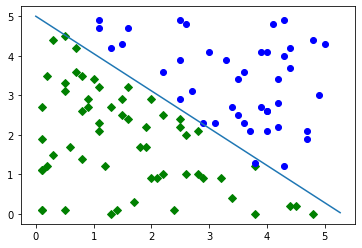

In [25]:
plotData(dataset,coef,intercept)